# This notebook does a full analysis of the 2-point data, comparing the effects of varying the minimum time and maximum time of the data and number of data samples

### It also compares what the results would look like with a the main file's (a12m310_a_avg.h5) 2-point function and that of the Feynman-Hellman file (a12m310_a_fh.h5)

### It uses the old set of priors used for fitting multiple data samples, as opposed to Jinchen's priorset which is used for 2point_final, for comparison's sake

In [16]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import gvar as gv

In [17]:
import h5data_methods as h5_dm
import h5py
import lsqfit

In [18]:
# Constants

#Physical constants
hbarc = 197.3 # MeV fm
#a = 0.12

# Pion mass
mpi = 0.1885

# Plot constants
t_min_plt = 1
t_max_plt = 25

In [19]:
# This function's job is to add up the dE parameters in the input-parameters to the fit-functions into useable energies 
def Ei(n_selec, p):
    Ea = p['E0']
    for l in range(1, n_selec+1):
        Ea += p['dE{}'.format(l)]
        
    #print(Ea)
    return Ea

In [20]:
num_zs = 1 #Order number of the n's
# Log E: log of the energy.  
# P is point (in the context of )

# Define the 2-point fit function, for P-S and P-P
def C_2pt(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_pp = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.transpose(np.array([[sum_pp], [sum_ps]]), axes=[2,0,1])

## First, get all of the data, calculate effective mass and effective z-value, and do a comparison of the two data-sets

In [21]:
# Get the data, first the primary data-set
file = h5py.File("a12m310_a_avg.h5", "r")

data_original = gv.BufferDict()
data_original['proton_dn_pp'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton']['px0_py0_pz0']['spin_dn'])
data_original['proton_up_pp'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton']['px0_py0_pz0']['spin_up'])
data_original['proton_dn_np'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton_np']['px0_py0_pz0']['spin_dn'])
data_original['proton_up_np'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton_np']['px0_py0_pz0']['spin_up'])

data_original['proton'] = (data_original['proton_dn_pp'] + data_original['proton_up_pp'] + data_original['proton_dn_np'] + data_original['proton_up_np'])/4.

# Now, get the Feynman-Hellman dataset
file_fh = h5py.File("a12m310_a_fh.h5", "r")
data_fh = gv.BufferDict()
data_fh['proton_ss'] = np.array(file_fh['proton_ss'])/4.
data_fh['proton_ps'] = np.array(file_fh['proton_ps'])/4.
data_fh['proton'] = np.transpose(np.array([[data_fh['proton_ss']], [data_fh['proton_ps']]]), axes=[2,3,0,1])

# Average out both
avg_data_original = gv.BufferDict()
avg_data_original = gv.dataset.avg_data(data_original)
avg_data_fh = gv.BufferDict()
avg_data_fh = gv.dataset.avg_data(data_fh)

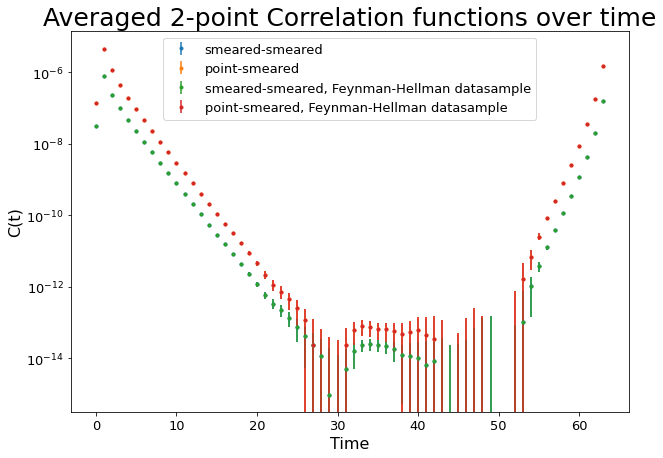

In [22]:
# Plot Correlation functions
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.semilogy()
ax.errorbar([i for i in range(len(avg_data_original['proton']))], [avg_data_original['proton'][i][0][0].mean for i in range(len(avg_data_original['proton']))], yerr=[avg_data_original['proton'][i][0][0].sdev for i in range(len(avg_data_original['proton']))], fmt='.', label="smeared-smeared")
ax.errorbar([i for i in range(len(avg_data_original['proton']))], [avg_data_original['proton'][i][1][0].mean for i in range(len(avg_data_original['proton']))], yerr=[avg_data_original['proton'][i][1][0].sdev for i in range(len(avg_data_original['proton']))], fmt='.', label="point-smeared")

ax.errorbar([i for i in range(len(avg_data_fh['proton']))], [avg_data_fh['proton'][i][0][0].mean for i in range(len(avg_data_fh['proton']))], yerr=[avg_data_fh['proton'][i][0][0].sdev for i in range(len(avg_data_fh['proton']))], fmt='.', label="smeared-smeared, Feynman-Hellman datasample")
ax.errorbar([i for i in range(len(avg_data_fh['proton']))], [avg_data_fh['proton'][i][1][0].mean for i in range(len(avg_data_fh['proton']))], yerr=[avg_data_fh['proton'][i][1][0].sdev for i in range(len(avg_data_fh['proton']))], fmt='.', label="point-smeared, Feynman-Hellman datasample")

plt.xlabel("Time", fontsize=16)
plt.ylabel("C(t)", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.title("Averaged 2-point Correlation functions over time", fontsize=25)
plt.legend(fontsize=13)
plt.show()

In [23]:
tau = 1
# Effective mass data (same annihilation, different annihilation)
eff_mass = [[np.log(avg_data_original['proton'][t][0][0]/avg_data_original['proton'][t+tau][0][0])/tau for t in range(len(avg_data_original['proton'])-tau)],\
            [np.log(avg_data_original['proton'][t][1][0]/avg_data_original['proton'][t+tau][1][0])/tau for t in range(len(avg_data_original['proton'])-tau)]]

avg_data_original['eff_mass'] = np.array([np.log(avg_data_original['proton'][t]/avg_data_original['proton'][t+tau])/tau for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['eff_mass'] = np.array([np.log(avg_data_fh['proton'][t]/avg_data_fh['proton'][t+tau])/tau for t in range(len(avg_data_fh['proton'])-tau)])

#zS_eff = np.array([np.sqrt(np.exp(eff_mass[0][t]*t)*avg_data_original['proton'][t][0][0]) for t in range(len(avg_data_original['proton'])-tau)])
avg_data_original['zs_eff'] = np.array([np.sqrt(np.exp(avg_data_original['eff_mass'][t][0][0]*t)*avg_data_original['proton'][t][0][0]) for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['zs_eff'] = np.array([np.sqrt(np.exp(avg_data_fh['eff_mass'][t][0][0]*t)*avg_data_fh['proton'][t][0][0]) for t in range(len(avg_data_fh['proton'])-tau)])

#zP_eff = np.array([np.exp(eff_mass[1][t]*t)*avg_data_original['proton'][t][1][0]/zS_eff[t] for t in range(len(avg_data_original['proton'])-tau)])
avg_data_original['zp_eff'] = np.array([np.exp(avg_data_original['eff_mass'][t][1][0]*t)*avg_data_original['proton'][t][1][0]/avg_data_original['zs_eff'][t] for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['zp_eff'] = np.array([np.exp(avg_data_fh['eff_mass'][t][1][0]*t)*avg_data_fh['proton'][t][1][0]/avg_data_fh['zs_eff'][t] for t in range(len(avg_data_fh['proton'])-tau)])

#log_eff_mass = np.log(eff_mass)

<ipython-input-23-5c46469d3407>:3: RuntimeWarning: invalid value encountered in log
  eff_mass = [[np.log(avg_data_original['proton'][t][0][0]/avg_data_original['proton'][t+tau][0][0])/tau for t in range(len(avg_data_original['proton'])-tau)],\
<ipython-input-23-5c46469d3407>:4: RuntimeWarning: invalid value encountered in log
  [np.log(avg_data_original['proton'][t][1][0]/avg_data_original['proton'][t+tau][1][0])/tau for t in range(len(avg_data_original['proton'])-tau)]]
<ipython-input-23-5c46469d3407>:6: RuntimeWarning: invalid value encountered in log
  avg_data_original['eff_mass'] = np.array([np.log(avg_data_original['proton'][t]/avg_data_original['proton'][t+tau])/tau for t in range(len(avg_data_original['proton'])-tau)])
<ipython-input-23-5c46469d3407>:7: RuntimeWarning: invalid value encountered in log
  avg_data_fh['eff_mass'] = np.array([np.log(avg_data_fh['proton'][t]/avg_data_fh['proton'][t+tau])/tau for t in range(len(avg_data_fh['proton'])-tau)])
<ipython-input-23-5c46469

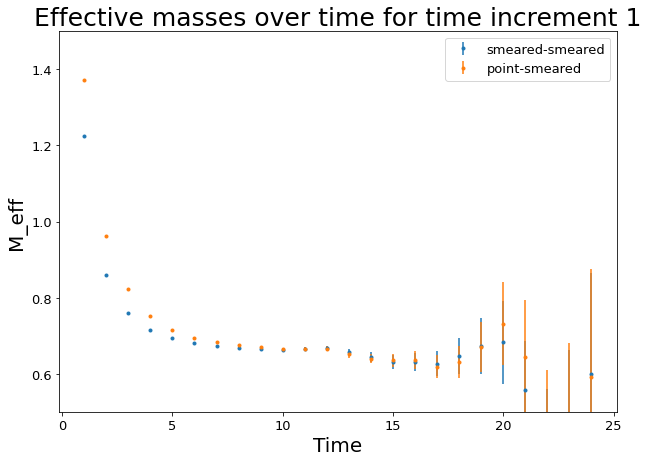

In [24]:
# Plot the effective masses
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['eff_mass'][i][0][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_original['eff_mass'][i][0][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="smeared-smeared")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['eff_mass'][i][1][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_original['eff_mass'][i][1][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="point-smeared")

#ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['eff_mass'][i][0][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_fh['eff_mass'][i][0][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="smeared-smeared, FH")
#ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['eff_mass'][i][1][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_fh['eff_mass'][i][1][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="point-smeared, FH")

plt.xlabel("Time", fontsize=20)
plt.ylabel("M_eff", fontsize=20)
plt.ylim(0.5, 1.5)
#plt.yticks(np.arange(0.6,0.8, 0.02))
plt.title("Effective masses over time for time increment {}".format(tau), fontsize=25)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=13)
plt.show()
fig.savefig('meff_raw.png')


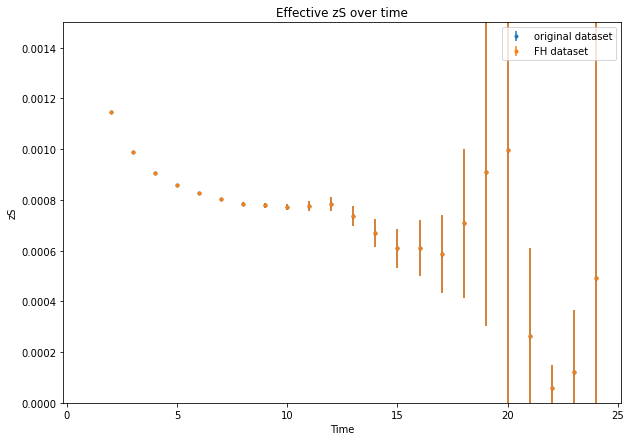

In [25]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zs_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zs_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="original dataset")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zs_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zs_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="FH dataset")

plt.xlabel("Time")
plt.ylabel("zS")
plt.title("Effective zS over time")
plt.ylim([0, 0.0015])
plt.legend()
plt.show()

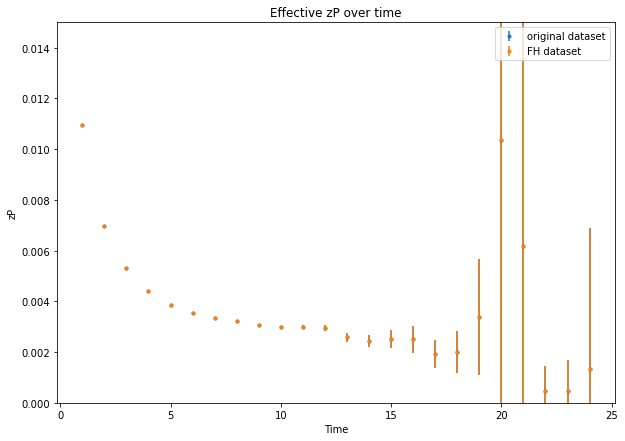

In [26]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes()

ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zp_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zp_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="original dataset")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zp_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zp_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="FH dataset")

plt.xlabel("Time")
plt.ylabel("zP")
plt.title("Effective zP over time")
plt.ylim(0, 0.015)
plt.legend()
plt.show()

Looks like the Feynman-Hellman and the original datafile do indeed have the same data

## Set the priors for all sampled energy spacing and widths
### Then test the fits

In [27]:
# Define a-values, where a is such that the energy-increment at the nth excited state is 2*mpi/n^a
# Define b-values, where b is the error-bar of log(dE)

num_fitsamples = np.arange(1,9,1)
a = np.linspace(0,2,11)
a_select_indices = np.array([0, 5, 10])
b = np.linspace(0.3,1.3,6)


In [34]:
# Find up to 9 excited priors for each pair of a,b

num_zs = 10


p=gv.BufferDict()
p['E0'] = gv.gvar(0.67, 0.02)
p['Z0'] = gv.gvar(0.0008, 0.0003)
p['Ztilde0'] = gv.gvar(0.003, 0.003)
#e_decay_exp = 0

# Define some constants for prioring the higher-order energies
dE0 = 2*mpi
#b = 0.7

# Use constant dE to prior the energies
dE0 = 2*mpi
energyvals = np.array([[None]*num_zs]*len(a))
dEvals = np.array([[None]*(num_zs - 1)]*len(a))

#E0_errbar = 0.8
for i in range(len(a)):
    energyvals[i][0] = 0.67
    for k in range(1, num_zs):
        dEvals[i][k-1] = dE0/np.power(k, a[i])
        energyvals[i][k] = energyvals[i][k-1] + dEvals[i][k-1]
        

priors = []
p_adj = gv.BufferDict()
for i in range(len(a)):
    priors.append([])
    
    for j in range(len(b)):
        #print("i = ", i, " j = ", j)
        priors[i].append(gv.BufferDict())
        #print(a[i])
        #priors[i][j] = h5_dm.prior(num_zs, 2, b[j], a[i]) # Use the h5data_methods 
        
        priors[i][j]['E0'] = gv.gvar(0.67, 0.02)
        priors[i][j]['Z0'] = gv.gvar(0.0008, 0.0003)
        priors[i][j]['Ztilde0'] = gv.gvar(0.003, 0.003)
        
        for n in range(1, num_zs):
            priors[i][j]['log(dE{})'.format(n)] = gv.gvar(np.log(dEvals[i][n-1]), b[j])
            priors[i][j]['Z{}'.format(n)] = gv.gvar(0.0012, 0.0006)
            priors[i][j]['Ztilde{}'.format(n)] = gv.gvar(0, 0.01)


            

In [35]:
priors[5]

[BufferDict([('E0', 0.670(20)), ('Z0', 0.00080(30)), ('Ztilde0', 0.0030(30)), ('log(dE1)', -0.98(30)), ('Z1', 0.00120(60)), ('Ztilde1', 0.000(10)), ('log(dE2)', -1.67(30)), ('Z2', 0.00120(60)), ('Ztilde2', 0.000(10)), ('log(dE3)', -2.07(30)), ('Z3', 0.00120(60)), ('Ztilde3', 0.000(10)), ('log(dE4)', -2.36(30)), ('Z4', 0.00120(60)), ('Ztilde4', 0.000(10)), ('log(dE5)', -2.58(30)), ('Z5', 0.00120(60)), ('Ztilde5', 0.000(10)), ('log(dE6)', -2.77(30)), ('Z6', 0.00120(60)), ('Ztilde6', 0.000(10)), ('log(dE7)', -2.92(30)), ('Z7', 0.00120(60)), ('Ztilde7', 0.000(10)), ('log(dE8)', -3.05(30)), ('Z8', 0.00120(60)), ('Ztilde8', 0.000(10)), ('log(dE9)', -3.17(30)), ('Z9', 0.00120(60)), ('Ztilde9', 0.000(10))]),
 BufferDict([('E0', 0.670(20)), ('Z0', 0.00080(30)), ('Ztilde0', 0.0030(30)), ('log(dE1)', -0.98(50)), ('Z1', 0.00120(60)), ('Ztilde1', 0.000(10)), ('log(dE2)', -1.67(50)), ('Z2', 0.00120(60)), ('Ztilde2', 0.000(10)), ('log(dE3)', -2.07(50)), ('Z3', 0.00120(60)), ('Ztilde3', 0.000(10)), ('

In [36]:
num_zs = 9
aa = 1
bb = 3
fit_check = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 22)]), np.array([avg_data_original['proton'][l] for l in range(2,22)])), prior=priors[a_select_indices[aa]][bb],fcn=C_2pt,debug=True)

print("a = ", a[a_select_indices[aa]], "; b = ", b[bb])
print("Q= ", fit_check.Q)
print(fit_check.format(pstyle='vv'))

a =  1.0 ; b =  0.9000000000000001
Q=  0.25305565900301275
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.25    logGBF = 985.82

Parameters:
             E0        0.65937 +- 0.00388055             [           0.67 +- 0.02 ]  
             Z0    0.00074974 +- 1.61869e-05             [       0.0008 +- 0.0003 ]  
        Ztilde0    0.00283297 +- 7.04946e-05             [         0.003 +- 0.003 ]  
       log(dE1)        -0.880366 +- 0.229152             [        -0.97551 +- 0.9 ]  
             Z1   0.000642079 +- 0.000123525             [       0.0012 +- 0.0006 ]  
        Ztilde1      0.00403152 +- 0.0012503             [              0 +- 0.01 ]  
       log(dE2)        -0.745433 +- 0.571821             [        -1.66866 +- 0.9 ]  *
             Z2   0.000536842 +- 0.000456497             [       0.0012 +- 0.0006 ]  *
        Ztilde2     0.00589954 +- 0.00382956             [              0 +- 0.01 ]  
       log(dE3)         -1.14296 +- 0.770329             [        -2.07412 

### Now, plot fit quality and E0 over tmin and number of excited states used

In [37]:
tmin = np.arange(1,10,1)

list_LogGBF_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

list_LogGBF_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

list_LogGBF_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

In [38]:
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmin)):
            num_zs = j + np.min(num_fitsamples) + 1
            fit_a0 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 13)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],13)])), prior=priors[a_select_indices[0]][i],fcn=C_2pt,debug=True)
            fit_a1 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 13)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],13)])), prior=priors[a_select_indices[1]][i],fcn=C_2pt,debug=True)
            fit_a2 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 13)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],13)])), prior=priors[a_select_indices[2]][i],fcn=C_2pt,debug=True)
            
            print("\ni = ", i, " j = ", j, " k = ", k, "\n")
            
            list_LogGBF_a0[i][j][k] = fit_a0.logGBF
            list_Q_a0[i][j][k] = fit_a0.Q
            list_E0_a0[i][j][k] = fit_a0.p['E0']
            
            print("Fit for a = ", a[a_select_indices[0]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a0[i][j][k])
            print("list Q: ", list_Q_a0[i][j][k])
            print("list E0: ", list_E0_a0[i][j][k])
            print(fit_a0.format(pstyle='vv'))
            
            list_LogGBF_a1[i][j][k] = fit_a1.logGBF
            list_Q_a1[i][j][k] = fit_a1.Q
            list_E0_a1[i][j][k] = fit_a1.p['E0']
            
            print("Fit for a = ", a[a_select_indices[1]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a1[i][j][k])
            print("list Q: ", list_Q_a1[i][j][k])
            print("list E0: ", list_E0_a1[i][j][k])
            print(fit_a1.format(pstyle='vv'))
            
            list_LogGBF_a2[i][j][k] = fit_a2.logGBF
            list_Q_a2[i][j][k] = fit_a2.Q
            list_E0_a2[i][j][k] = fit_a2.p['E0']
            
            print("Fit for a = ", a[a_select_indices[2]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a2[i][j][k])
            print("list Q: ", list_Q_a2[i][j][k])
            print("list E0: ", list_E0_a2[i][j][k])
            print(fit_a2.format(pstyle='vv'))
            #print(list_LogGBF_a0)
            #a = 0, b = 0.7, k = 5 fit


i =  0  j =  0  k =  0 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  1
list logGBF:  -2959.7377147731054
list Q:  0.0
list E0:  0.69177(90)
Least Square Fit:
  chi2/dof [dof] = 2.9e+02 [24]    Q = 0    logGBF = -2959.7

Parameters:
             E0       0.691769 +- 0.000903906             [     0.67 +- 0.02 ]  *
             Z0   -0.000821634 +- 1.95683e-06             [ 0.0008 +- 0.0003 ]  *****
        Ztilde0    -0.00328368 +- 1.01551e-05             [   0.003 +- 0.003 ]  **
       log(dE1)        0.518499 +- 0.00223913             [  -0.97551 +- 0.3 ]  ****
             Z1     0.00204883 +- 2.62305e-06             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0133834 +- 1.87842e-05             [        0 +- 0.01 ]  *
       log(dE2)               -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2              0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                     0 +- 0.01             [        0 +- 0.01 ]  
       log



i =  0  j =  0  k =  1 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  2
list logGBF:  244.1896919584023
list Q:  1.4551361579300357e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 1.5e-96    logGBF = 244.19

Parameters:
             E0       0.667571 +- 0.00108054             [     0.67 +- 0.02 ]  
             Z0   0.000785781 +- 2.52279e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303839 +- 1.21836e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127736 +- 0.00679035             [  -0.97551 +- 0.3 ]  **
             Z1    0.00125262 +- 3.76442e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918171 +- 4.28732e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3


i =  0  j =  0  k =  2 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  3
list logGBF:  421.00877031761394
list Q:  1.9584938405224662e-10
list E0:  0.6633(14)
Least Square Fit:
  chi2/dof [dof] = 4.4 [20]    Q = 2e-10    logGBF = 421.01

Parameters:
             E0       0.663274 +- 0.00138812             [     0.67 +- 0.02 ]  
             Z0   0.000769598 +- 3.65816e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00294388 +- 1.7232e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.378598 +- 0.0143331             [  -0.97551 +- 0.3 ]  *
             Z1     0.0010366 +- 8.04335e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00737297 +- 8.80417e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  0  j =  0  k =  4 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  5
list logGBF:  369.49268979177265
list Q:  0.3422237461818803
list E0:  0.6604(24)
Least Square Fit:
  chi2/dof [dof] = 1.1 [16]    Q = 0.34    logGBF = 369.49

Parameters:
             E0       0.660415 +- 0.00242113             [     0.67 +- 0.02 ]  
             Z0   0.000755722 +- 8.24499e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286056 +- 3.71473e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.694766 +- 0.0567231             [  -0.97551 +- 0.3 ]  
             Z1   0.000789944 +- 2.86871e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00532278 +- 0.000284231             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  0  k =  6 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  7
list logGBF:  280.40346662230445
list Q:  0.4911616442709049
list E0:  0.6577(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [12]    Q = 0.49    logGBF = 280.4

Parameters:
             E0       0.657727 +- 0.00436223             [     0.67 +- 0.02 ]  
             Z0   0.000742072 +- 1.83301e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279298 +- 7.92893e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.955265 +- 0.175333             [  -0.97551 +- 0.3 ]  
             Z1   0.000649763 +- 8.17982e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00405088 +- 0.00065512             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  0  k =  8 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  9
list logGBF:  188.1723218720638
list Q:  0.8956028533895927
list E0:  0.6592(61)
Least Square Fit:
  chi2/dof [dof] = 0.44 [8]    Q = 0.9    logGBF = 188.17

Parameters:
             E0        0.659243 +- 0.0060931             [     0.67 +- 0.02 ]  
             Z0   0.000749119 +- 2.69763e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282817 +- 0.000107346             [   0.003 +- 0.003 ]  
       log(dE1)        -0.814956 +- 0.263014             [  -0.97551 +- 0.3 ]  
             Z1   0.000782708 +- 0.000316332             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00460732 +- 0.00183474             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)         


i =  0  j =  1  k =  0 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  1
list logGBF:  458.36512377112655
list Q:  1.23627011333989e-19
list E0:  0.6684(12)
Least Square Fit:
  chi2/dof [dof] = 6.1 [24]    Q = 1.2e-19    logGBF = 458.37

Parameters:
             E0       0.668361 +- 0.00119953             [     0.67 +- 0.02 ]  
             Z0   0.000784698 +- 2.93801e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40565e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.357679 +- 0.0134951             [  -0.97551 +- 0.3 ]  **
             Z1   0.000998673 +- 1.18824e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00750551 +- 8.26719e-05             [        0 +- 0.01 ]  
       log(dE2)         0.62603 +- 0.0172416             [  -0.97551 +- 0.3 ]  *****
             Z2    0.00243648 +- 2.73025e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2     0.0153464 +- 0.000162693             [        0 +- 0.01 ]  *
       


i =  0  j =  1  k =  1 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  2
list logGBF:  483.77122292486666
list Q:  0.21861294705314102
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.2 [22]    Q = 0.22    logGBF = 483.77

Parameters:
             E0       0.661433 +- 0.00188415             [     0.67 +- 0.02 ]  
             Z0   0.000758659 +- 5.99084e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286901 +- 2.86229e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.767362 +- 0.0658265             [  -0.97551 +- 0.3 ]  
             Z1   0.000702192 +- 4.17304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00480944 +- 0.000311085             [        0 +- 0.01 ]  
       log(dE2)       -0.116687 +- 0.0506311             [  -0.97551 +- 0.3 ]  **
             Z2     0.00132476 +- 2.0365e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00982877 +- 0.000210856             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  1  k =  2 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  3
list logGBF:  449.4666934790337
list Q:  0.48532222296755634
list E0:  0.6620(27)
Least Square Fit:
  chi2/dof [dof] = 0.98 [20]    Q = 0.49    logGBF = 449.47

Parameters:
             E0       0.661993 +- 0.00268152             [     0.67 +- 0.02 ]  
             Z0   0.000759677 +- 9.81584e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286754 +- 4.48192e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.941133 +- 0.172023             [  -0.97551 +- 0.3 ]  
             Z1   0.000545153 +- 0.000106907             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00375676 +- 0.000741451             [        0 +- 0.01 ]  
       log(dE2)        -0.481879 +- 0.119132             [  -0.97551 +- 0.3 ]  *
             Z2    0.00110937 +- 3.82662e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0079624 +- 0.000397516             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  1  k =  3 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  4
list logGBF:  410.2791834834145
list Q:  0.5717043348270431
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.91 [18]    Q = 0.57    logGBF = 410.28

Parameters:
             E0       0.659918 +- 0.00369923             [     0.67 +- 0.02 ]  
             Z0   0.000750685 +- 1.53407e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283062 +- 6.74026e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05631 +- 0.260111             [  -0.97551 +- 0.3 ]  
             Z1   0.000510352 +- 0.000137157             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00320743 +- 0.000979838             [        0 +- 0.01 ]  
       log(dE2)        -0.653796 +- 0.206134             [  -0.97551 +- 0.3 ]  *
             Z2   0.000946829 +- 8.10341e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00721726 +- 0.000826936             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  1  k =  4 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  5
list logGBF:  367.9775597179556
list Q:  0.47804610319634044
list E0:  0.6599(42)
Least Square Fit:
  chi2/dof [dof] = 0.98 [16]    Q = 0.48    logGBF = 367.98

Parameters:
             E0       0.659879 +- 0.00419216             [     0.67 +- 0.02 ]  
             Z0   0.000751165 +- 1.75345e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283331 +- 7.37778e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02267 +- 0.267717             [  -0.97551 +- 0.3 ]  
             Z1   0.000513942 +- 0.000165119             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327322 +- 0.00114908             [        0 +- 0.01 ]  
       log(dE2)        -0.826069 +- 0.282675             [  -0.97551 +- 0.3 ]  
             Z2    0.00083465 +- 0.000186721             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00610783 +- 0.00121349             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  1  k =  5 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  6
list logGBF:  326.0529201229445
list Q:  0.6567932170786797
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 326.05

Parameters:
             E0       0.660698 +- 0.00396363             [     0.67 +- 0.02 ]  
             Z0   0.000756311 +- 1.61559e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284887 +- 6.79923e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.867901 +- 0.228032             [  -0.97551 +- 0.3 ]  
             Z1   0.000559714 +- 0.000207824             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00461613 +- 0.00170941             [        0 +- 0.01 ]  
       log(dE2)        -0.938124 +- 0.293871             [  -0.97551 +- 0.3 ]  
             Z2   0.000915395 +- 0.000393538             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00225994 +- 0.00420564             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  1  k =  6 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  7
list logGBF:  281.1574731600123
list Q:  0.6713876475014366
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 0.78 [12]    Q = 0.67    logGBF = 281.16

Parameters:
             E0       0.660615 +- 0.00360001             [     0.67 +- 0.02 ]  
             Z0   0.000756938 +- 1.40068e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284872 +- 5.91868e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.757708 +- 0.185892             [  -0.97551 +- 0.3 ]  
             Z1   0.000613376 +- 0.000218682             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00644876 +- 0.00267618             [        0 +- 0.01 ]  
       log(dE2)        -0.936049 +- 0.287768             [  -0.97551 +- 0.3 ]  
             Z2    0.00128165 +- 0.000533023             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00239899 +- 0.00771893             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  1  k =  7 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  8
list logGBF:  236.482010558191
list Q:  0.7787704200761217
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.64 [10]    Q = 0.78    logGBF = 236.48

Parameters:
             E0        0.662292 +- 0.0038278             [     0.67 +- 0.02 ]  
             Z0   0.000764571 +- 1.49439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288432 +- 6.25667e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.663784 +- 0.215905             [  -0.97551 +- 0.3 ]  *
             Z1    0.00061793 +- 0.000289008             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00681059 +- 0.00323064             [        0 +- 0.01 ]  
       log(dE2)        -0.942854 +- 0.298368             [  -0.97551 +- 0.3 ]  
             Z2     0.0010313 +- 0.000592248             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00438051 +- 0.00934905             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  2  k =  0 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  1
list logGBF:  489.83616251134515
list Q:  9.335829185352991e-07
list E0:  0.6576(32)
Least Square Fit:
  chi2/dof [dof] = 3 [24]    Q = 9.3e-07    logGBF = 489.84

Parameters:
             E0         0.657576 +- 0.0031825             [     0.67 +- 0.02 ]  
             Z0    0.000741995 +- 1.31533e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279649 +- 6.01895e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.983378 +- 0.171539             [  -0.97551 +- 0.3 ]  
             Z1   -0.000606289 +- 6.64535e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1    -0.00370929 +- 0.000608638             [        0 +- 0.01 ]  
       log(dE2)         -0.42336 +- 0.0766885             [  -0.97551 +- 0.3 ]  *
             Z2      0.00103372 +- 5.0389e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00824443 +- 0.000278559             [        0 +- 0.01 ]  
     


i =  0  j =  2  k =  1 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  2
list logGBF:  484.9437119644642
list Q:  0.5205045467740295
list E0:  0.6610(29)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 484.94

Parameters:
             E0       0.660953 +- 0.00290064             [     0.67 +- 0.02 ]  
             Z0   0.000756614 +- 1.07877e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285955 +- 4.8002e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.808804 +- 0.113505             [  -0.97551 +- 0.3 ]  
             Z1   0.000670161 +- 6.60379e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00451688 +- 0.000603627             [        0 +- 0.01 ]  
       log(dE2)          -0.68369 +- 0.25235             [  -0.97551 +- 0.3 ]  
             Z2   0.000519645 +- 0.000369984             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00401458 +- 0.00263923             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  2  k =  2 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  3
list logGBF:  449.2326989624747
list Q:  0.6612281078278441
list E0:  0.6594(42)
Least Square Fit:
  chi2/dof [dof] = 0.84 [20]    Q = 0.66    logGBF = 449.23

Parameters:
             E0         0.6594 +- 0.00418314             [     0.67 +- 0.02 ]  
             Z0    0.00074829 +- 1.81023e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282132 +- 7.7769e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03144 +- 0.239765             [  -0.97551 +- 0.3 ]  
             Z1   0.000552172 +- 0.000103796             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00335766 +- 0.000871294             [        0 +- 0.01 ]  
       log(dE2)        -0.774463 +- 0.265086             [  -0.97551 +- 0.3 ]  
             Z2   0.000574614 +- 0.000341639             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.00585449 +- 0.0020271             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  2  k =  3 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  4
list logGBF:  409.80956230899346
list Q:  0.6025533179915675
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.6    logGBF = 409.81

Parameters:
             E0       0.659483 +- 0.00409738             [     0.67 +- 0.02 ]  
             Z0   0.000749159 +- 1.75004e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282214 +- 7.46596e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03095 +- 0.254194             [  -0.97551 +- 0.3 ]  
             Z1    0.000530749 +- 0.00014149             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0034154 +- 0.00108523             [        0 +- 0.01 ]  
       log(dE2)        -0.928921 +- 0.287173             [  -0.97551 +- 0.3 ]  
             Z2    0.00060498 +- 0.000343742             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00368729 +- 0.00301578             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  2  k =  4 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  5
list logGBF:  367.6315694376077
list Q:  0.4759714180325074
list E0:  0.6595(44)
Least Square Fit:
  chi2/dof [dof] = 0.98 [16]    Q = 0.48    logGBF = 367.63

Parameters:
             E0       0.659451 +- 0.00439596             [     0.67 +- 0.02 ]  
             Z0   0.000748767 +- 1.88219e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028183 +- 8.0021e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04855 +- 0.24471             [  -0.97551 +- 0.3 ]  
             Z1   0.000524761 +- 0.000138618             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344892 +- 0.00102646             [        0 +- 0.01 ]  
       log(dE2)          -0.9452 +- 0.288844             [  -0.97551 +- 0.3 ]  
             Z2   0.000568914 +- 0.000362246             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00239838 +- 0.00442063             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  2  k =  5 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  6
list logGBF:  325.985446295306
list Q:  0.6263509215376841
list E0:  0.6610(39)
Least Square Fit:
  chi2/dof [dof] = 0.84 [14]    Q = 0.63    logGBF = 325.99

Parameters:
             E0       0.661046 +- 0.00385467             [     0.67 +- 0.02 ]  
             Z0   0.000757775 +- 1.56053e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285527 +- 6.57441e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.859548 +- 0.226918             [  -0.97551 +- 0.3 ]  
             Z1    0.000559785 +- 0.00020045             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00462448 +- 0.00174333             [        0 +- 0.01 ]  
       log(dE2)        -0.909216 +- 0.289418             [  -0.97551 +- 0.3 ]  
             Z2   0.000859351 +- 0.000437981             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00243673 +- 0.00509219             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  2  k =  6 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  7
list logGBF:  281.25854080802293
list Q:  0.6832812654840124
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.68    logGBF = 281.26

Parameters:
             E0       0.660736 +- 0.00357541             [     0.67 +- 0.02 ]  
             Z0    0.00075749 +- 1.38762e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285091 +- 5.84606e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.758365 +- 0.185141             [  -0.97551 +- 0.3 ]  
             Z1   0.000603022 +- 0.000223013             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642982 +- 0.00268429             [        0 +- 0.01 ]  
       log(dE2)        -0.939916 +- 0.286244             [  -0.97551 +- 0.3 ]  
             Z2     0.00124604 +- 0.00053919             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00192744 +- 0.00778793             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  2  k =  7 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  8
list logGBF:  236.47242598811397
list Q:  0.7723920580902406
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0        0.662329 +- 0.0037929             [     0.67 +- 0.02 ]  
             Z0    0.00076477 +- 1.47535e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288525 +- 6.18133e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.652501 +- 0.2111             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626152 +- 0.000291046             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00701978 +- 0.00324901             [        0 +- 0.01 ]  
       log(dE2)        -0.933106 +- 0.298254             [  -0.97551 +- 0.3 ]  
             Z2    0.00103511 +- 0.000592878             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0041121 +- 0.00942969             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  0 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  1
list logGBF:  -2191.319333842516
list Q:  0.0
list E0:  0.6799(16)
Least Square Fit:
  chi2/dof [dof] = 2.3e+02 [24]    Q = 0    logGBF = -2191.3

Parameters:
             E0        0.679911 +- 0.00157528             [     0.67 +- 0.02 ]  
             Z0    0.000829724 +- 4.85965e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00314022 +- 2.20222e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.972942 +- 0.182371             [  -0.97551 +- 0.3 ]  
             Z1    0.000112666 +- 8.55345e-05             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00934383 +- 0.00576902             [        0 +- 0.01 ]  
       log(dE2)          -0.972918 +- 0.25161             [  -0.97551 +- 0.3 ]  
             Z2    2.50215e-05 +- 0.000214388             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.00617235 +- 0.00997462             [        0 +- 0.01 ]  
       log(dE3)         


i =  0  j =  3  k =  1 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  2
list logGBF:  484.87777102198504
list Q:  0.6526226564560871
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.88

Parameters:
             E0       0.659637 +- 0.00392247             [     0.67 +- 0.02 ]  
             Z0    0.000750176 +- 1.6551e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 7.07655e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.964168 +- 0.229502             [  -0.97551 +- 0.3 ]  
             Z1   0.000576895 +- 0.000109665             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0035672 +- 0.00105229             [        0 +- 0.01 ]  
       log(dE2)        -0.845547 +- 0.278048             [  -0.97551 +- 0.3 ]  
             Z2   0.000612596 +- 0.000271923             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00593743 +- 0.00219939             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  2 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  3
list logGBF:  448.8958122213454
list Q:  0.6706993977353054
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.84 [20]    Q = 0.67    logGBF = 448.9

Parameters:
             E0       0.658852 +- 0.00424287             [     0.67 +- 0.02 ]  
             Z0   0.000746144 +- 1.82981e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281162 +- 7.84828e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03644 +- 0.236622             [  -0.97551 +- 0.3 ]  
             Z1   0.000554645 +- 0.000111948             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00338508 +- 0.000899341             [        0 +- 0.01 ]  
       log(dE2)        -0.881416 +- 0.281391             [  -0.97551 +- 0.3 ]  
             Z2   0.000549627 +- 0.000313436             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00422451 +- 0.00298433             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  3  k =  3 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  4
list logGBF:  409.4672497326563
list Q:  0.5488754732499554
list E0:  0.6589(43)
Least Square Fit:
  chi2/dof [dof] = 0.92 [18]    Q = 0.55    logGBF = 409.47

Parameters:
             E0        0.65892 +- 0.00426375             [     0.67 +- 0.02 ]  
             Z0   0.000746628 +- 1.84675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281297 +- 7.88528e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02654 +- 0.250166             [  -0.97551 +- 0.3 ]  
             Z1    0.000555486 +- 0.00012736             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0034472 +- 0.00103442             [        0 +- 0.01 ]  
       log(dE2)        -0.903834 +- 0.288016             [  -0.97551 +- 0.3 ]  
             Z2   0.000555236 +- 0.000356526             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.0038288 +- 0.00319097             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  4 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  5
list logGBF:  367.4644297117719
list Q:  0.4332600456640804
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.43    logGBF = 367.46

Parameters:
             E0       0.659442 +- 0.00440982             [     0.67 +- 0.02 ]  
             Z0   0.000748627 +- 1.89767e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281871 +- 8.07718e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04219 +- 0.246046             [  -0.97551 +- 0.3 ]  
             Z1   0.000535158 +- 0.000130788             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344821 +- 0.00101349             [        0 +- 0.01 ]  
       log(dE2)        -0.909794 +- 0.286132             [  -0.97551 +- 0.3 ]  
             Z2   0.000546323 +- 0.000379047             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00281645 +- 0.00437923             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  3  k =  5 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  6
list logGBF:  325.97264004200383
list Q:  0.6191243391051153
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.85 [14]    Q = 0.62    logGBF = 325.97

Parameters:
             E0       0.661102 +- 0.00383153             [     0.67 +- 0.02 ]  
             Z0   0.000758009 +- 1.54871e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285642 +- 6.52736e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.856273 +- 0.226378             [  -0.97551 +- 0.3 ]  
             Z1   0.000562021 +- 0.000198568             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00463394 +- 0.00175026             [        0 +- 0.01 ]  
       log(dE2)        -0.900844 +- 0.288247             [  -0.97551 +- 0.3 ]  
             Z2    0.00085438 +- 0.000445028             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00247403 +- 0.00518013             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  6 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  7
list logGBF:  281.2706272812601
list Q:  0.6849042403765226
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.68    logGBF = 281.27

Parameters:
             E0       0.660748 +- 0.00357439             [     0.67 +- 0.02 ]  
             Z0   0.000757544 +- 1.38715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285111 +- 5.84183e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.7588 +- 0.185225             [  -0.97551 +- 0.3 ]  
             Z1   0.000601671 +- 0.000223573             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642288 +- 0.00268473             [        0 +- 0.01 ]  
       log(dE2)        -0.940826 +- 0.286078             [  -0.97551 +- 0.3 ]  
             Z2    0.00124194 +- 0.000539707             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00187127 +- 0.00778677             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  3  k =  7 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  8
list logGBF:  236.4716933297504
list Q:  0.7719687872707955
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0        0.662332 +- 0.0037906             [     0.67 +- 0.02 ]  
             Z0   0.000764784 +- 1.47411e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288532 +- 6.17633e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.651747 +- 0.210776             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626756 +- 0.000291147             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00703339 +- 0.00325019             [        0 +- 0.01 ]  
       log(dE2)        -0.932438 +- 0.298246             [  -0.97551 +- 0.3 ]  
             Z2      0.0010354 +- 0.00059292             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00409475 +- 0.00943475             [        0 +- 0.01 ]  
       log(dE3)      


Fit for a =  1.0 , b =  0.3 ,  4  excited states, tmin =  9
list logGBF:  187.9923872738414
list Q:  0.8004822875501342
list E0:  0.6593(53)
Least Square Fit:
  chi2/dof [dof] = 0.57 [8]    Q = 0.8    logGBF = 187.99

Parameters:
             E0       0.659281 +- 0.00533424             [           0.67 +- 0.02 ]  
             Z0   0.000750668 +- 2.23883e-05             [       0.0008 +- 0.0003 ]  
        Ztilde0     0.00283503 +- 9.0633e-05             [         0.003 +- 0.003 ]  
       log(dE1)        -0.694381 +- 0.216181             [        -0.97551 +- 0.3 ]  
             Z1    0.000739709 +- 0.00046749             [       0.0012 +- 0.0006 ]  
        Ztilde1     0.00592197 +- 0.00367879             [              0 +- 0.01 ]  
       log(dE2)         -1.61352 +- 0.296868             [        -1.66866 +- 0.3 ]  
             Z2    0.00101476 +- 0.000582789             [       0.0012 +- 0.0006 ]  
        Ztilde2     0.00371421 +- 0.00906908             [              0 +- 0.01


i =  0  j =  4  k =  1 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  2
list logGBF:  484.34184656138945
list Q:  0.6336593848021328
list E0:  0.6598(40)
Least Square Fit:
  chi2/dof [dof] = 0.87 [22]    Q = 0.63    logGBF = 484.34

Parameters:
             E0       0.659756 +- 0.00396448             [     0.67 +- 0.02 ]  
             Z0   0.000750402 +- 1.68672e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283099 +- 7.19208e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00813 +- 0.254806             [  -0.97551 +- 0.3 ]  
             Z1    0.00054004 +- 0.000127573             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033462 +- 0.00109897             [        0 +- 0.01 ]  
       log(dE2)        -0.888153 +- 0.283163             [  -0.97551 +- 0.3 ]  
             Z2   0.000648826 +- 0.000255757             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00560546 +- 0.00199534             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  4  k =  2 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  3
list logGBF:  448.6826887064655
list Q:  0.652119792302381
list E0:  0.6587(42)
Least Square Fit:
  chi2/dof [dof] = 0.85 [20]    Q = 0.65    logGBF = 448.68

Parameters:
             E0        0.65873 +- 0.00418192             [     0.67 +- 0.02 ]  
             Z0   0.000745833 +- 1.78802e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280996 +- 7.68085e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02929 +- 0.231788             [  -0.97551 +- 0.3 ]  
             Z1   0.000556994 +- 0.000116599             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00343627 +- 0.000916026             [        0 +- 0.01 ]  
       log(dE2)        -0.908712 +- 0.285046             [  -0.97551 +- 0.3 ]  
             Z2   0.000563856 +- 0.000294353             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00378472 +- 0.00306999             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  3 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  4
list logGBF:  409.36938687429415
list Q:  0.5276497274162082
list E0:  0.6587(43)
Least Square Fit:
  chi2/dof [dof] = 0.94 [18]    Q = 0.53    logGBF = 409.37

Parameters:
             E0       0.658707 +- 0.00431672             [     0.67 +- 0.02 ]  
             Z0    0.000745693 +- 1.8759e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280959 +- 8.0155e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02326 +- 0.246103             [  -0.97551 +- 0.3 ]  
             Z1   0.000565386 +- 0.000121133             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00347181 +- 0.00100456             [        0 +- 0.01 ]  
       log(dE2)        -0.887155 +- 0.286733             [  -0.97551 +- 0.3 ]  
             Z2   0.000539878 +- 0.000360789             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00384863 +- 0.00329065             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  4  k =  4 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  5
list logGBF:  367.423735882516
list Q:  0.42102085169763576
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.42    logGBF = 367.42

Parameters:
             E0       0.659448 +- 0.00440927             [     0.67 +- 0.02 ]  
             Z0   0.000748636 +- 1.89933e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281914 +- 8.08742e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03942 +- 0.246657             [  -0.97551 +- 0.3 ]  
             Z1   0.000538193 +- 0.000128893             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344866 +- 0.00101001             [        0 +- 0.01 ]  
       log(dE2)        -0.894625 +- 0.285109             [  -0.97551 +- 0.3 ]  
             Z2   0.000545592 +- 0.000382216             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00299365 +- 0.00434274             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  4  k =  5 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  6
list logGBF:  325.97029325949626
list Q:  0.6179812824301831
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.85 [14]    Q = 0.62    logGBF = 325.97

Parameters:
             E0       0.661109 +- 0.00382812             [     0.67 +- 0.02 ]  
             Z0   0.000758039 +- 1.54696e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285657 +- 6.52059e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.855695 +- 0.226284             [  -0.97551 +- 0.3 ]  
             Z1   0.000562497 +- 0.000198258             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00463598 +- 0.00175132             [        0 +- 0.01 ]  
       log(dE2)        -0.899433 +- 0.288071             [  -0.97551 +- 0.3 ]  
             Z2   0.000854045 +- 0.000446005             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00247709 +- 0.00519255             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  4  k =  6 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  7
list logGBF:  281.27182385716554
list Q:  0.6850785355393427
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.69    logGBF = 281.27

Parameters:
             E0       0.660749 +- 0.00357438             [     0.67 +- 0.02 ]  
             Z0   0.000757548 +- 1.38716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285113 +- 5.84163e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.758862 +- 0.185243             [  -0.97551 +- 0.3 ]  
             Z1    0.00060153 +- 0.000223635             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642196 +- 0.00268476             [        0 +- 0.01 ]  
       log(dE2)        -0.940946 +- 0.286063             [  -0.97551 +- 0.3 ]  
             Z2     0.00124152 +- 0.00053975             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00186534 +- 0.00778631             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  7 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  8
list logGBF:  236.4716491180856
list Q:  0.7719438040702262
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0       0.662332 +- 0.00379046             [     0.67 +- 0.02 ]  
             Z0   0.000764784 +- 1.47403e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288532 +- 6.17603e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.651702 +- 0.210757             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626793 +- 0.000291152             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0070342 +- 0.00325026             [        0 +- 0.01 ]  
       log(dE2)        -0.932398 +- 0.298245             [  -0.97551 +- 0.3 ]  
             Z2    0.00103542 +- 0.000592922             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00409371 +- 0.00943505             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  8 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  9
list logGBF:  188.1563244928206
list Q:  0.879346995630657
list E0:  0.6594(59)
Least Square Fit:
  chi2/dof [dof] = 0.47 [8]    Q = 0.88    logGBF = 188.16

Parameters:
             E0       0.659354 +- 0.00585248             [     0.67 +- 0.02 ]  
             Z0   0.000750051 +- 2.55017e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 0.000102211             [   0.003 +- 0.003 ]  
       log(dE1)        -0.788066 +- 0.251067             [  -0.97551 +- 0.3 ]  
             Z1   0.000767242 +- 0.000352403             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00491862 +- 0.0020648             [        0 +- 0.01 ]  
       log(dE2)        -0.954518 +- 0.298925             [  -0.97551 +- 0.3 ]  
             Z2     0.00114315 +- 0.00059617             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00205904 +- 0.00967498             [        0 +- 0.01 ]  
       log(dE3)        -


i =  0  j =  5  k =  0 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  1
list logGBF:  504.4725014577333
list Q:  0.010707330474125183
list E0:  0.6609(28)
Least Square Fit:
  chi2/dof [dof] = 1.8 [24]    Q = 0.011    logGBF = 504.47

Parameters:
             E0        0.66091 +- 0.00279089             [     0.67 +- 0.02 ]  
             Z0   0.000757307 +- 1.03196e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286431 +- 4.56944e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.831688 +- 0.17176             [  -0.97551 +- 0.3 ]  
             Z1   0.000593542 +- 0.000140812             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00416758 +- 0.00101013             [        0 +- 0.01 ]  
       log(dE2)        -0.838701 +- 0.267332             [  -0.97551 +- 0.3 ]  
             Z2   0.000856677 +- 0.000110284             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00503671 +- 0.00168576             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  5  k =  1 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  2
list logGBF:  483.7473486445095
list Q:  0.5713181444066209
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 0.92 [22]    Q = 0.57    logGBF = 483.75

Parameters:
             E0       0.660029 +- 0.00391357             [     0.67 +- 0.02 ]  
             Z0   0.000751516 +- 1.65721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283483 +- 7.07308e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02013 +- 0.260941             [  -0.97551 +- 0.3 ]  
             Z1   0.000522561 +- 0.000135894             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328664 +- 0.00111188             [        0 +- 0.01 ]  
       log(dE2)        -0.901522 +- 0.284393             [  -0.97551 +- 0.3 ]  
             Z2    0.000670499 +- 0.00024918             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00542198 +- 0.00196219             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  5  k =  2 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  3
list logGBF:  448.59183816489514
list Q:  0.6374780530747797
list E0:  0.6587(41)
Least Square Fit:
  chi2/dof [dof] = 0.86 [20]    Q = 0.64    logGBF = 448.59

Parameters:
             E0       0.658717 +- 0.00412777             [     0.67 +- 0.02 ]  
             Z0   0.000745911 +- 1.75393e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281023 +- 7.54334e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02258 +- 0.227974             [  -0.97551 +- 0.3 ]  
             Z1   0.000558997 +- 0.000118269             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.0034703 +- 0.000919076             [        0 +- 0.01 ]  
       log(dE2)        -0.912734 +- 0.285708             [  -0.97551 +- 0.3 ]  
             Z2    0.00057646 +- 0.000283465             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00368961 +- 0.00304999             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  5  k =  3 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  4
list logGBF:  409.3438700330224
list Q:  0.5219547255464382
list E0:  0.6586(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [18]    Q = 0.52    logGBF = 409.34

Parameters:
             E0       0.658645 +- 0.00433162             [     0.67 +- 0.02 ]  
             Z0   0.000745425 +- 1.88369e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280859 +- 8.05044e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02237 +- 0.244648             [  -0.97551 +- 0.3 ]  
             Z1   0.000568104 +- 0.000119354             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00347949 +- 0.000994737             [        0 +- 0.01 ]  
       log(dE2)         -0.882272 +- 0.28613             [  -0.97551 +- 0.3 ]  
             Z2   0.000535945 +- 0.000361849             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00384529 +- 0.00332178             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  4 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  5
list logGBF:  367.4156389208681
list Q:  0.41862626524461316
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.42    logGBF = 367.42

Parameters:
             E0       0.659449 +- 0.00440887             [     0.67 +- 0.02 ]  
             Z0   0.000748642 +- 1.89946e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281924 +- 8.0886e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03878 +- 0.246778             [  -0.97551 +- 0.3 ]  
             Z1   0.000538795 +- 0.000128565             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344915 +- 0.00100956             [        0 +- 0.01 ]  
       log(dE2)          -0.891636 +- 0.2849             [  -0.97551 +- 0.3 ]  
             Z2   0.000545767 +- 0.000382716             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.00302852 +- 0.0043348             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  5  k =  5 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  6
list logGBF:  325.96994642929513
list Q:  0.6178273151477214
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.85 [14]    Q = 0.62    logGBF = 325.97

Parameters:
             E0       0.661109 +- 0.00382767             [     0.67 +- 0.02 ]  
             Z0   0.000758042 +- 1.54674e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285659 +- 6.51973e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.855613 +- 0.22627             [  -0.97551 +- 0.3 ]  
             Z1   0.000562569 +- 0.000198215             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0046363 +- 0.00175146             [        0 +- 0.01 ]  
       log(dE2)        -0.899237 +- 0.288048             [  -0.97551 +- 0.3 ]  
             Z2   0.000854028 +- 0.000446128             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00247721 +- 0.0051942             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  6 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  7
list logGBF:  281.2719290738903
list Q:  0.6850945671103108
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.69    logGBF = 281.27

Parameters:
             E0       0.660749 +- 0.00357438             [     0.67 +- 0.02 ]  
             Z0   0.000757549 +- 1.38716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285113 +- 5.84163e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.758868 +- 0.185246             [  -0.97551 +- 0.3 ]  
             Z1    0.000601517 +- 0.00022364             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642187 +- 0.00268476             [        0 +- 0.01 ]  
       log(dE2)        -0.940958 +- 0.286062             [  -0.97551 +- 0.3 ]  
             Z2    0.00124148 +- 0.000539753             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00186479 +- 0.00778625             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  5  k =  7 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  8
list logGBF:  236.47164665860006
list Q:  0.7719424231616305
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0       0.662332 +- 0.00379045             [     0.67 +- 0.02 ]  
             Z0   0.000764785 +- 1.47403e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288532 +- 6.17601e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.651699 +- 0.210756             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626796 +- 0.000291153             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00703424 +- 0.00325027             [        0 +- 0.01 ]  
       log(dE2)        -0.932396 +- 0.298245             [  -0.97551 +- 0.3 ]  
             Z2    0.00103542 +- 0.000592922             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00409365 +- 0.00943507             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  8 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  9
list logGBF:  188.15632449388679
list Q:  0.8793469206087654
list E0:  0.6594(59)
Least Square Fit:
  chi2/dof [dof] = 0.47 [8]    Q = 0.88    logGBF = 188.16

Parameters:
             E0       0.659354 +- 0.00585248             [     0.67 +- 0.02 ]  
             Z0   0.000750051 +- 2.55017e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 0.000102211             [   0.003 +- 0.003 ]  
       log(dE1)        -0.788066 +- 0.251067             [  -0.97551 +- 0.3 ]  
             Z1   0.000767242 +- 0.000352403             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00491863 +- 0.0020648             [        0 +- 0.01 ]  
       log(dE2)        -0.954518 +- 0.298925             [  -0.97551 +- 0.3 ]  
             Z2     0.00114315 +- 0.00059617             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00205904 +- 0.00967498             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  6  k =  0 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  1
list logGBF:  509.42726942876993
list Q:  0.10242117611781566
list E0:  0.6622(27)
Least Square Fit:
  chi2/dof [dof] = 1.4 [24]    Q = 0.1    logGBF = 509.43

Parameters:
             E0       0.662212 +- 0.00267955             [     0.67 +- 0.02 ]  
             Z0    0.00076223 +- 9.70349e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288534 +- 4.31603e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.790501 +- 0.150399             [  -0.97551 +- 0.3 ]  
             Z1   0.000615258 +- 0.000124236             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00442009 +- 0.000928056             [        0 +- 0.01 ]  
       log(dE2)        -0.718266 +- 0.265596             [  -0.97551 +- 0.3 ]  
             Z2   0.000895462 +- 0.000136361             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00549317 +- 0.00180643             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  6  k =  1 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  2
list logGBF:  483.26595799240835
list Q:  0.5057278392062949
list E0:  0.6603(38)
Least Square Fit:
  chi2/dof [dof] = 0.97 [22]    Q = 0.51    logGBF = 483.27

Parameters:
             E0       0.660311 +- 0.00383226             [     0.67 +- 0.02 ]  
             Z0   0.000752759 +- 1.61026e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283964 +- 6.8888e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01742 +- 0.261251             [  -0.97551 +- 0.3 ]  
             Z1   0.000515176 +- 0.000140043             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329206 +- 0.00112506             [        0 +- 0.01 ]  
       log(dE2)         -0.89611 +- 0.283487             [  -0.97551 +- 0.3 ]  
             Z2   0.000693032 +- 0.000241917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00541258 +- 0.00193688             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  6  k =  2 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  3
list logGBF:  448.55828802912765
list Q:  0.6305535120740283
list E0:  0.6587(41)
Least Square Fit:
  chi2/dof [dof] = 0.87 [20]    Q = 0.63    logGBF = 448.56

Parameters:
             E0       0.658723 +- 0.00409988             [     0.67 +- 0.02 ]  
             Z0   0.000745996 +- 1.73678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281058 +- 7.47378e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01904 +- 0.225956             [  -0.97551 +- 0.3 ]  
             Z1    0.000560071 +- 0.00011874             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00348674 +- 0.000918672             [        0 +- 0.01 ]  
       log(dE2)        -0.912408 +- 0.285712             [  -0.97551 +- 0.3 ]  
             Z2   0.000582749 +- 0.000278678             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00367199 +- 0.00303189             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  6  k =  3 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  4
list logGBF:  409.3377371954746
list Q:  0.5206178344405921
list E0:  0.6586(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [18]    Q = 0.52    logGBF = 409.34

Parameters:
             E0       0.658629 +- 0.00433532             [     0.67 +- 0.02 ]  
             Z0   0.000745356 +- 1.88556e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280834 +- 8.05886e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02213 +- 0.244235             [  -0.97551 +- 0.3 ]  
             Z1   0.000568788 +- 0.000118909             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00348161 +- 0.000992106             [        0 +- 0.01 ]  
       log(dE2)        -0.881086 +- 0.285957             [  -0.97551 +- 0.3 ]  
             Z2   0.000534995 +- 0.000362085             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.00384253 +- 0.0033304             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  6  k =  4 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  5
list logGBF:  367.4144476292962
list Q:  0.4182080800749347
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.42    logGBF = 367.41

Parameters:
             E0       0.659449 +- 0.00440883             [     0.67 +- 0.02 ]  
             Z0    0.00074864 +- 1.89951e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281925 +- 8.08901e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03868 +- 0.246799             [  -0.97551 +- 0.3 ]  
             Z1   0.000538918 +- 0.000128481             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344913 +- 0.00100927             [        0 +- 0.01 ]  
       log(dE2)         -0.890759 +- 0.28485             [  -0.97551 +- 0.3 ]  
             Z2    0.000545964 +- 0.00038278             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00303752 +- 0.00433266             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  6  k =  5 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  6
list logGBF:  325.9699015810481
list Q:  0.6178083318223365
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.85 [14]    Q = 0.62    logGBF = 325.97

Parameters:
             E0        0.66111 +- 0.00382762             [     0.67 +- 0.02 ]  
             Z0   0.000758042 +- 1.54671e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285659 +- 6.51962e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.855603 +- 0.226269             [  -0.97551 +- 0.3 ]  
             Z1    0.000562579 +- 0.00019821             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00463634 +- 0.00175148             [        0 +- 0.01 ]  
       log(dE2)        -0.899212 +- 0.288046             [  -0.97551 +- 0.3 ]  
             Z2   0.000854028 +- 0.000446142             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00247721 +- 0.0051944             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  6  k =  6 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  7
list logGBF:  281.2719376796156
list Q:  0.6850959128261349
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.69    logGBF = 281.27

Parameters:
             E0       0.660749 +- 0.00357438             [     0.67 +- 0.02 ]  
             Z0   0.000757549 +- 1.38716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285113 +- 5.84163e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.758869 +- 0.185246             [  -0.97551 +- 0.3 ]  
             Z1   0.000601516 +- 0.000223641             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642186 +- 0.00268476             [        0 +- 0.01 ]  
       log(dE2)        -0.940959 +- 0.286061             [  -0.97551 +- 0.3 ]  
             Z2    0.00124148 +- 0.000539753             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00186475 +- 0.00778624             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  6  k =  7 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  8
list logGBF:  236.4716465277318
list Q:  0.7719423499052549
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0       0.662332 +- 0.00379045             [     0.67 +- 0.02 ]  
             Z0   0.000764785 +- 1.47403e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288532 +- 6.17601e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.651699 +- 0.210756             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626796 +- 0.000291153             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00703424 +- 0.00325027             [        0 +- 0.01 ]  
       log(dE2)        -0.932396 +- 0.298245             [  -0.97551 +- 0.3 ]  
             Z2    0.00103542 +- 0.000592922             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00409365 +- 0.00943507             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  6  k =  8 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  9
list logGBF:  188.15632449380345
list Q:  0.8793469178938345
list E0:  0.6594(59)
Least Square Fit:
  chi2/dof [dof] = 0.47 [8]    Q = 0.88    logGBF = 188.16

Parameters:
             E0       0.659354 +- 0.00585248             [     0.67 +- 0.02 ]  
             Z0   0.000750051 +- 2.55017e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 0.000102211             [   0.003 +- 0.003 ]  
       log(dE1)        -0.788066 +- 0.251067             [  -0.97551 +- 0.3 ]  
             Z1   0.000767242 +- 0.000352403             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00491863 +- 0.0020648             [        0 +- 0.01 ]  
       log(dE2)        -0.954518 +- 0.298925             [  -0.97551 +- 0.3 ]  
             Z2     0.00114315 +- 0.00059617             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00205904 +- 0.00967498             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  7  k =  0 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  1
list logGBF:  510.77871520783424
list Q:  0.19697363085604236
list E0:  0.6621(29)
Least Square Fit:
  chi2/dof [dof] = 1.2 [24]    Q = 0.2    logGBF = 510.78

Parameters:
             E0       0.662081 +- 0.00291717             [     0.67 +- 0.02 ]  
             Z0   0.000761244 +- 1.09467e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287806 +- 4.82026e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.866821 +- 0.187804             [  -0.97551 +- 0.3 ]  
             Z1   0.000556413 +- 0.000142384             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00398593 +- 0.00103655             [        0 +- 0.01 ]  
       log(dE2)         -0.770898 +- 0.25957             [  -0.97551 +- 0.3 ]  
             Z2   0.000893789 +- 0.000139532             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00565856 +- 0.00171071             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  7  k =  1 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  2
list logGBF:  482.9509727205653
list Q:  0.4558576729779113
list E0:  0.6605(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 482.95

Parameters:
             E0       0.660549 +- 0.00374654             [     0.67 +- 0.02 ]  
             Z0   0.000753837 +- 1.56153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284403 +- 6.69978e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00878 +- 0.259325             [  -0.97551 +- 0.3 ]  
             Z1   0.000513329 +- 0.000142257             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332462 +- 0.00113824             [        0 +- 0.01 ]  
       log(dE2)        -0.883051 +- 0.281784             [  -0.97551 +- 0.3 ]  
             Z2   0.000715065 +- 0.000233833             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00547846 +- 0.00190744             [        0 +- 0.01 ]  
       log(dE3)        -


i =  0  j =  7  k =  2 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  3
list logGBF:  448.54672559173656
list Q:  0.6278898609551021
list E0:  0.6587(41)
Least Square Fit:
  chi2/dof [dof] = 0.87 [20]    Q = 0.63    logGBF = 448.55

Parameters:
             E0       0.658727 +- 0.00408832             [     0.67 +- 0.02 ]  
             Z0   0.000746039 +- 1.72975e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281077 +- 7.44519e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01754 +- 0.225112             [  -0.97551 +- 0.3 ]  
             Z1   0.000560526 +- 0.000118864             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.0034934 +- 0.000918191             [        0 +- 0.01 ]  
       log(dE2)         -0.911809 +- 0.28566             [  -0.97551 +- 0.3 ]  
             Z2   0.000585344 +- 0.000276847             [ 0.0012 +- 0.0006 ]  *
        Ztilde2      0.00367006 +- 0.0030234             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  7  k =  3 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  4
list logGBF:  409.33627184127965
list Q:  0.5203170372995602
list E0:  0.6586(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [18]    Q = 0.52    logGBF = 409.34

Parameters:
             E0       0.658625 +- 0.00433623             [     0.67 +- 0.02 ]  
             Z0   0.000745339 +- 1.88601e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280827 +- 8.06092e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.02208 +- 0.24413             [  -0.97551 +- 0.3 ]  
             Z1   0.000568951 +- 0.000118802             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00348213 +- 0.000991447             [        0 +- 0.01 ]  
       log(dE2)        -0.880829 +- 0.285915             [  -0.97551 +- 0.3 ]  
             Z2   0.000534758 +- 0.000362141             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00384139 +- 0.00333263             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  7  k =  4 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  5
list logGBF:  367.41419375070734
list Q:  0.4181386425360471
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.42    logGBF = 367.41

Parameters:
             E0       0.659449 +- 0.00440883             [     0.67 +- 0.02 ]  
             Z0    0.00074864 +- 1.89952e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281925 +- 8.08907e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03866 +- 0.246803             [  -0.97551 +- 0.3 ]  
             Z1   0.000538935 +- 0.000128471             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344915 +- 0.00100925             [        0 +- 0.01 ]  
       log(dE2)        -0.890663 +- 0.284844             [  -0.97551 +- 0.3 ]  
             Z2     0.00054598 +- 0.00038279             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00303855 +- 0.00433241             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  7  k =  5 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  6
list logGBF:  325.96989621454514
list Q:  0.6178061187850437
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.85 [14]    Q = 0.62    logGBF = 325.97

Parameters:
             E0        0.66111 +- 0.00382761             [     0.67 +- 0.02 ]  
             Z0   0.000758042 +- 1.54671e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285659 +- 6.51961e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.855601 +- 0.226268             [  -0.97551 +- 0.3 ]  
             Z1    0.00056258 +- 0.000198209             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00463635 +- 0.00175148             [        0 +- 0.01 ]  
       log(dE2)        -0.899209 +- 0.288045             [  -0.97551 +- 0.3 ]  
             Z2   0.000854028 +- 0.000446144             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0024772 +- 0.00519442             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  7  k =  6 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  7
list logGBF:  281.271938352116
list Q:  0.6850960196661228
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 0.77 [12]    Q = 0.69    logGBF = 281.27

Parameters:
             E0       0.660749 +- 0.00357438             [     0.67 +- 0.02 ]  
             Z0   0.000757549 +- 1.38716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285113 +- 5.84163e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.758869 +- 0.185246             [  -0.97551 +- 0.3 ]  
             Z1   0.000601516 +- 0.000223641             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00642186 +- 0.00268476             [        0 +- 0.01 ]  
       log(dE2)        -0.940959 +- 0.286061             [  -0.97551 +- 0.3 ]  
             Z2    0.00124148 +- 0.000539753             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00186474 +- 0.00778624             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  7  k =  7 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  8
list logGBF:  236.4716465209585
list Q:  0.771942346120223
list E0:  0.6623(38)
Least Square Fit:
  chi2/dof [dof] = 0.65 [10]    Q = 0.77    logGBF = 236.47

Parameters:
             E0       0.662332 +- 0.00379045             [     0.67 +- 0.02 ]  
             Z0   0.000764785 +- 1.47403e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00288532 +- 6.17601e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.651699 +- 0.210755             [  -0.97551 +- 0.3 ]  *
             Z1   0.000626796 +- 0.000291153             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00703424 +- 0.00325027             [        0 +- 0.01 ]  
       log(dE2)        -0.932396 +- 0.298245             [  -0.97551 +- 0.3 ]  
             Z2    0.00103542 +- 0.000592922             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00409365 +- 0.00943507             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  7  k =  8 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  9
list logGBF:  188.15632449379785
list Q:  0.8793469177980402
list E0:  0.6594(59)
Least Square Fit:
  chi2/dof [dof] = 0.47 [8]    Q = 0.88    logGBF = 188.16

Parameters:
             E0       0.659354 +- 0.00585248             [     0.67 +- 0.02 ]  
             Z0   0.000750051 +- 2.55017e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 0.000102211             [   0.003 +- 0.003 ]  
       log(dE1)        -0.788066 +- 0.251067             [  -0.97551 +- 0.3 ]  
             Z1   0.000767242 +- 0.000352403             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00491863 +- 0.0020648             [        0 +- 0.01 ]  
       log(dE2)        -0.954518 +- 0.298925             [  -0.97551 +- 0.3 ]  
             Z2     0.00114315 +- 0.00059617             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00205904 +- 0.00967498             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  0  k =  1 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  2
list logGBF:  246.23624323833008
list Q:  1.700694301742009e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 1.7e-95    logGBF = 246.24

Parameters:
             E0       0.667592 +- 0.00108047             [     0.67 +- 0.02 ]  
             Z0   0.000785836 +- 2.52251e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303868 +- 1.21828e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.1274 +- 0.00679329             [  -0.97551 +- 0.5 ]  *
             Z1     0.00125275 +- 3.7674e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918323 +- 4.29035e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  1  j =  0  k =  3 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  4
list logGBF:  408.38658308154083
list Q:  0.07903766349684821
list E0:  0.6624(18)
Least Square Fit:
  chi2/dof [dof] = 1.5 [18]    Q = 0.079    logGBF = 408.39

Parameters:
             E0        0.662378 +- 0.0017578             [     0.67 +- 0.02 ]  
             Z0   0.000764346 +- 5.23301e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290619 +- 2.42137e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.54432 +- 0.0297031             [  -0.97551 +- 0.5 ]  
             Z1   0.000892602 +- 1.65314e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00628352 +- 0.000167641             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  0  k =  5 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  6
list logGBF:  326.46029358467325
list Q:  0.6290682854981791
list E0:  0.6573(37)
Least Square Fit:
  chi2/dof [dof] = 0.84 [14]    Q = 0.63    logGBF = 326.46

Parameters:
             E0       0.657277 +- 0.00372291             [     0.67 +- 0.02 ]  
             Z0    0.000740733 +- 1.4875e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279039 +- 6.56653e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.913971 +- 0.118543             [  -0.97551 +- 0.5 ]  
             Z1   0.000688547 +- 4.61105e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00423579 +- 0.00040598             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  0  k =  7 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  8
list logGBF:  237.16076756352442
list Q:  0.8943331261808594
list E0:  0.6628(37)
Least Square Fit:
  chi2/dof [dof] = 0.5 [10]    Q = 0.89    logGBF = 237.16

Parameters:
             E0       0.662769 +- 0.00374658             [     0.67 +- 0.02 ]  
             Z0   0.000766728 +- 1.45266e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028966 +- 6.17249e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.548139 +- 0.231876             [  -0.97551 +- 0.5 ]  
             Z1   0.000781883 +- 0.000304839             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00842045 +- 0.00443474             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  1  k =  0 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  1
list logGBF:  467.8624676185169
list Q:  8.516027579126646e-16
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 5.2 [24]    Q = 8.5e-16    logGBF = 467.86

Parameters:
             E0       0.668316 +- 0.00119807             [     0.67 +- 0.02 ]  
             Z0   0.000784635 +- 2.93259e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40316e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.355017 +- 0.0134641             [  -0.97551 +- 0.5 ]  *
             Z1    0.00100154 +- 1.18905e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752376 +- 8.27724e-05             [        0 +- 0.01 ]  
       log(dE2)        0.630276 +- 0.0174579             [  -0.97551 +- 0.5 ]  ***
             Z2    0.00244334 +- 2.79512e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2      0.015385 +- 0.000166482             [        0 +- 0.01 ]  *
       log


i =  1  j =  1  k =  1 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  2
list logGBF:  485.64955168316305
list Q:  0.5142585611348556
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 485.65

Parameters:
             E0        0.661351 +- 0.0018614             [     0.67 +- 0.02 ]  
             Z0   0.000758627 +- 5.88415e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287008 +- 2.81646e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.74794 +- 0.0645793             [  -0.97551 +- 0.5 ]  
             Z1    0.000717575 +- 4.2092e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00491619 +- 0.000316002             [        0 +- 0.01 ]  
       log(dE2)      -0.0962008 +- 0.0548204             [  -0.97551 +- 0.5 ]  *
             Z2    0.00133196 +- 2.32879e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0099014 +- 0.000234443             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  1  k =  2 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  3
list logGBF:  449.57399087390826
list Q:  0.6118845319647312
list E0:  0.6616(26)
Least Square Fit:
  chi2/dof [dof] = 0.88 [20]    Q = 0.61    logGBF = 449.57

Parameters:
             E0       0.661641 +- 0.00261997             [     0.67 +- 0.02 ]  
             Z0   0.000758533 +- 9.55718e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286372 +- 4.43059e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.902576 +- 0.173852             [  -0.97551 +- 0.5 ]  
             Z1   0.000582012 +- 0.000113007             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00398176 +- 0.000807614             [        0 +- 0.01 ]  
       log(dE2)        -0.424555 +- 0.149821             [  -0.97551 +- 0.5 ]  *
             Z2    0.00112559 +- 5.37315e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00813993 +- 0.000527769             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  1  k =  3 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  4
list logGBF:  410.11005399994394
list Q:  0.6463309195434435
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.85 [18]    Q = 0.65    logGBF = 410.11

Parameters:
             E0       0.658763 +- 0.00415424             [     0.67 +- 0.02 ]  
             Z0      0.00074533 +- 1.859e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280614 +- 8.41782e-05             [   0.003 +- 0.003 ]  
       log(dE1)           -1.084 +- 0.347576             [  -0.97551 +- 0.5 ]  
             Z1   0.000532535 +- 0.000157131             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325647 +- 0.00120237             [        0 +- 0.01 ]  
       log(dE2)        -0.541829 +- 0.252511             [  -0.97551 +- 0.5 ]  
             Z2   0.000983648 +- 0.000112568             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00773989 +- 0.00134221             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  1  k =  4 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  5
list logGBF:  367.77572134006243
list Q:  0.5109813756280182
list E0:  0.6588(48)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.51    logGBF = 367.78

Parameters:
             E0       0.658778 +- 0.00483426             [     0.67 +- 0.02 ]  
             Z0   0.000745584 +- 2.18676e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280785 +- 9.57047e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07552 +- 0.364597             [  -0.97551 +- 0.5 ]  
             Z1   0.000532844 +- 0.000172492             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325718 +- 0.00130632             [        0 +- 0.01 ]  
       log(dE2)        -0.599007 +- 0.395481             [  -0.97551 +- 0.5 ]  
             Z2   0.000930514 +- 0.000261519             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.007297 +- 0.00248052             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  1  k =  6 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  7
list logGBF:  281.02348825502116
list Q:  0.7087912581934257
list E0:  0.6609(36)
Least Square Fit:
  chi2/dof [dof] = 0.74 [12]    Q = 0.71    logGBF = 281.02

Parameters:
             E0        0.66087 +- 0.00358999             [     0.67 +- 0.02 ]  
             Z0   0.000758245 +- 1.40113e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028558 +- 5.96042e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.705648 +- 0.200441             [  -0.97551 +- 0.5 ]  
             Z1   0.000654395 +- 0.000220125             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00713564 +- 0.00371238             [        0 +- 0.01 ]  
       log(dE2)        -0.936298 +- 0.453023             [  -0.97551 +- 0.5 ]  
             Z2    0.00134492 +- 0.000554994             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00409233 +- 0.00865861             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  1  k =  7 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  8
list logGBF:  237.04641952156723
list Q:  0.8682140051953888
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.53 [10]    Q = 0.87    logGBF = 237.05

Parameters:
             E0       0.662816 +- 0.00358639             [     0.67 +- 0.02 ]  
             Z0   0.000767103 +- 1.36676e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00289849 +- 5.80645e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.521288 +- 0.215767             [  -0.97551 +- 0.5 ]  
             Z1   0.000778112 +- 0.000340128             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00923762 +- 0.00473197             [        0 +- 0.01 ]  
       log(dE2)        -0.880459 +- 0.496031             [  -0.97551 +- 0.5 ]  
             Z2    0.00109777 +- 0.000596732             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00167374 +- 0.0098302             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  0 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  1
list logGBF:  499.21759836960916
list Q:  0.0010752512553674901
list E0:  0.6578(32)
Least Square Fit:
  chi2/dof [dof] = 2.1 [24]    Q = 0.0011    logGBF = 499.22

Parameters:
             E0       0.657831 +- 0.00324369             [     0.67 +- 0.02 ]  
             Z0   0.000742689 +- 1.36595e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279711 +- 6.33272e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.994767 +- 0.184809             [  -0.97551 +- 0.5 ]  
             Z1   -0.00060037 +- 6.90094e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1   -0.00370602 +- 0.000636919             [        0 +- 0.01 ]  
       log(dE2)       -0.390818 +- 0.0772094             [  -0.97551 +- 0.5 ]  *
             Z2     0.00106729 +- 5.2566e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00840788 +- 0.000303703             [        0 +- 0.01 ]  
       log(dE


i =  1  j =  2  k =  1 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  2
list logGBF:  484.8917998958252
list Q:  0.6251245563977219
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.63    logGBF = 484.89

Parameters:
             E0       0.661021 +- 0.00283497             [     0.67 +- 0.02 ]  
             Z0   0.000756971 +- 1.04986e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286133 +- 4.72454e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.806654 +- 0.120884             [  -0.97551 +- 0.5 ]  
             Z1   0.000667379 +- 7.52408e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00451372 +- 0.000652402             [        0 +- 0.01 ]  
       log(dE2)        -0.563562 +- 0.367134             [  -0.97551 +- 0.5 ]  
             Z2     0.0007049 +- 0.000388445             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0052707 +- 0.00290888             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  2  k =  2 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  3
list logGBF:  449.0893328700814
list Q:  0.7115011042058696
list E0:  0.6583(46)
Least Square Fit:
  chi2/dof [dof] = 0.8 [20]    Q = 0.71    logGBF = 449.09

Parameters:
             E0       0.658293 +- 0.00464358             [     0.67 +- 0.02 ]  
             Z0   0.000743406 +- 2.10706e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280001 +- 9.28871e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04958 +- 0.28846             [  -0.97551 +- 0.5 ]  
             Z1   0.000571334 +- 0.000107029             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.00341383 +- 0.000966             [        0 +- 0.01 ]  
       log(dE2)        -0.526087 +- 0.292737             [  -0.97551 +- 0.5 ]  
             Z2   0.000783958 +- 0.000341816             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00800788 +- 0.00306159             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  2  k =  3 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  4
list logGBF:  409.57739111415526
list Q:  0.6092135674736244
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.61    logGBF = 409.58

Parameters:
             E0       0.658872 +- 0.00468828             [     0.67 +- 0.02 ]  
             Z0   0.000746135 +- 2.13475e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280969 +- 9.31754e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06041 +- 0.352474             [  -0.97551 +- 0.5 ]  
             Z1   0.000537189 +- 0.000160633             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332239 +- 0.00132641             [        0 +- 0.01 ]  
       log(dE2)        -0.789049 +- 0.425049             [  -0.97551 +- 0.5 ]  
             Z2   0.000662928 +- 0.000356582             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00485652 +- 0.00365888             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  2  k =  4 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  5
list logGBF:  367.30681097922957
list Q:  0.48194898773389394
list E0:  0.6590(49)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.48    logGBF = 367.31

Parameters:
             E0        0.658996 +- 0.0049153             [     0.67 +- 0.02 ]  
             Z0    0.000746384 +- 2.2246e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280806 +- 9.64979e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08578 +- 0.336549             [  -0.97551 +- 0.5 ]  
             Z1   0.000520445 +- 0.000154493             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.003302 +- 0.00122043             [        0 +- 0.01 ]  
       log(dE2)        -0.851897 +- 0.444975             [  -0.97551 +- 0.5 ]  
             Z2   0.000610581 +- 0.000380786             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00331495 +- 0.00470561             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  2  k =  5 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  6
list logGBF:  325.88602879923303
list Q:  0.6447782337492339
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.82 [14]    Q = 0.64    logGBF = 325.89

Parameters:
             E0        0.66121 +- 0.00389809             [     0.67 +- 0.02 ]  
             Z0     0.000758664 +- 1.587e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286077 +- 6.80907e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.806967 +- 0.245825             [  -0.97551 +- 0.5 ]  
             Z1   0.000606361 +- 0.000202596             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00500057 +- 0.00206297             [        0 +- 0.01 ]  
       log(dE2)        -0.810813 +- 0.445447             [  -0.97551 +- 0.5 ]  
             Z2   0.000928934 +- 0.000486746             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00145908 +- 0.00664659             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  6 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  7
list logGBF:  281.1146011987128
list Q:  0.7204537198583241
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.11

Parameters:
             E0        0.66098 +- 0.00357184             [     0.67 +- 0.02 ]  
             Z0   0.000758752 +- 1.39175e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285784 +- 5.90812e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.704536 +- 0.199639             [  -0.97551 +- 0.5 ]  
             Z1   0.000645369 +- 0.000224572             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715298 +- 0.00373982             [        0 +- 0.01 ]  
       log(dE2)        -0.942644 +- 0.448939             [  -0.97551 +- 0.5 ]  
             Z2    0.00131072 +- 0.000559711             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00368207 +- 0.00870126             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  2  k =  7 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  8
list logGBF:  237.03596835224633
list Q:  0.8660436885764132
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0        0.662825 +- 0.0035729             [     0.67 +- 0.02 ]  
             Z0   0.000767155 +- 1.35971e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00289873 +- 5.776e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.51839 +- 0.213774             [  -0.97551 +- 0.5 ]  
             Z1   0.000780478 +- 0.000341388             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00931834 +- 0.00473837             [        0 +- 0.01 ]  
       log(dE2)        -0.870595 +- 0.495422             [  -0.97551 +- 0.5 ]  
             Z2    0.00110044 +- 0.000596933             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161739 +- 0.00984173             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  3  k =  0 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  1
list logGBF:  506.9012656787421
list Q:  0.06749226656876083
list E0:  0.6601(32)
Least Square Fit:
  chi2/dof [dof] = 1.5 [24]    Q = 0.067    logGBF = 506.9

Parameters:
             E0       0.660113 +- 0.00315487             [     0.67 +- 0.02 ]  
             Z0   0.000751671 +- 1.27231e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283247 +- 5.90199e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04429 +- 0.274071             [  -0.97551 +- 0.5 ]  
             Z1   0.000514277 +- 0.000143081             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00333564 +- 0.0010095             [        0 +- 0.01 ]  
       log(dE2)        -0.576501 +- 0.154057             [  -0.97551 +- 0.5 ]  
             Z2    0.00101864 +- 4.74383e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00742766 +- 0.000554743             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  3  k =  1 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  2
list logGBF:  484.51273820296745
list Q:  0.6797238202438503
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.68    logGBF = 484.51

Parameters:
             E0       0.659402 +- 0.00441903             [     0.67 +- 0.02 ]  
             Z0   0.000748953 +- 1.95921e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002825 +- 8.53622e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.992465 +- 0.316501             [  -0.97551 +- 0.5 ]  
             Z1   0.000565728 +- 0.000143585             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348784 +- 0.00136658             [        0 +- 0.01 ]  
       log(dE2)        -0.758028 +- 0.398772             [  -0.97551 +- 0.5 ]  
             Z2   0.000696875 +- 0.000289711             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00637147 +- 0.00234915             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  2 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  3
list logGBF:  448.82823408702274
list Q:  0.6919489238517068
list E0:  0.6581(47)
Least Square Fit:
  chi2/dof [dof] = 0.82 [20]    Q = 0.69    logGBF = 448.83

Parameters:
             E0       0.658104 +- 0.00471091             [     0.67 +- 0.02 ]  
             Z0   0.000742755 +- 2.13553e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279767 +- 9.36804e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05035 +- 0.297473             [  -0.97551 +- 0.5 ]  
             Z1   0.000569815 +- 0.000117435             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00339392 +- 0.0010292             [        0 +- 0.01 ]  
       log(dE2)        -0.628128 +- 0.365331             [  -0.97551 +- 0.5 ]  
             Z2   0.000714864 +- 0.000331291             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00658459 +- 0.00336187             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  3 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  4
list logGBF:  409.4790937488051
list Q:  0.5673758278487363
list E0:  0.6581(49)
Least Square Fit:
  chi2/dof [dof] = 0.91 [18]    Q = 0.57    logGBF = 409.48

Parameters:
             E0         0.6581 +- 0.00488203             [     0.67 +- 0.02 ]  
             Z0   0.000742794 +- 2.24752e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279789 +- 9.82113e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04042 +- 0.321598             [  -0.97551 +- 0.5 ]  
             Z1   0.000577725 +- 0.000125317             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344817 +- 0.00116721             [        0 +- 0.01 ]  
       log(dE2)        -0.592726 +- 0.373249             [  -0.97551 +- 0.5 ]  
             Z2   0.000718026 +- 0.000358338             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685368 +- 0.00386751             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  3  k =  4 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  5
list logGBF:  367.4134442297019
list Q:  0.45009604826405425
list E0:  0.6587(49)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.45    logGBF = 367.41

Parameters:
             E0       0.658658 +- 0.00491596             [     0.67 +- 0.02 ]  
             Z0   0.000744843 +- 2.24504e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280435 +- 9.82161e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06536 +- 0.330627             [  -0.97551 +- 0.5 ]  
             Z1   0.000551989 +- 0.000134846             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335924 +- 0.00114139             [        0 +- 0.01 ]  
       log(dE2)        -0.573384 +- 0.380572             [  -0.97551 +- 0.5 ]  
             Z2   0.000772717 +- 0.000409373             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671526 +- 0.00406914             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  3  k =  5 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  6
list logGBF:  325.8687174111217
list Q:  0.6399834762094646
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.87

Parameters:
             E0       0.661227 +- 0.00388917             [     0.67 +- 0.02 ]  
             Z0    0.00075873 +- 1.58195e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286119 +- 6.78832e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.805081 +- 0.243651             [  -0.97551 +- 0.5 ]  
             Z1   0.000609166 +- 0.000199164             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00500258 +- 0.00204082             [        0 +- 0.01 ]  
       log(dE2)        -0.795291 +- 0.440823             [  -0.97551 +- 0.5 ]  
             Z2   0.000931561 +- 0.000493705             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00146976 +- 0.00674674             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  3  k =  6 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  7
list logGBF:  281.1257697519552
list Q:  0.7219823639353877
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.13

Parameters:
             E0       0.660993 +- 0.00357091             [     0.67 +- 0.02 ]  
             Z0    0.000758808 +- 1.3913e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285806 +- 5.90482e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.704603 +- 0.199652             [  -0.97551 +- 0.5 ]  
             Z1   0.000644155 +- 0.000225202             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715264 +- 0.00374257             [        0 +- 0.01 ]  
       log(dE2)        -0.944071 +- 0.448488             [  -0.97551 +- 0.5 ]  
             Z2    0.00130648 +- 0.000560168             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.00363204 +- 0.0087019             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  3  k =  7 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  8
list logGBF:  237.03528948191854
list Q:  0.86590836568496
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0       0.662826 +- 0.00357204             [     0.67 +- 0.02 ]  
             Z0   0.000767159 +- 1.35926e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00289875 +- 5.77403e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.518203 +- 0.213645             [  -0.97551 +- 0.5 ]  
             Z1    0.000780652 +- 0.00034145             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00932326 +- 0.0047388             [        0 +- 0.01 ]  
       log(dE2)        -0.869968 +- 0.495384             [  -0.97551 +- 0.5 ]  
             Z2    0.00110061 +- 0.000596945             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161385 +- 0.00984245             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  4  k =  0 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  1
list logGBF:  508.70393826472775
list Q:  0.1383732505567614
list E0:  0.6606(31)
Least Square Fit:
  chi2/dof [dof] = 1.3 [24]    Q = 0.14    logGBF = 508.7

Parameters:
             E0       0.660597 +- 0.00313917             [     0.67 +- 0.02 ]  
             Z0   0.000753821 +- 1.24214e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284175 +- 5.70601e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02656 +- 0.268378             [  -0.97551 +- 0.5 ]  
             Z1   0.000511478 +- 0.000150966             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00337633 +- 0.00103938             [        0 +- 0.01 ]  
       log(dE2)         -0.596286 +- 0.16981             [  -0.97551 +- 0.5 ]  
             Z2    0.00101404 +- 5.03253e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00730855 +- 0.000593635             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  4  k =  1 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  2
list logGBF:  484.01855405525185
list Q:  0.6455140269396092
list E0:  0.6594(46)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.02

Parameters:
             E0       0.659359 +- 0.00456951             [     0.67 +- 0.02 ]  
             Z0    0.000748395 +- 2.0707e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282157 +- 9.02578e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0403 +- 0.362561             [  -0.97551 +- 0.5 ]  
             Z1   0.000535216 +- 0.000160694             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327481 +- 0.00143791             [        0 +- 0.01 ]  
       log(dE2)        -0.788806 +- 0.403729             [  -0.97551 +- 0.5 ]  
             Z2    0.00071269 +- 0.000273966             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00621035 +- 0.00240463             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  4  k =  2 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  3
list logGBF:  448.62390490210447
list Q:  0.6695465752538146
list E0:  0.6581(46)
Least Square Fit:
  chi2/dof [dof] = 0.84 [20]    Q = 0.67    logGBF = 448.62

Parameters:
             E0       0.658122 +- 0.00462079             [     0.67 +- 0.02 ]  
             Z0   0.000743016 +- 2.07352e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279879 +- 9.09644e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04351 +- 0.291704             [  -0.97551 +- 0.5 ]  
             Z1   0.000569583 +- 0.000122909             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00341311 +- 0.00103891             [        0 +- 0.01 ]  
       log(dE2)        -0.677801 +- 0.394753             [  -0.97551 +- 0.5 ]  
             Z2   0.000699659 +- 0.000311536             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00592979 +- 0.00347463             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  4  k =  3 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  4
list logGBF:  409.4404849727987
list Q:  0.5570200504677076
list E0:  0.6579(49)
Least Square Fit:
  chi2/dof [dof] = 0.92 [18]    Q = 0.56    logGBF = 409.44

Parameters:
             E0       0.657931 +- 0.00490595             [     0.67 +- 0.02 ]  
             Z0   0.000742108 +- 2.25566e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279543 +- 9.85483e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03367 +- 0.309033             [  -0.97551 +- 0.5 ]  
             Z1   0.000587466 +- 0.000115775             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00349144 +- 0.00111259             [        0 +- 0.01 ]  
       log(dE2)        -0.532957 +- 0.343504             [  -0.97551 +- 0.5 ]  
             Z2   0.000749247 +- 0.000350156             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00757634 +- 0.00386694             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  4 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  5
list logGBF:  367.40955812672905
list Q:  0.44491689822659836
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.44    logGBF = 367.41

Parameters:
             E0       0.658604 +- 0.00490663             [     0.67 +- 0.02 ]  
             Z0   0.000744625 +- 2.24169e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280369 +- 9.81878e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06132 +- 0.328185             [  -0.97551 +- 0.5 ]  
             Z1    0.00055674 +- 0.000132571             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.00337939 +- 0.001133             [        0 +- 0.01 ]  
       log(dE2)        -0.533944 +- 0.367653             [  -0.97551 +- 0.5 ]  
             Z2   0.000806702 +- 0.000413385             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00728543 +- 0.00399493             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  4  k =  5 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  6
list logGBF:  325.86584462814085
list Q:  0.6392704999197445
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.87

Parameters:
             E0       0.661228 +- 0.00388803             [     0.67 +- 0.02 ]  
             Z0    0.000758733 +- 1.5813e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286123 +- 6.78579e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804796 +- 0.243326             [  -0.97551 +- 0.5 ]  
             Z1    0.00060965 +- 0.000198645             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.005003 +- 0.00203745             [        0 +- 0.01 ]  
       log(dE2)        -0.792961 +- 0.440185             [  -0.97551 +- 0.5 ]  
             Z2   0.000932245 +- 0.000494621             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0014692 +- 0.00676089             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  6 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  7
list logGBF:  281.12690142857883
list Q:  0.7221440495041178
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.13

Parameters:
             E0       0.660994 +- 0.00357086             [     0.67 +- 0.02 ]  
             Z0   0.000758813 +- 1.39128e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285808 +- 5.90458e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.704618 +- 0.19966             [  -0.97551 +- 0.5 ]  
             Z1   0.000644029 +- 0.000225274             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715252 +- 0.00374284             [        0 +- 0.01 ]  
       log(dE2)        -0.944259 +- 0.448447             [  -0.97551 +- 0.5 ]  
             Z2    0.00130603 +- 0.000560209             [ 0.0012 +- 0.0006 ]  
        Ztilde2      -0.0036267 +- 0.0087018             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  7 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  8
list logGBF:  237.03524996866477
list Q:  0.8659005772848658
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0       0.662826 +- 0.00357199             [     0.67 +- 0.02 ]  
             Z0   0.000767159 +- 1.35923e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00289875 +- 5.77391e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.518191 +- 0.213638             [  -0.97551 +- 0.5 ]  
             Z1   0.000780663 +- 0.000341453             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00932354 +- 0.00473883             [        0 +- 0.01 ]  
       log(dE2)        -0.869931 +- 0.495381             [  -0.97551 +- 0.5 ]  
             Z2    0.00110062 +- 0.000596946             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161364 +- 0.00984249             [        0 +- 0.01 ]  
       log(dE3)      


Fit for a =  2.0 , b =  0.5 ,  5  excited states, tmin =  9
list logGBF:  187.9529456800099
list Q:  0.7576923702397319
list E0:  0.6599(49)
Least Square Fit:
  chi2/dof [dof] = 0.62 [8]    Q = 0.76    logGBF = 187.95

Parameters:
             E0       0.659929 +- 0.00488966             [             0.67 +- 0.02 ]  
             Z0   0.000754259 +- 1.97494e-05             [         0.0008 +- 0.0003 ]  
        Ztilde0      0.0028547 +- 7.9677e-05             [           0.003 +- 0.003 ]  
       log(dE1)        -0.451227 +- 0.166333             [          -0.97551 +- 0.5 ]  *
             Z1     0.00100304 +- 0.00058003             [         0.0012 +- 0.0006 ]  
        Ztilde1       0.00983994 +- 0.006432             [                0 +- 0.01 ]  
       log(dE2)         -2.23806 +- 0.493186             [           -2.3618 +- 0.5 ]  
             Z2    0.00102761 +- 0.000588984             [         0.0012 +- 0.0006 ]  
        Ztilde2     0.00460599 +- 0.00939038             [     


i =  1  j =  5  k =  1 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  2
list logGBF:  483.46770562982306
list Q:  0.5815267842005787
list E0:  0.6596(45)
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.58    logGBF = 483.47

Parameters:
             E0       0.659594 +- 0.00448237             [     0.67 +- 0.02 ]  
             Z0   0.000749309 +- 2.02797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028246 +- 8.87982e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05418 +- 0.375931             [  -0.97551 +- 0.5 ]  
             Z1   0.000519666 +- 0.000170848             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00321215 +- 0.0014616             [        0 +- 0.01 ]  
       log(dE2)        -0.798519 +- 0.403955             [  -0.97551 +- 0.5 ]  
             Z2   0.000730569 +- 0.000268671             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00607288 +- 0.00240985             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  5  k =  2 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  3
list logGBF:  448.54655134376844
list Q:  0.65782483048323
list E0:  0.6581(46)
Least Square Fit:
  chi2/dof [dof] = 0.85 [20]    Q = 0.66    logGBF = 448.55

Parameters:
             E0       0.658139 +- 0.00455112             [     0.67 +- 0.02 ]  
             Z0   0.000743198 +- 2.02912e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279962 +- 8.90995e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03725 +- 0.285554             [  -0.97551 +- 0.5 ]  
             Z1   0.000571534 +- 0.000123863             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343713 +- 0.00103222             [        0 +- 0.01 ]  
       log(dE2)        -0.681707 +- 0.399112             [  -0.97551 +- 0.5 ]  
             Z2        0.000706538 +- 0.0003             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00584166 +- 0.00347432             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  5  k =  3 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  4
list logGBF:  409.4270835427552
list Q:  0.5547282025489457
list E0:  0.6579(49)
Least Square Fit:
  chi2/dof [dof] = 0.92 [18]    Q = 0.55    logGBF = 409.43

Parameters:
             E0       0.657897 +- 0.00491012             [     0.67 +- 0.02 ]  
             Z0    0.000741974 +- 2.2563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279495 +- 9.85644e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03226 +- 0.306163             [  -0.97551 +- 0.5 ]  
             Z1    0.000589392 +- 0.00011384             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00350046 +- 0.0011004             [        0 +- 0.01 ]  
       log(dE2)        -0.521586 +- 0.337066             [  -0.97551 +- 0.5 ]  
             Z2   0.000755538 +- 0.000347863             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.007718 +- 0.00386075             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  5  k =  4 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  5
list logGBF:  367.40764730767467
list Q:  0.44403302588412846
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.44    logGBF = 367.41

Parameters:
             E0       0.658597 +- 0.00490523             [     0.67 +- 0.02 ]  
             Z0   0.000744594 +- 2.24115e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028036 +- 9.81805e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0607 +- 0.327787             [  -0.97551 +- 0.5 ]  
             Z1   0.000557444 +- 0.000132235             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338256 +- 0.00113173             [        0 +- 0.01 ]  
       log(dE2)        -0.528348 +- 0.365745             [  -0.97551 +- 0.5 ]  
             Z2   0.000811756 +- 0.000413975             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00736763 +- 0.00398538             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  5  k =  5 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  6
list logGBF:  325.8654495158673
list Q:  0.6391765238273871
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.87

Parameters:
             E0       0.661228 +- 0.00388789             [     0.67 +- 0.02 ]  
             Z0   0.000758734 +- 1.58122e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286124 +- 6.78548e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804757 +- 0.243283             [  -0.97551 +- 0.5 ]  
             Z1   0.000609719 +- 0.000198576             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00500307 +- 0.002037             [        0 +- 0.01 ]  
       log(dE2)        -0.792651 +- 0.440104             [  -0.97551 +- 0.5 ]  
             Z2   0.000932354 +- 0.000494734             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00146894 +- 0.00676272             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  5  k =  6 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  7
list logGBF:  281.12700218156215
list Q:  0.7221587763694899
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.13

Parameters:
             E0       0.660994 +- 0.00357085             [     0.67 +- 0.02 ]  
             Z0   0.000758814 +- 1.39128e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285808 +- 5.90456e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.70462 +- 0.19966             [  -0.97551 +- 0.5 ]  
             Z1   0.000644017 +- 0.000225281             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715251 +- 0.00374286             [        0 +- 0.01 ]  
       log(dE2)        -0.944278 +- 0.448444             [  -0.97551 +- 0.5 ]  
             Z2    0.00130599 +- 0.000560213             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00362621 +- 0.00870178             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  5  k =  7 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  8
list logGBF:  237.03524780489875
list Q:  0.8659001529499273
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0       0.662826 +- 0.00357198             [     0.67 +- 0.02 ]  
             Z0   0.000767159 +- 1.35923e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00289875 +- 5.7739e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.518191 +- 0.213637             [  -0.97551 +- 0.5 ]  
             Z1   0.000780664 +- 0.000341453             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00932355 +- 0.00473883             [        0 +- 0.01 ]  
       log(dE2)        -0.869929 +- 0.495381             [  -0.97551 +- 0.5 ]  
             Z2    0.00110062 +- 0.000596946             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161363 +- 0.00984249             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  5  k =  8 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  9
list logGBF:  188.56540134623108
list Q:  0.9168515288687275
list E0:  0.6603(57)
Least Square Fit:
  chi2/dof [dof] = 0.41 [8]    Q = 0.92    logGBF = 188.57

Parameters:
             E0       0.660308 +- 0.00568437             [     0.67 +- 0.02 ]  
             Z0   0.000754925 +- 2.44352e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285334 +- 9.88414e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.636042 +- 0.286998             [  -0.97551 +- 0.5 ]  
             Z1   0.000958355 +- 0.000462412             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00639875 +- 0.00344217             [        0 +- 0.01 ]  
       log(dE2)         -0.94322 +- 0.498052             [  -0.97551 +- 0.5 ]  
             Z2    0.00117255 +- 0.000598789             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00106559 +- 0.00990729             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  6  k =  0 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  1
list logGBF:  510.53578781789975
list Q:  0.24711088839440806
list E0:  0.6608(32)
Least Square Fit:
  chi2/dof [dof] = 1.2 [24]    Q = 0.25    logGBF = 510.54

Parameters:
             E0        0.660827 +- 0.0031639             [     0.67 +- 0.02 ]  
             Z0   0.000755587 +- 1.23569e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028522 +- 5.57488e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.93248 +- 0.230954             [  -0.97551 +- 0.5 ]  
             Z1   0.000559798 +- 0.000153935             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00376325 +- 0.00109219             [        0 +- 0.01 ]  
       log(dE2)        -0.611497 +- 0.272014             [  -0.97551 +- 0.5 ]  
             Z2    0.00096893 +- 0.000117636             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685571 +- 0.00135298             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  6  k =  1 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  2
list logGBF:  483.0618823312721
list Q:  0.5205323764657726
list E0:  0.6599(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 483.06

Parameters:
             E0       0.659902 +- 0.00430694             [     0.67 +- 0.02 ]  
             Z0   0.000750706 +- 1.92439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028301 +- 8.4799e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04565 +- 0.37013             [  -0.97551 +- 0.5 ]  
             Z1   0.000516279 +- 0.000175675             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00324418 +- 0.00146727             [        0 +- 0.01 ]  
       log(dE2)         -0.780928 +- 0.39407             [  -0.97551 +- 0.5 ]  
             Z2    0.000761586 +- 0.00025827             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00613271 +- 0.00234474             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  2 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  3
list logGBF:  448.5216869918531
list Q:  0.6532676866019734
list E0:  0.6581(45)
Least Square Fit:
  chi2/dof [dof] = 0.85 [20]    Q = 0.65    logGBF = 448.52

Parameters:
             E0       0.658144 +- 0.00452137             [     0.67 +- 0.02 ]  
             Z0   0.000743265 +- 2.01062e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279995 +- 8.83337e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03433 +- 0.282647             [  -0.97551 +- 0.5 ]  
             Z1   0.000572796 +- 0.000123785             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344911 +- 0.00102732             [        0 +- 0.01 ]  
       log(dE2)        -0.678407 +- 0.398791             [  -0.97551 +- 0.5 ]  
             Z2      0.000712 +- 0.000295523             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00585756 +- 0.00346555             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  3 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  4
list logGBF:  409.4235811450183
list Q:  0.5542143921424987
list E0:  0.6579(49)
Least Square Fit:
  chi2/dof [dof] = 0.92 [18]    Q = 0.55    logGBF = 409.42

Parameters:
             E0       0.657889 +- 0.00491109             [     0.67 +- 0.02 ]  
             Z0    0.000741942 +- 2.2564e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279483 +- 9.85655e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03195 +- 0.30548             [  -0.97551 +- 0.5 ]  
             Z1   0.000589822 +- 0.000113398             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00350248 +- 0.00109748             [        0 +- 0.01 ]  
       log(dE2)        -0.519108 +- 0.335607             [  -0.97551 +- 0.5 ]  
             Z2   0.000756916 +- 0.000347296             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00774851 +- 0.00385923             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  4 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  5
list logGBF:  367.4072668213117
list Q:  0.44388427093707616
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.44    logGBF = 367.41

Parameters:
             E0       0.658595 +- 0.00490504             [     0.67 +- 0.02 ]  
             Z0   0.000744588 +- 2.24108e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280358 +- 9.81804e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0606 +- 0.327722             [  -0.97551 +- 0.5 ]  
             Z1   0.000557559 +- 0.000132179             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338307 +- 0.00113151             [        0 +- 0.01 ]  
       log(dE2)        -0.527428 +- 0.365428             [  -0.97551 +- 0.5 ]  
             Z2   0.000812597 +- 0.000414068             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00738113 +- 0.00398385             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  6  k =  5 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  6
list logGBF:  325.86540040450393
list Q:  0.6391650617857109
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.87

Parameters:
             E0       0.661228 +- 0.00388787             [     0.67 +- 0.02 ]  
             Z0   0.000758733 +- 1.58121e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286124 +- 6.78545e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804752 +- 0.243278             [  -0.97551 +- 0.5 ]  
             Z1   0.000609727 +- 0.000198567             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00500308 +- 0.00203694             [        0 +- 0.01 ]  
       log(dE2)        -0.792613 +- 0.440095             [  -0.97551 +- 0.5 ]  
             Z2   0.000932369 +- 0.000494748             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0014689 +- 0.00676294             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  6 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  7
list logGBF:  281.12701048023365
list Q:  0.7221600048850664
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.13

Parameters:
             E0       0.660994 +- 0.00357085             [     0.67 +- 0.02 ]  
             Z0   0.000758814 +- 1.39128e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285808 +- 5.90456e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.70462 +- 0.199661             [  -0.97551 +- 0.5 ]  
             Z1   0.000644016 +- 0.000225282             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715251 +- 0.00374287             [        0 +- 0.01 ]  
       log(dE2)         -0.94428 +- 0.448444             [  -0.97551 +- 0.5 ]  
             Z2    0.00130599 +- 0.000560213             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00362617 +- 0.00870178             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  7 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  8
list logGBF:  237.03524769081142
list Q:  0.8659001306400185
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0       0.662826 +- 0.00357198             [     0.67 +- 0.02 ]  
             Z0   0.000767159 +- 1.35923e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00289875 +- 5.7739e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.518191 +- 0.213637             [  -0.97551 +- 0.5 ]  
             Z1   0.000780664 +- 0.000341453             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00932356 +- 0.00473883             [        0 +- 0.01 ]  
       log(dE2)        -0.869929 +- 0.495381             [  -0.97551 +- 0.5 ]  
             Z2    0.00110063 +- 0.000596946             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161363 +- 0.00984249             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  8 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  9
list logGBF:  188.56540134405392
list Q:  0.916851528035972
list E0:  0.6603(57)
Least Square Fit:
  chi2/dof [dof] = 0.41 [8]    Q = 0.92    logGBF = 188.57

Parameters:
             E0       0.660308 +- 0.00568437             [     0.67 +- 0.02 ]  
             Z0   0.000754925 +- 2.44352e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285334 +- 9.88414e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.636042 +- 0.286998             [  -0.97551 +- 0.5 ]  
             Z1   0.000958355 +- 0.000462412             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00639875 +- 0.00344217             [        0 +- 0.01 ]  
       log(dE2)         -0.94322 +- 0.498052             [  -0.97551 +- 0.5 ]  
             Z2    0.00117255 +- 0.000598789             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00106559 +- 0.00990729             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  7  k =  0 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  1
list logGBF:  510.6852803682782
list Q:  0.21258886535923435
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 1.2 [24]    Q = 0.21    logGBF = 510.69

Parameters:
             E0       0.660587 +- 0.00269563             [     0.67 +- 0.02 ]  
             Z0   0.000755676 +- 9.86234e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285746 +- 4.49127e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.806603 +- 0.143638             [  -0.97551 +- 0.5 ]  
             Z1   0.000664269 +- 0.000105924             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00446338 +- 0.000807805             [        0 +- 0.01 ]  
       log(dE2)         -0.43093 +- 0.279393             [  -0.97551 +- 0.5 ]  *
             Z2    0.00100484 +- 0.000160731             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00736161 +- 0.00170545             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  7  k =  1 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  2
list logGBF:  482.84342612327725
list Q:  0.4806922949944501
list E0:  0.6602(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [22]    Q = 0.48    logGBF = 482.84

Parameters:
             E0       0.660163 +- 0.00413478             [     0.67 +- 0.02 ]  
             Z0   0.000751948 +- 1.81952e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283529 +- 8.06066e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.02872 +- 0.35649             [  -0.97551 +- 0.5 ]  
             Z1   0.000519461 +- 0.000177389             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331318 +- 0.00146191             [        0 +- 0.01 ]  
       log(dE2)        -0.758802 +- 0.384045             [  -0.97551 +- 0.5 ]  
             Z2   0.000790586 +- 0.000245762             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00623195 +- 0.00226298             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  7  k =  2 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  3
list logGBF:  448.51317890661466
list Q:  0.6516671464401241
list E0:  0.6581(45)
Least Square Fit:
  chi2/dof [dof] = 0.85 [20]    Q = 0.65    logGBF = 448.51

Parameters:
             E0       0.658146 +- 0.00451043             [     0.67 +- 0.02 ]  
             Z0    0.00074329 +- 2.00388e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280007 +- 8.80556e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03324 +- 0.281561             [  -0.97551 +- 0.5 ]  
             Z1   0.000573292 +- 0.000123709             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00345365 +- 0.00102534             [        0 +- 0.01 ]  
       log(dE2)        -0.676718 +- 0.398453             [  -0.97551 +- 0.5 ]  
             Z2   0.000714241 +- 0.000293952             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00586857 +- 0.00346158             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  7  k =  3 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  4
list logGBF:  409.42273308508146
list Q:  0.5540994909472472
list E0:  0.6579(49)
Least Square Fit:
  chi2/dof [dof] = 0.92 [18]    Q = 0.55    logGBF = 409.42

Parameters:
             E0       0.657887 +- 0.00491133             [     0.67 +- 0.02 ]  
             Z0   0.000741935 +- 2.25642e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279481 +- 9.85656e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03188 +- 0.305318             [  -0.97551 +- 0.5 ]  
             Z1   0.000589921 +- 0.000113295             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00350294 +- 0.00109678             [        0 +- 0.01 ]  
       log(dE2)        -0.518551 +- 0.335273             [  -0.97551 +- 0.5 ]  
             Z2   0.000757221 +- 0.000347163             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00775528 +- 0.00385893             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  7  k =  4 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  5
list logGBF:  367.4072223636978
list Q:  0.4438599537286422
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 1 [16]    Q = 0.44    logGBF = 367.41

Parameters:
             E0       0.658595 +- 0.00490499             [     0.67 +- 0.02 ]  
             Z0   0.000744587 +- 2.24106e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00280358 +- 9.818e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06058 +- 0.327711             [  -0.97551 +- 0.5 ]  
             Z1    0.00055758 +- 0.000132169             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338317 +- 0.00113149             [        0 +- 0.01 ]  
       log(dE2)        -0.527273 +- 0.365375             [  -0.97551 +- 0.5 ]  
             Z2   0.000812735 +- 0.000414086             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00738342 +- 0.00398362             [        0 +- 0.01 ]  
       log(dE3)        -


i =  1  j =  7  k =  5 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  6
list logGBF:  325.8653946610867
list Q:  0.6391637344969169
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.87

Parameters:
             E0       0.661228 +- 0.00388787             [     0.67 +- 0.02 ]  
             Z0   0.000758733 +- 1.58121e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286124 +- 6.78544e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804752 +- 0.243277             [  -0.97551 +- 0.5 ]  
             Z1   0.000609728 +- 0.000198566             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00500308 +- 0.00203694             [        0 +- 0.01 ]  
       log(dE2)        -0.792608 +- 0.440094             [  -0.97551 +- 0.5 ]  
             Z2   0.000932371 +- 0.000494749             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00146889 +- 0.00676297             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  7  k =  6 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  7
list logGBF:  281.12701113154435
list Q:  0.722160102037134
list E0:  0.6610(36)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 281.13

Parameters:
             E0       0.660994 +- 0.00357085             [     0.67 +- 0.02 ]  
             Z0   0.000758814 +- 1.39128e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285808 +- 5.90456e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.70462 +- 0.199661             [  -0.97551 +- 0.5 ]  
             Z1   0.000644016 +- 0.000225282             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00715251 +- 0.00374287             [        0 +- 0.01 ]  
       log(dE2)         -0.94428 +- 0.448444             [  -0.97551 +- 0.5 ]  
             Z2    0.00130599 +- 0.000560213             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00362617 +- 0.00870178             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  7  k =  7 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  8
list logGBF:  237.0352476849409
list Q:  0.8659001294939985
list E0:  0.6628(36)
Least Square Fit:
  chi2/dof [dof] = 0.54 [10]    Q = 0.87    logGBF = 237.04

Parameters:
             E0       0.662826 +- 0.00357198             [     0.67 +- 0.02 ]  
             Z0   0.000767159 +- 1.35923e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00289875 +- 5.7739e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.518191 +- 0.213637             [  -0.97551 +- 0.5 ]  
             Z1   0.000780664 +- 0.000341453             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00932356 +- 0.00473883             [        0 +- 0.01 ]  
       log(dE2)        -0.869929 +- 0.495381             [  -0.97551 +- 0.5 ]  
             Z2    0.00110063 +- 0.000596946             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00161363 +- 0.00984249             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  7  k =  8 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  9
list logGBF:  188.5654013439737
list Q:  0.916851528006565
list E0:  0.6603(57)
Least Square Fit:
  chi2/dof [dof] = 0.41 [8]    Q = 0.92    logGBF = 188.57

Parameters:
             E0       0.660308 +- 0.00568437             [     0.67 +- 0.02 ]  
             Z0   0.000754925 +- 2.44352e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285334 +- 9.88414e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.636042 +- 0.286998             [  -0.97551 +- 0.5 ]  
             Z1   0.000958355 +- 0.000462412             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00639875 +- 0.00344217             [        0 +- 0.01 ]  
       log(dE2)         -0.94322 +- 0.498052             [  -0.97551 +- 0.5 ]  
             Z2    0.00117255 +- 0.000598789             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00106559 +- 0.00990729             [        0 +- 0.01 ]  
       log(dE3)         

i =  2  j =  0  k =  0 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  1
list logGBF:  -2950.461467069939
list Q:  0.0
list E0:  0.69178(90)
Least Square Fit:
  chi2/dof [dof] = 2.9e+02 [24]    Q = 0    logGBF = -2950.5

Parameters:
             E0       0.691781 +- 0.000903914             [     0.67 +- 0.02 ]  *
             Z0   -0.000821658 +- 1.95685e-06             [ 0.0008 +- 0.0003 ]  *****
        Ztilde0     -0.0032838 +- 1.01553e-05             [   0.003 +- 0.003 ]  **
       log(dE1)         0.51858 +- 0.00223943             [  -0.97551 +- 0.7 ]  **
             Z1     0.00204891 +- 2.62371e-06             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0133837 +- 1.87874e-05             [        0 +- 0.01 ]  *
       log(dE2)               -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2              0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                     0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3


i =  2  j =  0  k =  2 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  3
list logGBF:  421.7840987772037
list Q:  7.110923507463493e-10
list E0:  0.6633(14)
Least Square Fit:
  chi2/dof [dof] = 4.2 [20]    Q = 7.1e-10    logGBF = 421.78

Parameters:
             E0       0.663329 +- 0.00138748             [     0.67 +- 0.02 ]  
             Z0   0.000769784 +- 3.65581e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00294482 +- 1.72234e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.377358 +- 0.0143516             [  -0.97551 +- 0.7 ]  
             Z1    0.00103711 +- 8.06604e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00737978 +- 8.83317e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  2  j =  0  k =  4 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  5
list logGBF:  369.0489026581182
list Q:  0.38857600459870184
list E0:  0.6606(24)
Least Square Fit:
  chi2/dof [dof] = 1.1 [16]    Q = 0.39    logGBF = 369.05

Parameters:
             E0       0.660642 +- 0.00241573             [     0.67 +- 0.02 ]  
             Z0   0.000756651 +- 8.21891e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286505 +- 3.7085e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.68562 +- 0.0575436             [  -0.97551 +- 0.7 ]  
             Z1   0.000793333 +- 2.94221e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00536789 +- 0.000294539             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  0  k =  6 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  7
list logGBF:  279.73504002189765
list Q:  0.4915797779233172
list E0:  0.6578(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [12]    Q = 0.49    logGBF = 279.74

Parameters:
             E0       0.657813 +- 0.00459624             [     0.67 +- 0.02 ]  
             Z0   0.000742523 +- 1.97495e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279513 +- 8.65461e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.948298 +- 0.206069             [  -0.97551 +- 0.7 ]  
             Z1   0.000652199 +- 8.98818e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00407675 +- 0.000779415             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  0  k =  8 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  9
list logGBF:  188.61311347943942
list Q:  0.938884409623909
list E0:  0.6607(58)
Least Square Fit:
  chi2/dof [dof] = 0.37 [8]    Q = 0.94    logGBF = 188.61

Parameters:
             E0       0.660704 +- 0.00579655             [     0.67 +- 0.02 ]  
             Z0   0.000756709 +- 2.50424e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028615 +- 0.000100889             [   0.003 +- 0.003 ]  
       log(dE1)        -0.598319 +- 0.310375             [  -0.97551 +- 0.7 ]  
             Z1    0.00103574 +- 0.000489077             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00670829 +- 0.00413483             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  1  k =  0 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  1
list logGBF:  470.0983841477028
list Q:  9.34496153619581e-15
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 5 [24]    Q = 9.3e-15    logGBF = 470.1

Parameters:
             E0       0.668304 +- 0.00119766             [     0.67 +- 0.02 ]  
             Z0   0.000784618 +- 2.93107e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40246e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.354271 +- 0.0134555             [  -0.97551 +- 0.7 ]  
             Z1    0.00100235 +- 1.18929e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752887 +- 8.28005e-05             [        0 +- 0.01 ]  
       log(dE2)        0.631473 +- 0.0175193             [  -0.97551 +- 0.7 ]  **
             Z2    0.00244529 +- 2.81366e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2      0.015396 +- 0.000167565             [        0 +- 0.01 ]  *
       log(dE3) 


i =  2  j =  1  k =  1 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  2
list logGBF:  485.8077765887833
list Q:  0.6158587223068714
list E0:  0.6613(19)
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896119 +- 0.0562206             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43303e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  1  k =  2 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  3
list logGBF:  449.2918107893468
list Q:  0.6534594057430404
list E0:  0.6616(26)
Least Square Fit:
  chi2/dof [dof] = 0.85 [20]    Q = 0.65    logGBF = 449.29

Parameters:
             E0       0.661579 +- 0.00257663             [     0.67 +- 0.02 ]  
             Z0   0.000758453 +- 9.33545e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286411 +- 4.34218e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.881197 +- 0.169974             [  -0.97551 +- 0.7 ]  
             Z1   0.000599179 +- 0.000114529             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00409827 +- 0.000823949             [        0 +- 0.01 ]  
       log(dE2)        -0.398059 +- 0.167617             [  -0.97551 +- 0.7 ]  
             Z2    0.00113451 +- 6.44823e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00822305 +- 0.000612017             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  1  k =  3 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  4
list logGBF:  409.8196963316382
list Q:  0.6755672311859269
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.82 [18]    Q = 0.68    logGBF = 409.82

Parameters:
             E0        0.65844 +- 0.00432723             [     0.67 +- 0.02 ]  
             Z0   0.000743929 +- 1.99339e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279991 +- 9.12724e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08105 +- 0.387364             [  -0.97551 +- 0.7 ]  
             Z1   0.000543842 +- 0.000171388             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331032 +- 0.00134106             [        0 +- 0.01 ]  
       log(dE2)        -0.501128 +- 0.290252             [  -0.97551 +- 0.7 ]  
             Z2     0.0010003 +- 0.000139914             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00796794 +- 0.00170624             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  1  k =  4 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  5
list logGBF:  367.540168770906
list Q:  0.5410444980570921
list E0:  0.6581(51)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 367.54

Parameters:
             E0        0.65809 +- 0.00514948             [     0.67 +- 0.02 ]  
             Z0    0.000742241 +- 2.4059e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027929 +- 0.000106801             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0902 +- 0.388236             [  -0.97551 +- 0.7 ]  
             Z1   0.000549764 +- 0.000165339             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330484 +- 0.00129482             [        0 +- 0.01 ]  
       log(dE2)        -0.462109 +- 0.427824             [  -0.97551 +- 0.7 ]  
             Z2     0.00101793 +- 0.00035991             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00838013 +- 0.00383017             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  1  k =  6 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  7
list logGBF:  280.7512829064858
list Q:  0.7217953641342778
list E0:  0.6610(37)
Least Square Fit:
  chi2/dof [dof] = 0.73 [12]    Q = 0.72    logGBF = 280.75

Parameters:
             E0       0.660955 +- 0.00367739             [     0.67 +- 0.02 ]  
             Z0    0.00075867 +- 1.45402e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285805 +- 6.17441e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.690243 +- 0.215982             [  -0.97551 +- 0.7 ]  
             Z1   0.000665856 +- 0.000223764             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737022 +- 0.00454184             [        0 +- 0.01 ]  
       log(dE2)        -0.941363 +- 0.590913             [  -0.97551 +- 0.7 ]  
             Z2    0.00136363 +- 0.000563911             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00458762 +- 0.00887788             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  1  k =  7 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  8
list logGBF:  237.08076629181326
list Q:  0.9001946105866921
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.08

Parameters:
             E0        0.662971 +- 0.0035298             [     0.67 +- 0.02 ]  
             Z0   0.000767815 +- 1.33803e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290242 +- 5.69514e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.48662 +- 0.216448             [  -0.97551 +- 0.7 ]  
             Z1    0.00082775 +- 0.000357933             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00993761 +- 0.00531878             [        0 +- 0.01 ]  
       log(dE2)        -0.815611 +- 0.691639             [  -0.97551 +- 0.7 ]  
             Z2     0.00112448 +- 0.00059801             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00112984 +- 0.00990332             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  2  k =  0 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  1
list logGBF:  501.36115074124484
list Q:  0.0062078892108606305
list E0:  0.6580(32)
Least Square Fit:
  chi2/dof [dof] = 1.9 [24]    Q = 0.0062    logGBF = 501.36

Parameters:
             E0        0.657964 +- 0.00323077             [     0.67 +- 0.02 ]  
             Z0    0.000743205 +- 1.36207e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00279883 +- 6.3419e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.991825 +- 0.186506             [  -0.97551 +- 0.7 ]  
             Z1   -0.000601137 +- 7.00126e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1    -0.00372736 +- 0.000646341             [        0 +- 0.01 ]  
       log(dE2)        -0.379642 +- 0.0788866             [  -0.97551 +- 0.7 ]  
             Z2       0.0010777 +- 5.4221e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00846232 +- 0.000316292             [        0 +- 0.01 ]  
     


i =  2  j =  2  k =  1 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  2
list logGBF:  484.63620122232834
list Q:  0.6697946999451678
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46281e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764341             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438608             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  2 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  3
list logGBF:  448.8094891320477
list Q:  0.7441093063188703
list E0:  0.6579(47)
Least Square Fit:
  chi2/dof [dof] = 0.78 [20]    Q = 0.74    logGBF = 448.81

Parameters:
             E0       0.657926 +- 0.00473577             [     0.67 +- 0.02 ]  
             Z0   0.000741952 +- 2.16588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279379 +- 9.6204e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04306 +- 0.294887             [  -0.97551 +- 0.7 ]  
             Z1   0.000583672 +- 0.000108334             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00348238 +- 0.000987514             [        0 +- 0.01 ]  
       log(dE2)        -0.443527 +- 0.274267             [  -0.97551 +- 0.7 ]  
             Z2   0.000872849 +- 0.000322713             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00887214 +- 0.00329233             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  3 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  4
list logGBF:  409.4717786575083
list Q:  0.6271596084429263
list E0:  0.6580(50)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 409.47

Parameters:
             E0       0.658008 +- 0.00498371             [     0.67 +- 0.02 ]  
             Z0   0.000742358 +- 2.34109e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279529 +- 0.000103898             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04415 +- 0.365893             [  -0.97551 +- 0.7 ]  
             Z1   0.000578871 +- 0.000145002             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00346824 +- 0.00132395             [        0 +- 0.01 ]  
       log(dE2)        -0.490215 +- 0.381967             [  -0.97551 +- 0.7 ]  
             Z2   0.000839723 +- 0.000343408             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00804423 +- 0.00411902             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  4 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  5
list logGBF:  367.32718490011604
list Q:  0.5044726558895993
list E0:  0.6581(51)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.5    logGBF = 367.33

Parameters:
             E0       0.658064 +- 0.00511369             [     0.67 +- 0.02 ]  
             Z0   0.000742102 +- 2.38115e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279238 +- 0.000105494             [   0.003 +- 0.003 ]  
       log(dE1)           -1.0754 +- 0.34775             [  -0.97551 +- 0.7 ]  
             Z1    0.000564049 +- 0.00013532             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339015 +- 0.00113958             [        0 +- 0.01 ]  
       log(dE2)         -0.41444 +- 0.384608             [  -0.97551 +- 0.7 ]  
             Z2   0.000942941 +- 0.000454978             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00866726 +- 0.00465278             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  5 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  6
list logGBF:  325.6030256061896
list Q:  0.6571533925679216
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.6

Parameters:
             E0       0.661069 +- 0.00409432             [     0.67 +- 0.02 ]  
             Z0   0.000758062 +- 1.68509e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285907 +- 7.21698e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.797043 +- 0.241962             [  -0.97551 +- 0.7 ]  
             Z1   0.000629588 +- 0.000189006             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00504079 +- 0.00199782             [        0 +- 0.01 ]  
       log(dE2)         -0.70523 +- 0.543585             [  -0.97551 +- 0.7 ]  
             Z2   0.000994868 +- 0.000525634             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0010755 +- 0.00733518             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  2  k =  6 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  7
list logGBF:  280.83894025466094
list Q:  0.7336957760093246
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.73    logGBF = 280.84

Parameters:
             E0        0.66107 +- 0.00366431             [     0.67 +- 0.02 ]  
             Z0   0.000759204 +- 1.44724e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028602 +- 6.13736e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.688299 +- 0.215182             [  -0.97551 +- 0.7 ]  
             Z1   0.000656628 +- 0.000229136             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00740781 +- 0.00458138             [        0 +- 0.01 ]  
       log(dE2)        -0.949774 +- 0.582645             [  -0.97551 +- 0.7 ]  
             Z2    0.00132731 +- 0.000568411             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00416818 +- 0.00891207             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  7 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  8
list logGBF:  237.07157009289728
list Q:  0.8989286589267509
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352167             [     0.67 +- 0.02 ]  
             Z0   0.000767843 +- 1.33386e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290256 +- 5.67678e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.485074 +- 0.215218             [  -0.97551 +- 0.7 ]  
             Z1    0.000829221 +- 0.00035852             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00998477 +- 0.00532524             [        0 +- 0.01 ]  
       log(dE2)         -0.80316 +- 0.690586             [  -0.97551 +- 0.7 ]  
             Z2    0.00112708 +- 0.000598161             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00108633 +- 0.00991056             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  3  k =  0 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  1
list logGBF:  508.4773723116226
list Q:  0.18637125882920857
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 1.2 [24]    Q = 0.19    logGBF = 508.48

Parameters:
             E0       0.660023 +- 0.00317514             [     0.67 +- 0.02 ]  
             Z0   0.000751166 +- 1.29789e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282967 +- 6.08948e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04915 +- 0.289965             [  -0.97551 +- 0.7 ]  
             Z1    0.00051704 +- 0.000147025             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00334572 +- 0.00104986             [        0 +- 0.01 ]  
       log(dE2)        -0.555394 +- 0.155594             [  -0.97551 +- 0.7 ]  
             Z2    0.00102823 +- 5.00637e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00752088 +- 0.000582432             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  3  k =  1 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  2
list logGBF:  484.04291630561227
list Q:  0.6972444326002039
list E0:  0.6592(48)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2     0.00074699 +- 0.00030208             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244519             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  3  k =  2 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  3
list logGBF:  448.64602970756613
list Q:  0.720107808592844
list E0:  0.6577(47)
Least Square Fit:
  chi2/dof [dof] = 0.8 [20]    Q = 0.72    logGBF = 448.65

Parameters:
             E0       0.657721 +- 0.00473772             [     0.67 +- 0.02 ]  
             Z0   0.000741335 +- 2.15762e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279191 +- 9.56598e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03233 +- 0.297258             [  -0.97551 +- 0.7 ]  
             Z1   0.000591099 +- 0.000116037             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00352048 +- 0.00104251             [        0 +- 0.01 ]  
       log(dE2)        -0.470648 +- 0.323278             [  -0.97551 +- 0.7 ]  
             Z2   0.000853671 +- 0.000309212             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00827816 +- 0.00337624             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  3  k =  3 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  4
list logGBF:  409.30503665928586
list Q:  0.6065288750832176
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.61    logGBF = 409.31

Parameters:
             E0       0.657742 +- 0.00506121             [     0.67 +- 0.02 ]  
             Z0    0.00074138 +- 2.35948e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279207 +- 0.000104106             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02656 +- 0.331971             [  -0.97551 +- 0.7 ]  
             Z1     0.0005976 +- 0.000123197             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00356036 +- 0.00120062             [        0 +- 0.01 ]  
       log(dE2)        -0.413689 +- 0.332628             [  -0.97551 +- 0.7 ]  
             Z2   0.000875642 +- 0.000337179             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00912761 +- 0.00395145             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  3  k =  4 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  5
list logGBF:  367.2623983651757
list Q:  0.4909241538699891
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.49    logGBF = 367.26

Parameters:
             E0       0.658011 +- 0.00509086             [     0.67 +- 0.02 ]  
             Z0    0.000741926 +- 2.3689e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279201 +- 0.000104984             [   0.003 +- 0.003 ]  
       log(dE1)          -1.06705 +- 0.33971             [  -0.97551 +- 0.7 ]  
             Z1     0.000571264 +- 0.0001298             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342772 +- 0.00111841             [        0 +- 0.01 ]  
       log(dE2)        -0.372148 +- 0.359292             [  -0.97551 +- 0.7 ]  
             Z2   0.000982937 +- 0.000468098             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00947882 +- 0.00461262             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  3  k =  5 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  6
list logGBF:  325.58123945648913
list Q:  0.6539413352148208
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.65    logGBF = 325.58

Parameters:
             E0      0.661055 +- 0.00409544            [     0.67 +- 0.02 ]  
             Z0   0.00075799 +- 1.68484e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00285889 +- 7.21651e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.796723 +- 0.239307            [  -0.97551 +- 0.7 ]  
             Z1   0.000632104 +- 0.00018475            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503265 +- 0.00195957            [        0 +- 0.01 ]  
       log(dE2)        -0.687512 +- 0.53469            [  -0.97551 +- 0.7 ]  
             Z2   0.00100089 +- 0.000531231            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00107941 +- 0.00742778            [        0 +- 0.01 ]  
       log(dE3)       -0.883842 +- 0.69


i =  2  j =  3  k =  6 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  7
list logGBF:  280.8501643533668
list Q:  0.7352963052097827
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.74    logGBF = 280.85

Parameters:
             E0       0.661085 +- 0.00366358             [     0.67 +- 0.02 ]  
             Z0   0.000759271 +- 1.44684e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286047 +- 6.13485e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.688187 +- 0.215116             [  -0.97551 +- 0.7 ]  
             Z1   0.000655289 +- 0.000229965             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00741154 +- 0.00458542             [        0 +- 0.01 ]  
       log(dE2)        -0.951696 +- 0.581668             [  -0.97551 +- 0.7 ]  
             Z2    0.00132234 +- 0.000568912             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00411308 +- 0.00891278             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  3  k =  7 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  8
list logGBF:  237.07100891500926
list Q:  0.8988523629987095
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352115             [     0.67 +- 0.02 ]  
             Z0    0.000767846 +- 1.3336e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290257 +- 5.67561e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.484975 +- 0.215143             [  -0.97551 +- 0.7 ]  
             Z1   0.000829328 +- 0.000358542             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00998754 +- 0.00532571             [        0 +- 0.01 ]  
       log(dE2)        -0.802395 +- 0.690523             [  -0.97551 +- 0.7 ]  
             Z2     0.00112723 +- 0.00059817             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.00108379 +- 0.009911             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  4  k =  0 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  1
list logGBF:  509.9825788168488
list Q:  0.298853031817259
list E0:  0.6604(31)
Least Square Fit:
  chi2/dof [dof] = 1.1 [24]    Q = 0.3    logGBF = 509.98

Parameters:
             E0       0.660431 +- 0.00312457             [     0.67 +- 0.02 ]  
             Z0    0.000753013 +- 1.2492e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283778 +- 5.81825e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02907 +- 0.279813             [  -0.97551 +- 0.7 ]  
             Z1   0.000518396 +- 0.000152116             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00340325 +- 0.00106678             [        0 +- 0.01 ]  
       log(dE2)        -0.564547 +- 0.169582             [  -0.97551 +- 0.7 ]  
             Z2     0.0010274 +- 5.34138e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00745502 +- 0.000618356             [        0 +- 0.01 ]  
       log(dE3)         


i =  2  j =  4  k =  1 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  2
list logGBF:  483.590194575034
list Q:  0.6556937511747312
list E0:  0.6591(50)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497708             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444696             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167506             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292612             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  4  k =  2 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  3
list logGBF:  448.5211612092793
list Q:  0.7029886046890461
list E0:  0.6577(46)
Least Square Fit:
  chi2/dof [dof] = 0.81 [20]    Q = 0.7    logGBF = 448.52

Parameters:
             E0       0.657706 +- 0.00460935             [     0.67 +- 0.02 ]  
             Z0   0.000741469 +- 2.07665e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279279 +- 9.22407e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01992 +- 0.284999             [  -0.97551 +- 0.7 ]  
             Z1   0.000597538 +- 0.000115613             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00357197 +- 0.00102523             [        0 +- 0.01 ]  
       log(dE2)        -0.457429 +- 0.317603             [  -0.97551 +- 0.7 ]  
             Z2   0.000878373 +- 0.000279432             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00831134 +- 0.00323893             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  4  k =  3 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  4
list logGBF:  409.25734085248047
list Q:  0.6022613761770841
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.6    logGBF = 409.26

Parameters:
             E0       0.657693 +- 0.00506803             [     0.67 +- 0.02 ]  
             Z0   0.000741199 +- 2.35691e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279145 +- 0.000103881             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0238 +- 0.324985             [  -0.97551 +- 0.7 ]  
             Z1    0.00060065 +- 0.000119482             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00357564 +- 0.00117357             [        0 +- 0.01 ]  
       log(dE2)        -0.400452 +- 0.322253             [  -0.97551 +- 0.7 ]  
             Z2    0.000883676 +- 0.00033178             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00931376 +- 0.00391433             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  4  k =  4 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  5
list logGBF:  367.2492565503478
list Q:  0.4884940391356527
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.49    logGBF = 367.25

Parameters:
             E0       0.658002 +- 0.00508811             [     0.67 +- 0.02 ]  
             Z0   0.000741899 +- 2.36744e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279195 +- 0.000104924             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06572 +- 0.338695             [  -0.97551 +- 0.7 ]  
             Z1   0.000572372 +- 0.000129129             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343355 +- 0.00111618             [        0 +- 0.01 ]  
       log(dE2)        -0.365796 +- 0.355645             [  -0.97551 +- 0.7 ]  
             Z2   0.000990368 +- 0.000469339             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00960376 +- 0.00461015             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  5 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  6
list logGBF:  325.57801476468063
list Q:  0.6534806379816773
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.82 [14]    Q = 0.65    logGBF = 325.58

Parameters:
             E0       0.661052 +- 0.00409556             [     0.67 +- 0.02 ]  
             Z0    0.000757975 +- 1.6848e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285885 +- 7.21652e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.796681 +- 0.238941             [  -0.97551 +- 0.7 ]  
             Z1   0.000632492 +- 0.000184157             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00503157 +- 0.00195427             [        0 +- 0.01 ]  
       log(dE2)        -0.685069 +- 0.533556             [  -0.97551 +- 0.7 ]  
             Z2     0.0010019 +- 0.000531924             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0010783 +- 0.00744029             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  6 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  7
list logGBF:  280.85133497639134
list Q:  0.7354678021183678
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.74    logGBF = 280.85

Parameters:
             E0       0.661086 +- 0.00366349             [     0.67 +- 0.02 ]  
             Z0   0.000759278 +- 1.44679e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028605 +- 6.13458e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.68818 +- 0.21511             [  -0.97551 +- 0.7 ]  
             Z1   0.000655145 +- 0.000230064             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00741195 +- 0.00458583             [        0 +- 0.01 ]  
       log(dE2)        -0.951958 +- 0.581576             [  -0.97551 +- 0.7 ]  
             Z2      0.0013218 +- 0.00056896             [ 0.0012 +- 0.0006 ]  
        Ztilde2      -0.004107 +- 0.00891271             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  7 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  8
list logGBF:  237.07097621925763
list Q:  0.8988480268656011
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352112             [     0.67 +- 0.02 ]  
             Z0   0.000767846 +- 1.33358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290257 +- 5.67554e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.48497 +- 0.215138             [  -0.97551 +- 0.7 ]  
             Z1   0.000829335 +- 0.000358543             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0099877 +- 0.00532574             [        0 +- 0.01 ]  
       log(dE2)         -0.802351 +- 0.69052             [  -0.97551 +- 0.7 ]  
             Z2     0.00112724 +- 0.00059817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00108364 +- 0.00991102             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  4  k =  8 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  9
list logGBF:  188.59464509121693
list Q:  0.9345950457475474
list E0:  0.6607(56)
Least Square Fit:
  chi2/dof [dof] = 0.37 [8]    Q = 0.93    logGBF = 188.59

Parameters:
             E0       0.660743 +- 0.0056247            [     0.67 +- 0.02 ]  
             Z0   0.00075702 +- 2.40399e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286252 +- 9.73254e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.582819 +- 0.29002            [  -0.97551 +- 0.7 ]  
             Z1   0.00103679 +- 0.000499122            [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0070783 +- 0.00413157            [        0 +- 0.01 ]  
       log(dE2)       -0.929442 +- 0.696369            [  -0.97551 +- 0.7 ]  
             Z2   0.00118087 +- 0.000599252            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000840219 +- 0.00994554            [        0 +- 0.01 ]  
       log(dE3)       -0.972802 +- 0.699


i =  2  j =  5  k =  0 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  1
list logGBF:  510.8436208350256
list Q:  0.3775785881160572
list E0:  0.6607(31)
Least Square Fit:
  chi2/dof [dof] = 1.1 [24]    Q = 0.38    logGBF = 510.84

Parameters:
             E0       0.660682 +- 0.00309655             [     0.67 +- 0.02 ]  
             Z0   0.000754173 +- 1.22215e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284302 +- 5.66136e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.01266 +- 0.27182             [  -0.97551 +- 0.7 ]  
             Z1   0.000521609 +- 0.000155188             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00345651 +- 0.00107876             [        0 +- 0.01 ]  
       log(dE2)         -0.56963 +- 0.182241             [  -0.97551 +- 0.7 ]  
             Z2    0.00102577 +- 5.75543e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00740727 +- 0.000658004             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  5  k =  1 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  2
list logGBF:  483.09329655716107
list Q:  0.5923560527506156
list E0:  0.6593(48)
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482407             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26287e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778868 +- 0.000287097             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649591 +- 0.00263691             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  5  k =  2 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  3
list logGBF:  448.46179460068885
list Q:  0.6965706821817326
list E0:  0.6577(46)
Least Square Fit:
  chi2/dof [dof] = 0.82 [20]    Q = 0.7    logGBF = 448.46

Parameters:
             E0       0.657712 +- 0.00455001             [     0.67 +- 0.02 ]  
             Z0   0.000741569 +- 2.04046e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027933 +- 9.07276e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01512 +- 0.279075             [  -0.97551 +- 0.7 ]  
             Z1   0.000599977 +- 0.000114519             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00359295 +- 0.0010112             [        0 +- 0.01 ]  
       log(dE2)         -0.44865 +- 0.309377             [  -0.97551 +- 0.7 ]  
             Z2   0.000891471 +- 0.000266323             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00837351 +- 0.00314521             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  5  k =  3 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  4
list logGBF:  409.2452977010542
list Q:  0.6013422516066497
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.6    logGBF = 409.25

Parameters:
             E0       0.657682 +- 0.00506919             [     0.67 +- 0.02 ]  
             Z0   0.000741156 +- 2.35599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027913 +- 0.000103814             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02322 +- 0.323354             [  -0.97551 +- 0.7 ]  
             Z1   0.000601314 +- 0.000118673             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00357894 +- 0.00116716             [        0 +- 0.01 ]  
       log(dE2)        -0.397626 +- 0.319992             [  -0.97551 +- 0.7 ]  
             Z2   0.000885428 +- 0.000330251             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00935217 +- 0.00390743             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  5  k =  4 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  5
list logGBF:  367.2469264017254
list Q:  0.48807696673590084
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.49    logGBF = 367.25

Parameters:
             E0          0.658 +- 0.00508766             [     0.67 +- 0.02 ]  
             Z0    0.000741894 +- 2.3672e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279194 +- 0.000104913             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06549 +- 0.338525             [  -0.97551 +- 0.7 ]  
             Z1   0.000572562 +- 0.000129022             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343456 +- 0.00111582             [        0 +- 0.01 ]  
       log(dE2)        -0.364736 +- 0.355046             [  -0.97551 +- 0.7 ]  
             Z2   0.000991682 +- 0.000469499             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00962414 +- 0.00460996             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  5  k =  5 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  6
list logGBF:  325.57759194683257
list Q:  0.6534206467773003
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.82 [14]    Q = 0.65    logGBF = 325.58

Parameters:
             E0      0.661051 +- 0.00409557            [     0.67 +- 0.02 ]  
             Z0   0.000757973 +- 1.6848e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00285884 +- 7.21653e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.796676 +- 0.238894            [  -0.97551 +- 0.7 ]  
             Z1   0.000632545 +- 0.00018408            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503143 +- 0.00195359            [        0 +- 0.01 ]  
       log(dE2)       -0.684753 +- 0.533416            [  -0.97551 +- 0.7 ]  
             Z2   0.00100205 +- 0.000532009            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00107802 +- 0.00744188            [        0 +- 0.01 ]  
       log(dE3)       -0.881121 +- 0.69


i =  2  j =  5  k =  6 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  7
list logGBF:  280.8514406507392
list Q:  0.7354834824459413
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.74    logGBF = 280.85

Parameters:
             E0       0.661086 +- 0.00366349             [     0.67 +- 0.02 ]  
             Z0   0.000759279 +- 1.44678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028605 +- 6.13455e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.688179 +- 0.215109             [  -0.97551 +- 0.7 ]  
             Z1   0.000655132 +- 0.000230073             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00741199 +- 0.00458587             [        0 +- 0.01 ]  
       log(dE2)        -0.951985 +- 0.581568             [  -0.97551 +- 0.7 ]  
             Z2    0.00132175 +- 0.000568964             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.00410644 +- 0.0089127             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  5  k =  7 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  8
list logGBF:  237.07096609895584
list Q:  0.8988477922987428
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352113             [     0.67 +- 0.02 ]  
             Z0   0.000767846 +- 1.33358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290257 +- 5.67555e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.484971 +- 0.215138             [  -0.97551 +- 0.7 ]  
             Z1   0.000829333 +- 0.000358543             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00998768 +- 0.00532572             [        0 +- 0.01 ]  
       log(dE2)        -0.802359 +- 0.690519             [  -0.97551 +- 0.7 ]  
             Z2     0.00112724 +- 0.00059817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00108356 +- 0.00991102             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  5  k =  8 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  9
list logGBF:  188.5946449970398
list Q:  0.9345950327345218
list E0:  0.6607(56)
Least Square Fit:
  chi2/dof [dof] = 0.37 [8]    Q = 0.93    logGBF = 188.59

Parameters:
             E0       0.660743 +- 0.0056247            [     0.67 +- 0.02 ]  
             Z0   0.00075702 +- 2.40399e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286252 +- 9.73254e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.582819 +- 0.29002            [  -0.97551 +- 0.7 ]  
             Z1   0.00103679 +- 0.000499122            [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0070783 +- 0.00413157            [        0 +- 0.01 ]  
       log(dE2)       -0.929442 +- 0.696369            [  -0.97551 +- 0.7 ]  
             Z2   0.00118087 +- 0.000599252            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000840219 +- 0.00994554            [        0 +- 0.01 ]  
       log(dE3)       -0.972802 +- 0.6999


i =  2  j =  6  k =  0 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  1
list logGBF:  511.3576660998227
list Q:  0.42811886353311374
list E0:  0.6608(31)
Least Square Fit:
  chi2/dof [dof] = 1 [24]    Q = 0.43    logGBF = 511.36

Parameters:
             E0       0.660842 +- 0.00308417             [     0.67 +- 0.02 ]  
             Z0    0.00075492 +- 1.20882e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284647 +- 5.57886e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00032 +- 0.266605             [  -0.97551 +- 0.7 ]  
             Z1   0.000524831 +- 0.000157358             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00349902 +- 0.00109012             [        0 +- 0.01 ]  
       log(dE2)         -0.573406 +- 0.19365             [  -0.97551 +- 0.7 ]  
             Z2     0.0010232 +- 6.22084e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00736617 +- 0.000699738             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  6  k =  1 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  2
list logGBF:  482.7747057912411
list Q:  0.5411303029524982
list E0:  0.6598(45)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.54    logGBF = 482.77

Parameters:
             E0        0.659753 +- 0.0044737             [     0.67 +- 0.02 ]  
             Z0   0.000749948 +- 2.04648e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282625 +- 9.17867e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05184 +- 0.425045             [  -0.97551 +- 0.7 ]  
             Z1   0.000520659 +- 0.000198863             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00326678 +- 0.0016504             [        0 +- 0.01 ]  
       log(dE2)         -0.707094 +- 0.42155             [  -0.97551 +- 0.7 ]  
             Z2   0.000817174 +- 0.000270497             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00657645 +- 0.0024631             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  6  k =  2 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  3
list logGBF:  448.43949164744845
list Q:  0.6944044420830882
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.82 [20]    Q = 0.69    logGBF = 448.44

Parameters:
             E0       0.657716 +- 0.00452923             [     0.67 +- 0.02 ]  
             Z0   0.000741609 +- 2.02795e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279349 +- 9.02067e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.01356 +- 0.27705             [  -0.97551 +- 0.7 ]  
             Z1   0.000600741 +- 0.000114095             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00359984 +- 0.00100602             [        0 +- 0.01 ]  
       log(dE2)        -0.445564 +- 0.306187             [  -0.97551 +- 0.7 ]  
             Z2    0.00089606 +- 0.000261867             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00839616 +- 0.00311055             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  6  k =  3 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  4
list logGBF:  409.2423243269778
list Q:  0.6011408830070857
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.6    logGBF = 409.24

Parameters:
             E0       0.657679 +- 0.00506952             [     0.67 +- 0.02 ]  
             Z0   0.000741145 +- 2.35579e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279126 +- 0.000103799             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02309 +- 0.322962             [  -0.97551 +- 0.7 ]  
             Z1   0.000601468 +- 0.000118481             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00357968 +- 0.0011656             [        0 +- 0.01 ]  
       log(dE2)        -0.396987 +- 0.319467             [  -0.97551 +- 0.7 ]  
             Z2   0.000885813 +- 0.000329861             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00936071 +- 0.00390605             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  6  k =  4 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  5
list logGBF:  367.24653769021586
list Q:  0.4880074202402632
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.49    logGBF = 367.25

Parameters:
             E0          0.658 +- 0.00508759             [     0.67 +- 0.02 ]  
             Z0   0.000741893 +- 2.36716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279194 +- 0.000104912             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06545 +- 0.338497             [  -0.97551 +- 0.7 ]  
             Z1   0.000572594 +- 0.000129004             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343473 +- 0.00111577             [        0 +- 0.01 ]  
       log(dE2)        -0.364559 +- 0.354946             [  -0.97551 +- 0.7 ]  
             Z2   0.000991905 +- 0.000469523             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00962753 +- 0.00460994             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  6  k =  5 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  6
list logGBF:  325.57754064417503
list Q:  0.6534133747039075
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.82 [14]    Q = 0.65    logGBF = 325.58

Parameters:
             E0       0.661051 +- 0.00409557             [     0.67 +- 0.02 ]  
             Z0    0.000757973 +- 1.6848e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285884 +- 7.21653e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.796675 +- 0.238888             [  -0.97551 +- 0.7 ]  
             Z1   0.000632552 +- 0.000184071             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00503142 +- 0.00195351             [        0 +- 0.01 ]  
       log(dE2)          -0.684715 +- 0.5334             [  -0.97551 +- 0.7 ]  
             Z2    0.00100206 +- 0.000532019             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00107797 +- 0.00744207             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  6  k =  6 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  7
list logGBF:  280.8514494206322
list Q:  0.7354847922276668
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.74    logGBF = 280.85

Parameters:
             E0       0.661086 +- 0.00366348             [     0.67 +- 0.02 ]  
             Z0   0.000759279 +- 1.44678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028605 +- 6.13455e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.688179 +- 0.215109             [  -0.97551 +- 0.7 ]  
             Z1   0.000655131 +- 0.000230074             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00741199 +- 0.00458587             [        0 +- 0.01 ]  
       log(dE2)        -0.951987 +- 0.581568             [  -0.97551 +- 0.7 ]  
             Z2    0.00132174 +- 0.000568964             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.00410639 +- 0.0089127             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  6  k =  7 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  8
list logGBF:  237.0709739331007
list Q:  0.8988477800159319
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352112             [     0.67 +- 0.02 ]  
             Z0   0.000767846 +- 1.33358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290257 +- 5.67554e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.484969 +- 0.215138             [  -0.97551 +- 0.7 ]  
             Z1   0.000829335 +- 0.000358543             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00998771 +- 0.00532574             [        0 +- 0.01 ]  
       log(dE2)         -0.802349 +- 0.69052             [  -0.97551 +- 0.7 ]  
             Z2     0.00112724 +- 0.00059817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00108363 +- 0.00991103             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  6  k =  8 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  9
list logGBF:  188.59464499360922
list Q:  0.9345950322683134
list E0:  0.6607(56)
Least Square Fit:
  chi2/dof [dof] = 0.37 [8]    Q = 0.93    logGBF = 188.59

Parameters:
             E0       0.660743 +- 0.0056247            [     0.67 +- 0.02 ]  
             Z0   0.00075702 +- 2.40399e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286252 +- 9.73254e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.582819 +- 0.29002            [  -0.97551 +- 0.7 ]  
             Z1   0.00103679 +- 0.000499122            [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0070783 +- 0.00413157            [        0 +- 0.01 ]  
       log(dE2)       -0.929442 +- 0.696369            [  -0.97551 +- 0.7 ]  
             Z2   0.00118087 +- 0.000599252            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000840219 +- 0.00994554            [        0 +- 0.01 ]  
       log(dE3)       -0.972802 +- 0.699


i =  2  j =  7  k =  0 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  1
list logGBF:  511.664354768871
list Q:  0.4591318232740296
list E0:  0.6609(31)
Least Square Fit:
  chi2/dof [dof] = 1 [24]    Q = 0.46    logGBF = 511.66

Parameters:
             E0       0.660936 +- 0.00308464             [     0.67 +- 0.02 ]  
             Z0     0.000755366 +- 1.206e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284857 +- 5.55406e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.992114 +- 0.264417             [  -0.97551 +- 0.7 ]  
             Z1    0.000527285 +- 0.00015911             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00352789 +- 0.00110319             [        0 +- 0.01 ]  
       log(dE2)         -0.576886 +- 0.20338             [  -0.97551 +- 0.7 ]  
             Z2    0.00101982 +- 6.70686e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00732955 +- 0.000740242             [        0 +- 0.01 ]  
       log(dE3)         0


i =  2  j =  7  k =  1 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  2
list logGBF:  482.637560443812
list Q:  0.5159646672155522
list E0:  0.6600(42)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 482.64

Parameters:
             E0       0.660016 +- 0.00423938             [     0.67 +- 0.02 ]  
             Z0    0.00075125 +- 1.89735e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283188 +- 8.54602e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02925 +- 0.397367             [  -0.97551 +- 0.7 ]  
             Z1   0.000527017 +- 0.000197736             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00335585 +- 0.0016158             [        0 +- 0.01 ]  
       log(dE2)        -0.691175 +- 0.414851             [  -0.97551 +- 0.7 ]  
             Z2   0.000838677 +- 0.000260146             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00660787 +- 0.00236033             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  7  k =  2 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  3
list logGBF:  448.4316618213491
list Q:  0.6936798430155373
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.82 [20]    Q = 0.69    logGBF = 448.43

Parameters:
             E0        0.657718 +- 0.0045221             [     0.67 +- 0.02 ]  
             Z0   0.000741624 +- 2.02369e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279356 +- 9.00294e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01305 +- 0.276374             [  -0.97551 +- 0.7 ]  
             Z1   0.000600985 +- 0.000113953             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00360211 +- 0.00100426             [        0 +- 0.01 ]  
       log(dE2)        -0.444542 +- 0.305101             [  -0.97551 +- 0.7 ]  
             Z2   0.000897608 +- 0.000260378             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00840359 +- 0.00309884             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  7  k =  3 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  4
list logGBF:  409.24162084894357
list Q:  0.6010966528547532
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [18]    Q = 0.6    logGBF = 409.24

Parameters:
             E0       0.657678 +- 0.00506959             [     0.67 +- 0.02 ]  
             Z0   0.000741142 +- 2.35573e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279125 +- 0.000103795             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02306 +- 0.322868             [  -0.97551 +- 0.7 ]  
             Z1   0.000601504 +- 0.000118436             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00357985 +- 0.00116522             [        0 +- 0.01 ]  
       log(dE2)         -0.39684 +- 0.319345             [  -0.97551 +- 0.7 ]  
             Z2     0.0008859 +- 0.000329767             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00936262 +- 0.00390575             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  7  k =  4 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  5
list logGBF:  367.24647409320465
list Q:  0.48799614234140454
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [16]    Q = 0.49    logGBF = 367.25

Parameters:
             E0          0.658 +- 0.00508758             [     0.67 +- 0.02 ]  
             Z0   0.000741893 +- 2.36716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279194 +- 0.000104912             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06544 +- 0.338493             [  -0.97551 +- 0.7 ]  
             Z1   0.000572599 +- 0.000129002             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343476 +- 0.00111576             [        0 +- 0.01 ]  
       log(dE2)          -0.36453 +- 0.35493             [  -0.97551 +- 0.7 ]  
             Z2   0.000991942 +- 0.000469526             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00962808 +- 0.00460993             [        0 +- 0.01 ]  
       log(dE3)    


i =  2  j =  7  k =  5 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  6
list logGBF:  325.5775347290005
list Q:  0.6534125358491505
list E0:  0.6611(41)
Least Square Fit:
  chi2/dof [dof] = 0.82 [14]    Q = 0.65    logGBF = 325.58

Parameters:
             E0      0.661051 +- 0.00409557            [     0.67 +- 0.02 ]  
             Z0   0.000757973 +- 1.6848e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00285884 +- 7.21653e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.796675 +- 0.238887            [  -0.97551 +- 0.7 ]  
             Z1   0.000632553 +- 0.00018407            [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00503142 +- 0.0019535            [        0 +- 0.01 ]  
       log(dE2)        -0.68471 +- 0.533398            [  -0.97551 +- 0.7 ]  
             Z2    0.00100207 +- 0.00053202            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00107797 +- 0.00744209            [        0 +- 0.01 ]  
       log(dE3)       -0.881076 +- 0.692


i =  2  j =  7  k =  6 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  7
list logGBF:  280.851450112087
list Q:  0.7354848958760469
list E0:  0.6611(37)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.74    logGBF = 280.85

Parameters:
             E0       0.661086 +- 0.00366348             [     0.67 +- 0.02 ]  
             Z0   0.000759279 +- 1.44678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028605 +- 6.13455e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.688179 +- 0.215109             [  -0.97551 +- 0.7 ]  
             Z1   0.000655131 +- 0.000230074             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00741199 +- 0.00458587             [        0 +- 0.01 ]  
       log(dE2)        -0.951988 +- 0.581568             [  -0.97551 +- 0.7 ]  
             Z2    0.00132174 +- 0.000568964             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.00410639 +- 0.0089127             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  7  k =  7 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  8
list logGBF:  237.07097392828695
list Q:  0.8988477793868774
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.49 [10]    Q = 0.9    logGBF = 237.07

Parameters:
             E0       0.662977 +- 0.00352112             [     0.67 +- 0.02 ]  
             Z0   0.000767846 +- 1.33358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290257 +- 5.67554e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.484969 +- 0.215138             [  -0.97551 +- 0.7 ]  
             Z1   0.000829335 +- 0.000358543             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00998771 +- 0.00532574             [        0 +- 0.01 ]  
       log(dE2)         -0.802349 +- 0.69052             [  -0.97551 +- 0.7 ]  
             Z2     0.00112724 +- 0.00059817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00108363 +- 0.00991103             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  7  k =  8 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  9
list logGBF:  188.59464499348863
list Q:  0.9345950322521056
list E0:  0.6607(56)
Least Square Fit:
  chi2/dof [dof] = 0.37 [8]    Q = 0.93    logGBF = 188.59

Parameters:
             E0       0.660743 +- 0.0056247            [     0.67 +- 0.02 ]  
             Z0   0.00075702 +- 2.40399e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286252 +- 9.73254e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.582819 +- 0.29002            [  -0.97551 +- 0.7 ]  
             Z1   0.00103679 +- 0.000499122            [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0070783 +- 0.00413157            [        0 +- 0.01 ]  
       log(dE2)       -0.929442 +- 0.696369            [  -0.97551 +- 0.7 ]  
             Z2   0.00118087 +- 0.000599252            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000840219 +- 0.00994554            [        0 +- 0.01 ]  
       log(dE3)       -0.972802 +- 0.699


i =  3  j =  0  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  2
list logGBF:  246.6435400599292
list Q:  4.425549038850193e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 23 [22]    Q = 4.4e-95    logGBF = 246.64

Parameters:
             E0         0.6676 +- 0.00108044             [     0.67 +- 0.02 ]  
             Z0   0.000785857 +- 2.52241e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303879 +- 1.21825e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127269 +- 0.00679443             [  -0.97551 +- 0.9 ]  
             Z1     0.0012528 +- 3.76856e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918383 +- 4.29152e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
   


i =  3  j =  0  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  4
list logGBF:  408.06015429750835
list Q:  0.08923295516600213
list E0:  0.6624(18)
Least Square Fit:
  chi2/dof [dof] = 1.5 [18]    Q = 0.089    logGBF = 408.06

Parameters:
             E0       0.662412 +- 0.00175699             [     0.67 +- 0.02 ]  
             Z0   0.000764476 +- 5.22958e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290685 +- 2.42015e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.543154 +- 0.0297439             [  -0.97551 +- 0.9 ]  
             Z1    0.000893094 +- 1.6581e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00628982 +- 0.000168278             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
     


i =  3  j =  0  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  6
list logGBF:  325.9019732009753
list Q:  0.6299406726016894
list E0:  0.6573(37)
Least Square Fit:
  chi2/dof [dof] = 0.84 [14]    Q = 0.63    logGBF = 325.9

Parameters:
             E0       0.657323 +- 0.00374594             [     0.67 +- 0.02 ]  
             Z0   0.000740952 +- 1.50006e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00279141 +- 6.631e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.911569 +- 0.120861             [  -0.97551 +- 0.9 ]  
             Z1   0.000689217 +- 4.67399e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00424388 +- 0.000416065             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       l


i =  3  j =  0  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  8
list logGBF:  237.10543269798418
list Q:  0.9288013336044894
list E0:  0.6630(36)
Least Square Fit:
  chi2/dof [dof] = 0.44 [10]    Q = 0.93    logGBF = 237.11

Parameters:
             E0       0.663027 +- 0.00361943             [     0.67 +- 0.02 ]  
             Z0   0.000767962 +- 1.38599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290325 +- 5.90282e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.490322 +- 0.231338             [  -0.97551 +- 0.9 ]  
             Z1   0.000847366 +- 0.000342995             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00957982 +- 0.00544929             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
      


i =  3  j =  1  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  1
list logGBF:  470.7941923932516
list Q:  2.4895858686646198e-14
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.9 [24]    Q = 2.5e-14    logGBF = 470.79

Parameters:
             E0       0.668299 +- 0.00119749             [     0.67 +- 0.02 ]  
             Z0   0.000784611 +- 2.93044e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40217e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.353963 +- 0.0134519             [  -0.97551 +- 0.9 ]  
             Z1    0.00100268 +- 1.18938e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00753099 +- 8.28122e-05             [        0 +- 0.01 ]  
       log(dE2)        0.631969 +- 0.0175448             [  -0.97551 +- 0.9 ]  *
             Z2    0.00244609 +- 2.82138e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2     0.0154005 +- 0.000168016             [        0 +- 0.01 ] 


i =  3  j =  1  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  2
list logGBF:  485.651835045516
list Q:  0.657924028478857
list E0:  0.6613(19)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 485.65

Parameters:
             E0       0.661326 +- 0.00185092             [     0.67 +- 0.02 ]  
             Z0   0.000758656 +- 5.83436e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287075 +- 2.79449e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.739208 +- 0.0639693             [  -0.97551 +- 0.9 ]  
             Z1   0.000724431 +- 4.22363e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00496458 +- 0.000317938             [        0 +- 0.01 ]  
       log(dE2)      -0.0867521 +- 0.0568352             [  -0.97551 +- 0.9 ]  
             Z2    0.00133549 +- 2.47984e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993581 +- 0.000246451             [        0 +- 0.01 ]  
       lo


i =  3  j =  1  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  3
list logGBF:  448.9688827413334
list Q:  0.6717679732910841
list E0:  0.6616(26)
Least Square Fit:
  chi2/dof [dof] = 0.84 [20]    Q = 0.67    logGBF = 448.97

Parameters:
             E0        0.661562 +- 0.0025525             [     0.67 +- 0.02 ]  
             Z0   0.000758476 +- 9.20824e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286462 +- 4.28778e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.869911 +- 0.167284             [  -0.97551 +- 0.9 ]  
             Z1   0.000608018 +- 0.000114982             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00415991 +- 0.000829204             [        0 +- 0.01 ]  
       log(dE2)         -0.38393 +- 0.177429             [  -0.97551 +- 0.9 ]  
             Z2    0.00113965 +- 7.11055e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00826842 +- 0.000662945             [        0 +- 0.01 ]  
       


i =  3  j =  1  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  4
list logGBF:  409.5131484852608
list Q:  0.6889860335968172
list E0:  0.6583(44)
Least Square Fit:
  chi2/dof [dof] = 0.81 [18]    Q = 0.69    logGBF = 409.51

Parameters:
             E0       0.658331 +- 0.00439441             [     0.67 +- 0.02 ]  
             Z0   0.000743519 +- 2.04758e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279818 +- 9.42244e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07454 +- 0.405005             [  -0.97551 +- 0.9 ]  
             Z1   0.000550726 +- 0.000179749             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335089 +- 0.00141926             [        0 +- 0.01 ]  
       log(dE2)        -0.480524 +- 0.317156             [  -0.97551 +- 0.9 ]  
             Z2      0.00100953 +- 0.0001598             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00809233 +- 0.00195269             [        0 +- 0.01 ]  
      


i =  3  j =  1  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  5
list logGBF:  367.2564997030834
list Q:  0.559462817316301
list E0:  0.6578(53)
Least Square Fit:
  chi2/dof [dof] = 0.91 [16]    Q = 0.56    logGBF = 367.26

Parameters:
             E0       0.657807 +- 0.00525605             [     0.67 +- 0.02 ]  
             Z0   0.000740921 +- 2.47979e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278711 +- 0.000110593             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09159 +- 0.389858             [  -0.97551 +- 0.9 ]  
             Z1   0.000558241 +- 0.000159684             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333821 +- 0.00126909             [        0 +- 0.01 ]  
       log(dE2)        -0.402405 +- 0.430628             [  -0.97551 +- 0.9 ]  
             Z2    0.00106589 +- 0.000411261             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00898444 +- 0.00454817             [        0 +- 0.01 ]  
       


Fit for a =  1.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  6
list logGBF:  325.3844043764413
list Q:  0.6415912764616427
list E0:  0.6615(39)
Least Square Fit:
  chi2/dof [dof] = 0.83 [14]    Q = 0.64    logGBF = 325.38

Parameters:
             E0        0.66151 +- 0.00385358             [           0.67 +- 0.02 ]  
             Z0   0.000760427 +- 1.55709e-05             [       0.0008 +- 0.0003 ]  
        Ztilde0    0.00286766 +- 6.70109e-05             [         0.003 +- 0.003 ]  
       log(dE1)        -0.756226 +- 0.268387             [        -0.97551 +- 0.9 ]  
             Z1   0.000579182 +- 0.000310036             [       0.0012 +- 0.0006 ]  *
        Ztilde1     0.00599341 +- 0.00379115             [              0 +- 0.01 ]  
       log(dE2)         -1.37279 +- 0.850057             [        -1.66866 +- 0.9 ]  
             Z2    0.000796473 +- 0.00040596             [       0.0012 +- 0.0006 ]  
        Ztilde2     0.00017693 +- 0.00642757             [     


i =  3  j =  1  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  8
list logGBF:  234.41875114930707
list Q:  0.7098744724207476
list E0:  0.6615(53)
Least Square Fit:
  chi2/dof [dof] = 0.72 [10]    Q = 0.71    logGBF = 234.42

Parameters:
             E0       0.661483 +- 0.00528685             [     0.67 +- 0.02 ]  
             Z0   0.000760361 +- 2.44328e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287303 +- 9.82264e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.14826 +- 0.707229             [  -0.97551 +- 0.9 ]  
             Z1    0.00026422 +- 0.000414494             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00116508 +- 0.00356259             [        0 +- 0.01 ]  
       log(dE2)         -1.19227 +- 0.755367             [  -0.97551 +- 0.9 ]  
             Z2   0.000759324 +- 0.000527893             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00995131 +- 0.00669287             [        0 +- 0.01 ]  
     


i =  3  j =  2  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  1
list logGBF:  501.92713382168085
list Q:  0.012286205773886238
list E0:  0.6580(32)
Least Square Fit:
  chi2/dof [dof] = 1.8 [24]    Q = 0.012    logGBF = 501.93

Parameters:
             E0         0.658031 +- 0.0032184             [     0.67 +- 0.02 ]  
             Z0    0.000743481 +- 1.35621e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279984 +- 6.32641e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.989395 +- 0.186667             [  -0.97551 +- 0.9 ]  
             Z1   -0.000601934 +- 7.04482e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1     -0.0037406 +- 0.000650116             [        0 +- 0.01 ]  
       log(dE2)        -0.374565 +- 0.0798903             [  -0.97551 +- 0.9 ]  
             Z2     0.00108227 +- 5.51093e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00848679 +- 0.000322598             [        0 +- 0


i =  3  j =  2  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  2
list logGBF:  484.2443378211861
list Q:  0.6938863347736897
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.69    logGBF = 484.24

Parameters:
             E0       0.660975 +- 0.00284619             [     0.67 +- 0.02 ]  
             Z0    0.00075663 +- 1.06554e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285909 +- 4.85949e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.832896 +- 0.170385             [  -0.97551 +- 0.9 ]  
             Z1   0.000644159 +- 0.000127661             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00434629 +- 0.000981789             [        0 +- 0.01 ]  
       log(dE2)        -0.539684 +- 0.519447             [  -0.97551 +- 0.9 ]  
             Z2    0.000843636 +- 0.00041178             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00623611 +- 0.00312963             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  3
list logGBF:  448.47438219442733
list Q:  0.761900194024949
list E0:  0.6578(47)
Least Square Fit:
  chi2/dof [dof] = 0.76 [20]    Q = 0.76    logGBF = 448.47

Parameters:
             E0        0.657807 +- 0.0047499             [     0.67 +- 0.02 ]  
             Z0   0.000741538 +- 2.17369e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279203 +- 9.6827e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03783 +- 0.295818             [  -0.97551 +- 0.9 ]  
             Z1   0.000588979 +- 0.000109744             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00351807 +- 0.000998433             [        0 +- 0.01 ]  
       log(dE2)        -0.413073 +- 0.265907             [  -0.97551 +- 0.9 ]  
             Z2   0.000918567 +- 0.000309579             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00913004 +- 0.00322017             [        0 +- 0.01 ]  
      


i =  3  j =  2  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  4
list logGBF:  409.1732968033174
list Q:  0.6451577513946061
list E0:  0.6578(51)
Least Square Fit:
  chi2/dof [dof] = 0.85 [18]    Q = 0.65    logGBF = 409.17

Parameters:
             E0       0.657845 +- 0.00507604             [     0.67 +- 0.02 ]  
             Z0   0.000741766 +- 2.39657e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279302 +- 0.000106733             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03366 +- 0.368865             [  -0.97551 +- 0.9 ]  
             Z1   0.000590065 +- 0.000143807             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353322 +- 0.00134296             [        0 +- 0.01 ]  
       log(dE2)        -0.419219 +- 0.365613             [  -0.97551 +- 0.9 ]  
             Z2   0.000910643 +- 0.000338836             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00895143 +- 0.00399965             [        0 +- 0.01 ]  
      


i =  3  j =  2  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  5
list logGBF:  367.0539472183262
list Q:  0.5264902802225191
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.94 [16]    Q = 0.53    logGBF = 367.05

Parameters:
             E0       0.657809 +- 0.00517976             [     0.67 +- 0.02 ]  
             Z0    0.000740984 +- 2.4268e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278766 +- 0.000107961             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07412 +- 0.348551             [  -0.97551 +- 0.9 ]  
             Z1   0.000572054 +- 0.000132485             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342315 +- 0.00112569             [        0 +- 0.01 ]  
       log(dE2)        -0.347273 +- 0.373646             [  -0.97551 +- 0.9 ]  
             Z2    0.00102438 +- 0.000484214             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00970219 +- 0.00502701             [        0 +- 0.01 ]  
      


i =  3  j =  2  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  6
list logGBF:  325.29104242476905
list Q:  0.6658026715294271
list E0:  0.6609(43)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 325.29

Parameters:
             E0       0.660862 +- 0.00429013             [     0.67 +- 0.02 ]  
             Z0   0.000757141 +- 1.78099e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285568 +- 7.59753e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.79837 +- 0.236177             [  -0.97551 +- 0.9 ]  
             Z1   0.000642761 +- 0.000174579             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00500238 +- 0.00187602             [        0 +- 0.01 ]  
       log(dE2)        -0.622467 +- 0.591854             [  -0.97551 +- 0.9 ]  
             Z2     0.0010458 +- 0.000552442             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.000882668 +- 0.0077345             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  7
list logGBF:  280.5628312499723
list Q:  0.7398283239899519
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.56

Parameters:
             E0       0.661118 +- 0.00376458             [     0.67 +- 0.02 ]  
             Z0   0.000759441 +- 1.50539e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028614 +- 6.37257e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.680953 +- 0.229331             [  -0.97551 +- 0.9 ]  
             Z1   0.000660752 +- 0.000233678             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00753269 +- 0.00525705             [        0 +- 0.01 ]  
       log(dE2)        -0.955034 +- 0.687229             [  -0.97551 +- 0.9 ]  
             Z2    0.00133142 +- 0.000574281             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00434414 +- 0.00899671             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  8
list logGBF:  234.28665416613
list Q:  0.6812448594346044
list E0:  0.6616(53)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.68    logGBF = 234.29

Parameters:
             E0       0.661583 +- 0.00525295             [     0.67 +- 0.02 ]  
             Z0   0.000760979 +- 2.43486e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287406 +- 9.93619e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.16462 +- 0.718203             [  -0.97551 +- 0.9 ]  
             Z1   0.000248005 +- 0.000431571             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00129829 +- 0.00338793             [        0 +- 0.01 ]  
       log(dE2)         -1.10824 +- 0.718135             [  -0.97551 +- 0.9 ]  
             Z2   0.000793099 +- 0.000544071             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0106005 +- 0.00682525             [        0 +- 0.01 ]  *
       


i =  3  j =  3  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  1
list logGBF:  508.80275043763027
list Q:  0.2706650999890983
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 1.2 [24]    Q = 0.27    logGBF = 508.8

Parameters:
             E0       0.660013 +- 0.00318078             [     0.67 +- 0.02 ]  
             Z0   0.000751085 +- 1.30616e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282908 +- 6.15641e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04982 +- 0.296961             [  -0.97551 +- 0.9 ]  
             Z1   0.000518152 +- 0.000149605             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335292 +- 0.00107192             [        0 +- 0.01 ]  
       log(dE2)        -0.547839 +- 0.157713             [  -0.97551 +- 0.9 ]  
             Z2    0.00103199 +- 5.16665e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00755398 +- 0.000598045             [        0 +- 0.01 ]  
       


i =  3  j =  3  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  2
list logGBF:  483.56269678560096
list Q:  0.7085498702279114
list E0:  0.6591(51)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.71    logGBF = 483.56

Parameters:
             E0       0.659073 +- 0.00507819             [     0.67 +- 0.02 ]  
             Z0   0.000747053 +- 2.39704e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281521 +- 0.000106193             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04857 +- 0.463656             [  -0.97551 +- 0.9 ]  
             Z1   0.000540803 +- 0.000202816             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329935 +- 0.00181573             [        0 +- 0.01 ]  
       log(dE2)        -0.708507 +- 0.482519             [  -0.97551 +- 0.9 ]  
             Z2   0.000774989 +- 0.000308381             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00666422 +- 0.00249708             [        0 +- 0.01 ]  
     


i =  3  j =  3  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  3
list logGBF:  448.2624107317882
list Q:  0.7425317264108696
list E0:  0.6577(47)
Least Square Fit:
  chi2/dof [dof] = 0.78 [20]    Q = 0.74    logGBF = 448.26

Parameters:
             E0       0.657678 +- 0.00466078             [     0.67 +- 0.02 ]  
             Z0   0.000741266 +- 2.11212e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279146 +- 9.41364e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02401 +- 0.289786             [  -0.97551 +- 0.9 ]  
             Z1   0.000597212 +- 0.000114384             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00357368 +- 0.00102037             [        0 +- 0.01 ]  
       log(dE2)        -0.413268 +- 0.280608             [  -0.97551 +- 0.9 ]  
             Z2   0.000936679 +- 0.000265012             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00886239 +- 0.00290137             [        0 +- 0.01 ]  
      


i =  3  j =  3  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  4
list logGBF:  409.0079953701028
list Q:  0.6331295700479784
list E0:  0.6577(51)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 409.01

Parameters:
             E0        0.657682 +- 0.0051431             [     0.67 +- 0.02 ]  
             Z0   0.000741139 +- 2.41305e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279083 +- 0.000106936             [   0.003 +- 0.003 ]  
       log(dE1)          -1.02638 +- 0.34746             [  -0.97551 +- 0.9 ]  
             Z1   0.000599005 +- 0.000131363             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00357412 +- 0.00125719             [        0 +- 0.01 ]  
       log(dE2)        -0.382027 +- 0.334506             [  -0.97551 +- 0.9 ]  
             Z2   0.000934673 +- 0.000322683             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0094775 +- 0.00388881             [        0 +- 0.01 ]  
      


i =  3  j =  3  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  5
list logGBF:  366.9976838975494
list Q:  0.5166695366253343
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.94 [16]    Q = 0.52    logGBF = 367

Parameters:
             E0        0.65778 +- 0.00517158             [     0.67 +- 0.02 ]  
             Z0   0.000740906 +- 2.42272e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278759 +- 0.000107767             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06882 +- 0.344933             [  -0.97551 +- 0.9 ]  
             Z1   0.000576172 +- 0.000129899             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0034445 +- 0.00111921             [        0 +- 0.01 ]  
       log(dE2)        -0.325384 +- 0.359107             [  -0.97551 +- 0.9 ]  
             Z2    0.00105214 +- 0.000488999             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0102005 +- 0.00502427             [        0 +- 0.01 ]  *
       l


i =  3  j =  3  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  6
list logGBF:  325.2689420363301
list Q:  0.6635162273344193
list E0:  0.6608(43)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.27

Parameters:
             E0       0.660835 +- 0.00429095             [     0.67 +- 0.02 ]  
             Z0   0.000757016 +- 1.78062e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285525 +- 7.59753e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.798704 +- 0.233566             [  -0.97551 +- 0.9 ]  
             Z1   0.000644805 +- 0.000170401             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00499201 +- 0.00183721             [        0 +- 0.01 ]  
       log(dE2)        -0.606482 +- 0.581444             [  -0.97551 +- 0.9 ]  
             Z2      0.001052 +- 0.000556138             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000879186 +- 0.00781757             [        0 +- 0.01 ]  
       


i =  3  j =  3  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  7
list logGBF:  280.57427591091636
list Q:  0.74156828338178
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.57

Parameters:
             E0       0.661136 +- 0.00376362             [     0.67 +- 0.02 ]  
             Z0   0.000759525 +- 1.50476e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286173 +- 6.36983e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.68068 +- 0.229137             [  -0.97551 +- 0.9 ]  
             Z1   0.000659186 +- 0.000234757             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00754007 +- 0.00526131             [        0 +- 0.01 ]  
       log(dE2)         -0.95738 +- 0.685448             [  -0.97551 +- 0.9 ]  
             Z2    0.00132541 +- 0.000574872             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00427872 +- 0.00899788             [        0 +- 0.01 ]  
       l


i =  3  j =  3  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  8
list logGBF:  236.98563389875082
list Q:  0.9132986686141058
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.47 [10]    Q = 0.91    logGBF = 236.99

Parameters:
             E0       0.663043 +- 0.00350901             [     0.67 +- 0.02 ]  
             Z0   0.000768131 +- 1.32788e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290412 +- 5.65374e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.473079 +- 0.216881             [  -0.97551 +- 0.9 ]  
             Z1   0.000850281 +- 0.000363946             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0102098 +- 0.00559862             [        0 +- 0.01 ]  *
       log(dE2)        -0.731235 +- 0.884804             [  -0.97551 +- 0.9 ]  
             Z2    0.00114423 +- 0.000598863             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000803671 +- 0.00994451             [        0 +- 0.01 ]  
     


i =  3  j =  3  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  9
list logGBF:  188.5055669394623
list Q:  0.9426822204521229
list E0:  0.6609(56)
Least Square Fit:
  chi2/dof [dof] = 0.36 [8]    Q = 0.94    logGBF = 188.51

Parameters:
             E0         0.66094 +- 0.0056004             [     0.67 +- 0.02 ]  
             Z0   0.000757944 +- 2.38822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286651 +- 9.66934e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561474 +- 0.290952             [  -0.97551 +- 0.9 ]  
             Z1    0.00107014 +- 0.000512471             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737894 +- 0.00447134             [        0 +- 0.01 ]  
       log(dE2)        -0.911058 +- 0.893638             [  -0.97551 +- 0.9 ]  
             Z2    0.00118431 +- 0.000599424             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000741255 +- 0.00995931             [        0 +- 0.01 ]  
       l


i =  3  j =  4  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  1
list logGBF:  510.20708192677057
list Q:  0.396464165398358
list E0:  0.6604(31)
Least Square Fit:
  chi2/dof [dof] = 1 [24]    Q = 0.4    logGBF = 510.21

Parameters:
             E0       0.660387 +- 0.00311409             [     0.67 +- 0.02 ]  
             Z0   0.000752812 +- 1.24834e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028368 +- 5.84317e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02694 +- 0.283328             [  -0.97551 +- 0.9 ]  
             Z1   0.000522175 +- 0.000153438             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0034246 +- 0.00108196             [        0 +- 0.01 ]  
       log(dE2)        -0.552395 +- 0.172745             [  -0.97551 +- 0.9 ]  
             Z2    0.00103255 +- 5.59102e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00750808 +- 0.000641345             [        0 +- 0.01 ]  
       log


i =  3  j =  4  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  2
list logGBF:  483.1359824564898
list Q:  0.6634803634193389
list E0:  0.6590(52)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 483.14

Parameters:
             E0       0.658978 +- 0.00524559             [     0.67 +- 0.02 ]  
             Z0   0.000746304 +- 2.52878e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281117 +- 0.000112376             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0841 +- 0.504479             [  -0.97551 +- 0.9 ]  
             Z1   0.000523702 +- 0.000208071             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0031712 +- 0.00182473             [        0 +- 0.01 ]  
       log(dE2)        -0.707795 +- 0.467055             [  -0.97551 +- 0.9 ]  
             Z2   0.000784804 +- 0.000305791             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00670584 +- 0.0027278             [        0 +- 0.01 ]  
      


i =  3  j =  4  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  3
list logGBF:  448.09745225108287
list Q:  0.7335209080273575
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.79 [20]    Q = 0.73    logGBF = 448.1

Parameters:
             E0       0.657708 +- 0.00454384             [     0.67 +- 0.02 ]  
             Z0   0.000741495 +- 2.04133e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279246 +- 9.11798e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01744 +- 0.278958             [  -0.97551 +- 0.9 ]  
             Z1   0.000599924 +- 0.000112257             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360267 +- 0.000990289             [        0 +- 0.01 ]  
       log(dE2)        -0.401391 +- 0.259467             [  -0.97551 +- 0.9 ]  
             Z2   0.000961655 +- 0.000228531             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00890213 +- 0.00260063             [        0 +- 0.01 ]  
      


i =  3  j =  4  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  4
list logGBF:  408.96637557372424
list Q:  0.6308819854296475
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 408.97

Parameters:
             E0        0.657651 +- 0.0051519             [     0.67 +- 0.02 ]  
             Z0   0.000741016 +- 2.41348e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279038 +- 0.000106864             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02545 +- 0.343566             [  -0.97551 +- 0.9 ]  
             Z1   0.000600378 +- 0.000129588             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00358009 +- 0.00124108             [        0 +- 0.01 ]  
       log(dE2)        -0.376174 +- 0.329609             [  -0.97551 +- 0.9 ]  
             Z2    0.00093904 +- 0.000316717             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00955414 +- 0.00388528             [        0 +- 0.01 ]  
      


i =  3  j =  4  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  5
list logGBF:  366.987372348424
list Q:  0.5150315641313487
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.52    logGBF = 366.99

Parameters:
             E0       0.657775 +- 0.00517146             [     0.67 +- 0.02 ]  
             Z0   0.000740891 +- 2.42277e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278757 +- 0.000107766             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06807 +- 0.344621             [  -0.97551 +- 0.9 ]  
             Z1   0.000576752 +- 0.000129665             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00344747 +- 0.0011191             [        0 +- 0.01 ]  
       log(dE2)        -0.322427 +- 0.357324             [  -0.97551 +- 0.9 ]  
             Z2    0.00105691 +- 0.000489071             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0102656 +- 0.00502912             [        0 +- 0.01 ]  *
      


i =  3  j =  4  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  6
list logGBF:  325.26590300797073
list Q:  0.663193941458682
list E0:  0.6608(43)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.27

Parameters:
             E0       0.660831 +- 0.00429097             [     0.67 +- 0.02 ]  
             Z0   0.000756996 +- 1.78054e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285519 +- 7.59746e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.79875 +- 0.233225             [  -0.97551 +- 0.9 ]  
             Z1    0.000645103 +- 0.00016985             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00499067 +- 0.00183216             [        0 +- 0.01 ]  
       log(dE2)        -0.604398 +- 0.580206             [  -0.97551 +- 0.9 ]  
             Z2    0.00105295 +- 0.000556573             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000877336 +- 0.00782832             [        0 +- 0.01 ]  
       


i =  3  j =  4  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  7
list logGBF:  280.57549979373357
list Q:  0.7417594509162209
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.58

Parameters:
             E0       0.661138 +- 0.00376348             [     0.67 +- 0.02 ]  
             Z0   0.000759534 +- 1.50467e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286177 +- 6.36947e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.680655 +- 0.229114             [  -0.97551 +- 0.9 ]  
             Z1    0.00065901 +- 0.000234888             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00754091 +- 0.00526171             [        0 +- 0.01 ]  
       log(dE2)         -0.957705 +- 0.68527             [  -0.97551 +- 0.9 ]  
             Z2    0.00132471 +- 0.000574933             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00427117 +- 0.00899787             [        0 +- 0.01 ]  
      


i =  3  j =  4  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  8
list logGBF:  234.39126185495184
list Q:  0.688815923222004
list E0:  0.6616(52)
Least Square Fit:
  chi2/dof [dof] = 0.74 [10]    Q = 0.69    logGBF = 234.39

Parameters:
             E0       0.661646 +- 0.00516945             [     0.67 +- 0.02 ]  
             Z0   0.000761293 +- 2.37148e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028742 +- 9.73876e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.12996 +- 0.70951             [  -0.97551 +- 0.9 ]  
             Z1   0.000261425 +- 0.000431966             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0015674 +- 0.00336774             [        0 +- 0.01 ]  
       log(dE2)          -1.0841 +- 0.709587             [  -0.97551 +- 0.9 ]  
             Z2   0.000828374 +- 0.000551582             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0108362 +- 0.00699658             [        0 +- 0.01 ]  *
     


i =  3  j =  4  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  9
list logGBF:  188.50556405797644
list Q:  0.9426819632050594
list E0:  0.6609(56)
Least Square Fit:
  chi2/dof [dof] = 0.36 [8]    Q = 0.94    logGBF = 188.51

Parameters:
             E0        0.66094 +- 0.00560038             [     0.67 +- 0.02 ]  
             Z0   0.000757944 +- 2.38822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286651 +- 9.66931e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561473 +- 0.290951             [  -0.97551 +- 0.9 ]  
             Z1    0.00107014 +- 0.000512471             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737896 +- 0.00447134             [        0 +- 0.01 ]  
       log(dE2)        -0.911052 +- 0.893637             [  -0.97551 +- 0.9 ]  
             Z2    0.00118431 +- 0.000599424             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000741244 +- 0.00995931             [        0 +- 0.01 ]  
       


i =  3  j =  5  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  1
list logGBF:  511.00822732015615
list Q:  0.4760965161359799
list E0:  0.6606(31)
Least Square Fit:
  chi2/dof [dof] = 0.99 [24]    Q = 0.48    logGBF = 511.01

Parameters:
             E0       0.660623 +- 0.00306817             [     0.67 +- 0.02 ]  
             Z0   0.000753919 +- 1.21151e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284189 +- 5.64278e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00834 +- 0.272226             [  -0.97551 +- 0.9 ]  
             Z1   0.000527456 +- 0.000155117             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348964 +- 0.00108565             [        0 +- 0.01 ]  
       log(dE2)         -0.552881 +- 0.18525             [  -0.97551 +- 0.9 ]  
             Z2     0.00103292 +- 6.0481e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00748231 +- 0.00068181             [        0 +- 0.01 ]  
     


i =  3  j =  5  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  2
list logGBF:  482.6846223497363
list Q:  0.6036470201877755
list E0:  0.6593(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.6    logGBF = 482.68

Parameters:
             E0       0.659298 +- 0.00493852             [     0.67 +- 0.02 ]  
             Z0   0.000747703 +- 2.35209e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281643 +- 0.000105596             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08075 +- 0.491674             [  -0.97551 +- 0.9 ]  
             Z1   0.000518065 +- 0.000210696             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318452 +- 0.00178707             [        0 +- 0.01 ]  
       log(dE2)        -0.693498 +- 0.444354             [  -0.97551 +- 0.9 ]  
             Z2   0.000811197 +- 0.000300634             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671478 +- 0.00267335             [        0 +- 0.01 ]  
       


i =  3  j =  5  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  3
list logGBF:  448.03929656965596
list Q:  0.7306336121661721
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.79 [20]    Q = 0.73    logGBF = 448.04

Parameters:
             E0       0.657724 +- 0.00450459             [     0.67 +- 0.02 ]  
             Z0    0.00074159 +- 2.01804e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279286 +- 9.02103e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01556 +- 0.275338             [  -0.97551 +- 0.9 ]  
             Z1   0.000600583 +- 0.000111333             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00361105 +- 0.000978865             [        0 +- 0.01 ]  
       log(dE2)        -0.397657 +- 0.251628             [  -0.97551 +- 0.9 ]  
             Z2   0.000969213 +- 0.000217472             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00891682 +- 0.00250407             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  4
list logGBF:  408.95605960477405
list Q:  0.6304148635075173
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 408.96

Parameters:
             E0       0.657643 +- 0.00515373             [     0.67 +- 0.02 ]  
             Z0   0.000740986 +- 2.41339e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279027 +- 0.00010684             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02525 +- 0.342644             [  -0.97551 +- 0.9 ]  
             Z1   0.000600687 +- 0.000129203             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0035814 +- 0.00123726             [        0 +- 0.01 ]  
       log(dE2)        -0.374906 +- 0.328598             [  -0.97551 +- 0.9 ]  
             Z2   0.000939957 +- 0.000315187             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00957007 +- 0.00388604             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  5
list logGBF:  366.9855932954488
list Q:  0.5147562834351637
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.51    logGBF = 366.99

Parameters:
             E0       0.657774 +- 0.00517149             [     0.67 +- 0.02 ]  
             Z0   0.000740889 +- 2.42281e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278756 +- 0.000107768             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06795 +- 0.344575             [  -0.97551 +- 0.9 ]  
             Z1    0.000576848 +- 0.00012963             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344797 +- 0.00111911             [        0 +- 0.01 ]  
       log(dE2)        -0.321952 +- 0.357044             [  -0.97551 +- 0.9 ]  
             Z2    0.00105772 +- 0.000489049             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0102757 +- 0.00503003             [        0 +- 0.01 ]  *
     


i =  3  j =  5  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  6
list logGBF:  325.2655160440506
list Q:  0.6631522278332647
list E0:  0.6608(43)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.27

Parameters:
             E0       0.660831 +- 0.00429097             [     0.67 +- 0.02 ]  
             Z0   0.000756993 +- 1.78053e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285518 +- 7.59746e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.798756 +- 0.233183             [  -0.97551 +- 0.9 ]  
             Z1   0.000645142 +- 0.000169781             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0049905 +- 0.00183153             [        0 +- 0.01 ]  
       log(dE2)        -0.604135 +- 0.580057             [  -0.97551 +- 0.9 ]  
             Z2    0.00105307 +- 0.000556625             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000876995 +- 0.00782966             [        0 +- 0.01 ]  
       


i =  3  j =  5  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  7
list logGBF:  280.57561869418623
list Q:  0.7417770900463668
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.58

Parameters:
             E0       0.661138 +- 0.00376344             [     0.67 +- 0.02 ]  
             Z0   0.000759535 +- 1.50464e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286177 +- 6.36938e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.680651 +- 0.22911             [  -0.97551 +- 0.9 ]  
             Z1   0.000658992 +- 0.000234903             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00754105 +- 0.00526181             [        0 +- 0.01 ]  
       log(dE2)        -0.957744 +- 0.685254             [  -0.97551 +- 0.9 ]  
             Z2    0.00132465 +- 0.000574939             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00427044 +- 0.00899785             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  8
list logGBF:  236.9856117890922
list Q:  0.9132956961112125
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.47 [10]    Q = 0.91    logGBF = 236.99

Parameters:
             E0         0.663043 +- 0.003509             [     0.67 +- 0.02 ]  
             Z0   0.000768131 +- 1.32787e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00290412 +- 5.6537e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.473075 +- 0.216879             [  -0.97551 +- 0.9 ]  
             Z1   0.000850289 +- 0.000363946             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0102099 +- 0.00559866             [        0 +- 0.01 ]  *
       log(dE2)        -0.731164 +- 0.884801             [  -0.97551 +- 0.9 ]  
             Z2    0.00114423 +- 0.000598864             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000803616 +- 0.00994454             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  9
list logGBF:  188.5055639491639
list Q:  0.9426819537225465
list E0:  0.6609(56)
Least Square Fit:
  chi2/dof [dof] = 0.36 [8]    Q = 0.94    logGBF = 188.51

Parameters:
             E0        0.66094 +- 0.00560038             [     0.67 +- 0.02 ]  
             Z0   0.000757944 +- 2.38822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286651 +- 9.66931e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561473 +- 0.290951             [  -0.97551 +- 0.9 ]  
             Z1    0.00107014 +- 0.000512471             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737896 +- 0.00447134             [        0 +- 0.01 ]  
       log(dE2)        -0.911052 +- 0.893637             [  -0.97551 +- 0.9 ]  
             Z2    0.00118431 +- 0.000599424             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000741243 +- 0.00995931             [        0 +- 0.01 ]  
       l


i =  3  j =  6  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  1
list logGBF:  511.47258906599325
list Q:  0.5231050592314388
list E0:  0.6608(30)
Least Square Fit:
  chi2/dof [dof] = 0.96 [24]    Q = 0.52    logGBF = 511.47

Parameters:
             E0       0.660789 +- 0.00303606             [     0.67 +- 0.02 ]  
             Z0   0.000754705 +- 1.18686e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284557 +- 5.50841e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.993306 +- 0.263627             [  -0.97551 +- 0.9 ]  
             Z1    0.000532585 +- 0.00015595             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00354553 +- 0.00108791             [        0 +- 0.01 ]  
       log(dE2)        -0.552134 +- 0.196193             [  -0.97551 +- 0.9 ]  
             Z2    0.00103285 +- 6.52683e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00746331 +- 0.000720731             [        0 +- 0.01 ]  
     


i =  3  j =  6  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  2
list logGBF:  482.4383673879756
list Q:  0.5673688682725212
list E0:  0.6597(45)
Least Square Fit:
  chi2/dof [dof] = 0.92 [22]    Q = 0.57    logGBF = 482.44

Parameters:
             E0       0.659693 +- 0.00453826             [     0.67 +- 0.02 ]  
             Z0   0.000749668 +- 2.09429e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282483 +- 9.46555e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04915 +- 0.445132             [  -0.97551 +- 0.9 ]  
             Z1    0.000525912 +- 0.00020803             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330135 +- 0.00172773             [        0 +- 0.01 ]  
       log(dE2)        -0.676444 +- 0.435271             [  -0.97551 +- 0.9 ]  
             Z2   0.000833925 +- 0.000295646             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671277 +- 0.00253838             [        0 +- 0.01 ]  
      


i =  3  j =  6  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  3
list logGBF:  448.0197691636917
list Q:  0.7296864819719284
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.79 [20]    Q = 0.73    logGBF = 448.02

Parameters:
             E0        0.65773 +- 0.00449143             [     0.67 +- 0.02 ]  
             Z0    0.000741625 +- 2.0103e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002793 +- 8.98888e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01496 +- 0.274163             [  -0.97551 +- 0.9 ]  
             Z1   0.000600775 +- 0.000111029             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00361371 +- 0.000975117             [        0 +- 0.01 ]  
       log(dE2)        -0.396496 +- 0.249091             [  -0.97551 +- 0.9 ]  
             Z2   0.000971608 +- 0.000213993             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00892106 +- 0.00247348             [        0 +- 0.01 ]  
       


i =  3  j =  6  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  4
list logGBF:  408.953544592276
list Q:  0.6303150659938501
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 408.95

Parameters:
             E0       0.657641 +- 0.00515416             [     0.67 +- 0.02 ]  
             Z0   0.000740978 +- 2.41336e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279024 +- 0.000106833             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02521 +- 0.342417             [  -0.97551 +- 0.9 ]  
             Z1   0.000600761 +- 0.000129111             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00358171 +- 0.00123632             [        0 +- 0.01 ]  
       log(dE2)        -0.374612 +- 0.328369             [  -0.97551 +- 0.9 ]  
             Z2   0.000940158 +- 0.000314811             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00957367 +- 0.00388639             [        0 +- 0.01 ]  
       l


i =  3  j =  6  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  5
list logGBF:  366.9852969620472
list Q:  0.5147108025304562
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.51    logGBF = 366.99

Parameters:
             E0        0.657774 +- 0.0051715             [     0.67 +- 0.02 ]  
             Z0   0.000740888 +- 2.42282e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278756 +- 0.000107768             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06793 +- 0.344567             [  -0.97551 +- 0.9 ]  
             Z1   0.000576864 +- 0.000129625             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344805 +- 0.00111911             [        0 +- 0.01 ]  
       log(dE2)        -0.321873 +- 0.356998             [  -0.97551 +- 0.9 ]  
             Z2    0.00105786 +- 0.000489043             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0102774 +- 0.00503017             [        0 +- 0.01 ]  *
     


i =  3  j =  6  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  6
list logGBF:  325.2654698089241
list Q:  0.6631471874441544
list E0:  0.6608(43)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.27

Parameters:
             E0        0.66083 +- 0.00429097             [     0.67 +- 0.02 ]  
             Z0   0.000756993 +- 1.78053e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285517 +- 7.59746e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.798757 +- 0.233177             [  -0.97551 +- 0.9 ]  
             Z1   0.000645147 +- 0.000169772             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00499048 +- 0.00183145             [        0 +- 0.01 ]  
       log(dE2)         -0.604103 +- 0.58004             [  -0.97551 +- 0.9 ]  
             Z2    0.00105309 +- 0.000556631             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000876946 +- 0.00782982             [        0 +- 0.01 ]  
       


i =  3  j =  6  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  7
list logGBF:  280.5756281369116
list Q:  0.7417785692592487
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.58

Parameters:
             E0       0.661138 +- 0.00376344             [     0.67 +- 0.02 ]  
             Z0   0.000759535 +- 1.50464e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286177 +- 6.36938e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.680651 +- 0.22911             [  -0.97551 +- 0.9 ]  
             Z1   0.000658991 +- 0.000234905             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00754106 +- 0.00526181             [        0 +- 0.01 ]  
       log(dE2)        -0.957747 +- 0.685252             [  -0.97551 +- 0.9 ]  
             Z2    0.00132465 +- 0.000574939             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00427038 +- 0.00899785             [        0 +- 0.01 ]  
       


i =  3  j =  6  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  8
list logGBF:  234.4561666660556
list Q:  0.6931708916638403
list E0:  0.6617(51)
Least Square Fit:
  chi2/dof [dof] = 0.73 [10]    Q = 0.69    logGBF = 234.46

Parameters:
             E0       0.661683 +- 0.00510765             [     0.67 +- 0.02 ]  
             Z0     0.0007615 +- 2.32804e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287458 +- 9.58612e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.11215 +- 0.703425             [  -0.97551 +- 0.9 ]  
             Z1   0.000266116 +- 0.000435376             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00169303 +- 0.00340454             [        0 +- 0.01 ]  
       log(dE2)         -1.07634 +- 0.706222             [  -0.97551 +- 0.9 ]  
             Z2   0.000848932 +- 0.000554097             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0108914 +- 0.00703658             [        0 +- 0.01 ]  *
     


i =  3  j =  6  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  9
list logGBF:  188.50556394521593
list Q:  0.9426819533833511
list E0:  0.6609(56)
Least Square Fit:
  chi2/dof [dof] = 0.36 [8]    Q = 0.94    logGBF = 188.51

Parameters:
             E0        0.66094 +- 0.00560038             [     0.67 +- 0.02 ]  
             Z0   0.000757944 +- 2.38822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286651 +- 9.66931e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561473 +- 0.290951             [  -0.97551 +- 0.9 ]  
             Z1    0.00107014 +- 0.000512471             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737896 +- 0.00447134             [        0 +- 0.01 ]  
       log(dE2)        -0.911052 +- 0.893637             [  -0.97551 +- 0.9 ]  
             Z2    0.00118431 +- 0.000599424             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000741243 +- 0.00995931             [        0 +- 0.01 ]  
       


i =  3  j =  7  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  1
list logGBF:  511.7370260598002
list Q:  0.5493721970370511
list E0:  0.6609(30)
Least Square Fit:
  chi2/dof [dof] = 0.94 [24]    Q = 0.55    logGBF = 511.74

Parameters:
             E0       0.660904 +- 0.00301362             [     0.67 +- 0.02 ]  
             Z0   0.000755255 +- 1.17058e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028482 +- 5.4207e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.981644 +- 0.257411             [  -0.97551 +- 0.9 ]  
             Z1   0.000537083 +- 0.000156327             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00359085 +- 0.00109024             [        0 +- 0.01 ]  
       log(dE2)         -0.550844 +- 0.20533             [  -0.97551 +- 0.9 ]  
             Z2    0.00103248 +- 6.99243e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00744958 +- 0.000755693             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  2
list logGBF:  482.3495568042266
list Q:  0.5532801054673251
list E0:  0.6598(44)
Least Square Fit:
  chi2/dof [dof] = 0.93 [22]    Q = 0.55    logGBF = 482.35

Parameters:
             E0       0.659832 +- 0.00440638             [     0.67 +- 0.02 ]  
             Z0   0.000750383 +- 2.00772e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282802 +- 9.08637e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03502 +- 0.427997             [  -0.97551 +- 0.9 ]  
             Z1   0.000530375 +- 0.000207691             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335459 +- 0.00171469             [        0 +- 0.01 ]  
       log(dE2)         -0.67282 +- 0.440714             [  -0.97551 +- 0.9 ]  
             Z2    0.00083896 +- 0.000296657             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00668985 +- 0.00250833             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  3
list logGBF:  448.01319334570195
list Q:  0.7293722406311707
list E0:  0.6577(45)
Least Square Fit:
  chi2/dof [dof] = 0.79 [20]    Q = 0.73    logGBF = 448.01

Parameters:
             E0       0.657733 +- 0.00448694             [     0.67 +- 0.02 ]  
             Z0   0.000741637 +- 2.00767e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279305 +- 8.97799e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01476 +- 0.273774             [  -0.97551 +- 0.9 ]  
             Z1   0.000600834 +- 0.000110931             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00361458 +- 0.000973881             [        0 +- 0.01 ]  
       log(dE2)        -0.396122 +- 0.248262             [  -0.97551 +- 0.9 ]  
             Z2   0.000972396 +- 0.000212856             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00892231 +- 0.00246353             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  4
list logGBF:  408.95294676858884
list Q:  0.6302935631123396
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.86 [18]    Q = 0.63    logGBF = 408.95

Parameters:
             E0       0.657641 +- 0.00515426             [     0.67 +- 0.02 ]  
             Z0   0.000740977 +- 2.41335e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279023 +- 0.000106831             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0252 +- 0.342362             [  -0.97551 +- 0.9 ]  
             Z1   0.000600779 +- 0.000129089             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00358178 +- 0.0012361             [        0 +- 0.01 ]  
       log(dE2)        -0.374545 +- 0.328316             [  -0.97551 +- 0.9 ]  
             Z2   0.000940202 +- 0.000314721             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00957449 +- 0.00388649             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  5
list logGBF:  366.98524897592523
list Q:  0.5147034656692715
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.95 [16]    Q = 0.51    logGBF = 366.99

Parameters:
             E0        0.657774 +- 0.0051715             [     0.67 +- 0.02 ]  
             Z0   0.000740888 +- 2.42282e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278756 +- 0.000107768             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06792 +- 0.344566             [  -0.97551 +- 0.9 ]  
             Z1   0.000576867 +- 0.000129624             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344806 +- 0.00111911             [        0 +- 0.01 ]  
       log(dE2)         -0.321861 +- 0.35699             [  -0.97551 +- 0.9 ]  
             Z2    0.00105788 +- 0.000489041             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0102776 +- 0.00503019             [        0 +- 0.01 ]  *
    


i =  3  j =  7  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  6
list logGBF:  325.26546452786454
list Q:  0.6631466072054844
list E0:  0.6608(43)
Least Square Fit:
  chi2/dof [dof] = 0.81 [14]    Q = 0.66    logGBF = 325.27

Parameters:
             E0        0.66083 +- 0.00429097             [     0.67 +- 0.02 ]  
             Z0   0.000756993 +- 1.78053e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285517 +- 7.59745e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.798757 +- 0.233177             [  -0.97551 +- 0.9 ]  
             Z1   0.000645147 +- 0.000169771             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00499048 +- 0.00183144             [        0 +- 0.01 ]  
       log(dE2)          -0.6041 +- 0.580038             [  -0.97551 +- 0.9 ]  
             Z2    0.00105309 +- 0.000556631             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00087694 +- 0.00782984             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  7
list logGBF:  280.5756288850512
list Q:  0.741778686575367
list E0:  0.6611(38)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.58

Parameters:
             E0       0.661138 +- 0.00376344             [     0.67 +- 0.02 ]  
             Z0   0.000759535 +- 1.50464e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286177 +- 6.36937e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.680651 +- 0.22911             [  -0.97551 +- 0.9 ]  
             Z1   0.000658991 +- 0.000234905             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00754106 +- 0.00526181             [        0 +- 0.01 ]  
       log(dE2)        -0.957748 +- 0.685252             [  -0.97551 +- 0.9 ]  
             Z2    0.00132465 +- 0.000574939             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00427038 +- 0.00899785             [        0 +- 0.01 ]  
       l


i =  3  j =  7  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  8
list logGBF:  236.985611810821
list Q:  0.913295687781866
list E0:  0.6630(35)
Least Square Fit:
  chi2/dof [dof] = 0.47 [10]    Q = 0.91    logGBF = 236.99

Parameters:
             E0         0.663043 +- 0.003509             [     0.67 +- 0.02 ]  
             Z0   0.000768131 +- 1.32787e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00290412 +- 5.6537e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.473075 +- 0.216879             [  -0.97551 +- 0.9 ]  
             Z1   0.000850289 +- 0.000363946             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0102099 +- 0.00559866             [        0 +- 0.01 ]  *
       log(dE2)        -0.731163 +- 0.884801             [  -0.97551 +- 0.9 ]  
             Z2    0.00114423 +- 0.000598864             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000803616 +- 0.00994454             [        0 +- 0.01 ]  
       l


i =  3  j =  7  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  9
list logGBF:  188.5055639450788
list Q:  0.9426819533716067
list E0:  0.6609(56)
Least Square Fit:
  chi2/dof [dof] = 0.36 [8]    Q = 0.94    logGBF = 188.51

Parameters:
             E0        0.66094 +- 0.00560038             [     0.67 +- 0.02 ]  
             Z0   0.000757944 +- 2.38822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286651 +- 9.66931e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561473 +- 0.290951             [  -0.97551 +- 0.9 ]  
             Z1    0.00107014 +- 0.000512471             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00737896 +- 0.00447134             [        0 +- 0.01 ]  
       log(dE2)        -0.911052 +- 0.893637             [  -0.97551 +- 0.9 ]  
             Z2    0.00118431 +- 0.000599424             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000741243 +- 0.00995931             [        0 +- 0.01 ]  
       l


i =  4  j =  0  k =  0 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  1
list logGBF:  -2949.5579850272325
list Q:  0.0
list E0:  0.69178(90)
Least Square Fit:
  chi2/dof [dof] = 2.9e+02 [24]    Q = 0    logGBF = -2949.6

Parameters:
             E0       0.691783 +- 0.000903915             [     0.67 +- 0.02 ]  *
             Z0   -0.000821661 +- 1.95685e-06             [ 0.0008 +- 0.0003 ]  *****
        Ztilde0    -0.00328382 +- 1.01554e-05             [   0.003 +- 0.003 ]  **
       log(dE1)        0.518591 +- 0.00223947             [  -0.97551 +- 1.1 ]  *
             Z1      0.00204892 +- 2.6238e-06             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0133837 +- 1.87878e-05             [        0 +- 0.01 ]  *
       log(dE2)               -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2              0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                     0 +- 0.01             [        0 +- 0.01 ]  
       log(dE


i =  4  j =  0  k =  2 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  3
list logGBF:  421.5498707143976
list Q:  8.446469015736864e-10
list E0:  0.6633(14)
Least Square Fit:
  chi2/dof [dof] = 4.2 [20]    Q = 8.4e-10    logGBF = 421.55

Parameters:
             E0       0.663337 +- 0.00138739             [     0.67 +- 0.02 ]  
             Z0   0.000769809 +- 3.65549e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00294494 +- 1.72223e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.377191 +- 0.0143541             [  -0.97551 +- 1.1 ]  
             Z1     0.00103717 +- 8.0691e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0073807 +- 8.83707e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  4  j =  0  k =  4 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  5
list logGBF:  368.652927772188
list Q:  0.39526493329420487
list E0:  0.6607(24)
Least Square Fit:
  chi2/dof [dof] = 1.1 [16]    Q = 0.4    logGBF = 368.65

Parameters:
             E0       0.660673 +- 0.00241496             [     0.67 +- 0.02 ]  
             Z0   0.000756779 +- 8.21518e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286567 +- 3.70758e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.68435 +- 0.0576562             [  -0.97551 +- 1.1 ]  
             Z1    0.00079381 +- 2.95264e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00537423 +- 0.00029599             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)         


i =  4  j =  0  k =  6 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  7
list logGBF:  279.3124261004302
list Q:  0.4916586387157622
list E0:  0.6578(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [12]    Q = 0.49    logGBF = 279.31

Parameters:
             E0       0.657829 +- 0.00463978             [     0.67 +- 0.02 ]  
             Z0   0.000742607 +- 2.00086e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279553 +- 8.78619e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.946989 +- 0.211517             [  -0.97551 +- 1.1 ]  
             Z1   0.000652663 +- 9.14323e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00408166 +- 0.000802125             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  0  k =  8 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  9
list logGBF:  188.41583750035798
list Q:  0.9498013814807071
list E0:  0.6610(57)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.42

Parameters:
             E0       0.661026 +- 0.00572806             [     0.67 +- 0.02 ]  
             Z0   0.000758256 +- 2.46039e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028681 +- 9.92122e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.561693 +- 0.307878             [  -0.97551 +- 1.1 ]  
             Z1    0.00108785 +- 0.000512795             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00722446 +- 0.00465273             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  1  k =  0 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  1
list logGBF:  470.9998052485557
list Q:  4.082544233334563e-14
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.9 [24]    Q = 4.1e-14    logGBF = 471

Parameters:
             E0       0.668297 +- 0.00119741             [     0.67 +- 0.02 ]  
             Z0   0.000784607 +- 2.93013e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40203e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.353807 +- 0.0134501             [  -0.97551 +- 1.1 ]  
             Z1    0.00100285 +- 1.18943e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00753206 +- 8.28181e-05             [        0 +- 0.01 ]  
       log(dE2)        0.632221 +- 0.0175578             [  -0.97551 +- 1.1 ]  *
             Z2    0.00244651 +- 2.82531e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2     0.0154028 +- 0.000168246             [        0 +- 0.01 ]  *
       log(dE3) 


i =  4  j =  1  k =  1 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  2
list logGBF:  485.42707008137086
list Q:  0.6790230917378011
list E0:  0.6613(18)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.68    logGBF = 485.43

Parameters:
             E0       0.661323 +- 0.00184929             [     0.67 +- 0.02 ]  
             Z0   0.000758663 +- 5.82656e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287087 +- 2.79102e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.737853 +- 0.0638725             [  -0.97551 +- 1.1 ]  
             Z1   0.000725493 +- 4.22577e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00497211 +- 0.000318225             [        0 +- 0.01 ]  
       log(dE2)      -0.0852688 +- 0.0571554             [  -0.97551 +- 1.1 ]  
             Z2     0.00133605 +- 2.5045e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994127 +- 0.000248403             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  2 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  3
list logGBF:  448.66418266680745
list Q:  0.681358651184018
list E0:  0.6616(25)
Least Square Fit:
  chi2/dof [dof] = 0.83 [20]    Q = 0.68    logGBF = 448.66

Parameters:
             E0       0.661556 +- 0.00253849             [     0.67 +- 0.02 ]  
             Z0   0.000758504 +- 9.13368e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286497 +- 4.25516e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.863488 +- 0.16561             [  -0.97551 +- 1.1 ]  
             Z1    0.00061302 +- 0.000115144             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00419517 +- 0.000831321             [        0 +- 0.01 ]  
       log(dE2)        -0.375731 +- 0.183156             [  -0.97551 +- 1.1 ]  
             Z2    0.00114277 +- 7.52218e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00829522 +- 0.000694363             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  1  k =  3 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  4
list logGBF:  409.22371556098904
list Q:  0.696144074394248
list E0:  0.6583(44)
Least Square Fit:
  chi2/dof [dof] = 0.81 [18]    Q = 0.7    logGBF = 409.22

Parameters:
             E0        0.658288 +- 0.0044219             [     0.67 +- 0.02 ]  
             Z0   0.000743386 +- 2.07063e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279767 +- 9.55339e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06909 +- 0.413344             [  -0.97551 +- 1.1 ]  
             Z1    0.00055513 +- 0.000184638             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00337907 +- 0.0014643             [        0 +- 0.01 ]  
       log(dE2)         -0.468404 +- 0.33535             [  -0.97551 +- 1.1 ]  
             Z2    0.00101522 +- 0.000173644             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00816826 +- 0.00211828             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  1  k =  4 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  5
list logGBF:  366.97271049628927
list Q:  0.5703394984374468
list E0:  0.6577(53)
Least Square Fit:
  chi2/dof [dof] = 0.9 [16]    Q = 0.57    logGBF = 366.97

Parameters:
             E0       0.657673 +- 0.00530009             [     0.67 +- 0.02 ]  
             Z0   0.000740315 +- 2.50974e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278447 +- 0.000112146             [   0.003 +- 0.003 ]  
       log(dE1)           -1.09119 +- 0.3885             [  -0.97551 +- 1.1 ]  
             Z1   0.000562599 +- 0.000156288             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335701 +- 0.00125129             [        0 +- 0.01 ]  
       log(dE2)        -0.373175 +- 0.428446             [  -0.97551 +- 1.1 ]  
             Z2    0.00109194 +- 0.000436388             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00931717 +- 0.00491479             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  6 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  7
list logGBF:  280.22217388029844
list Q:  0.7304842080845875
list E0:  0.6610(39)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.73    logGBF = 280.22

Parameters:
             E0        0.661013 +- 0.0038657             [     0.67 +- 0.02 ]  
             Z0   0.000758962 +- 1.56316e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285957 +- 6.6067e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.680053 +- 0.242724             [  -0.97551 +- 1.1 ]  
             Z1   0.000672907 +- 0.000230337             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00753996 +- 0.00575138             [        0 +- 0.01 ]  
       log(dE2)         -0.94793 +- 0.786901             [  -0.97551 +- 1.1 ]  
             Z2    0.00137448 +- 0.000574017             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00489882 +- 0.00900831             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  7 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  8
list logGBF:  234.01051477660062
list Q:  0.7001280052573372
list E0:  0.6613(57)
Least Square Fit:
  chi2/dof [dof] = 0.73 [10]    Q = 0.7    logGBF = 234.01

Parameters:
             E0       0.661323 +- 0.00571389             [     0.67 +- 0.02 ]  
             Z0     0.000759389 +- 2.761e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287129 +- 0.000109606             [   0.003 +- 0.003 ]  
       log(dE1)         -1.24178 +- 0.864054             [  -0.97551 +- 1.1 ]  
             Z1   0.000243629 +- 0.000412399             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.000796225 +- 0.00360737             [        0 +- 0.01 ]  
       log(dE2)         -1.17868 +- 0.879692             [  -0.97551 +- 1.1 ]  
             Z2   0.000719595 +- 0.000518909             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00968473 +- 0.00681749             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  0 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  1
list logGBF:  501.9986844832056
list Q:  0.017179628625425238
list E0:  0.6581(32)
Least Square Fit:
  chi2/dof [dof] = 1.7 [24]    Q = 0.017    logGBF = 502

Parameters:
             E0        0.658068 +- 0.00321024             [     0.67 +- 0.02 ]  
             Z0    0.000743636 +- 1.35209e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00280043 +- 6.3133e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.98785 +- 0.186597             [  -0.97551 +- 1.1 ]  
             Z1   -0.000602464 +- 7.06696e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1    -0.00374846 +- 0.000651947             [        0 +- 0.01 ]  
       log(dE2)        -0.371865 +- 0.0804788             [  -0.97551 +- 1.1 ]  
             Z2     0.00108465 +- 5.56122e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00849973 +- 0.000326081             [        0 +- 0.01 ]  
       log(


i =  4  j =  2  k =  1 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  2
list logGBF:  483.85194905506273
list Q:  0.7090879183727148
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.71    logGBF = 483.85

Parameters:
             E0       0.660935 +- 0.00288977             [     0.67 +- 0.02 ]  
             Z0   0.000756328 +- 1.09424e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285715 +- 5.01991e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.85332 +- 0.202025             [  -0.97551 +- 1.1 ]  
             Z1   0.000627663 +- 0.000153544             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00422464 +- 0.00115787             [        0 +- 0.01 ]  
       log(dE2)        -0.557764 +- 0.578486             [  -0.97551 +- 1.1 ]  
             Z2   0.000870773 +- 0.000422499             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00641602 +- 0.00322346             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  2 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  3
list logGBF:  448.12183171591215
list Q:  0.7733601615613732
list E0:  0.6578(47)
Least Square Fit:
  chi2/dof [dof] = 0.75 [20]    Q = 0.77    logGBF = 448.12

Parameters:
             E0       0.657779 +- 0.00474092             [     0.67 +- 0.02 ]  
             Z0   0.000741478 +- 2.16547e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027917 +- 9.65945e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0346 +- 0.294756             [  -0.97551 +- 1.1 ]  
             Z1   0.000591115 +- 0.000110796             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353863 +- 0.00100078             [        0 +- 0.01 ]  
       log(dE2)         -0.39689 +- 0.257234             [  -0.97551 +- 1.1 ]  
             Z2   0.000952884 +- 0.000294448             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00920431 +- 0.00300416             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  2  k =  3 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  4
list logGBF:  408.8562661052354
list Q:  0.6583227761214537
list E0:  0.6578(51)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.66    logGBF = 408.86

Parameters:
             E0       0.657783 +- 0.00513669             [     0.67 +- 0.02 ]  
             Z0   0.000741502 +- 2.43476e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027918 +- 0.000108681             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03402 +- 0.377256             [  -0.97551 +- 1.1 ]  
             Z1   0.000591324 +- 0.000147745             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00354079 +- 0.00136755             [        0 +- 0.01 ]  
       log(dE2)         -0.397183 +- 0.35887             [  -0.97551 +- 1.1 ]  
             Z2   0.000952429 +- 0.000324149             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00919129 +- 0.00383479             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  4 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  5
list logGBF:  366.7749486980773
list Q:  0.539929006642424
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.77

Parameters:
             E0       0.657685 +- 0.00522182             [     0.67 +- 0.02 ]  
             Z0    0.000740444 +- 2.4551e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278539 +- 0.000109419             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07399 +- 0.351265             [  -0.97551 +- 1.1 ]  
             Z1   0.000575266 +- 0.000132554             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343506 +- 0.00112827             [        0 +- 0.01 ]  
       log(dE2)        -0.320871 +- 0.372244             [  -0.97551 +- 1.1 ]  
             Z2    0.00106659 +- 0.000495336             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0101537 +- 0.00525669             [        0 +- 0.01 ]  *
       log(dE3)      


i =  4  j =  2  k =  5 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  6
list logGBF:  324.99541153308274
list Q:  0.6718207624144509
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 325

Parameters:
             E0        0.66069 +- 0.00443139             [     0.67 +- 0.02 ]  
             Z0    0.000756372 +- 1.8495e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285275 +- 7.86773e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.801361 +- 0.231653             [  -0.97551 +- 1.1 ]  
             Z1   0.000650491 +- 0.000163604             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00496347 +- 0.00178148             [        0 +- 0.01 ]  
       log(dE2)        -0.567528 +- 0.616362             [  -0.97551 +- 1.1 ]  
             Z2     0.00107971 +- 0.00056816             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000753598 +- 0.00798955             [        0 +- 0.01 ]  
       log(dE3)         -


i =  4  j =  2  k =  6 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  7
list logGBF:  280.3050182608993
list Q:  0.7433614984337499
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.74    logGBF = 280.31

Parameters:
             E0       0.661151 +- 0.00385325             [     0.67 +- 0.02 ]  
             Z0   0.000759603 +- 1.55589e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286218 +- 6.5767e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676783 +- 0.241041             [  -0.97551 +- 1.1 ]  
             Z1   0.000662357 +- 0.000237699             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00760641 +- 0.00578456             [        0 +- 0.01 ]  
       log(dE2)        -0.958401 +- 0.766696             [  -0.97551 +- 1.1 ]  
             Z2    0.00133098 +- 0.000578859             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.00440501 +- 0.0090434             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  2  k =  7 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  8
list logGBF:  233.91015715598215
list Q:  0.6703365477558513
list E0:  0.6615(56)
Least Square Fit:
  chi2/dof [dof] = 0.76 [10]    Q = 0.67    logGBF = 233.91

Parameters:
             E0       0.661486 +- 0.00561101             [     0.67 +- 0.02 ]  
             Z0    0.00076039 +- 2.70292e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287288 +- 0.000109783             [   0.003 +- 0.003 ]  
       log(dE1)         -1.23879 +- 0.880853             [  -0.97551 +- 1.1 ]  
             Z1   0.000231583 +- 0.000432845             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00102972 +- 0.00337719             [        0 +- 0.01 ]  
       log(dE2)           -1.0857 +- 0.82566             [  -0.97551 +- 1.1 ]  
             Z2   0.000764053 +- 0.000545414             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105061 +- 0.00701958             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  3  k =  0 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  1
list logGBF:  508.7300168618318
list Q:  0.32303282459208627
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 1.1 [24]    Q = 0.32    logGBF = 508.73

Parameters:
             E0       0.660018 +- 0.00318313             [     0.67 +- 0.02 ]  
             Z0   0.000751084 +- 1.30969e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282895 +- 6.18719e-05             [   0.003 +- 0.003 ]  
       log(dE1)            -1.05 +- 0.300894             [  -0.97551 +- 1.1 ]  
             Z1   0.000518554 +- 0.000151322             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335646 +- 0.00108541             [        0 +- 0.01 ]  
       log(dE2)        -0.544506 +- 0.159302             [  -0.97551 +- 1.1 ]  
             Z2     0.00103379 +- 5.2683e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0075686 +- 0.000607277             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  3  k =  1 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  2
list logGBF:  483.11312772957547
list Q:  0.7160711786036194
list E0:  0.6590(53)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 483.11

Parameters:
             E0       0.658985 +- 0.00528752             [     0.67 +- 0.02 ]  
             Z0   0.000746507 +- 2.54106e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281236 +- 0.000113049             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06626 +- 0.511539             [  -0.97551 +- 1.1 ]  
             Z1   0.000533252 +- 0.000219048             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00324233 +- 0.0019338             [        0 +- 0.01 ]  
       log(dE2)        -0.700304 +- 0.491353             [  -0.97551 +- 1.1 ]  
             Z2    0.000790785 +- 0.00031289             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671119 +- 0.00252919             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  3  k =  2 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  3
list logGBF:  447.80101242501166
list Q:  0.7608746284244017
list E0:  0.6577(46)
Least Square Fit:
  chi2/dof [dof] = 0.76 [20]    Q = 0.76    logGBF = 447.8

Parameters:
             E0       0.657745 +- 0.00459198             [     0.67 +- 0.02 ]  
             Z0    0.00074154 +- 2.07128e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279221 +- 9.26249e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02376 +- 0.283614             [  -0.97551 +- 1.1 ]  
             Z1   0.000596266 +- 0.000112138             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00358395 +- 0.000988532             [        0 +- 0.01 ]  
       log(dE2)        -0.390779 +- 0.244118             [  -0.97551 +- 1.1 ]  
             Z2   0.000983142 +- 0.000223947             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0090301 +- 0.00244687             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  3  k =  3 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  4
list logGBF:  408.6993961802209
list Q:  0.651116431510981
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.65    logGBF = 408.7

Parameters:
             E0        0.65767 +- 0.00520493             [     0.67 +- 0.02 ]  
             Z0   0.000741039 +- 2.45701e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279007 +- 0.00010925             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03205 +- 0.365485             [  -0.97551 +- 1.1 ]  
             Z1   0.000595447 +- 0.000141745             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.00355593 +- 0.001315             [        0 +- 0.01 ]  
       log(dE2)        -0.378945 +- 0.342494             [  -0.97551 +- 1.1 ]  
             Z2   0.000966905 +- 0.000302739             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00942719 +- 0.00383661             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  3  k =  4 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  5
list logGBF:  366.7270423461407
list Q:  0.5325280050375274
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [16]    Q = 0.53    logGBF = 366.73

Parameters:
             E0       0.657659 +- 0.00522558             [     0.67 +- 0.02 ]  
             Z0   0.000740369 +- 2.45841e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00278527 +- 0.00010955             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07083 +- 0.350795             [  -0.97551 +- 1.1 ]  
             Z1   0.000577724 +- 0.000131877             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344679 +- 0.00113106             [        0 +- 0.01 ]  
       log(dE2)        -0.308469 +- 0.364577             [  -0.97551 +- 1.1 ]  
             Z2    0.00108974 +- 0.000495152             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0104583 +- 0.00528928             [        0 +- 0.01 ]  *
       log(dE3)     


i =  4  j =  3  k =  5 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  6
list logGBF:  324.97509166662394
list Q:  0.6700617152871471
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.98

Parameters:
             E0        0.660661 +- 0.0044297             [     0.67 +- 0.02 ]  
             Z0   0.000756238 +- 1.84804e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285227 +- 7.86379e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.801892 +- 0.22931             [  -0.97551 +- 1.1 ]  
             Z1   0.000652136 +- 0.000159868             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00495369 +- 0.0017472             [        0 +- 0.01 ]  
       log(dE2)        -0.553995 +- 0.606728             [  -0.97551 +- 1.1 ]  
             Z2    0.00108515 +- 0.000570487             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000745153 +- 0.00806147             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  3  k =  6 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  7
list logGBF:  280.3166716327682
list Q:  0.7452955623943316
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.32

Parameters:
             E0       0.661173 +- 0.00385166             [     0.67 +- 0.02 ]  
             Z0    0.000759708 +- 1.5548e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028626 +- 6.57291e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676335 +- 0.240682             [  -0.97551 +- 1.1 ]  
             Z1   0.000660493 +- 0.000239043             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00761744 +- 0.00578794             [        0 +- 0.01 ]  
       log(dE2)        -0.961038 +- 0.763835             [  -0.97551 +- 1.1 ]  
             Z2    0.00132364 +- 0.000579564             [ 0.0012 +- 0.0006 ]  
        Ztilde2      -0.004325 +- 0.00904567             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  3  k =  7 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  8
list logGBF:  233.94809543601266
list Q:  0.6722145177460874
list E0:  0.6615(56)
Least Square Fit:
  chi2/dof [dof] = 0.76 [10]    Q = 0.67    logGBF = 233.95

Parameters:
             E0       0.661527 +- 0.00556705             [     0.67 +- 0.02 ]  
             Z0   0.000760616 +- 2.66909e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287317 +- 0.000108824             [   0.003 +- 0.003 ]  
       log(dE1)         -1.22355 +- 0.877684             [  -0.97551 +- 1.1 ]  
             Z1   0.000234733 +- 0.000434819             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00112966 +- 0.00332747             [        0 +- 0.01 ]  
       log(dE2)          -1.07182 +- 0.81935             [  -0.97551 +- 1.1 ]  
             Z2   0.000782765 +- 0.000549288             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0106688 +- 0.00709055             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  3  k =  8 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  9
list logGBF:  188.38889094991058
list Q:  0.9469156788856223
list E0:  0.6610(56)
Least Square Fit:
  chi2/dof [dof] = 0.35 [8]    Q = 0.95    logGBF = 188.39

Parameters:
             E0      0.661042 +- 0.00559105            [     0.67 +- 0.02 ]  
             Z0   0.00075842 +- 2.38215e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286857 +- 9.64365e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.551128 +- 0.29198            [  -0.97551 +- 1.1 ]  
             Z1    0.0010871 +- 0.000518604            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752726 +- 0.00466882            [        0 +- 0.01 ]  
       log(dE2)        -0.889325 +- 1.08988            [  -0.97551 +- 1.1 ]  
             Z2   0.00118639 +- 0.000599529            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000672673 +- 0.00996722            [        0 +- 0.01 ]  
       log(dE3)        -0.970954 +- 1.09


i =  4  j =  4  k =  0 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  1
list logGBF:  510.08335855472205
list Q:  0.4526681868902909
list E0:  0.6604(31)
Least Square Fit:
  chi2/dof [dof] = 1 [24]    Q = 0.45    logGBF = 510.08

Parameters:
             E0       0.660377 +- 0.00310788             [     0.67 +- 0.02 ]  
             Z0   0.000752767 +- 1.24648e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283657 +- 5.84686e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02497 +- 0.284857             [  -0.97551 +- 1.1 ]  
             Z1   0.000524254 +- 0.000154537             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343806 +- 0.00109161             [        0 +- 0.01 ]  
       log(dE2)        -0.546618 +- 0.175697             [  -0.97551 +- 1.1 ]  
             Z2    0.00103506 +- 5.77388e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00753244 +- 0.000658297             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  4  k =  1 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  2
list logGBF:  482.7007245892673
list Q:  0.6697087866008089
list E0:  0.6589(54)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 482.7

Parameters:
             E0       0.658903 +- 0.00541661             [     0.67 +- 0.02 ]  
             Z0    0.00074584 +- 2.65085e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280872 +- 0.000118384             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09607 +- 0.541759             [  -0.97551 +- 1.1 ]  
             Z1    0.00052024 +- 0.000218358             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00314432 +- 0.00190329             [        0 +- 0.01 ]  
       log(dE2)        -0.690201 +- 0.468222             [  -0.97551 +- 1.1 ]  
             Z2   0.000800572 +- 0.000318218             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00680018 +- 0.00278514             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  4  k =  2 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  3
list logGBF:  447.65953115175074
list Q:  0.7562180225562014
list E0:  0.6578(45)
Least Square Fit:
  chi2/dof [dof] = 0.77 [20]    Q = 0.76    logGBF = 447.66

Parameters:
             E0       0.657782 +- 0.00450387             [     0.67 +- 0.02 ]  
             Z0   0.000741756 +- 2.01911e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0027931 +- 9.0452e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02001 +- 0.275888             [  -0.97551 +- 1.1 ]  
             Z1   0.000597371 +- 0.000110298             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360001 +- 0.000964482             [        0 +- 0.01 ]  
       log(dE2)        -0.385248 +- 0.227374             [  -0.97551 +- 1.1 ]  
             Z2   0.000997006 +- 0.000196543             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00902815 +- 0.00222481             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  4  k =  3 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  4
list logGBF:  408.66221514897035
list Q:  0.6498459184821408
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.65    logGBF = 408.66

Parameters:
             E0       0.657648 +- 0.00521511             [     0.67 +- 0.02 ]  
             Z0   0.000740947 +- 2.45929e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278972 +- 0.000109277             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03181 +- 0.363256             [  -0.97551 +- 1.1 ]  
             Z1   0.000596144 +- 0.000140953             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00355832 +- 0.00130528             [        0 +- 0.01 ]  
       log(dE2)        -0.376026 +- 0.340549             [  -0.97551 +- 1.1 ]  
             Z2   0.000969194 +- 0.000297309             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00946123 +- 0.00385036             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  4  k =  4 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  5
list logGBF:  366.71902400230584
list Q:  0.5313877054734001
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [16]    Q = 0.53    logGBF = 366.72

Parameters:
             E0         0.657655 +- 0.005227             [     0.67 +- 0.02 ]  
             Z0   0.000740356 +- 2.45939e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278524 +- 0.000109591             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07046 +- 0.350881             [  -0.97551 +- 1.1 ]  
             Z1   0.000578012 +- 0.000131884             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344814 +- 0.00113194             [        0 +- 0.01 ]  
       log(dE2)        -0.307111 +- 0.363872             [  -0.97551 +- 1.1 ]  
             Z2    0.00109301 +- 0.000494663             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0104882 +- 0.00529715             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  4  k =  5 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  6
list logGBF:  324.9724325338496
list Q:  0.6698162968887869
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.97

Parameters:
             E0       0.660656 +- 0.00442943             [     0.67 +- 0.02 ]  
             Z0   0.000756218 +- 1.84784e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028522 +- 7.86326e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.801962 +- 0.229019             [  -0.97551 +- 1.1 ]  
             Z1   0.000652365 +- 0.000159397             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00495246 +- 0.00174295             [        0 +- 0.01 ]  
       log(dE2)        -0.552308 +- 0.605654             [  -0.97551 +- 1.1 ]  
             Z2    0.00108594 +- 0.000570749             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.000742879 +- 0.0080704             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  4  k =  6 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  7
list logGBF:  280.3179636331761
list Q:  0.7455155492806314
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.32

Parameters:
             E0       0.661176 +- 0.00385137             [     0.67 +- 0.02 ]  
             Z0   0.000759721 +- 1.55461e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286265 +- 6.57224e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676283 +- 0.240631             [  -0.97551 +- 1.1 ]  
             Z1    0.00066027 +- 0.000239219             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00761888 +- 0.00578834             [        0 +- 0.01 ]  
       log(dE2)        -0.961436 +- 0.763527             [  -0.97551 +- 1.1 ]  
             Z2    0.00132274 +- 0.000579643             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00431522 +- 0.00904579             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  4  k =  7 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  8
list logGBF:  233.9778833468387
list Q:  0.6746390952394079
list E0:  0.6615(55)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.98

Parameters:
             E0       0.661545 +- 0.00554169             [     0.67 +- 0.02 ]  
             Z0   0.000760714 +- 2.64908e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287326 +- 0.000108199             [   0.003 +- 0.003 ]  
       log(dE1)          -1.2143 +- 0.875161             [  -0.97551 +- 1.1 ]  
             Z1   0.000237283 +- 0.000435035             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00118784 +- 0.00330446             [        0 +- 0.01 ]  
       log(dE2)          -1.06613 +- 0.81702             [  -0.97551 +- 1.1 ]  
             Z2   0.000792772 +- 0.000550815             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.010729 +- 0.00712978             [        0 +- 0.01 ]  *
       log(dE3)     


i =  4  j =  4  k =  8 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  9
list logGBF:  188.38888781686302
list Q:  0.9469154714180646
list E0:  0.6610(56)
Least Square Fit:
  chi2/dof [dof] = 0.35 [8]    Q = 0.95    logGBF = 188.39

Parameters:
             E0      0.661042 +- 0.00559104            [     0.67 +- 0.02 ]  
             Z0   0.00075842 +- 2.38215e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286857 +- 9.64363e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.551127 +- 0.291979            [  -0.97551 +- 1.1 ]  
             Z1   0.00108711 +- 0.000518604            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752727 +- 0.00466882            [        0 +- 0.01 ]  
       log(dE2)        -0.889318 +- 1.08988            [  -0.97551 +- 1.1 ]  
             Z2   0.00118639 +- 0.000599529            [ 0.0012 +- 0.0006 ]  
        Ztilde2   0.000672661 +- 0.00996723            [        0 +- 0.01 ]  
       log(dE3)        -0.970947 +- 1.09


i =  4  j =  5  k =  0 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  1
list logGBF:  510.8659657064943
list Q:  0.5309859396660512
list E0:  0.6606(31)
Least Square Fit:
  chi2/dof [dof] = 0.95 [24]    Q = 0.53    logGBF = 510.87

Parameters:
             E0         0.6606 +- 0.00305207             [     0.67 +- 0.02 ]  
             Z0   0.000753832 +- 1.20437e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284154 +- 5.62251e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00483 +- 0.271743             [  -0.97551 +- 1.1 ]  
             Z1   0.000530955 +- 0.000155371             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0035113 +- 0.00109019             [        0 +- 0.01 ]  
       log(dE2)         -0.544353 +- 0.18862             [  -0.97551 +- 1.1 ]  
             Z2      0.0010365 +- 6.2843e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00751883 +- 0.000702595             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  5  k =  1 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  2
list logGBF:  482.26920490760494
list Q:  0.6166171122722786
list E0:  0.6593(50)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.27

Parameters:
             E0       0.659288 +- 0.00497192             [     0.67 +- 0.02 ]  
             Z0   0.000747653 +- 2.37718e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281601 +- 0.000107221             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07771 +- 0.499973             [  -0.97551 +- 1.1 ]  
             Z1   0.000521531 +- 0.000214122             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321206 +- 0.00181564             [        0 +- 0.01 ]  
       log(dE2)        -0.673451 +- 0.444593             [  -0.97551 +- 1.1 ]  
             Z2    0.00081969 +- 0.000324034             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00679004 +- 0.00272716             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  5  k =  2 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  3
list logGBF:  447.61487512362
list Q:  0.7547249693695295
list E0:  0.6578(45)
Least Square Fit:
  chi2/dof [dof] = 0.77 [20]    Q = 0.75    logGBF = 447.61

Parameters:
             E0       0.657797 +- 0.00447519             [     0.67 +- 0.02 ]  
             Z0   0.000741836 +- 2.00234e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279343 +- 8.97536e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.01884 +- 0.27342             [  -0.97551 +- 1.1 ]  
             Z1   0.000597669 +- 0.000109661             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360498 +- 0.000956613             [        0 +- 0.01 ]  
       log(dE2)         -0.38358 +- 0.222072             [  -0.97551 +- 1.1 ]  
             Z2     0.0010011 +- 0.000188707             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00902806 +- 0.00215928             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  5  k =  3 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  4
list logGBF:  408.6529901032918
list Q:  0.6495904108689068
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.65    logGBF = 408.65

Parameters:
             E0       0.657642 +- 0.00521735             [     0.67 +- 0.02 ]  
             Z0   0.000740924 +- 2.45969e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278963 +- 0.000109277             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03175 +- 0.36271             [  -0.97551 +- 1.1 ]  
             Z1   0.000596312 +- 0.000140777             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00355888 +- 0.00130293             [        0 +- 0.01 ]  
       log(dE2)         -0.375369 +- 0.34018             [  -0.97551 +- 1.1 ]  
             Z2   0.000969659 +- 0.000295982             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00946866 +- 0.00385442             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  5  k =  4 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  5
list logGBF:  366.71765971690024
list Q:  0.5311995244681091
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [16]    Q = 0.53    logGBF = 366.72

Parameters:
             E0       0.657654 +- 0.00522734             [     0.67 +- 0.02 ]  
             Z0   0.000740354 +- 2.45962e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00278524 +- 0.0001096             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07041 +- 0.350907             [  -0.97551 +- 1.1 ]  
             Z1   0.000578056 +- 0.000131889             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344833 +- 0.00113211             [        0 +- 0.01 ]  
       log(dE2)        -0.306908 +- 0.363772             [  -0.97551 +- 1.1 ]  
             Z2    0.00109354 +- 0.000494558             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0104924 +- 0.00529836             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  5  k =  5 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  6
list logGBF:  324.97210120515524
list Q:  0.6697846498350957
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.97

Parameters:
             E0       0.660656 +- 0.00442939             [     0.67 +- 0.02 ]  
             Z0   0.000756215 +- 1.84781e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285219 +- 7.8632e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.80197 +- 0.228984             [  -0.97551 +- 1.1 ]  
             Z1   0.000652396 +- 0.000159339             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00495231 +- 0.00174242             [        0 +- 0.01 ]  
       log(dE2)        -0.552099 +- 0.605528             [  -0.97551 +- 1.1 ]  
             Z2     0.00108604 +- 0.00057078             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.000742504 +- 0.0080715             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  5  k =  6 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  7
list logGBF:  280.3180866990526
list Q:  0.7455361192862646
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.32

Parameters:
             E0       0.661176 +- 0.00385132             [     0.67 +- 0.02 ]  
             Z0   0.000759722 +- 1.55458e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286266 +- 6.57213e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676277 +- 0.240625             [  -0.97551 +- 1.1 ]  
             Z1   0.000660248 +- 0.000239238             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00761906 +- 0.00578841             [        0 +- 0.01 ]  
       log(dE2)          -0.961482 +- 0.7635             [  -0.97551 +- 1.1 ]  
             Z2     0.00132265 +- 0.00057965             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00431426 +- 0.00904578             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  5  k =  7 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  8
list logGBF:  236.87531850878386
list Q:  0.9211536178974736
list E0:  0.6631(35)
Least Square Fit:
  chi2/dof [dof] = 0.45 [10]    Q = 0.92    logGBF = 236.88

Parameters:
             E0       0.663078 +- 0.00350948             [     0.67 +- 0.02 ]  
             Z0   0.000768273 +- 1.32856e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290488 +- 5.65719e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.468128 +- 0.218739             [  -0.97551 +- 1.1 ]  
             Z1   0.000860954 +- 0.000365431             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0102813 +- 0.00574808             [        0 +- 0.01 ]  *
       log(dE2)         -0.663019 +- 1.07919             [  -0.97551 +- 1.1 ]  
             Z2    0.00115653 +- 0.000599284             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00061488 +- 0.00996442             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  5  k =  8 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  9
list logGBF:  188.38888769898608
list Q:  0.94691546378591
list E0:  0.6610(56)
Least Square Fit:
  chi2/dof [dof] = 0.35 [8]    Q = 0.95    logGBF = 188.39

Parameters:
             E0      0.661042 +- 0.00559104            [     0.67 +- 0.02 ]  
             Z0   0.00075842 +- 2.38215e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286857 +- 9.64363e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.551127 +- 0.291979            [  -0.97551 +- 1.1 ]  
             Z1   0.00108711 +- 0.000518604            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752727 +- 0.00466882            [        0 +- 0.01 ]  
       log(dE2)        -0.889317 +- 1.08988            [  -0.97551 +- 1.1 ]  
             Z2   0.00118639 +- 0.000599529            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00067266 +- 0.00996723            [        0 +- 0.01 ]  
       log(dE3)        -0.970947 +- 1.0999


i =  4  j =  6  k =  0 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  1
list logGBF:  511.3168137339586
list Q:  0.5756973597836166
list E0:  0.6608(30)
Least Square Fit:
  chi2/dof [dof] = 0.92 [24]    Q = 0.58    logGBF = 511.32

Parameters:
             E0       0.660764 +- 0.00300979             [     0.67 +- 0.02 ]  
             Z0   0.000754622 +- 1.17408e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284529 +- 5.46212e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.988247 +- 0.261298             [  -0.97551 +- 1.1 ]  
             Z1   0.000537274 +- 0.000155458             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00357514 +- 0.00108751             [        0 +- 0.01 ]  
       log(dE2)         -0.541094 +- 0.19973             [  -0.97551 +- 1.1 ]  
             Z2    0.00103765 +- 6.80116e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00751112 +- 0.00074316             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  1 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  2
list logGBF:  482.10620535040573
list Q:  0.5931481567143877
list E0:  0.6595(47)
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.11

Parameters:
             E0       0.659519 +- 0.00474969             [     0.67 +- 0.02 ]  
             Z0   0.000748858 +- 2.22905e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282141 +- 0.000100737             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05383 +- 0.474923             [  -0.97551 +- 1.1 ]  
             Z1   0.000528759 +- 0.000216493             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329515 +- 0.00182762             [        0 +- 0.01 ]  
       log(dE2)        -0.672053 +- 0.461817             [  -0.97551 +- 1.1 ]  
             Z2   0.000822488 +- 0.000333442             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0067351 +- 0.00266506             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  2 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  3
list logGBF:  447.60008079136844
list Q:  0.754231911169431
list E0:  0.6578(45)
Least Square Fit:
  chi2/dof [dof] = 0.77 [20]    Q = 0.75    logGBF = 447.6

Parameters:
             E0      0.657803 +- 0.00446547            [     0.67 +- 0.02 ]  
             Z0   0.000741865 +- 1.9967e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00279355 +- 8.95188e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -1.01844 +- 0.272611            [  -0.97551 +- 1.1 ]  
             Z1   0.00059776 +- 0.000109455            [ 0.0012 +- 0.0006 ]  *
        Ztilde1   0.00360662 +- 0.000954058            [        0 +- 0.01 ]  
       log(dE2)       -0.383056 +- 0.220375            [  -0.97551 +- 1.1 ]  
             Z2   0.00100242 +- 0.000186236            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00902779 +- 0.00213853            [        0 +- 0.01 ]  
       log(dE3)       -0.134668 +- 0.555


i =  4  j =  6  k =  3 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  4
list logGBF:  408.6507328143694
list Q:  0.6495373566924634
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.65    logGBF = 408.65

Parameters:
             E0       0.657641 +- 0.00521788             [     0.67 +- 0.02 ]  
             Z0   0.000740918 +- 2.45977e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278961 +- 0.000109277             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03174 +- 0.362573             [  -0.97551 +- 1.1 ]  
             Z1   0.000596353 +- 0.000140733             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00355901 +- 0.00130234             [        0 +- 0.01 ]  
       log(dE2)        -0.375213 +- 0.340099             [  -0.97551 +- 1.1 ]  
             Z2    0.000969758 +- 0.00029566             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0094704 +- 0.0038555             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  4 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  5
list logGBF:  366.71745182658543
list Q:  0.5311686776730835
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [16]    Q = 0.53    logGBF = 366.72

Parameters:
             E0       0.657654 +- 0.00522735             [     0.67 +- 0.02 ]  
             Z0   0.000740354 +- 2.45962e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00278524 +- 0.0001096             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07039 +- 0.350906             [  -0.97551 +- 1.1 ]  
             Z1   0.000578065 +- 0.000131889             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344839 +- 0.00113213             [        0 +- 0.01 ]  
       log(dE2)         -0.30687 +- 0.363754             [  -0.97551 +- 1.1 ]  
             Z2    0.00109364 +- 0.000494538             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0104931 +- 0.00529855             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  6  k =  5 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  6
list logGBF:  324.97206209410984
list Q:  0.669780833022013
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.97

Parameters:
             E0       0.660656 +- 0.00442939             [     0.67 +- 0.02 ]  
             Z0   0.000756215 +- 1.84781e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285218 +- 7.86319e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.801971 +- 0.228979             [  -0.97551 +- 1.1 ]  
             Z1   0.000652399 +- 0.000159332             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00495229 +- 0.00174236             [        0 +- 0.01 ]  
       log(dE2)        -0.552074 +- 0.605513             [  -0.97551 +- 1.1 ]  
             Z2    0.00108605 +- 0.000570783             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000742453 +- 0.00807162             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  6  k =  6 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  7
list logGBF:  280.3180967933391
list Q:  0.7455378541963233
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.32

Parameters:
             E0       0.661176 +- 0.00385131             [     0.67 +- 0.02 ]  
             Z0   0.000759722 +- 1.55458e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286266 +- 6.57212e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676277 +- 0.240624             [  -0.97551 +- 1.1 ]  
             Z1    0.000660246 +- 0.00023924             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00761907 +- 0.00578842             [        0 +- 0.01 ]  
       log(dE2)        -0.961486 +- 0.763497             [  -0.97551 +- 1.1 ]  
             Z2    0.00132264 +- 0.000579651             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00431418 +- 0.00904578             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  6  k =  7 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  8
list logGBF:  234.01821552432543
list Q:  0.6784528244324455
list E0:  0.6616(55)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.68    logGBF = 234.02

Parameters:
             E0        0.661564 +- 0.0055181             [     0.67 +- 0.02 ]  
             Z0   0.000760792 +- 2.62765e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287311 +- 0.000107611             [   0.003 +- 0.003 ]  
       log(dE1)         -1.19978 +- 0.870894             [  -0.97551 +- 1.1 ]  
             Z1   0.000243458 +- 0.000433028             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00128657 +- 0.00327394             [        0 +- 0.01 ]  
       log(dE2)          -1.05813 +- 0.81372             [  -0.97551 +- 1.1 ]  
             Z2    0.00080476 +- 0.000553298             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0108234 +- 0.00721644             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  6  k =  8 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  9
list logGBF:  188.38888769472155
list Q:  0.9469154635133985
list E0:  0.6610(56)
Least Square Fit:
  chi2/dof [dof] = 0.35 [8]    Q = 0.95    logGBF = 188.39

Parameters:
             E0      0.661042 +- 0.00559104            [     0.67 +- 0.02 ]  
             Z0   0.00075842 +- 2.38215e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286857 +- 9.64363e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.551127 +- 0.291979            [  -0.97551 +- 1.1 ]  
             Z1   0.00108711 +- 0.000518604            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752727 +- 0.00466882            [        0 +- 0.01 ]  
       log(dE2)        -0.889317 +- 1.08988            [  -0.97551 +- 1.1 ]  
             Z2   0.00118639 +- 0.000599529            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00067266 +- 0.00996723            [        0 +- 0.01 ]  
       log(dE3)        -0.970947 +- 1.09


i =  4  j =  7  k =  0 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  1
list logGBF:  511.567513458911
list Q:  0.5997850460768093
list E0:  0.6609(30)
Least Square Fit:
  chi2/dof [dof] = 0.9 [24]    Q = 0.6    logGBF = 511.57

Parameters:
             E0       0.660887 +- 0.00297772             [     0.67 +- 0.02 ]  
             Z0   0.000755213 +- 1.15221e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284813 +- 5.34791e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.974886 +- 0.253313             [  -0.97551 +- 1.1 ]  
             Z1   0.000542857 +- 0.000155225             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00362881 +- 0.00108529             [        0 +- 0.01 ]  
       log(dE2)        -0.537555 +- 0.209122             [  -0.97551 +- 1.1 ]  
             Z2    0.00103853 +- 7.30031e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00750706 +- 0.000779409             [        0 +- 0.01 ]  
       log(dE3)         


i =  4  j =  7  k =  1 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  2
list logGBF:  482.04741415790517
list Q:  0.585545482107824
list E0:  0.6595(48)
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 482.05

Parameters:
             E0       0.659533 +- 0.00475124             [     0.67 +- 0.02 ]  
             Z0   0.000748956 +- 2.22824e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282195 +- 0.000100644             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04991 +- 0.47691             [  -0.97551 +- 1.1 ]  
             Z1   0.000530472 +- 0.000219533             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330799 +- 0.00185921             [        0 +- 0.01 ]  
       log(dE2)        -0.673585 +- 0.473112             [  -0.97551 +- 1.1 ]  
             Z2   0.000821156 +- 0.000336764             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00672979 +- 0.00264671             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  7  k =  2 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  3
list logGBF:  447.595109962245
list Q:  0.7540679331161639
list E0:  0.6578(45)
Least Square Fit:
  chi2/dof [dof] = 0.77 [20]    Q = 0.75    logGBF = 447.6

Parameters:
             E0       0.657805 +- 0.00446214             [     0.67 +- 0.02 ]  
             Z0   0.000741875 +- 1.99477e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279359 +- 8.94389e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01831 +- 0.272342             [  -0.97551 +- 1.1 ]  
             Z1   0.000597788 +- 0.000109388             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360717 +- 0.000953215             [        0 +- 0.01 ]  
       log(dE2)        -0.382886 +- 0.219821             [  -0.97551 +- 1.1 ]  
             Z2    0.00100286 +- 0.000185426             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00902763 +- 0.00213175             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  7  k =  3 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  4
list logGBF:  408.65019478260723
list Q:  0.6495261933240053
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.84 [18]    Q = 0.65    logGBF = 408.65

Parameters:
             E0         0.657641 +- 0.005218             [     0.67 +- 0.02 ]  
             Z0   0.000740917 +- 2.45979e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027896 +- 0.000109276             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03174 +- 0.36254             [  -0.97551 +- 1.1 ]  
             Z1   0.000596363 +- 0.000140723             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00355904 +- 0.0013022             [        0 +- 0.01 ]  
       log(dE2)         -0.375177 +- 0.34008             [  -0.97551 +- 1.1 ]  
             Z2   0.000969779 +- 0.000295584             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00947081 +- 0.00385577             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  7  k =  4 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  5
list logGBF:  366.71741116444025
list Q:  0.53116372382949
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [16]    Q = 0.53    logGBF = 366.72

Parameters:
             E0       0.657654 +- 0.00522737             [     0.67 +- 0.02 ]  
             Z0   0.000740354 +- 2.45964e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278524 +- 0.000109601             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07039 +- 0.350907             [  -0.97551 +- 1.1 ]  
             Z1   0.000578066 +- 0.000131889             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344839 +- 0.00113213             [        0 +- 0.01 ]  
       log(dE2)        -0.306866 +- 0.363751             [  -0.97551 +- 1.1 ]  
             Z2    0.00109365 +- 0.000494536             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0104932 +- 0.00529859             [        0 +- 0.01 ]  *
       log(dE3)      


i =  4  j =  7  k =  5 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  6
list logGBF:  324.97205766073256
list Q:  0.6697803941645112
list E0:  0.6607(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.97

Parameters:
             E0       0.660656 +- 0.00442939             [     0.67 +- 0.02 ]  
             Z0   0.000756215 +- 1.84781e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285218 +- 7.86319e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.801972 +- 0.228979             [  -0.97551 +- 1.1 ]  
             Z1     0.0006524 +- 0.000159331             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00495229 +- 0.00174235             [        0 +- 0.01 ]  
       log(dE2)        -0.552072 +- 0.605512             [  -0.97551 +- 1.1 ]  
             Z2    0.00108606 +- 0.000570784             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000742447 +- 0.00807164             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  7  k =  6 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  7
list logGBF:  280.31809759704186
list Q:  0.7455379922335637
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.32

Parameters:
             E0       0.661176 +- 0.00385131             [     0.67 +- 0.02 ]  
             Z0   0.000759722 +- 1.55458e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286266 +- 6.57212e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.676277 +- 0.240624             [  -0.97551 +- 1.1 ]  
             Z1    0.000660246 +- 0.00023924             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00761907 +- 0.00578842             [        0 +- 0.01 ]  
       log(dE2)        -0.961486 +- 0.763497             [  -0.97551 +- 1.1 ]  
             Z2    0.00132264 +- 0.000579651             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00431418 +- 0.00904578             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  7  k =  7 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  8
list logGBF:  233.97423164973574
list Q:  0.6748103051210614
list E0:  0.6615(56)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.97

Parameters:
             E0         0.661539 +- 0.005555             [     0.67 +- 0.02 ]  
             Z0   0.000760663 +- 2.65689e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287303 +- 0.00010853             [   0.003 +- 0.003 ]  
       log(dE1)          -1.2136 +- 0.875076             [  -0.97551 +- 1.1 ]  
             Z1    0.00023921 +- 0.000433011             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00119854 +- 0.00329485             [        0 +- 0.01 ]  
       log(dE2)          -1.06588 +- 0.81717             [  -0.97551 +- 1.1 ]  
             Z2   0.000790528 +- 0.000551164             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.010742 +- 0.00715648             [        0 +- 0.01 ]  *
       log(dE3)    


i =  4  j =  7  k =  8 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  9
list logGBF:  188.3888876945712
list Q:  0.9469154635038218
list E0:  0.6610(56)
Least Square Fit:
  chi2/dof [dof] = 0.35 [8]    Q = 0.95    logGBF = 188.39

Parameters:
             E0      0.661042 +- 0.00559104            [     0.67 +- 0.02 ]  
             Z0   0.00075842 +- 2.38215e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286857 +- 9.64363e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.551127 +- 0.291979            [  -0.97551 +- 1.1 ]  
             Z1   0.00108711 +- 0.000518604            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00752727 +- 0.00466882            [        0 +- 0.01 ]  
       log(dE2)        -0.889317 +- 1.08988            [  -0.97551 +- 1.1 ]  
             Z2   0.00118639 +- 0.000599529            [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00067266 +- 0.00996723            [        0 +- 0.01 ]  
       log(dE3)        -0.970947 +- 1.099


i =  5  j =  0  k =  0 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  1
list logGBF:  -2949.4630333251707
list Q:  0.0
list E0:  0.69178(90)
Least Square Fit:
  chi2/dof [dof] = 2.9e+02 [24]    Q = 0    logGBF = -2949.5

Parameters:
             E0       0.691783 +- 0.000903915             [     0.67 +- 0.02 ]  *
             Z0   -0.000821662 +- 1.95685e-06             [ 0.0008 +- 0.0003 ]  *****
        Ztilde0    -0.00328382 +- 1.01554e-05             [   0.003 +- 0.003 ]  **
       log(dE1)        0.518593 +- 0.00223948             [  -0.97551 +- 1.3 ]  *
             Z1     0.00204892 +- 2.62382e-06             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0133837 +- 1.87879e-05             [        0 +- 0.01 ]  *
       log(dE2)               -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2              0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                     0 +- 0.01             [        0 +- 0.01 ]  
       log(dE


i =  5  j =  0  k =  2 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  3
list logGBF:  421.4249217460307
list Q:  8.732070447023808e-10
list E0:  0.6633(14)
Least Square Fit:
  chi2/dof [dof] = 4.2 [20]    Q = 8.7e-10    logGBF = 421.42

Parameters:
             E0       0.663338 +- 0.00138738             [     0.67 +- 0.02 ]  
             Z0   0.000769814 +- 3.65543e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00294497 +- 1.7222e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.377159 +- 0.0143545             [  -0.97551 +- 1.3 ]  
             Z1    0.00103719 +- 8.06969e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00738088 +- 8.83783e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  5  j =  0  k =  4 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  5
list logGBF:  368.4967562863413
list Q:  0.39657142304933035
list E0:  0.6607(24)
Least Square Fit:
  chi2/dof [dof] = 1.1 [16]    Q = 0.4    logGBF = 368.5

Parameters:
             E0       0.660679 +- 0.00241481             [     0.67 +- 0.02 ]  
             Z0   0.000756804 +- 8.21446e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286579 +- 3.7074e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.684103 +- 0.057678             [  -0.97551 +- 1.3 ]  
             Z1   0.000793903 +- 2.95467e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00537546 +- 0.000296273             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)         


i =  5  j =  0  k =  6 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  7
list logGBF:  279.15124341436905
list Q:  0.4916747657965902
list E0:  0.6578(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [12]    Q = 0.49    logGBF = 279.15

Parameters:
             E0       0.657833 +- 0.00464866             [     0.67 +- 0.02 ]  
             Z0   0.000742624 +- 2.00613e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279562 +- 8.81291e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.946721 +- 0.21262             [  -0.97551 +- 1.3 ]  
             Z1   0.000652757 +- 9.17505e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00408266 +- 0.000806747             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  0  k =  8 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  9
list logGBF:  188.29973509417292
list Q:  0.9519947871120898
list E0:  0.6611(57)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.3

Parameters:
             E0       0.66109 +- 0.00571391            [     0.67 +- 0.02 ]  
             Z0   0.00075856 +- 2.45156e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00286939 +- 9.88728e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -0.554805 +- 0.30722            [  -0.97551 +- 1.3 ]  
             Z1   0.00109784 +- 0.000516851            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00732872 +- 0.00475742            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 1.3            [  -0.97551 +- 1.3 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.97551 +- 1


i =  5  j =  1  k =  0 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  1
list logGBF:  471.01487938291183
list Q:  5.423555760663941e-14
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.8 [24]    Q = 5.4e-14    logGBF = 471.01

Parameters:
             E0       0.668295 +- 0.00119736             [     0.67 +- 0.02 ]  
             Z0   0.000784605 +- 2.92994e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00300975 +- 1.40194e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.353717 +- 0.0134491             [  -0.97551 +- 1.3 ]  
             Z1    0.00100294 +- 1.18946e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00753268 +- 8.28215e-05             [        0 +- 0.01 ]  
       log(dE2)        0.632366 +- 0.0175653             [  -0.97551 +- 1.3 ]  *
             Z2    0.00244674 +- 2.82757e-05             [ 0.0012 +- 0.0006 ]  **
        Ztilde2     0.0154042 +- 0.000168378             [        0 +- 0.01 ]  *
       log(d


i =  5  j =  1  k =  1 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  2
list logGBF:  485.194857051689
list Q:  0.6910613480373475
list E0:  0.6613(18)
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.69    logGBF = 485.19

Parameters:
             E0       0.661321 +- 0.00184833             [     0.67 +- 0.02 ]  
             Z0   0.000758667 +- 5.82201e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287094 +- 2.78899e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.737066 +- 0.063816             [  -0.97551 +- 1.3 ]  
             Z1      0.00072611 +- 4.227e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0049765 +- 0.000318389             [        0 +- 0.01 ]  
       log(dE2)      -0.0844044 +- 0.0573425             [  -0.97551 +- 1.3 ]  
             Z2    0.00133638 +- 2.51899e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994446 +- 0.000249548             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  1  k =  2 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  3
list logGBF:  448.38768778936844
list Q:  0.6869839897467603
list E0:  0.6616(25)
Least Square Fit:
  chi2/dof [dof] = 0.82 [20]    Q = 0.69    logGBF = 448.39

Parameters:
             E0       0.661554 +- 0.00252981             [     0.67 +- 0.02 ]  
             Z0   0.000758525 +- 9.08729e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286521 +- 4.23465e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.859548 +- 0.16454             [  -0.97551 +- 1.3 ]  
             Z1   0.000616083 +- 0.000115211             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00421689 +- 0.000832329             [        0 +- 0.01 ]  
       log(dE2)        -0.370628 +- 0.186723             [  -0.97551 +- 1.3 ]  
             Z2    0.00114476 +- 7.78834e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00831211 +- 0.000714601             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  1  k =  3 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  4
list logGBF:  408.9588362399642
list Q:  0.7003881209511122
list E0:  0.6583(44)
Least Square Fit:
  chi2/dof [dof] = 0.8 [18]    Q = 0.7    logGBF = 408.96

Parameters:
             E0       0.658268 +- 0.00443374             [     0.67 +- 0.02 ]  
             Z0   0.000743343 +- 2.08112e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279755 +- 9.61627e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.06504 +- 0.41762             [  -0.97551 +- 1.3 ]  
             Z1   0.000558065 +- 0.000187629             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339861 +- 0.00149167             [        0 +- 0.01 ]  
       log(dE2)        -0.460662 +- 0.347725             [  -0.97551 +- 1.3 ]  
             Z2    0.00101897 +- 0.000183306             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00821781 +- 0.00223151             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  1  k =  4 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  5
list logGBF:  366.7080572044847
list Q:  0.5770780039159913
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.89 [16]    Q = 0.58    logGBF = 366.71

Parameters:
             E0         0.6576 +- 0.00532222             [     0.67 +- 0.02 ]  
             Z0   0.000739989 +- 2.52451e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278307 +- 0.000112917             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09066 +- 0.387126             [  -0.97551 +- 1.3 ]  
             Z1   0.000565092 +- 0.000154219             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033682 +- 0.00123991             [        0 +- 0.01 ]  
       log(dE2)        -0.356854 +- 0.426105             [  -0.97551 +- 1.3 ]  
             Z2    0.00110726 +- 0.000450073             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00951474 +- 0.00512109             [        0 +- 0.01 ]  
       log(dE3)      

list E0:  0.6607(45)
Least Square Fit:
  chi2/dof [dof] = 0.79 [14]    Q = 0.69    logGBF = 324.88

Parameters:
             E0       0.660728 +- 0.00453478             [     0.67 +- 0.02 ]  
             Z0   0.000756602 +- 1.90563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285342 +- 8.07464e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.798205 +- 0.246531             [  -0.97551 +- 1.3 ]  
             Z1   0.000646226 +- 0.000185446             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00502585 +- 0.00201151             [        0 +- 0.01 ]  
       log(dE2)        -0.642927 +- 0.746237             [  -0.97551 +- 1.3 ]  
             Z2    0.00107063 +- 0.000555623             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000629369 +- 0.00754964             [        0 +- 0.01 ]  
       log(dE3)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z3             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        


i =  5  j =  1  k =  6 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  7
list logGBF:  279.98670515754765
list Q:  0.732221819499046
list E0:  0.6610(39)
Least Square Fit:
  chi2/dof [dof] = 0.72 [12]    Q = 0.73    logGBF = 279.99

Parameters:
             E0       0.661025 +- 0.00394162             [     0.67 +- 0.02 ]  
             Z0   0.000759022 +- 1.60629e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285988 +- 6.77727e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.677983 +- 0.252695             [  -0.97551 +- 1.3 ]  
             Z1    0.000674258 +- 0.00023285             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00757641 +- 0.00616882             [        0 +- 0.01 ]  
       log(dE2)        -0.949728 +- 0.853297             [  -0.97551 +- 1.3 ]  
             Z2    0.00137642 +- 0.000577437             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00495938 +- 0.00903476             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  1  k =  7 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  8
list logGBF:  236.77042084093114
list Q:  0.9265402588080875
list E0:  0.6631(35)
Least Square Fit:
  chi2/dof [dof] = 0.44 [10]    Q = 0.93    logGBF = 236.77

Parameters:
             E0       0.663095 +- 0.00351621             [     0.67 +- 0.02 ]  
             Z0   0.000768341 +- 1.33227e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290526 +- 5.67362e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.466314 +- 0.22074             [  -0.97551 +- 1.3 ]  
             Z1   0.000866445 +- 0.000365559             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.0102863 +- 0.0058275             [        0 +- 0.01 ]  *
       log(dE2)         -0.616583 +- 1.27611             [  -0.97551 +- 1.3 ]  
             Z2    0.00116363 +- 0.000599483             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000509221 +- 0.00997394             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  2  k =  0 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  1
list logGBF:  501.8866523461867
list Q:  0.020762028327976162
list E0:  0.6581(32)
Least Square Fit:
  chi2/dof [dof] = 1.7 [24]    Q = 0.021    logGBF = 501.89

Parameters:
             E0        0.65809 +- 0.00320489             [     0.67 +- 0.02 ]  
             Z0   0.000743731 +- 1.34933e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028008 +- 6.30395e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.986857 +- 0.186503             [  -0.97551 +- 1.3 ]  
             Z1   -0.00060281 +- 7.07965e-05             [ 0.0012 +- 0.0006 ]  ***
        Ztilde1   -0.00375338 +- 0.000652967             [        0 +- 0.01 ]  
       log(dE2)       -0.370267 +- 0.0808439             [  -0.97551 +- 1.3 ]  
             Z2    0.00108606 +- 5.59192e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00850737 +- 0.00032818             [        0 +- 0.01 ]  
       log(dE3)  


i =  5  j =  2  k =  1 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  2
list logGBF:  483.50656388663094
list Q:  0.7191596782054226
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 483.51

Parameters:
             E0       0.660926 +- 0.00290222             [     0.67 +- 0.02 ]  
             Z0   0.000756217 +- 1.10427e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285633 +- 5.08483e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.863343 +- 0.218219             [  -0.97551 +- 1.3 ]  
             Z1   0.000619851 +- 0.000165979             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00416855 +- 0.00124223             [        0 +- 0.01 ]  
       log(dE2)        -0.557585 +- 0.608712             [  -0.97551 +- 1.3 ]  
             Z2    0.000890601 +- 0.00043611             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655083 +- 0.00333959             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  2  k =  2 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  3
list logGBF:  447.7463838103469
list Q:  0.7816529388126388
list E0:  0.6578(47)
Least Square Fit:
  chi2/dof [dof] = 0.75 [20]    Q = 0.78    logGBF = 447.75

Parameters:
             E0       0.657799 +- 0.00472177             [     0.67 +- 0.02 ]  
             Z0   0.000741596 +- 2.15009e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279205 +- 9.59875e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03277 +- 0.292349             [  -0.97551 +- 1.3 ]  
             Z1   0.000591545 +- 0.000111048             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00355026 +- 0.000994775             [        0 +- 0.01 ]  
       log(dE2)        -0.387215 +- 0.246235             [  -0.97551 +- 1.3 ]  
             Z2     0.0009782 +- 0.000274923             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00922198 +- 0.0027629             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  2  k =  3 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  4
list logGBF:  408.55562570861224
list Q:  0.6683816068978919
list E0:  0.6578(52)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.67    logGBF = 408.56

Parameters:
             E0       0.657766 +- 0.00518128             [     0.67 +- 0.02 ]  
             Z0   0.000741391 +- 2.46439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279111 +- 0.000110217             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03832 +- 0.388456             [  -0.97551 +- 1.3 ]  
             Z1   0.000588887 +- 0.000154239             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00352742 +- 0.00139845             [        0 +- 0.01 ]  
       log(dE2)        -0.393706 +- 0.358588             [  -0.97551 +- 1.3 ]  
             Z2   0.000976916 +- 0.000304701             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00917554 +- 0.00372991             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  2  k =  4 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  5
list logGBF:  366.5147933175443
list Q:  0.5488397492141242
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.55    logGBF = 366.51

Parameters:
             E0       0.657606 +- 0.00525663             [     0.67 +- 0.02 ]  
             Z0   0.000740102 +- 2.47854e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278396 +- 0.000110585             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07473 +- 0.355613             [  -0.97551 +- 1.3 ]  
             Z1   0.000576549 +- 0.000134189             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343759 +- 0.00113951             [        0 +- 0.01 ]  
       log(dE2)        -0.309126 +- 0.375293             [  -0.97551 +- 1.3 ]  
             Z2    0.00109557 +- 0.000498198             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0103654 +- 0.00542078             [        0 +- 0.01 ]  *
       log(dE3)     


Fit for a =  2.0 , b =  1.3 ,  3  excited states, tmin =  6
list logGBF:  323.6732365882738
list Q:  0.5050775479560705
list E0:  0.6618(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [14]    Q = 0.51    logGBF = 323.67

Parameters:
             E0        0.661807 +- 0.0043321             [             0.67 +- 0.02 ]  
             Z0    0.00076135 +- 1.79263e-05             [         0.0008 +- 0.0003 ]  
        Ztilde0    0.00287295 +- 7.60046e-05             [           0.003 +- 0.003 ]  
       log(dE1)        -0.765376 +- 0.249794             [          -0.97551 +- 1.3 ]  
             Z1    0.000620869 +- 0.00020924             [         0.0012 +- 0.0006 ]  
        Ztilde1     0.00532142 +- 0.00236436             [                0 +- 0.01 ]  
       log(dE2)        -0.647543 +- 0.629356             [           -2.3618 +- 1.3 ]  *
             Z2    0.00095301 +- 0.000581803             [         0.0012 +- 0.0006 ]  
        Ztilde2    0.000865979 +- 0.00855616             [    


i =  5  j =  2  k =  7 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  8
list logGBF:  236.76511159766935
list Q:  0.926089472681356
list E0:  0.6631(35)
Least Square Fit:
  chi2/dof [dof] = 0.44 [10]    Q = 0.93    logGBF = 236.77

Parameters:
             E0        0.663098 +- 0.0035142             [     0.67 +- 0.02 ]  
             Z0   0.000768351 +- 1.33132e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.0029053 +- 5.669e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.465942 +- 0.220478             [  -0.97551 +- 1.3 ]  
             Z1   0.000866941 +- 0.000365528             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0102965 +- 0.00583673             [        0 +- 0.01 ]  *
       log(dE2)         -0.601877 +- 1.27437             [  -0.97551 +- 1.3 ]  
             Z2     0.0011655 +- 0.000599537             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00048166 +- 0.00997652             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  3  k =  0 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  1
list logGBF:  508.5108680802931
list Q:  0.35623201306883195
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 1.1 [24]    Q = 0.36    logGBF = 508.51

Parameters:
             E0       0.660024 +- 0.00318444             [     0.67 +- 0.02 ]  
             Z0   0.000751096 +- 1.31157e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282893 +- 6.20435e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05013 +- 0.303445             [  -0.97551 +- 1.3 ]  
             Z1   0.000518688 +- 0.000152524             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335813 +- 0.00109447             [        0 +- 0.01 ]  
       log(dE2)        -0.542799 +- 0.160468             [  -0.97551 +- 1.3 ]  
             Z2     0.00103477 +- 5.3387e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00757616 +- 0.000613292             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  3  k =  1 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  2
list logGBF:  482.7004595706582
list Q:  0.721231807326278
list E0:  0.6589(54)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 482.7

Parameters:
             E0       0.658924 +- 0.00543854             [     0.67 +- 0.02 ]  
             Z0    0.000746127 +- 2.6452e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.00281038 +- 0.000118             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07803 +- 0.54504             [  -0.97551 +- 1.3 ]  
             Z1   0.000528548 +- 0.000229792             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00320613 +- 0.00201098             [        0 +- 0.01 ]  
       log(dE2)        -0.694903 +- 0.495155             [  -0.97551 +- 1.3 ]  
             Z2   0.000799806 +- 0.000317101             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00673989 +- 0.00255483             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  3  k =  2 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  3
list logGBF:  447.3884861226465
list Q:  0.7740841967435088
list E0:  0.6578(46)
Least Square Fit:
  chi2/dof [dof] = 0.75 [20]    Q = 0.77    logGBF = 447.39

Parameters:
             E0        0.65781 +- 0.00455375             [     0.67 +- 0.02 ]  
             Z0   0.000741796 +- 2.04851e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002793 +- 9.17737e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02453 +- 0.280344             [  -0.97551 +- 1.3 ]  
             Z1   0.000594689 +- 0.000110799             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.0035846 +- 0.000969586             [        0 +- 0.01 ]  
       log(dE2)        -0.382483 +- 0.224329             [  -0.97551 +- 1.3 ]  
             Z2    0.00100405 +- 0.000201258             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00907576 +- 0.00221158             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  3  k =  3 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  4
list logGBF:  408.41020552477676
list Q:  0.6638737685710765
list E0:  0.6577(52)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.66    logGBF = 408.41

Parameters:
             E0       0.657685 +- 0.00524746             [     0.67 +- 0.02 ]  
             Z0   0.000741046 +- 2.48821e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278977 +- 0.000110922             [   0.003 +- 0.003 ]  
       log(dE1)           -1.0381 +- 0.38157             [  -0.97551 +- 1.3 ]  
             Z1   0.000591073 +- 0.000151442             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353323 +- 0.00136548             [        0 +- 0.01 ]  
       log(dE2)        -0.384016 +- 0.351624             [  -0.97551 +- 1.3 ]  
             Z2   0.000984631 +- 0.000285203             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0092893 +- 0.00379043             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  3  k =  4 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  5
list logGBF:  366.47636853517884
list Q:  0.5434417305777979
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.48

Parameters:
             E0        0.657585 +- 0.0052669             [     0.67 +- 0.02 ]  
             Z0   0.000740033 +- 2.48574e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278379 +- 0.000110893             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07331 +- 0.35693             [  -0.97551 +- 1.3 ]  
             Z1    0.00057771 +- 0.000134657             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344231 +- 0.00114648             [        0 +- 0.01 ]  
       log(dE2)        -0.303426 +- 0.372566             [  -0.97551 +- 1.3 ]  
             Z2    0.00111266 +- 0.000495035             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105034 +- 0.00546555             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  3  k =  6 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  7
list logGBF:  280.07927517341506
list Q:  0.747955461941224
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.08

Parameters:
             E0        0.661206 +- 0.0039234             [     0.67 +- 0.02 ]  
             Z0   0.000759866 +- 1.59505e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286332 +- 6.73716e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.673348 +- 0.249784             [  -0.97551 +- 1.3 ]  
             Z1    0.00066063 +- 0.000242712             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00767094 +- 0.00619212             [        0 +- 0.01 ]  
       log(dE2)           -0.963 +- 0.822043             [  -0.97551 +- 1.3 ]  
             Z2    0.00131952 +- 0.000583368             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.0043125 +- 0.00907969             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  3  k =  7 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  8
list logGBF:  236.76480188254075
list Q:  0.9260637971038475
list E0:  0.6631(35)
Least Square Fit:
  chi2/dof [dof] = 0.44 [10]    Q = 0.93    logGBF = 236.76

Parameters:
             E0       0.663098 +- 0.00351409             [     0.67 +- 0.02 ]  
             Z0   0.000768351 +- 1.33127e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0029053 +- 5.66873e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.46592 +- 0.220464             [  -0.97551 +- 1.3 ]  
             Z1   0.000866974 +- 0.000365519             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.010297 +- 0.00583727             [        0 +- 0.01 ]  *
       log(dE2)         -0.601047 +- 1.27427             [  -0.97551 +- 1.3 ]  
             Z2     0.00116561 +- 0.00059954             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000480142 +- 0.00997666             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  3  k =  8 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  9
list logGBF:  188.27037480958916
list Q:  0.9494078674767478
list E0:  0.6611(56)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.27

Parameters:
             E0       0.661102 +- 0.00558897             [     0.67 +- 0.02 ]  
             Z0   0.000758697 +- 2.38066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286976 +- 9.63578e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.54549 +- 0.293163             [  -0.97551 +- 1.3 ]  
             Z1    0.00109694 +- 0.000521862             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00760555 +- 0.00479899             [        0 +- 0.01 ]  
       log(dE2)          -0.86531 +- 1.28521             [  -0.97551 +- 1.3 ]  
             Z2    0.00118794 +- 0.000599608             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000614921 +- 0.00997291             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  4  k =  0 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  1
list logGBF:  509.83243959590516
list Q:  0.4868532434338346
list E0:  0.6604(31)
Least Square Fit:
  chi2/dof [dof] = 0.98 [24]    Q = 0.49    logGBF = 509.83

Parameters:
             E0       0.660377 +- 0.00310433             [     0.67 +- 0.02 ]  
             Z0   0.000752771 +- 1.24488e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283657 +- 5.84518e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02351 +- 0.285756             [  -0.97551 +- 1.3 ]  
             Z1   0.000525466 +- 0.000155458             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344667 +- 0.00109857             [        0 +- 0.01 ]  
       log(dE2)         -0.543526 +- 0.17817             [  -0.97551 +- 1.3 ]  
             Z2    0.00103645 +- 5.91386e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00754502 +- 0.000671177             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  4  k =  1 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  2
list logGBF:  482.28828218727995
list Q:  0.6748835579535124
list E0:  0.6588(55)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 482.29

Parameters:
             E0        0.65885 +- 0.00552337             [     0.67 +- 0.02 ]  
             Z0   0.000745526 +- 2.72633e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028071 +- 0.000122108             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10233 +- 0.561293             [  -0.97551 +- 1.3 ]  
             Z1   0.000519231 +- 0.000222907             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00313438 +- 0.00193664             [        0 +- 0.01 ]  
       log(dE2)        -0.677873 +- 0.465805             [  -0.97551 +- 1.3 ]  
             Z2   0.000807254 +- 0.000332907             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685919 +- 0.00284656             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  4  k =  2 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  3
list logGBF:  447.2707102986852
list Q:  0.7713426988286881
list E0:  0.6578(45)
Least Square Fit:
  chi2/dof [dof] = 0.75 [20]    Q = 0.77    logGBF = 447.27

Parameters:
             E0       0.657844 +- 0.00448173             [     0.67 +- 0.02 ]  
             Z0   0.000741981 +- 2.00651e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279376 +- 9.00282e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02171 +- 0.274411             [  -0.97551 +- 1.3 ]  
             Z1    0.000595383 +- 0.00010938             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00359621 +- 0.000951144             [        0 +- 0.01 ]  
       log(dE2)        -0.379398 +- 0.211437             [  -0.97551 +- 1.3 ]  
             Z2    0.00101314 +- 0.000179724             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00906177 +- 0.00204028             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  4  k =  3 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  4
list logGBF:  408.3759680156699
list Q:  0.6631091100733237
list E0:  0.6577(53)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.66    logGBF = 408.38

Parameters:
             E0        0.657668 +- 0.0052582             [     0.67 +- 0.02 ]  
             Z0    0.000740972 +- 2.4914e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278948 +- 0.000110998             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03808 +- 0.380151             [  -0.97551 +- 1.3 ]  
             Z1   0.000591505 +- 0.000151065             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353431 +- 0.00135905             [        0 +- 0.01 ]  
       log(dE2)        -0.382312 +- 0.351056             [  -0.97551 +- 1.3 ]  
             Z2    0.00098578 +- 0.000280818             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00930775 +- 0.00380803             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  4  k =  4 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  5
list logGBF:  366.47045481215804
list Q:  0.5426560231797752
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.47

Parameters:
             E0       0.657582 +- 0.00526875             [     0.67 +- 0.02 ]  
             Z0   0.000740025 +- 2.48695e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278377 +- 0.000110943             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07317 +- 0.35715             [  -0.97551 +- 1.3 ]  
             Z1   0.000577824 +- 0.000134754             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344278 +- 0.00114752             [        0 +- 0.01 ]  
       log(dE2)        -0.302928 +- 0.372423             [  -0.97551 +- 1.3 ]  
             Z2    0.00111467 +- 0.000494389             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105124 +- 0.00547166             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  4  k =  6 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  7
list logGBF:  280.0806169096028
list Q:  0.7482142212750003
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.71 [12]    Q = 0.75    logGBF = 280.08

Parameters:
             E0        0.66121 +- 0.00392291             [     0.67 +- 0.02 ]  
             Z0   0.000759883 +- 1.59473e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286339 +- 6.7361e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.673265 +- 0.2497             [  -0.97551 +- 1.3 ]  
             Z1   0.000660344 +- 0.000242936             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00767303 +- 0.00619234             [        0 +- 0.01 ]  
       log(dE2)        -0.963448 +- 0.821558             [  -0.97551 +- 1.3 ]  
             Z2    0.00131835 +- 0.000583468             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00429959 +- 0.00908005             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  4  k =  7 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  8
list logGBF:  233.77198649604068
list Q:  0.6748662317992868
list E0:  0.6615(58)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.77

Parameters:
             E0        0.66154 +- 0.00577523             [     0.67 +- 0.02 ]  
             Z0   0.000760614 +- 2.82014e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287236 +- 0.000115677             [   0.003 +- 0.003 ]  
       log(dE1)          -1.23223 +- 1.02914             [  -0.97551 +- 1.3 ]  
             Z1   0.000237603 +- 0.000435294             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00124693 +- 0.00318835             [        0 +- 0.01 ]  
       log(dE2)         -1.02474 +- 0.901132             [  -0.97551 +- 1.3 ]  
             Z2    0.000810409 +- 0.00055835             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.010935 +- 0.00747713             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  4  k =  8 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  9
list logGBF:  188.27037151192138
list Q:  0.9494076929640245
list E0:  0.6611(56)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.27

Parameters:
             E0       0.661102 +- 0.00558896             [     0.67 +- 0.02 ]  
             Z0   0.000758697 +- 2.38066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286976 +- 9.63576e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.545489 +- 0.293162             [  -0.97551 +- 1.3 ]  
             Z1    0.00109694 +- 0.000521862             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00760556 +- 0.004799             [        0 +- 0.01 ]  
       log(dE2)         -0.865302 +- 1.28521             [  -0.97551 +- 1.3 ]  
             Z2    0.00118794 +- 0.000599608             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000614907 +- 0.00997292             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  5  k =  0 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  1
list logGBF:  510.6098085050521
list Q:  0.5637302719849144
list E0:  0.6606(30)
Least Square Fit:
  chi2/dof [dof] = 0.93 [24]    Q = 0.56    logGBF = 510.61

Parameters:
             E0       0.660591 +- 0.00304257             [     0.67 +- 0.02 ]  
             Z0   0.000753807 +- 1.19956e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284146 +- 5.60585e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00222 +- 0.271256             [  -0.97551 +- 1.3 ]  
             Z1   0.000533183 +- 0.000155768             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00352592 +- 0.0010939             [        0 +- 0.01 ]  
       log(dE2)        -0.539443 +- 0.191706             [  -0.97551 +- 1.3 ]  
             Z2     0.00103855 +- 6.4775e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00753901 +- 0.000720096             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  5  k =  1 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  2
list logGBF:  481.90385379774693
list Q:  0.6296361099525125
list E0:  0.6592(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.63    logGBF = 481.9

Parameters:
             E0       0.659249 +- 0.00505793             [     0.67 +- 0.02 ]  
             Z0   0.000747507 +- 2.42888e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281548 +- 0.000109565             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07321 +- 0.511408             [  -0.97551 +- 1.3 ]  
             Z1    0.00052562 +- 0.000219806             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00323495 +- 0.0018777             [        0 +- 0.01 ]  
       log(dE2)         -0.66944 +- 0.462933             [  -0.97551 +- 1.3 ]  
             Z2   0.000813365 +- 0.000353624             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0067904 +- 0.00279121             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  5  k =  2 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  3
list logGBF:  447.23380561298234
list Q:  0.7704478983127494
list E0:  0.6579(45)
Least Square Fit:
  chi2/dof [dof] = 0.76 [20]    Q = 0.77    logGBF = 447.23

Parameters:
             E0      0.657857 +- 0.00445803            [     0.67 +- 0.02 ]  
             Z0   0.00074205 +- 1.99281e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279404 +- 8.9458e-05            [   0.003 +- 0.003 ]  
       log(dE1)        -1.02078 +- 0.272491            [  -0.97551 +- 1.3 ]  
             Z1    0.000595584 +- 0.0001089            [ 0.0012 +- 0.0006 ]  *
        Ztilde1   0.00359999 +- 0.000945167            [        0 +- 0.01 ]  
       log(dE2)       -0.378436 +- 0.207388            [  -0.97551 +- 1.3 ]  
             Z2   0.00101594 +- 0.000173493            [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0090578 +- 0.00198918            [        0 +- 0.01 ]  
       log(dE3)      -0.0745766 +- 0.5


i =  5  j =  5  k =  3 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  4
list logGBF:  408.3673746801689
list Q:  0.6629610511567302
list E0:  0.6577(53)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.66    logGBF = 408.37

Parameters:
             E0       0.657663 +- 0.00526068             [     0.67 +- 0.02 ]  
             Z0   0.000740953 +- 2.49209e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278941 +- 0.000111014             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03808 +- 0.379795             [  -0.97551 +- 1.3 ]  
             Z1   0.000591614 +- 0.000150977             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353456 +- 0.00135745             [        0 +- 0.01 ]  
       log(dE2)         -0.381912 +- 0.35097             [  -0.97551 +- 1.3 ]  
             Z2   0.000986001 +- 0.000279755             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00931208 +- 0.00381262             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  5  k =  4 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  5
list logGBF:  366.4694752615974
list Q:  0.5425279278517695
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.47

Parameters:
             E0        0.657582 +- 0.0052691             [     0.67 +- 0.02 ]  
             Z0   0.000740023 +- 2.48717e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278376 +- 0.000110952             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07315 +- 0.357189             [  -0.97551 +- 1.3 ]  
             Z1   0.000577841 +- 0.000134771             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344285 +- 0.00114769             [        0 +- 0.01 ]  
       log(dE2)        -0.302856 +- 0.372407             [  -0.97551 +- 1.3 ]  
             Z2    0.00111499 +- 0.000494272             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105136 +- 0.00547254             [        0 +- 0.01 ]  *
       log(dE3)     


i =  5  j =  5  k =  5 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  6
list logGBF:  324.7066392878409
list Q:  0.6743526387949912
list E0:  0.6605(45)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.71

Parameters:
             E0       0.660532 +- 0.00452324             [     0.67 +- 0.02 ]  
             Z0   0.000755665 +- 1.89337e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285005 +- 8.04276e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804585 +- 0.226379             [  -0.97551 +- 1.3 ]  
             Z1   0.000656735 +- 0.000152415             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0049253 +- 0.00168597             [        0 +- 0.01 ]  
       log(dE2)        -0.519552 +- 0.623126             [  -0.97551 +- 1.3 ]  
             Z2    0.00110693 +- 0.000578943             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000646681 +- 0.00822321             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  5  k =  6 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  7
list logGBF:  280.08074302743665
list Q:  0.7482388436552392
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.7 [12]    Q = 0.75    logGBF = 280.08

Parameters:
             E0        0.66121 +- 0.00392285             [     0.67 +- 0.02 ]  
             Z0    0.000759884 +- 1.5947e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286339 +- 6.73598e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.673256 +- 0.249692             [  -0.97551 +- 1.3 ]  
             Z1   0.000660317 +- 0.000242959             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00767324 +- 0.00619236             [        0 +- 0.01 ]  
       log(dE2)        -0.963498 +- 0.821515             [  -0.97551 +- 1.3 ]  
             Z2    0.00131823 +- 0.000583477             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00429832 +- 0.00908008             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  5  k =  7 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  8
list logGBF:  233.77194422248343
list Q:  0.6748580587525649
list E0:  0.6615(58)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.77

Parameters:
             E0        0.66154 +- 0.00577521             [     0.67 +- 0.02 ]  
             Z0   0.000760614 +- 2.82012e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287236 +- 0.000115677             [   0.003 +- 0.003 ]  
       log(dE1)          -1.23222 +- 1.02914             [  -0.97551 +- 1.3 ]  
             Z1   0.000237601 +- 0.000435301             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00124696 +- 0.0031884             [        0 +- 0.01 ]  
       log(dE2)         -1.02473 +- 0.901126             [  -0.97551 +- 1.3 ]  
             Z2   0.000810419 +- 0.000558354             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0109353 +- 0.00747716             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  5  k =  8 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  9
list logGBF:  188.27037138810968
list Q:  0.9494076865545265
list E0:  0.6611(56)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.27

Parameters:
             E0       0.661102 +- 0.00558896             [     0.67 +- 0.02 ]  
             Z0   0.000758697 +- 2.38066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286976 +- 9.63576e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.545489 +- 0.293162             [  -0.97551 +- 1.3 ]  
             Z1    0.00109694 +- 0.000521862             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00760557 +- 0.004799             [        0 +- 0.01 ]  
       log(dE2)         -0.865302 +- 1.28521             [  -0.97551 +- 1.3 ]  
             Z2    0.00118794 +- 0.000599608             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000614907 +- 0.00997292             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  6  k =  0 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  1
list logGBF:  511.05913002200543
list Q:  0.6069001689302178
list E0:  0.6608(30)
Least Square Fit:
  chi2/dof [dof] = 0.9 [24]    Q = 0.61    logGBF = 511.06

Parameters:
             E0       0.660752 +- 0.00299377             [     0.67 +- 0.02 ]  
             Z0   0.000754589 +- 1.16585e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284521 +- 5.43013e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.984633 +- 0.259679             [  -0.97551 +- 1.3 ]  
             Z1   0.000540347 +- 0.000155365             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00359515 +- 0.00108816             [        0 +- 0.01 ]  
       log(dE2)        -0.534433 +- 0.203063             [  -0.97551 +- 1.3 ]  
             Z2    0.00104048 +- 7.03248e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00753899 +- 0.000762993             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  6  k =  1 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  2
list logGBF:  482.47588723096135
list Q:  0.6209665097950612
list E0:  0.6612(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.48

Parameters:
             E0       0.661239 +- 0.00284043             [     0.67 +- 0.02 ]  
             Z0    0.000757403 +- 1.0499e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286068 +- 4.76532e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.867006 +- 0.19675             [  -0.97551 +- 1.3 ]  
             Z1   0.000610706 +- 0.000158019             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00415731 +- 0.00107684             [        0 +- 0.01 ]  
       log(dE2)        -0.479488 +- 0.439033             [  -0.97551 +- 1.3 ]  
             Z2    0.00102075 +- 0.000253107             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00730947 +- 0.00243745             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  6  k =  2 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  3
list logGBF:  447.2215454249455
list Q:  0.7701501437614577
list E0:  0.6579(44)
Least Square Fit:
  chi2/dof [dof] = 0.76 [20]    Q = 0.77    logGBF = 447.22

Parameters:
             E0       0.657862 +- 0.00444993             [     0.67 +- 0.02 ]  
             Z0   0.000742074 +- 1.98815e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279415 +- 8.92645e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02046 +- 0.271855             [  -0.97551 +- 1.3 ]  
             Z1   0.000595646 +- 0.000108745             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360126 +- 0.000943219             [        0 +- 0.01 ]  
       log(dE2)         -0.37813 +- 0.206087             [  -0.97551 +- 1.3 ]  
             Z2    0.00101685 +- 0.000171517             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00905634 +- 0.00197289             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  6  k =  3 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  4
list logGBF:  408.3652863778388
list Q:  0.662931429672853
list E0:  0.6577(53)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.66    logGBF = 408.37

Parameters:
             E0       0.657662 +- 0.00526121             [     0.67 +- 0.02 ]  
             Z0   0.000740948 +- 2.49221e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278939 +- 0.000111015             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03808 +- 0.379699             [  -0.97551 +- 1.3 ]  
             Z1   0.000591644 +- 0.000150953             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353465 +- 0.00135704             [        0 +- 0.01 ]  
       log(dE2)        -0.381809 +- 0.350957             [  -0.97551 +- 1.3 ]  
             Z2    0.00098605 +- 0.000279503             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00931319 +- 0.00381384             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  6  k =  4 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  5
list logGBF:  366.46930784481015
list Q:  0.5425070664687142
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.47

Parameters:
             E0       0.657582 +- 0.00526918             [     0.67 +- 0.02 ]  
             Z0   0.000740023 +- 2.48722e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278376 +- 0.000110954             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07315 +- 0.357198             [  -0.97551 +- 1.3 ]  
             Z1   0.000577843 +- 0.000134774             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344285 +- 0.00114773             [        0 +- 0.01 ]  
       log(dE2)        -0.302847 +- 0.372405             [  -0.97551 +- 1.3 ]  
             Z2    0.00111505 +- 0.000494251             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105137 +- 0.00547265             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  6  k =  5 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  6
list logGBF:  324.7066069210214
list Q:  0.6743495647633712
list E0:  0.6605(45)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.71

Parameters:
             E0       0.660532 +- 0.00452324             [     0.67 +- 0.02 ]  
             Z0   0.000755665 +- 1.89337e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285005 +- 8.04275e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804586 +- 0.226376             [  -0.97551 +- 1.3 ]  
             Z1    0.000656738 +- 0.00015241             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00492529 +- 0.00168592             [        0 +- 0.01 ]  
       log(dE2)        -0.519532 +- 0.623115             [  -0.97551 +- 1.3 ]  
             Z2    0.00110694 +- 0.000578945             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000646631 +- 0.00822331             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  6  k =  6 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  7
list logGBF:  280.08075381030784
list Q:  0.7482409356435815
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.7 [12]    Q = 0.75    logGBF = 280.08

Parameters:
             E0        0.66121 +- 0.00392285             [     0.67 +- 0.02 ]  
             Z0   0.000759884 +- 1.59469e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286339 +- 6.73596e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.673256 +- 0.249691             [  -0.97551 +- 1.3 ]  
             Z1   0.000660315 +- 0.000242961             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00767326 +- 0.00619236             [        0 +- 0.01 ]  
       log(dE2)        -0.963503 +- 0.821511             [  -0.97551 +- 1.3 ]  
             Z2    0.00131822 +- 0.000583478             [ 0.0012 +- 0.0006 ]  
        Ztilde2    -0.00429821 +- 0.00908009             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  6  k =  7 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  8
list logGBF:  233.77194192171544
list Q:  0.6748576207323465
list E0:  0.6615(58)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.77

Parameters:
             E0        0.66154 +- 0.00577521             [     0.67 +- 0.02 ]  
             Z0   0.000760614 +- 2.82012e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287236 +- 0.000115676             [   0.003 +- 0.003 ]  
       log(dE1)          -1.23222 +- 1.02914             [  -0.97551 +- 1.3 ]  
             Z1   0.000237601 +- 0.000435301             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00124697 +- 0.0031884             [        0 +- 0.01 ]  
       log(dE2)         -1.02473 +- 0.901125             [  -0.97551 +- 1.3 ]  
             Z2   0.000810419 +- 0.000558354             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0109353 +- 0.00747716             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  6  k =  8 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  9
list logGBF:  188.27037138363718
list Q:  0.9494076863259058
list E0:  0.6611(56)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.27

Parameters:
             E0       0.661102 +- 0.00558896             [     0.67 +- 0.02 ]  
             Z0   0.000758697 +- 2.38066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286976 +- 9.63576e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.545489 +- 0.293162             [  -0.97551 +- 1.3 ]  
             Z1    0.00109694 +- 0.000521862             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00760557 +- 0.004799             [        0 +- 0.01 ]  
       log(dE2)         -0.865302 +- 1.28521             [  -0.97551 +- 1.3 ]  
             Z2    0.00118794 +- 0.000599608             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000614907 +- 0.00997292             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  7  k =  0 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  1
list logGBF:  511.3049315023625
list Q:  0.6297429653885789
list E0:  0.6609(30)
Least Square Fit:
  chi2/dof [dof] = 0.88 [24]    Q = 0.63    logGBF = 511.3

Parameters:
             E0       0.660877 +- 0.00295583             [     0.67 +- 0.02 ]  
             Z0   0.000755196 +- 1.14078e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284815 +- 5.30117e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.970271 +- 0.250761             [  -0.97551 +- 1.3 ]  
             Z1   0.000546637 +- 0.000154787             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00365399 +- 0.00108359             [        0 +- 0.01 ]  
       log(dE2)        -0.529412 +- 0.212737             [  -0.97551 +- 1.3 ]  
             Z2    0.00104213 +- 7.56598e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00754123 +- 0.000801008             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  7  k =  1 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  2
list logGBF:  482.47179322482754
list Q:  0.6181758784154203
list E0:  0.6613(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.47

Parameters:
             E0       0.661263 +- 0.00282938             [     0.67 +- 0.02 ]  
             Z0    0.00075754 +- 1.04248e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286144 +- 4.72293e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.861172 +- 0.190338             [  -0.97551 +- 1.3 ]  
             Z1   0.000614759 +- 0.000154654             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00418951 +- 0.00105023             [        0 +- 0.01 ]  
       log(dE2)        -0.472624 +- 0.444214             [  -0.97551 +- 1.3 ]  
             Z2    0.00102257 +- 0.000262822             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00731537 +- 0.00252862             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  7  k =  2 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  3
list logGBF:  447.2174249538162
list Q:  0.7700508053805089
list E0:  0.6579(44)
Least Square Fit:
  chi2/dof [dof] = 0.76 [20]    Q = 0.77    logGBF = 447.22

Parameters:
             E0       0.657864 +- 0.00444715             [     0.67 +- 0.02 ]  
             Z0   0.000742083 +- 1.98656e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279418 +- 8.91984e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02035 +- 0.271643             [  -0.97551 +- 1.3 ]  
             Z1   0.000595666 +- 0.000108694             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00360169 +- 0.000942577             [        0 +- 0.01 ]  
       log(dE2)        -0.378031 +- 0.205663             [  -0.97551 +- 1.3 ]  
             Z2     0.00101716 +- 0.00017087             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00905579 +- 0.00196757             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  7  k =  3 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  4
list logGBF:  408.3647938213892
list Q:  0.6629254008012088
list E0:  0.6577(53)
Least Square Fit:
  chi2/dof [dof] = 0.83 [18]    Q = 0.66    logGBF = 408.36

Parameters:
             E0       0.657662 +- 0.00526132             [     0.67 +- 0.02 ]  
             Z0   0.000740947 +- 2.49223e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278939 +- 0.000111015             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03807 +- 0.379674             [  -0.97551 +- 1.3 ]  
             Z1   0.000591652 +- 0.000150947             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353467 +- 0.00135694             [        0 +- 0.01 ]  
       log(dE2)        -0.381784 +- 0.350955             [  -0.97551 +- 1.3 ]  
             Z2   0.000986061 +- 0.000279444             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00931346 +- 0.00381414             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  7  k =  4 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  5
list logGBF:  366.4692901693581
list Q:  0.5425037303050297
list E0:  0.6576(53)
Least Square Fit:
  chi2/dof [dof] = 0.92 [16]    Q = 0.54    logGBF = 366.47

Parameters:
             E0       0.657582 +- 0.00526917             [     0.67 +- 0.02 ]  
             Z0   0.000740023 +- 2.48721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278376 +- 0.000110954             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07315 +- 0.357197             [  -0.97551 +- 1.3 ]  
             Z1   0.000577844 +- 0.000134775             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344286 +- 0.00114773             [        0 +- 0.01 ]  
       log(dE2)        -0.302843 +- 0.372405             [  -0.97551 +- 1.3 ]  
             Z2    0.00111506 +- 0.000494247             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0105137 +- 0.00547268             [        0 +- 0.01 ]  *
       log(dE3)     


i =  5  j =  7  k =  5 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  6
list logGBF:  324.7066032791448
list Q:  0.6743492116648012
list E0:  0.6605(45)
Least Square Fit:
  chi2/dof [dof] = 0.8 [14]    Q = 0.67    logGBF = 324.71

Parameters:
             E0       0.660532 +- 0.00452324             [     0.67 +- 0.02 ]  
             Z0   0.000755665 +- 1.89337e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285005 +- 8.04275e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804586 +- 0.226375             [  -0.97551 +- 1.3 ]  
             Z1   0.000656738 +- 0.000152409             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00492529 +- 0.00168592             [        0 +- 0.01 ]  
       log(dE2)         -0.51953 +- 0.623114             [  -0.97551 +- 1.3 ]  
             Z2    0.00110694 +- 0.000578945             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000646625 +- 0.00822332             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  7  k =  6 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  7
list logGBF:  280.0807546730561
list Q:  0.7482411027584225
list E0:  0.6612(39)
Least Square Fit:
  chi2/dof [dof] = 0.7 [12]    Q = 0.75    logGBF = 280.08

Parameters:
             E0        0.66121 +- 0.00392285             [     0.67 +- 0.02 ]  
             Z0   0.000759884 +- 1.59469e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286339 +- 6.73596e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.673256 +- 0.249691             [  -0.97551 +- 1.3 ]  
             Z1   0.000660314 +- 0.000242961             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00767326 +- 0.00619236             [        0 +- 0.01 ]  
       log(dE2)        -0.963503 +- 0.821511             [  -0.97551 +- 1.3 ]  
             Z2    0.00131821 +- 0.000583478             [ 0.0012 +- 0.0006 ]  
        Ztilde2     -0.0042982 +- 0.00908009             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  7  k =  7 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  8
list logGBF:  233.77194180073764
list Q:  0.6748575979388973
list E0:  0.6615(58)
Least Square Fit:
  chi2/dof [dof] = 0.75 [10]    Q = 0.67    logGBF = 233.77

Parameters:
             E0        0.66154 +- 0.00577521             [     0.67 +- 0.02 ]  
             Z0   0.000760614 +- 2.82012e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287236 +- 0.000115676             [   0.003 +- 0.003 ]  
       log(dE1)          -1.23222 +- 1.02914             [  -0.97551 +- 1.3 ]  
             Z1   0.000237601 +- 0.000435301             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00124697 +- 0.0031884             [        0 +- 0.01 ]  
       log(dE2)         -1.02473 +- 0.901125             [  -0.97551 +- 1.3 ]  
             Z2   0.000810419 +- 0.000558354             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0109353 +- 0.00747716             [        0 +- 0.01 ]  *
       log(dE3)    


i =  5  j =  7  k =  8 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  9
list logGBF:  188.27037138347765
list Q:  0.949407686317869
list E0:  0.6611(56)
Least Square Fit:
  chi2/dof [dof] = 0.34 [8]    Q = 0.95    logGBF = 188.27

Parameters:
             E0       0.661102 +- 0.00558896             [     0.67 +- 0.02 ]  
             Z0   0.000758697 +- 2.38066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286976 +- 9.63576e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.545489 +- 0.293162             [  -0.97551 +- 1.3 ]  
             Z1    0.00109694 +- 0.000521862             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00760557 +- 0.004799             [        0 +- 0.01 ]  
       log(dE2)         -0.865302 +- 1.28521             [  -0.97551 +- 1.3 ]  
             Z2    0.00118794 +- 0.000599608             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.000614906 +- 0.00997292             [        0 +- 0.01 ]  
       log(dE3)        

#### Now that all of the fits have been generated, store them in their files

In [39]:
# Write the list_LogGBF to a file
F_logGBF_tmin_a0 = open("logGBF_tmin_a0_data_oldpriormultifit.csv","w")
F_Q_tmin_a0 = open("Q_tmin_a0_data_oldpriormultifit.csv","w")
F_E0_tmin_a0 = open("E0_tmin_a0_data_oldpriormultifit.csv","w")
F_E0_tmin_err_a0 = open("E0error_tmin_a0_data_oldpriormultifit.csv","w")

F_logGBF_tmin_a1 = open("logGBF_tmin_a1_data_oldpriormultifit.csv","w")
F_Q_tmin_a1 = open("Q_tmin_a1_data_oldpriormultifit.csv","w")
F_E0_tmin_a1 = open("E0_tmin_a1_data_oldpriormultifit.csv","w")
F_E0_tmin_err_a1 = open("E0error_tmin_a1_data_oldpriormultifit.csv","w")

F_logGBF_tmin_a2 = open("logGBF_tmin_a2_data_oldpriormultifit.csv","w")
F_Q_tmin_a2 = open("Q_tmin_a2_data_oldpriormultifit.csv","w")
F_E0_tmin_a2 = open("E0_tmin_a2_data_oldpriormultifit.csv","w")
F_E0_tmin_err_a2 = open("E0error_tmin_a2_data_oldpriormultifit.csv","w")


for i in range(len(b)):
    for j in range(len(num_fitsamples)):
        F_logGBF_tmin_a0.write("{}".format(list_LogGBF_a0[i][j][0]))
        F_Q_tmin_a0.write("{}".format(list_Q_a0[i][j][0]))
        F_E0_tmin_a0.write("{}".format(list_E0_a0[i][j][0].mean))
        F_E0_tmin_err_a0.write("{}".format(list_E0_a0[i][j][0].sdev))
        
        F_logGBF_tmin_a1.write("{}".format(list_LogGBF_a1[i][j][0]))
        F_Q_tmin_a1.write("{}".format(list_Q_a1[i][j][0]))
        F_E0_tmin_a1.write("{}".format(list_E0_a1[i][j][0].mean))
        F_E0_tmin_err_a1.write("{}".format(list_E0_a1[i][j][0].sdev))
        
        F_logGBF_tmin_a2.write("{}".format(list_LogGBF_a2[i][j][0]))
        F_Q_tmin_a2.write("{}".format(list_Q_a2[i][j][0]))
        F_E0_tmin_a2.write("{}".format(list_E0_a2[i][j][0].mean))
        F_E0_tmin_err_a2.write("{}".format(list_E0_a2[i][j][0].sdev))
        
        for k in range(1, len(tmin)):
            F_logGBF_tmin_a0.write(", {}".format(list_LogGBF_a0[i][j][k]))
            F_Q_tmin_a0.write(", {}".format(list_Q_a0[i][j][k]))
            F_E0_tmin_a0.write(", {}".format(list_E0_a0[i][j][k].mean))
            F_E0_tmin_err_a0.write(", {}".format(list_E0_a0[i][j][k].sdev))
            
            F_logGBF_tmin_a1.write(", {}".format(list_LogGBF_a1[i][j][k]))
            F_Q_tmin_a1.write(", {}".format(list_Q_a1[i][j][k]))
            F_E0_tmin_a1.write(", {}".format(list_E0_a1[i][j][k].mean))
            F_E0_tmin_err_a1.write(", {}".format(list_E0_a1[i][j][k].sdev))
            
            F_logGBF_tmin_a2.write(", {}".format(list_LogGBF_a2[i][j][k]))
            F_Q_tmin_a2.write(", {}".format(list_Q_a2[i][j][k]))
            F_E0_tmin_a2.write(", {}".format(list_E0_a2[i][j][k].mean))
            F_E0_tmin_err_a2.write(", {}".format(list_E0_a2[i][j][k].sdev))
        
        F_logGBF_tmin_a0.write("; ")
        F_Q_tmin_a0.write("; ")
        F_E0_tmin_a0.write("; ")
        F_E0_tmin_err_a0.write("; ")
        
        F_logGBF_tmin_a1.write("; ")
        F_Q_tmin_a1.write("; ")
        F_E0_tmin_a1.write("; ")
        F_E0_tmin_err_a1.write("; ")
        
        F_logGBF_tmin_a2.write("; ")
        F_Q_tmin_a2.write("; ")
        F_E0_tmin_a2.write("; ")
        F_E0_tmin_err_a2.write("; ")
        
    F_logGBF_tmin_a0.write("\n")
    F_Q_tmin_a0.write("\n")
    F_E0_tmin_a0.write("\n")
    F_E0_tmin_err_a0.write("\n")
    
    F_logGBF_tmin_a1.write("\n")
    F_Q_tmin_a1.write("\n")
    F_E0_tmin_a1.write("\n")
    F_E0_tmin_err_a1.write("\n")
    
    F_logGBF_tmin_a2.write("\n")
    F_Q_tmin_a2.write("\n")
    F_E0_tmin_a2.write("\n")
    F_E0_tmin_err_a2.write("\n")
    

F_logGBF_tmin_a0.close()
F_Q_tmin_a0.close()
F_E0_tmin_a0.close()
F_E0_tmin_err_a0.close()

F_logGBF_tmin_a1.close()
F_Q_tmin_a1.close()
F_E0_tmin_a1.close()
F_E0_tmin_err_a1.close()

F_logGBF_tmin_a2.close()
F_Q_tmin_a2.close()
F_E0_tmin_a2.close()
F_E0_tmin_err_a2.close()

In [40]:
tmin = np.arange(1,10,1)
# Readout test
read_F_logGBF_tmin_a0 = open("logGBF_tmin_a0_data_oldpriormultifit.csv","r")
read_F_Q_tmin_a0 = open("Q_tmin_a0_data_oldpriormultifit.csv","r")
read_F_E0_tmin_a0 = open("E0_tmin_a0_data_oldpriormultifit.csv","r")
read_F_E0_tmin_err_a0 = open("E0error_tmin_a0_data_oldpriormultifit.csv","r")

read_F_logGBF_tmin_a1 = open("logGBF_tmin_a1_data_oldpriormultifit.csv","r")
read_F_Q_tmin_a1 = open("Q_tmin_a1_data_oldpriormultifit.csv","r")
read_F_E0_tmin_a1 = open("E0_tmin_a1_data_oldpriormultifit.csv","r")
read_F_E0_tmin_err_a1 = open("E0error_tmin_a1_data_oldpriormultifit.csv","r")

read_F_logGBF_tmin_a2 = open("logGBF_tmin_a2_data_oldpriormultifit.csv","r")
read_F_Q_tmin_a2 = open("Q_tmin_a2_data_oldpriormultifit.csv","r")
read_F_E0_tmin_a2 = open("E0_tmin_a2_data_oldpriormultifit.csv","r")
read_F_E0_tmin_err_a2 = open("E0error_tmin_a2_data_oldpriormultifit.csv","r")

logGBF_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

logGBF_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

logGBF_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))


E0_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

i = 0
j = 0
for line in read_F_logGBF_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        

i = 0
j = 0
for line in read_F_Q_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        
        
        
        
i = 0
j = 0
for line in read_F_E0_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
    
    
    
    
 

        
i = 0
j = 0      
for line in read_F_E0_tmin_err_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmin_err_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmin_err_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    

    
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmin)):
            E0_tmin_a0_readout[i][j][k] = gv.gvar(E0_tmin_mean_a0_readout[i][j][k], E0_tmin_err_a0_readout[i][j][k])
            E0_tmin_a1_readout[i][j][k] = gv.gvar(E0_tmin_mean_a1_readout[i][j][k], E0_tmin_err_a1_readout[i][j][k])
            E0_tmin_a2_readout[i][j][k] = gv.gvar(E0_tmin_mean_a2_readout[i][j][k], E0_tmin_err_a2_readout[i][j][k])

### Calculate Bayes factors and reorganize data for graphing

In [41]:
# Find the max Bayes factor b-values
#logGBF_tmin_a0_readout_tp = np.transpose(logGBF_tmin_a0_readout)
#b_max_BF_a0 = np.array([[np.where(logGBF_tmin_a0_readout_tp[i][j] == np.amax(logGBF_tmin_a0_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a0_readout_tp[0]))] for i in range(len(logGBF_tmin_a0_readout_tp))])

#logGBF_tmin_a1_readout_tp = np.transpose(logGBF_tmin_a1_readout)
#b_max_BF_a1 = np.array([[np.where(logGBF_tmin_a1_readout_tp[i][j] == np.amax(logGBF_tmin_a1_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a1_readout_tp[0]))] for i in range(len(logGBF_tmin_a1_readout_tp))])

#logGBF_tmin_a2_readout_tp = np.transpose(logGBF_tmin_a2_readout)
#b_max_BF_a2 = np.array([[np.where(logGBF_tmin_a2_readout_tp[i][j] == np.amax(logGBF_tmin_a2_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a2_readout_tp[0]))] for i in range(len(logGBF_tmin_a2_readout_tp))])

logGBF_tmin_a0_readout_tp = np.transpose(logGBF_tmin_a0_readout, axes=(0,2,1))
logGBF_tmin_a1_readout_tp = np.transpose(logGBF_tmin_a1_readout, axes=(0,2,1))
logGBF_tmin_a2_readout_tp = np.transpose(logGBF_tmin_a2_readout, axes=(0,2,1))

print(np.shape(logGBF_tmin_a0_readout))
print(np.shape(logGBF_tmin_a0_readout_tp))

print(logGBF_tmin_a0_readout)

(6, 8, 9)
(6, 9, 8)
[[[-2959.7377147731054 244.1896919584023 421.00877031761394
   408.2317858179285 369.49268979177265 326.9016495701752
   280.40346662230445 236.6290532527735 188.1723218720638]
  [458.36512377112655 483.77122292486666 449.4666934790337
   410.2791834834145 367.9775597179556 326.0529201229445
   281.1574731600123 236.482010558191 188.15587452087192]
  [489.83616251134515 484.9437119644642 449.2326989624747
   409.80956230899346 367.6315694376077 325.985446295306
   281.25854080802293 236.47242598811397 188.15631384499568]
  [-2191.319333842516 484.87777102198504 448.8958122213454
   409.4672497326563 367.4644297117719 325.97264004200383
   281.2706272812601 236.4716933297504 188.15632431964656]
  [504.3215977044938 484.34184656138945 448.6826887064655
   409.36938687429415 367.423735882516 325.97029325949626
   281.27182385716554 236.4716491180856 188.1563244928206]
  [504.4725014577333 483.7473486445095 448.59183816489514
   409.3438700330224 367.4156389208681 325.9

In [42]:
#log_GBF_max_a0 = np.array([np.max(logGBF_tmin_a0_readout_tp[i]) for i in range(len(logGBF_tmin_a0_readout_tp))])

#log_GBF_max_a1 = np.array([np.max(logGBF_tmin_a1_readout_tp[i]) for i in range(len(logGBF_tmin_a1_readout_tp))])

#log_GBF_max_a2 = np.array([np.max(logGBF_tmin_a2_readout_tp[i]) for i in range(len(logGBF_tmin_a2_readout_tp))])

log_GBF_max_a0 = np.array([np.max(logGBF_tmin_a0_readout_tp[2][i]) for i in range(len(logGBF_tmin_a0_readout_tp[2]))])

log_GBF_max_a1 = np.array([np.max(logGBF_tmin_a1_readout_tp[2][i]) for i in range(len(logGBF_tmin_a1_readout_tp[2]))])

log_GBF_max_a2 = np.array([np.max(logGBF_tmin_a2_readout_tp[2][i]) for i in range(len(logGBF_tmin_a2_readout_tp[2]))])

log_GBF_max = np.array([np.max(np.array([log_GBF_max_a0[i], log_GBF_max_a1[i], log_GBF_max_a2[i]])) for i in range(len(log_GBF_max_a0))])

print(np.shape(log_GBF_max))


(9,)


In [43]:
# Possible choices: b_max_BF_a<n>[i][j], 0, 1, 2, 3, 4, 5
#choice_b_a0 = np.array([ [2 for j in range(len(logGBF_tmin_a0_readout_tp[0]))] for i in range(len(logGBF_tmin_a0_readout_tp))])
#choice_b_a1 = np.array([ [2 for j in range(len(logGBF_tmin_a1_readout_tp[0]))] for i in range(len(logGBF_tmin_a1_readout_tp))])
#choice_b_a2 = np.array([ [2 for j in range(len(logGBF_tmin_a2_readout_tp[0]))] for i in range(len(logGBF_tmin_a2_readout_tp))])

choice_b_a0 = np.array([ [2 for j in range(len(logGBF_tmin_a0_readout[0]))] for i in range(len(logGBF_tmin_a0_readout[0][0]))])
choice_b_a1 = np.array([ [2 for j in range(len(logGBF_tmin_a1_readout[0]))] for i in range(len(logGBF_tmin_a1_readout[0][0]))])
choice_b_a2 = np.array([ [2 for j in range(len(logGBF_tmin_a2_readout[0]))] for i in range(len(logGBF_tmin_a2_readout[0][0]))])
# Find the Bayes factors and make arrays with just the max Bayes factor locations

logGBF_tmin_bmax_a0 = np.array([[logGBF_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(logGBF_tmin_a0_readout[0][0]))] for j in range(len(logGBF_tmin_a0_readout[0]))])
BF_tmin_bmax_a0 = np.exp(np.array([[logGBF_tmin_bmax_a0[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a0[0])) ] for i in range(len(logGBF_tmin_bmax_a0)) ])) 
Q_tmin_bmax_a0 = np.array([[Q_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(Q_tmin_a0_readout[0][0]))] for j in range(len(Q_tmin_a0_readout[0]))])
E0_tmin_bmax_a0 = np.array([[E0_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(E0_tmin_a0_readout[0][0]))] for j in range(len(E0_tmin_a0_readout[0]))])


logGBF_tmin_bmax_a1 = np.array([[logGBF_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(logGBF_tmin_a1_readout[0][0]))] for j in range(len(logGBF_tmin_a1_readout[0]))])
BF_tmin_bmax_a1 = np.exp(np.array([[logGBF_tmin_bmax_a1[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a1[0])) ] for i in range(len(logGBF_tmin_bmax_a1)) ])) 
Q_tmin_bmax_a1 = np.array([[Q_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(Q_tmin_a1_readout[0][0]))] for j in range(len(Q_tmin_a1_readout[0]))])
E0_tmin_bmax_a1 = np.array([[E0_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(E0_tmin_a1_readout[0][0]))] for j in range(len(E0_tmin_a1_readout[0]))])


logGBF_tmin_bmax_a2 = np.array([[logGBF_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(logGBF_tmin_a2_readout[0][0]))] for j in range(len(logGBF_tmin_a2_readout[0]))])
BF_tmin_bmax_a2 = np.exp(np.array([[logGBF_tmin_bmax_a2[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a2[0])) ] for i in range(len(logGBF_tmin_bmax_a2)) ])) 
Q_tmin_bmax_a2 = np.array([[Q_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(Q_tmin_a2_readout[0][0]))] for j in range(len(Q_tmin_a2_readout[0]))])
E0_tmin_bmax_a2 = np.array([[E0_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(E0_tmin_a2_readout[0][0]))] for j in range(len(E0_tmin_a2_readout[0]))])


In [44]:
tmin_samp_line = np.linspace(0.9,9.5,100)
Q_01_line = np.linspace(0.1,0.1,100)
Q_09_line = np.linspace(0.9,0.9,100)


## Create plots of E0 and fit quality for tmin: dE const, dE scales as 1/n, dE scales as 1/n^2

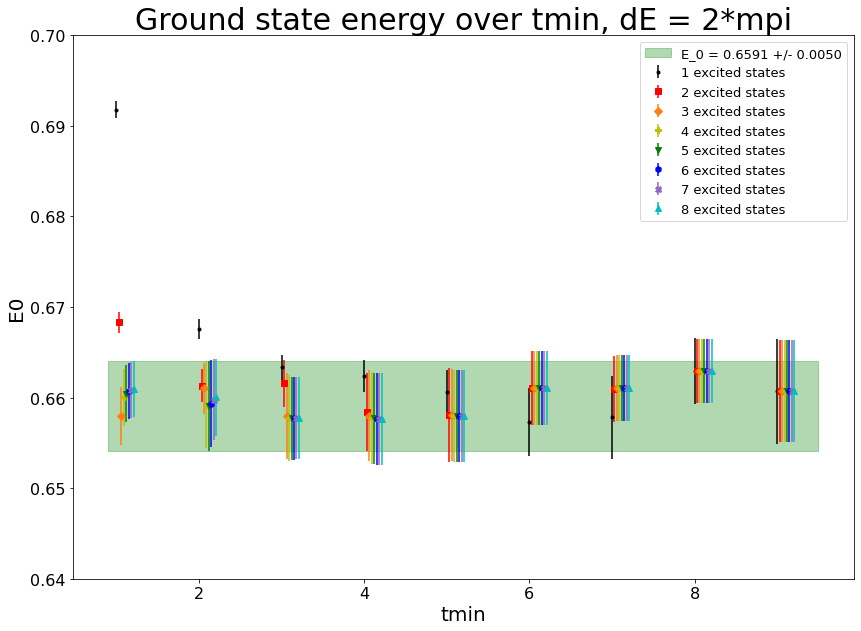

<Figure size 432x288 with 0 Axes>

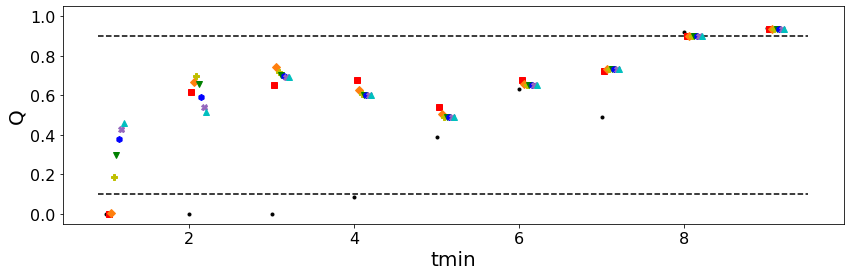

<Figure size 432x288 with 0 Axes>

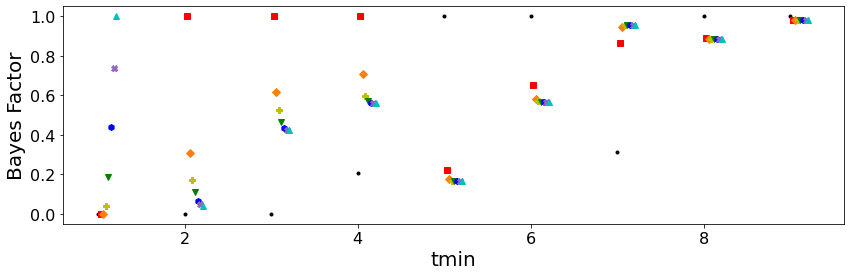

<Figure size 432x288 with 0 Axes>

In [45]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a0_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a0_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a0)):
       
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a0[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a0[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))
plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[4][1].mean + E0_tmin_bmax_a0[4][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[4][1].mean - E0_tmin_bmax_a0[4][1].sdev  for i in tmin_samp_line], color="green",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[4][1].mean, E0_tmin_bmax_a0[4][1].sdev))
plt.title("Ground state energy over tmin, dE = 2*mpi", fontsize = 30)
plt.xlabel("tmin", fontsize=20)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize=13)
fig.savefig("E0_2pt_dEconst_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a0)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a0[i][k] for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Q", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dEconst_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a0)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a0[i][k] for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Bayes Factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dEconst_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()

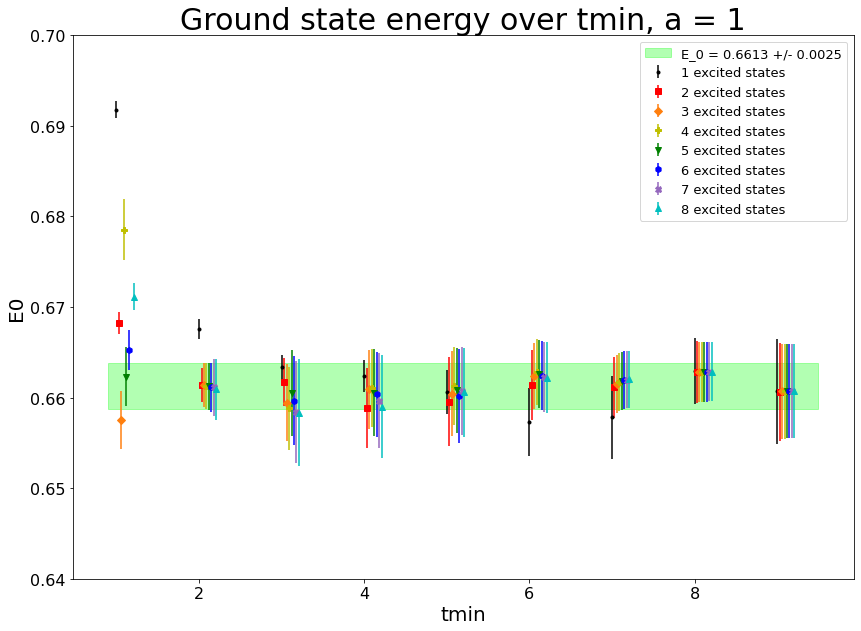

<Figure size 432x288 with 0 Axes>

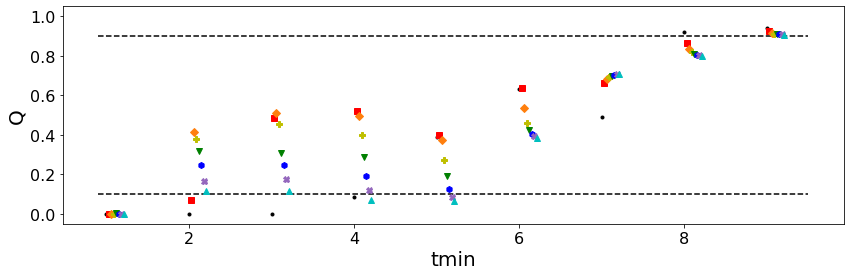

<Figure size 432x288 with 0 Axes>

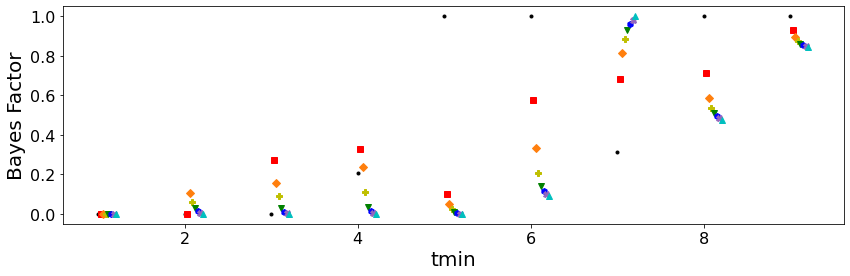

<Figure size 432x288 with 0 Axes>

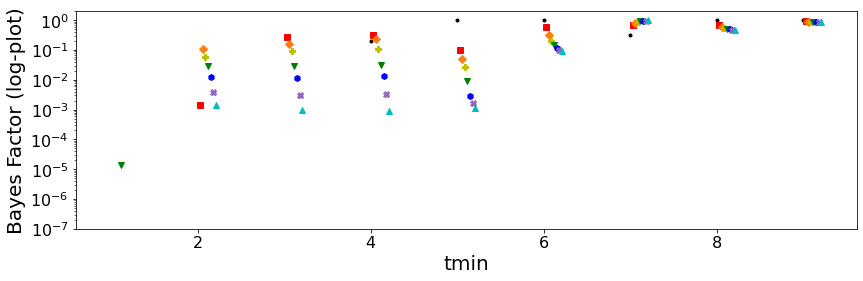

In [46]:
# Make a plot of E0 values vs tmin for a=1 , with a Q-plot and a Bayes factor plot right below, 
a1_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a1_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a1)):
       
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a1[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a1[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a1[3][1].mean + E0_tmin_bmax_a1[3][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a1[3][1].mean - E0_tmin_bmax_a1[3][1].sdev  for i in tmin_samp_line], color="lime",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a1[3][1].mean, E0_tmin_bmax_a1[3][1].sdev))
plt.title("Ground state energy over tmin, a = 1", fontsize=30)
plt.xlabel("tmin", fontsize=20)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize=13)
fig.savefig("E0_2pt_dE1overn_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a1)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a1[i][k] for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Q", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dE1overn_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a1)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a1[i][k] for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a1_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Bayes Factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dE1overn_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a1)):
        
    plt.semilogy(tmin+ i*0.03, [BF_tmin_bmax_a1[i][k] for k in range(len(tmin))], '.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        
        
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Bayes Factor (log-plot)", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-7, 2)
plt.show()



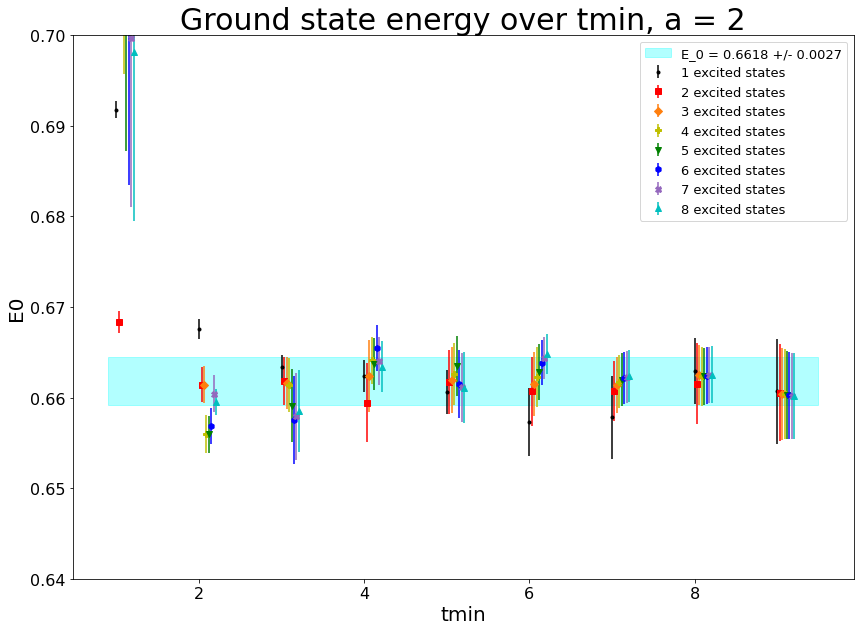

<Figure size 432x288 with 0 Axes>

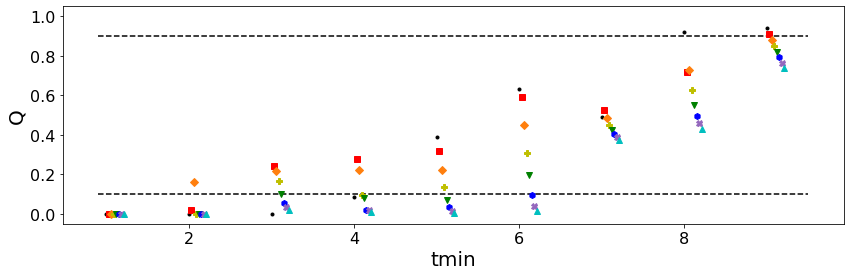

<Figure size 432x288 with 0 Axes>

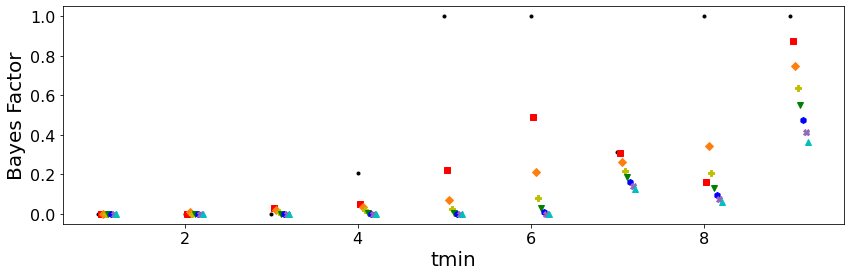

<Figure size 432x288 with 0 Axes>

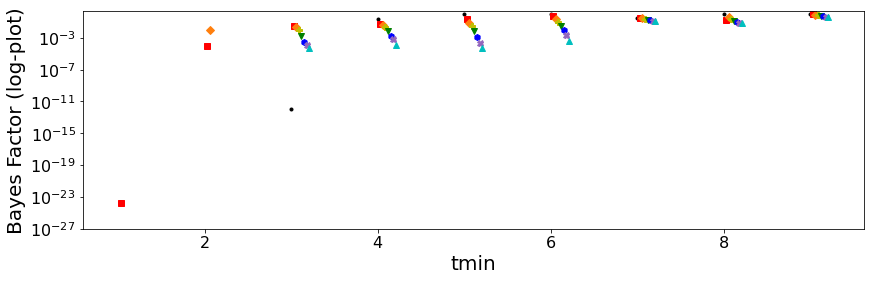

In [47]:
# Make a plot of E0 values vs tmin for a=2 , with a Q-plot and a Bayes factor plot right below, 
a2_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a2_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a2)):
    E0_tmin_bmax_a2[i]
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a2[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a2[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a2[1][2].mean + E0_tmin_bmax_a2[1][2].sdev for i in tmin_samp_line], [E0_tmin_bmax_a2[1][2].mean - E0_tmin_bmax_a2[1][2].sdev  for i in tmin_samp_line], color="cyan",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a2[1][2].mean, E0_tmin_bmax_a2[1][2].sdev))
plt.title("Ground state energy over tmin, a = 2", fontsize=30)
plt.xlabel("tmin", fontsize=20)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize=13)
fig.savefig("E0_2pt_dE1overn^2_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a2)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a2[i][k] for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a2_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Q", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dE1overn^2_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a2)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a2[i][k] for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Bayes Factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dE1overn^2_tmin_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a2)):
        
    plt.semilogy(tmin+ i*0.03, [BF_tmin_bmax_a2[i][k] for k in range(len(tmin))], '.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin", fontsize=20)
plt.ylabel("Bayes Factor (log-plot)", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-27, 2)
plt.show()


### The optimal fit from the old prior's tmin plot

Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896119 +- 0.0562206             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43303e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
       log(dE3)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde3             

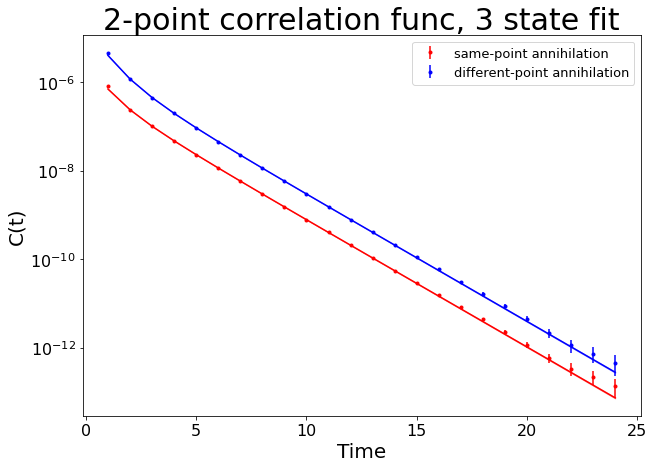

E0 =  0.6613326654154377 +/- 0.001854086855945197


In [48]:
num_zs = 3

fit_a0 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[1], 13)]), np.array([avg_data_original['proton'][l] for l in range(tmin[1],13)])), prior=priors[a_select_indices[0]][2],fcn=C_2pt,debug=True)
print(fit_a0.format(pstyle='vv'))
y_sample = C_2pt(np.array([i for i in range(0,25)]), fit_a0.p)

# Plot
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.semilogy()
ax.errorbar([i for i in range(1,25)], [avg_data_original['proton'][i][0][0].mean for i in range(1,25)], yerr=[avg_data_original['proton'][i][0][0].sdev for i in range(1,25)], fmt='.', label="same-point annihilation", color='red')
ax.errorbar([i for i in range(1,25)], [avg_data_original['proton'][i][1][0].mean for i in range(1,25)], yerr=[avg_data_original['proton'][i][1][0].sdev for i in range(1,25)], fmt='.', label="different-point annihilation", color='blue')
ax.errorbar([i for i in range(1,25)],[y_sample[i][0][0].mean for i in range(1,25)],ls='-',color="red")
ax.fill_between([i for i in range(1,25)],[y_sample[i][0][0].mean + y_sample[i][0][0].sdev for i in range(1,25)], [y_sample[i][0][0].mean - y_sample[i][0][0].sdev for i in range(1,25)], color="red",alpha=0.3)
ax.errorbar([i for i in range(1,25)],[y_sample[i][1][0].mean for i in range(1,25)],ls='-',color="blue")
ax.fill_between([i for i in range(1,25)],[y_sample[i][1][0].mean + y_sample[i][1][0].sdev for i in range(1,25)], [y_sample[i][1][0].mean - y_sample[i][1][0].sdev for i in range(1,25)], color="blue",alpha=0.3)
plt.xlabel("Time", fontsize = 20)
plt.ylabel("C(t)", fontsize = 20)
plt.title("2-point correlation func, 3 state fit", fontsize = 30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=13)
plt.savefig('optimalfit_2ptcorrelation_numzs3_oldpriormultifitfile.png')
plt.show()


print("E0 = ", fit_a0.p['E0'].mean, "+/-", fit_a0.p['E0'].sdev)

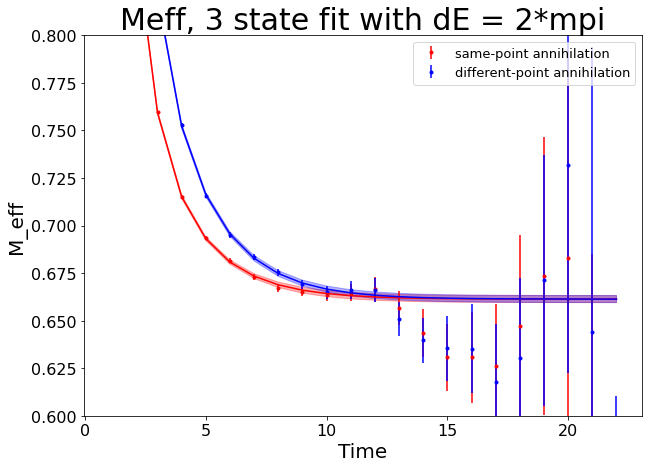

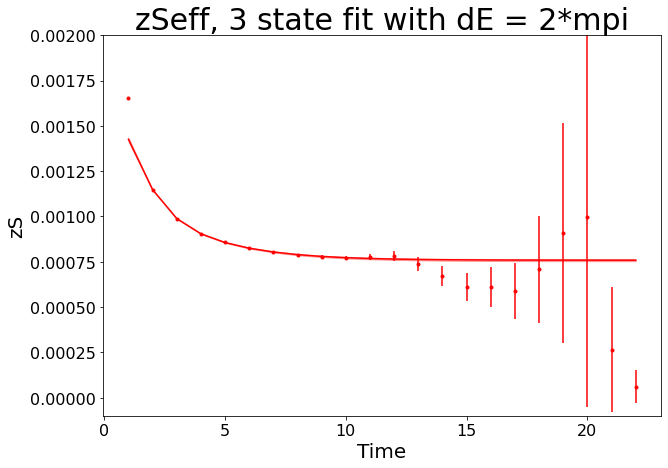

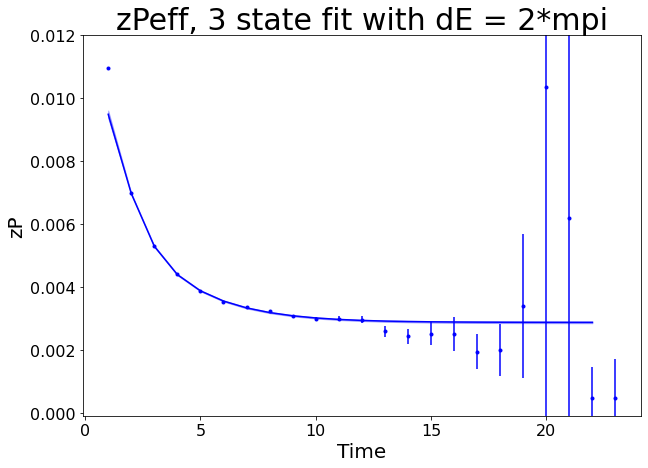

In [49]:
model_eff_mass = np.array([np.log(y_sample[i]/y_sample[i+1]) for i in range(0,24)])

fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar([i for i in range(1,23)], [eff_mass[0][i].mean for i in range(1,23)], yerr=[eff_mass[0][i].sdev for i in range(1,23)], fmt='.', label="same-point annihilation", color="red")
ax.errorbar([i for i in range(1,23)], [eff_mass[1][i].mean for i in range(1,23)], yerr=[eff_mass[1][i].sdev for i in range(1,23)], fmt='.', label="different-point annihilation", color="blue")

ax.errorbar([i for i in range(1,23)],[model_eff_mass[i][0][0].mean for i in range(1,23)],ls='-',color="red")
ax.fill_between([i for i in range(1,23)],[model_eff_mass[i][0][0].mean + model_eff_mass[i][0][0].sdev for i in range(1,23)], [model_eff_mass[i][0][0].mean - model_eff_mass[i][0][0].sdev for i in range(1,23)], color="red",alpha=0.3)
ax.errorbar([i for i in range(1,23)],[model_eff_mass[i][1][0].mean for i in range(1,23)],ls='-',color="blue")
ax.fill_between([i for i in range(1,23)],[model_eff_mass[i][1][0].mean + model_eff_mass[i][1][0].sdev for i in range(1,23)], [model_eff_mass[i][1][0].mean - model_eff_mass[i][1][0].sdev for i in range(1,23)], color="blue",alpha=0.3)

plt.xlabel("Time", fontsize = 20)
plt.ylabel("M_eff", fontsize = 20)
plt.ylim(0.6, 0.8)
plt.title("Meff, 3 state fit with dE = 2*mpi", fontsize = 30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=13)
plt.savefig('optimalfit_2pteffmass_numzs3_oldpriormultifitfile.png')
plt.show()


# Plot effective zSS
model_zS_eff = np.array([np.sqrt(np.exp(model_eff_mass[t][0][0]*t)*y_sample[t][0][0]) for t in range(0, 24)])

y_sample
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(1, 23)]), np.array([avg_data_original['zs_eff'][i].mean for i in range(1, 23)]), np.array([avg_data_original['zs_eff'][i].sdev for i in range(1, 23)]), fmt='.', color = 'red')

ax.errorbar([i for i in range(1,23)],[model_zS_eff[i].mean for i in range(1,23)],ls='-',color="red")
ax.fill_between([i for i in range(1,23)],[model_zS_eff[i].mean + model_zS_eff[i].sdev for i in range(1,23)], [model_zS_eff[i].mean - model_zS_eff[i].sdev for i in range(1,23)], color="red",alpha=0.3)

plt.xlabel("Time", fontsize = 20)
plt.ylabel("zS", fontsize = 20)
plt.ylim(-0.0001, 0.002)
plt.title("zSeff, 3 state fit with dE = 2*mpi", fontsize = 30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('optimalfit_2pteffzs_numzs3_oldpriormultifitfile.png')
plt.show()


model_zP_eff = np.array([np.exp(model_eff_mass[t][1][0]*t)*y_sample[t][1][0]/model_zS_eff[t] for t in range(0, 24)])

fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(1, 24)]), np.array([avg_data_original['zp_eff'][i].mean for i in range(1, 24)]), np.array([avg_data_original['zp_eff'][i].sdev for i in range(1, 24)]), fmt='.', color="blue")

ax.errorbar([i for i in range(1,23)],[model_zP_eff[i].mean for i in range(1,23)],ls='-',color="blue")
ax.fill_between([i for i in range(1,23)],[model_zP_eff[i].mean + model_zP_eff[i].sdev for i in range(1,23)], [model_zP_eff[i].mean - model_zP_eff[i].sdev for i in range(1,23)], color="blue",alpha=0.3)
plt.xlabel("Time", fontsize = 20)
plt.ylabel("zP", fontsize = 20)
plt.ylim(-0.0001, 0.012)
plt.title("zPeff, 3 state fit with dE = 2*mpi", fontsize = 30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('optimalfit_2pteffzp_numzs3_oldpriormultifitfile.png')
plt.show()


## Now, do the same with tmax 

In [50]:
# Test to see if tmax affects the fit at all
tmax = np.array([13, 15, 18, 20, 22, 25])

list_tmax_LogGBF_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

list_tmax_LogGBF_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

list_tmax_LogGBF_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

In [51]:
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmax)):
            num_zs = j + np.min(num_fitsamples) + 1
            fit_a0 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[0]][i],fcn=C_2pt,debug=True)
            fit_a1 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[1]][i],fcn=C_2pt,debug=True)
            fit_a2 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[2]][i],fcn=C_2pt,debug=True)
            
            print("\ni = ", i, " j = ", j, " k = ", k, "\n")
            
            list_tmax_LogGBF_a0[i][j][k] = fit_a0.logGBF
            list_tmax_Q_a0[i][j][k] = fit_a0.Q
            list_tmax_E0_a0[i][j][k] = fit_a0.p['E0']
            
            print("Fit for a = ", a[a_select_indices[0]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmax = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a0[i][j][k])
            print("list Q: ", list_tmax_Q_a0[i][j][k])
            print("list E0: ", list_tmax_E0_a0[i][j][k])
            print(fit_a0.format(pstyle='vv'))
            
            list_tmax_LogGBF_a1[i][j][k] = fit_a1.logGBF
            list_tmax_Q_a1[i][j][k] = fit_a1.Q
            list_tmax_E0_a1[i][j][k] = fit_a1.p['E0']
            
            print("Fit for a = ", a[a_select_indices[1]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a1[i][j][k])
            print("list Q: ", list_tmax_Q_a1[i][j][k])
            print("list E0: ", list_tmax_E0_a1[i][j][k])
            print(fit_a1.format(pstyle='vv'))
            
            list_tmax_LogGBF_a2[i][j][k] = fit_a2.logGBF
            list_tmax_Q_a2[i][j][k] = fit_a2.Q
            list_tmax_E0_a2[i][j][k] = fit_a2.p['E0']
            
            print("Fit for a = ", a[a_select_indices[2]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a2[i][j][k])
            print("list Q: ", list_tmax_Q_a2[i][j][k])
            print("list E0: ", list_tmax_E0_a2[i][j][k])
            print(fit_a2.format(pstyle='vv'))


i =  0  j =  0  k =  0 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  13
list logGBF:  244.1896919584023
list Q:  1.4551361579300357e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 1.5e-96    logGBF = 244.19

Parameters:
             E0       0.667571 +- 0.00108054             [     0.67 +- 0.02 ]  
             Z0   0.000785781 +- 2.52279e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303839 +- 1.21836e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127736 +- 0.00679035             [  -0.97551 +- 0.3 ]  **
             Z1    0.00125262 +- 3.76442e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918171 +- 4.28732e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3


i =  0  j =  0  k =  1 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  15
list logGBF:  350.51249181916813
list Q:  1.8243462466637277e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 1.8e-95    logGBF = 350.51

Parameters:
             E0       0.667551 +- 0.00107902             [     0.67 +- 0.02 ]  
             Z0   0.000785455 +- 2.51966e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303673 +- 1.21479e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.129011 +- 0.00673986             [  -0.97551 +- 0.3 ]  **
             Z1     0.0012524 +- 3.74781e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917278 +- 4.25649e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE


i =  0  j =  0  k =  2 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  18
list logGBF:  517.2531847598062
list Q:  5.866177234489051e-93
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 5.9e-93    logGBF = 517.25

Parameters:
             E0       0.667523 +- 0.00107738             [     0.67 +- 0.02 ]  
             Z0   0.000785442 +- 2.51654e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303626 +- 1.2131e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128255 +- 0.00674077             [  -0.97551 +- 0.3 ]  **
             Z1    0.00125232 +- 3.75186e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0091723 +- 4.25824e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  0  j =  0  k =  3 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  20
list logGBF:  630.6342582833352
list Q:  9.008606000288169e-92
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 9e-92    logGBF = 630.63

Parameters:
             E0        0.667369 +- 0.001073            [     0.67 +- 0.02 ]  
             Z0   0.00078506 +- 2.50502e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303483 +- 1.20955e-05            [   0.003 +- 0.003 ]  
       log(dE1)     -0.127906 +- 0.00670443            [  -0.97551 +- 0.3 ]  **
             Z1    0.00125299 +- 3.7364e-06            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.0091732 +- 4.23478e-05            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 0.3            [  -0.97551 +- 0.3 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.9755


i =  0  j =  0  k =  4 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  22
list logGBF:  747.3107662717465
list Q:  3.1917698523808834e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 3.2e-90    logGBF = 747.31

Parameters:
             E0       0.667417 +- 0.00107206             [     0.67 +- 0.02 ]  
             Z0   0.000785119 +- 2.50322e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303502 +- 1.20784e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128454 +- 0.00669233             [  -0.97551 +- 0.3 ]  **
             Z1     0.0012527 +- 3.72471e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917229 +- 4.22095e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3


i =  0  j =  0  k =  5 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  25
list logGBF:  924.1399440727542
list Q:  4.7244031745832835e-89
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 4.7e-89    logGBF = 924.14

Parameters:
             E0       0.667325 +- 0.00106709             [     0.67 +- 0.02 ]  
             Z0   0.000784974 +- 2.49693e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303454 +- 1.20292e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.1294 +- 0.0066559             [  -0.97551 +- 0.3 ]  **
             Z1     0.00125186 +- 3.6975e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0091681 +- 4.20122e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.3             [  -0.97551 +- 0.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3


i =  0  j =  1  k =  0 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  13
list logGBF:  483.77122292486666
list Q:  0.21861294705314102
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.2 [22]    Q = 0.22    logGBF = 483.77

Parameters:
             E0       0.661433 +- 0.00188415             [     0.67 +- 0.02 ]  
             Z0   0.000758659 +- 5.99084e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286901 +- 2.86229e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.767362 +- 0.0658265             [  -0.97551 +- 0.3 ]  
             Z1   0.000702192 +- 4.17304e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00480944 +- 0.000311085             [        0 +- 0.01 ]  
       log(dE2)       -0.116687 +- 0.0506311             [  -0.97551 +- 0.3 ]  **
             Z2     0.00132476 +- 2.0365e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00982877 +- 0.000210856             [        0 +- 0.01 ]  
       log(dE3)   


i =  0  j =  1  k =  1 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  15
list logGBF:  588.9450762101998
list Q:  0.07521099770665318
list E0:  0.6617(19)
Least Square Fit:
  chi2/dof [dof] = 1.4 [26]    Q = 0.075    logGBF = 588.95

Parameters:
             E0       0.661688 +- 0.00185779             [     0.67 +- 0.02 ]  
             Z0   0.000759481 +- 5.85856e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287437 +- 2.79135e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.753674 +- 0.0649357             [  -0.97551 +- 0.3 ]  
             Z1   0.000707965 +- 4.23437e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00485862 +- 0.000315348             [        0 +- 0.01 ]  
       log(dE2)       -0.114481 +- 0.0525198             [  -0.97551 +- 0.3 ]  **
             Z2    0.00132521 +- 2.11313e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00982569 +- 0.000217048             [        0 +- 0.01 ]  
       log(dE3)   


i =  0  j =  1  k =  2 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  18
list logGBF:  758.0433745372248
list Q:  0.1920057180164844
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1.2 [32]    Q = 0.19    logGBF = 758.04

Parameters:
             E0       0.661665 +- 0.00184958             [     0.67 +- 0.02 ]  
             Z0   0.000759429 +- 5.83592e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287407 +- 2.78002e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.752168 +- 0.064444             [  -0.97551 +- 0.3 ]  
             Z1   0.000708785 +- 4.20796e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00486441 +- 0.000313939             [        0 +- 0.01 ]  
       log(dE2)       -0.112782 +- 0.0526343             [  -0.97551 +- 0.3 ]  **
             Z2    0.00132586 +- 2.13259e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00983171 +- 0.000218254             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  1  k =  3 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  20
list logGBF:  872.6876997232666
list Q:  0.21741949510055222
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.2 [36]    Q = 0.22    logGBF = 872.69

Parameters:
             E0       0.661554 +- 0.00183598             [     0.67 +- 0.02 ]  
             Z0   0.000759159 +- 5.78523e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287375 +- 2.75604e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.746853 +- 0.0639639             [  -0.97551 +- 0.3 ]  
             Z1     0.0007124 +- 4.21588e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00488786 +- 0.000314828             [        0 +- 0.01 ]  
       log(dE2)       -0.110782 +- 0.0533715             [  -0.97551 +- 0.3 ]  **
             Z2    0.00132619 +- 2.16413e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00982823 +- 0.000220381             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  1  k =  4 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  22
list logGBF:  990.2220533333442
list Q:  0.28976858843116804
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.29    logGBF = 990.22

Parameters:
             E0        0.66159 +- 0.00184198             [     0.67 +- 0.02 ]  
             Z0   0.000759091 +- 5.81104e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287303 +- 2.76685e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.752665 +- 0.0641623             [  -0.97551 +- 0.3 ]  
             Z1    0.000708436 +- 4.1996e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00485989 +- 0.000312708             [        0 +- 0.01 ]  
       log(dE2)       -0.115205 +- 0.0523347             [  -0.97551 +- 0.3 ]  **
             Z2    0.00132456 +- 2.09715e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00981036 +- 0.000214664             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  1  k =  5 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  25
list logGBF:  1170.1245372660578
list Q:  0.3459474163371634
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [46]    Q = 0.35    logGBF = 1170.1

Parameters:
             E0        0.661741 +- 0.0018156             [     0.67 +- 0.02 ]  
             Z0   0.000759735 +- 5.70867e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287611 +- 2.71586e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.747462 +- 0.0633703             [  -0.97551 +- 0.3 ]  
             Z1   0.000710292 +- 4.20376e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00488648 +- 0.000312428             [        0 +- 0.01 ]  
       log(dE2)       -0.113413 +- 0.0530756             [  -0.97551 +- 0.3 ]  **
             Z2    0.00132522 +- 2.13696e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00980392 +- 0.000217011             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  2  k =  0 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  13
list logGBF:  484.9437119644642
list Q:  0.5205045467740295
list E0:  0.6610(29)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 484.94

Parameters:
             E0       0.660953 +- 0.00290064             [     0.67 +- 0.02 ]  
             Z0   0.000756614 +- 1.07877e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285955 +- 4.8002e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.808804 +- 0.113505             [  -0.97551 +- 0.3 ]  
             Z1   0.000670161 +- 6.60379e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00451688 +- 0.000603627             [        0 +- 0.01 ]  
       log(dE2)          -0.68369 +- 0.25235             [  -0.97551 +- 0.3 ]  
             Z2   0.000519645 +- 0.000369984             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00401458 +- 0.00263923             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  2  k =  1 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  15
list logGBF:  590.1537809897975
list Q:  0.22634928303245802
list E0:  0.6608(29)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 590.15

Parameters:
             E0       0.660822 +- 0.00290469             [     0.67 +- 0.02 ]  
             Z0     0.0007559 +- 1.08122e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028584 +- 4.79854e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.80755 +- 0.114224             [  -0.97551 +- 0.3 ]  
             Z1   0.000673826 +- 6.63285e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00449302 +- 0.000604046             [        0 +- 0.01 ]  
       log(dE2)         -0.681637 +- 0.25296             [  -0.97551 +- 0.3 ]  
             Z2   0.000512562 +- 0.000373683             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00422939 +- 0.00247721             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  2  k =  2 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  18
list logGBF:  759.2641942253103
list Q:  0.43150009796592237
list E0:  0.6606(29)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.43    logGBF = 759.26

Parameters:
             E0       0.660586 +- 0.00292126             [     0.67 +- 0.02 ]  
             Z0   0.000754984 +- 1.09115e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285439 +- 4.83855e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.813705 +- 0.114754             [  -0.97551 +- 0.3 ]  
             Z1   0.000673089 +- 6.59684e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00445825 +- 0.000597636             [        0 +- 0.01 ]  
       log(dE2)        -0.681013 +- 0.253273             [  -0.97551 +- 0.3 ]  
             Z2   0.000509019 +- 0.000374564             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00433352 +- 0.00238067             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  2  k =  3 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  20
list logGBF:  873.928580432458
list Q:  0.456406524898495
list E0:  0.6604(29)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 873.93

Parameters:
             E0       0.660437 +- 0.00290762             [     0.67 +- 0.02 ]  
             Z0   0.000754581 +- 1.08415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285354 +- 4.80713e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.808812 +- 0.114027             [  -0.97551 +- 0.3 ]  
             Z1   0.000676778 +- 6.59948e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00447664 +- 0.000598582             [        0 +- 0.01 ]  
       log(dE2)        -0.680043 +- 0.253302             [  -0.97551 +- 0.3 ]  
             Z2   0.000506521 +- 0.000376086             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00435008 +- 0.00236774             [        0 +- 0.01 ]  
       log(dE3)        -0


i =  0  j =  2  k =  4 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  22
list logGBF:  991.4439389181886
list Q:  0.5445774159384922
list E0:  0.6603(30)
Least Square Fit:
  chi2/dof [dof] = 0.96 [40]    Q = 0.54    logGBF = 991.44

Parameters:
             E0       0.660292 +- 0.00295473             [     0.67 +- 0.02 ]  
             Z0   0.000753756 +- 1.10875e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284949 +- 4.91097e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.822899 +- 0.116268             [  -0.97551 +- 0.3 ]  
             Z1   0.000670434 +- 6.59647e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00440845 +- 0.000593558             [        0 +- 0.01 ]  
       log(dE2)        -0.682692 +- 0.253807             [  -0.97551 +- 0.3 ]  
             Z2   0.000510418 +- 0.000372805             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00445462 +- 0.00227458             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  2  k =  5 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  25
list logGBF:  1171.4014850959418
list Q:  0.6007109746633285
list E0:  0.6601(30)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.6    logGBF = 1171.4

Parameters:
             E0        0.660145 +- 0.0029736             [     0.67 +- 0.02 ]  
             Z0   0.000753179 +- 1.12277e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284733 +- 4.96517e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.828477 +- 0.117575             [  -0.97551 +- 0.3 ]  
             Z1   0.000670026 +- 6.59586e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00437634 +- 0.000592654             [        0 +- 0.01 ]  
       log(dE2)        -0.683562 +- 0.254217             [  -0.97551 +- 0.3 ]  
             Z2   0.000504386 +- 0.000374645             [ 0.0012 +- 0.0006 ]  *
        Ztilde2     0.00459587 +- 0.00214915             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  0 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  13
list logGBF:  484.87777102198504
list Q:  0.6526226564560871
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.88

Parameters:
             E0       0.659637 +- 0.00392247             [     0.67 +- 0.02 ]  
             Z0    0.000750176 +- 1.6551e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283124 +- 7.07655e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.964168 +- 0.229502             [  -0.97551 +- 0.3 ]  
             Z1   0.000576895 +- 0.000109665             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0035672 +- 0.00105229             [        0 +- 0.01 ]  
       log(dE2)        -0.845547 +- 0.278048             [  -0.97551 +- 0.3 ]  
             Z2   0.000612596 +- 0.000271923             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00593743 +- 0.00219939             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  3  k =  1 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  15
list logGBF:  590.1028373160635
list Q:  0.3181519975909965
list E0:  0.6594(39)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.32    logGBF = 590.1

Parameters:
             E0       0.659447 +- 0.00391007             [     0.67 +- 0.02 ]  
             Z0   0.000749251 +- 1.64884e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282963 +- 7.02437e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.960536 +- 0.227711             [  -0.97551 +- 0.3 ]  
             Z1   0.000582792 +- 0.000109255             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00355686 +- 0.00104042             [        0 +- 0.01 ]  
       log(dE2)        -0.843268 +- 0.277112             [  -0.97551 +- 0.3 ]  
             Z2   0.000605182 +- 0.000274077             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00604599 +- 0.00219941             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  3  k =  2 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  18
list logGBF:  759.2212499755869
list Q:  0.5456474426350101
list E0:  0.6592(39)
Least Square Fit:
  chi2/dof [dof] = 0.95 [32]    Q = 0.55    logGBF = 759.22

Parameters:
             E0       0.659151 +- 0.00394165             [     0.67 +- 0.02 ]  
             Z0   0.000748032 +- 1.67086e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282443 +- 7.10879e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.969564 +- 0.228411             [  -0.97551 +- 0.3 ]  
             Z1   0.000582553 +- 0.000107696             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00352397 +- 0.00101889             [        0 +- 0.01 ]  
       log(dE2)         -0.838492 +- 0.27607             [  -0.97551 +- 0.3 ]  
             Z2   0.000602778 +- 0.000273446             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00610658 +- 0.00217191             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  3  k =  3 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  20
list logGBF:  873.8908420260628
list Q:  0.565988912118224
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 873.89

Parameters:
             E0       0.658989 +- 0.00392996             [     0.67 +- 0.02 ]  
             Z0   0.000747596 +- 1.66312e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282355 +- 7.07203e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.963908 +- 0.227657             [  -0.97551 +- 0.3 ]  
             Z1   0.000585864 +- 0.000108362             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00353704 +- 0.00102568             [        0 +- 0.01 ]  
       log(dE2)        -0.840214 +- 0.276051             [  -0.97551 +- 0.3 ]  
             Z2   0.000601432 +- 0.000273792             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00613299 +- 0.00217967             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  3  k =  4 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  22
list logGBF:  991.4069841017966
list Q:  0.649003763171034
list E0:  0.6589(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.65    logGBF = 991.41

Parameters:
             E0        0.65885 +- 0.00398506             [     0.67 +- 0.02 ]  
             Z0   0.000746734 +- 1.69626e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281933 +- 7.20861e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.978804 +- 0.229332             [  -0.97551 +- 0.3 ]  
             Z1   0.000581402 +- 0.000106353             [ 0.0012 +- 0.0006 ]  *
        Ztilde1    0.00349362 +- 0.000999096             [        0 +- 0.01 ]  
       log(dE2)        -0.833309 +- 0.275252             [  -0.97551 +- 0.3 ]  
             Z2   0.000604118 +- 0.000272155             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00613111 +- 0.00214502             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  3  k =  5 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  25
list logGBF:  1171.376779958109
list Q:  0.6988345729142301
list E0:  0.6586(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.7    logGBF = 1171.4

Parameters:
             E0       0.658638 +- 0.00403166             [     0.67 +- 0.02 ]  
             Z0   0.000745837 +- 1.72677e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281594 +- 7.32528e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.986653 +- 0.230374             [  -0.97551 +- 0.3 ]  
             Z1    0.000581867 +- 0.00010481             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.0034653 +- 0.000980312             [        0 +- 0.01 ]  
       log(dE2)        -0.828007 +- 0.273887             [  -0.97551 +- 0.3 ]  
             Z2   0.000601007 +- 0.000271817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00622229 +- 0.00213101             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  0 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  13
list logGBF:  484.34184656138945
list Q:  0.6336593848021328
list E0:  0.6598(40)
Least Square Fit:
  chi2/dof [dof] = 0.87 [22]    Q = 0.63    logGBF = 484.34

Parameters:
             E0       0.659756 +- 0.00396448             [     0.67 +- 0.02 ]  
             Z0   0.000750402 +- 1.68672e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283099 +- 7.19208e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00813 +- 0.254806             [  -0.97551 +- 0.3 ]  
             Z1    0.00054004 +- 0.000127573             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033462 +- 0.00109897             [        0 +- 0.01 ]  
       log(dE2)        -0.888153 +- 0.283163             [  -0.97551 +- 0.3 ]  
             Z2   0.000648826 +- 0.000255757             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00560546 +- 0.00199534             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  4  k =  1 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  15
list logGBF:  589.6001636590584
list Q:  0.3060818362274323
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.31    logGBF = 589.6

Parameters:
             E0       0.659566 +- 0.00393811             [     0.67 +- 0.02 ]  
             Z0   0.000749506 +- 1.67328e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282971 +- 7.1135e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00045 +- 0.252149             [  -0.97551 +- 0.3 ]  
             Z1   0.000548353 +- 0.000126765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335129 +- 0.00109231             [        0 +- 0.01 ]  
       log(dE2)        -0.884548 +- 0.282594             [  -0.97551 +- 0.3 ]  
             Z2   0.000641161 +- 0.000258707             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00569532 +- 0.00201328             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  4  k =  2 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  18
list logGBF:  758.727557330351
list Q:  0.5330736775720861
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [32]    Q = 0.53    logGBF = 758.73

Parameters:
             E0       0.659268 +- 0.00396605             [     0.67 +- 0.02 ]  
             Z0   0.000748278 +- 1.69389e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282449 +- 7.19398e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00894 +- 0.252251             [  -0.97551 +- 0.3 ]  
             Z1   0.000549055 +- 0.000124685             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033249 +- 0.00106828             [        0 +- 0.01 ]  
       log(dE2)         -0.879794 +- 0.28188             [  -0.97551 +- 0.3 ]  
             Z2   0.000637291 +- 0.000258986             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00572871 +- 0.00200278             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  3 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  20
list logGBF:  873.4062604143115
list Q:  0.5548343825228677
list E0:  0.6591(40)
Least Square Fit:
  chi2/dof [dof] = 0.95 [36]    Q = 0.55    logGBF = 873.41

Parameters:
             E0         0.659105 +- 0.003952             [     0.67 +- 0.02 ]  
             Z0   0.000747839 +- 1.68525e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282365 +- 7.15371e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00287 +- 0.251704             [  -0.97551 +- 0.3 ]  
             Z1   0.000552354 +- 0.000125468             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333685 +- 0.00107743             [        0 +- 0.01 ]  
       log(dE2)        -0.881171 +- 0.281842             [  -0.97551 +- 0.3 ]  
             Z2   0.000636908 +- 0.000259034             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00576147 +- 0.00200523             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  4  k =  4 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  22
list logGBF:  990.9195695458008
list Q:  0.638335807652614
list E0:  0.6590(40)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.64    logGBF = 990.92

Parameters:
             E0        0.658985 +- 0.0040036             [     0.67 +- 0.02 ]  
             Z0   0.000747055 +- 1.71606e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281972 +- 7.28195e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01679 +- 0.252432             [  -0.97551 +- 0.3 ]  
             Z1   0.000548907 +- 0.000123041             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330391 +- 0.00104734             [        0 +- 0.01 ]  
       log(dE2)        -0.874885 +- 0.281374             [  -0.97551 +- 0.3 ]  
             Z2   0.000636732 +- 0.000258917             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0057315 +- 0.00199699             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  4  k =  5 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  25
list logGBF:  1170.8967549959623
list Q:  0.6899557614108381
list E0:  0.6588(40)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.69    logGBF = 1170.9

Parameters:
             E0        0.65877 +- 0.00404702             [     0.67 +- 0.02 ]  
             Z0   0.000746144 +- 1.74546e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281628 +- 7.39563e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02435 +- 0.253003             [  -0.97551 +- 0.3 ]  
             Z1   0.000550109 +- 0.000121061             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328007 +- 0.00102616             [        0 +- 0.01 ]  
       log(dE2)          -0.8698 +- 0.280433             [  -0.97551 +- 0.3 ]  
             Z2    0.000632596 +- 0.00025925             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00579207 +- 0.00199406             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  5  k =  0 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  13
list logGBF:  483.7473486445095
list Q:  0.5713181444066209
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 0.92 [22]    Q = 0.57    logGBF = 483.75

Parameters:
             E0       0.660029 +- 0.00391357             [     0.67 +- 0.02 ]  
             Z0   0.000751516 +- 1.65721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283483 +- 7.07308e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02013 +- 0.260941             [  -0.97551 +- 0.3 ]  
             Z1   0.000522561 +- 0.000135894             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328664 +- 0.00111188             [        0 +- 0.01 ]  
       log(dE2)        -0.901522 +- 0.284393             [  -0.97551 +- 0.3 ]  
             Z2    0.000670499 +- 0.00024918             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00542198 +- 0.00196219             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  1 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  15
list logGBF:  589.0362110325764
list Q:  0.26472909197264155
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.26    logGBF = 589.04

Parameters:
             E0       0.659847 +- 0.00387753             [     0.67 +- 0.02 ]  
             Z0   0.000750663 +- 1.63904e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283383 +- 6.97907e-05             [   0.003 +- 0.003 ]  
       log(dE1)            -1.01 +- 0.258349             [  -0.97551 +- 0.3 ]  
             Z1   0.000532189 +- 0.000135079             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329991 +- 0.00111148             [        0 +- 0.01 ]  
       log(dE2)         -0.89711 +- 0.284056             [  -0.97551 +- 0.3 ]  
             Z2   0.000663496 +- 0.000251885             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00550652 +- 0.00198309             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  2 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  18
list logGBF:  758.165936711275
list Q:  0.48492115263730773
list E0:  0.6595(39)
Least Square Fit:
  chi2/dof [dof] = 0.99 [32]    Q = 0.48    logGBF = 758.17

Parameters:
             E0       0.659546 +- 0.00390619             [     0.67 +- 0.02 ]  
             Z0   0.000749423 +- 1.66014e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282856 +- 7.06269e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01854 +- 0.258473             [  -0.97551 +- 0.3 ]  
             Z1   0.000533225 +- 0.000132769             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032739 +- 0.00108724             [        0 +- 0.01 ]  
       log(dE2)        -0.892818 +- 0.283521             [  -0.97551 +- 0.3 ]  
             Z2   0.000658546 +- 0.000252713             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00552901 +- 0.00197838             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  3 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  20
list logGBF:  872.8531412892639
list Q:  0.5097454157365443
list E0:  0.6594(39)
Least Square Fit:
  chi2/dof [dof] = 0.98 [36]    Q = 0.51    logGBF = 872.85

Parameters:
             E0       0.659386 +- 0.00388912             [     0.67 +- 0.02 ]  
             Z0   0.000748997 +- 1.65021e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028278 +- 7.01788e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01203 +- 0.258043             [  -0.97551 +- 0.3 ]  
             Z1   0.000536646 +- 0.000133646             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328655 +- 0.00109823             [        0 +- 0.01 ]  
       log(dE2)        -0.893859 +- 0.283501             [  -0.97551 +- 0.3 ]  
             Z2   0.000658752 +- 0.000252493             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00556516 +- 0.00197814             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  5  k =  4 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  22
list logGBF:  990.3620201960249
list Q:  0.5957749795696674
list E0:  0.6593(39)
Least Square Fit:
  chi2/dof [dof] = 0.93 [40]    Q = 0.6    logGBF = 990.36

Parameters:
             E0        0.659272 +- 0.0039421             [     0.67 +- 0.02 ]  
             Z0   0.000748241 +- 1.68133e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282396 +- 7.14712e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02593 +- 0.258469             [  -0.97551 +- 0.3 ]  
             Z1   0.000533427 +- 0.000130972             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325514 +- 0.00106629             [        0 +- 0.01 ]  
       log(dE2)        -0.888286 +- 0.283105             [  -0.97551 +- 0.3 ]  
             Z2     0.00065705 +- 0.00025322             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.005525 +- 0.00197925             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  5  k =  5 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  25
list logGBF:  1170.3378738311849
list Q:  0.6519216006517518
list E0:  0.6591(40)
Least Square Fit:
  chi2/dof [dof] = 0.91 [46]    Q = 0.65    logGBF = 1170.3

Parameters:
             E0       0.659052 +- 0.00398688             [     0.67 +- 0.02 ]  
             Z0   0.000747303 +- 1.71183e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00282041 +- 7.266e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03398 +- 0.259242             [  -0.97551 +- 0.3 ]  
             Z1   0.000534744 +- 0.000128852             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00322959 +- 0.00104482             [        0 +- 0.01 ]  
       log(dE2)        -0.883993 +- 0.282403             [  -0.97551 +- 0.3 ]  
             Z2   0.000651819 +- 0.000254022             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00557287 +- 0.00197875             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  6  k =  0 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  13
list logGBF:  483.26595799240835
list Q:  0.5057278392062949
list E0:  0.6603(38)
Least Square Fit:
  chi2/dof [dof] = 0.97 [22]    Q = 0.51    logGBF = 483.27

Parameters:
             E0       0.660311 +- 0.00383226             [     0.67 +- 0.02 ]  
             Z0   0.000752759 +- 1.61026e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283964 +- 6.8888e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01742 +- 0.261251             [  -0.97551 +- 0.3 ]  
             Z1   0.000515176 +- 0.000140043             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329206 +- 0.00112506             [        0 +- 0.01 ]  
       log(dE2)         -0.89611 +- 0.283487             [  -0.97551 +- 0.3 ]  
             Z2   0.000693032 +- 0.000241917             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00541258 +- 0.00193688             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  6  k =  1 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  15
list logGBF:  588.5810900096096
list Q:  0.22507938881353573
list E0:  0.6601(38)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 588.58

Parameters:
             E0        0.66014 +- 0.00379098             [     0.67 +- 0.02 ]  
             Z0   0.000751953 +- 1.58943e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283886 +- 6.78668e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00606 +- 0.258743             [  -0.97551 +- 0.3 ]  
             Z1   0.000525365 +- 0.000139359             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330975 +- 0.00112843             [        0 +- 0.01 ]  
       log(dE2)        -0.891558 +- 0.283307             [  -0.97551 +- 0.3 ]  
             Z2   0.000686809 +- 0.000244127             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00549017 +- 0.00195863             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  6  k =  2 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  18
list logGBF:  757.7091723596375
list Q:  0.4348279011628881
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.43    logGBF = 757.71

Parameters:
             E0       0.659838 +- 0.00382134             [     0.67 +- 0.02 ]  
             Z0    0.000750709 +- 1.6114e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283356 +- 6.87446e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01497 +- 0.259103             [  -0.97551 +- 0.3 ]  
             Z1   0.000526372 +- 0.000136946             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328138 +- 0.00110425             [        0 +- 0.01 ]  
       log(dE2)        -0.887563 +- 0.282819             [  -0.97551 +- 0.3 ]  
             Z2   0.000681289 +- 0.000245271             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00551092 +- 0.00195423             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  6  k =  3 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  20
list logGBF:  872.4038998209674
list Q:  0.46233508228415804
list E0:  0.6597(38)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 872.4

Parameters:
             E0        0.65968 +- 0.00380225             [     0.67 +- 0.02 ]  
             Z0   0.000750295 +- 1.60058e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283286 +- 6.82666e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00809 +- 0.258681             [  -0.97551 +- 0.3 ]  
             Z1   0.000529948 +- 0.000137909             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329545 +- 0.00111649             [        0 +- 0.01 ]  
       log(dE2)        -0.888625 +- 0.282846             [  -0.97551 +- 0.3 ]  
             Z2    0.00068166 +- 0.000244905             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00554541 +- 0.00195399             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  6  k =  4 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  22
list logGBF:  989.908636999534
list Q:  0.5497509313856137
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.96 [40]    Q = 0.55    logGBF = 989.91

Parameters:
             E0       0.659571 +- 0.00385562             [     0.67 +- 0.02 ]  
             Z0    0.00074956 +- 1.63164e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028291 +- 6.95548e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02218 +- 0.259088             [  -0.97551 +- 0.3 ]  
             Z1   0.000526657 +- 0.000135056             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326262 +- 0.00108333             [        0 +- 0.01 ]  
       log(dE2)        -0.882836 +- 0.282361             [  -0.97551 +- 0.3 ]  
             Z2   0.000679766 +- 0.000245948             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00550934 +- 0.00195596             [        0 +- 0.01 ]  
       log(dE3)      


i =  0  j =  6  k =  5 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  25
list logGBF:  1169.8807847718163
list Q:  0.6098171103721924
list E0:  0.6593(39)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1169.9

Parameters:
             E0       0.659348 +- 0.00390175             [     0.67 +- 0.02 ]  
             Z0   0.000748611 +- 1.66308e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028255 +- 7.07869e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03074 +- 0.260191             [  -0.97551 +- 0.3 ]  
             Z1     0.00052792 +- 0.00013286             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00323423 +- 0.00106207             [        0 +- 0.01 ]  
       log(dE2)        -0.878842 +- 0.281724             [  -0.97551 +- 0.3 ]  
             Z2   0.000673862 +- 0.000247063             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00555628 +- 0.00195466             [        0 +- 0.01 ]  
       log(dE3)    


i =  0  j =  7  k =  0 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  13
list logGBF:  482.9509727205653
list Q:  0.4558576729779113
list E0:  0.6605(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 482.95

Parameters:
             E0       0.660549 +- 0.00374654             [     0.67 +- 0.02 ]  
             Z0   0.000753837 +- 1.56153e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284403 +- 6.69978e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00878 +- 0.259325             [  -0.97551 +- 0.3 ]  
             Z1   0.000513329 +- 0.000142257             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332462 +- 0.00113824             [        0 +- 0.01 ]  
       log(dE2)        -0.883051 +- 0.281784             [  -0.97551 +- 0.3 ]  
             Z2   0.000715065 +- 0.000233833             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00547846 +- 0.00190744             [        0 +- 0.01 ]  
       log(dE3)        


i =  0  j =  7  k =  1 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  15
list logGBF:  588.2853164526952
list Q:  0.1972444597010129
list E0:  0.6604(37)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.2    logGBF = 588.29

Parameters:
             E0       0.660387 +- 0.00370378             [     0.67 +- 0.02 ]  
             Z0   0.000753071 +- 1.53991e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028434 +- 6.59586e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.996935 +- 0.256841             [  -0.97551 +- 0.3 ]  
             Z1   0.000523675 +- 0.000141721             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00334453 +- 0.00114343             [        0 +- 0.01 ]  
       log(dE2)        -0.878835 +- 0.281747             [  -0.97551 +- 0.3 ]  
             Z2   0.000709285 +- 0.000235688             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00554733 +- 0.00193033             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  7  k =  2 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  18
list logGBF:  757.4119732599374
list Q:  0.3970692436814414
list E0:  0.6601(37)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.4    logGBF = 757.41

Parameters:
             E0       0.660087 +- 0.00373455             [     0.67 +- 0.02 ]  
             Z0   0.000751838 +- 1.56195e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283814 +- 6.68474e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00602 +- 0.257444             [  -0.97551 +- 0.3 ]  
             Z1    0.000524608 +- 0.00013927             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331416 +- 0.00111976             [        0 +- 0.01 ]  
       log(dE2)         -0.87456 +- 0.281218             [  -0.97551 +- 0.3 ]  
             Z2   0.000703815 +- 0.000236929             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00557269 +- 0.00192423             [        0 +- 0.01 ]  
       log(dE3)        -


i =  0  j =  7  k =  3 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  20
list logGBF:  872.1108980357659
list Q:  0.42627623838360007
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.43    logGBF = 872.11

Parameters:
             E0        0.65993 +- 0.00371556             [     0.67 +- 0.02 ]  
             Z0   0.000751424 +- 1.55136e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283744 +- 6.63789e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.999137 +- 0.25704             [  -0.97551 +- 0.3 ]  
             Z1   0.000528211 +- 0.000140302             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332856 +- 0.00113253             [        0 +- 0.01 ]  
       log(dE2)        -0.876092 +- 0.281318             [  -0.97551 +- 0.3 ]  
             Z2   0.000703936 +- 0.000236552             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00560228 +- 0.00192481             [        0 +- 0.01 ]  
       log(dE3)       


i =  0  j =  7  k =  4 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  22
list logGBF:  989.6124754845702
list Q:  0.5137988762607194
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 989.61

Parameters:
             E0       0.659825 +- 0.00376814             [     0.67 +- 0.02 ]  
             Z0   0.000750709 +- 1.58181e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283376 +- 6.76439e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01345 +- 0.257562             [  -0.97551 +- 0.3 ]  
             Z1    0.000524732 +- 0.00013735             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329341 +- 0.00109874             [        0 +- 0.01 ]  
       log(dE2)        -0.869528 +- 0.280654             [  -0.97551 +- 0.3 ]  
             Z2   0.000702666 +- 0.000237548             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00557738 +- 0.00192373             [        0 +- 0.01 ]  
       log(dE3)     


i =  0  j =  7  k =  5 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  25
list logGBF:  1169.582275874916
list Q:  0.5762511456752881
list E0:  0.6596(38)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.58    logGBF = 1169.6

Parameters:
             E0        0.659605 +- 0.0038138             [     0.67 +- 0.02 ]  
             Z0   0.000749772 +- 1.61305e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028302 +- 6.88765e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02215 +- 0.258967             [  -0.97551 +- 0.3 ]  
             Z1    0.000525966 +- 0.00013513             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326321 +- 0.00107839             [        0 +- 0.01 ]  
       log(dE2)        -0.865225 +- 0.279976             [  -0.97551 +- 0.3 ]  
             Z2   0.000696699 +- 0.000238767             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00563004 +- 0.00192028             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  0  k =  0 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  13
list logGBF:  246.23624323833008
list Q:  1.700694301742009e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 1.7e-95    logGBF = 246.24

Parameters:
             E0       0.667592 +- 0.00108047             [     0.67 +- 0.02 ]  
             Z0   0.000785836 +- 2.52251e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303868 +- 1.21828e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.1274 +- 0.00679329             [  -0.97551 +- 0.5 ]  *
             Z1     0.00125275 +- 3.7674e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918323 +- 4.29035e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  1  j =  0  k =  1 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  15
list logGBF:  352.5513307698946
list Q:  2.0791456437778959e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 2.1e-94    logGBF = 352.55

Parameters:
             E0       0.667571 +- 0.00107895             [     0.67 +- 0.02 ]  
             Z0   0.000785509 +- 2.51939e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303701 +- 1.21472e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128681 +- 0.00674274             [  -0.97551 +- 0.5 ]  *
             Z1     0.00125253 +- 3.7507e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917427 +- 4.25943e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  1  j =  0  k =  2 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  18
list logGBF:  519.2965837344252
list Q:  6.534750999464487e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 6.5e-92    logGBF = 519.3

Parameters:
             E0        0.667543 +- 0.0010773             [     0.67 +- 0.02 ]  
             Z0   0.000785496 +- 2.51627e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303654 +- 1.21303e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127924 +- 0.00674364             [  -0.97551 +- 0.5 ]  *
             Z1    0.00125245 +- 3.75477e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0091738 +- 4.26119e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  1  j =  0  k =  3 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  20
list logGBF:  632.6797392011924
list Q:  9.88336689635368e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 9.9e-91    logGBF = 632.68

Parameters:
             E0       0.667389 +- 0.00107293             [     0.67 +- 0.02 ]  
             Z0   0.000785113 +- 2.50476e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303511 +- 1.20947e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127579 +- 0.00670725             [  -0.97551 +- 0.5 ]  *
             Z1    0.00125311 +- 3.73928e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917468 +- 4.23768e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  1  j =  0  k =  4 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  22
list logGBF:  749.3529385874708
list Q:  3.4301852126316294e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 3.4e-89    logGBF = 749.35

Parameters:
             E0       0.667437 +- 0.00107199             [     0.67 +- 0.02 ]  
             Z0   0.000785172 +- 2.50296e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0030353 +- 1.20776e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128128 +- 0.00669514             [  -0.97551 +- 0.5 ]  *
             Z1    0.00125283 +- 3.72755e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917376 +- 4.22383e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  1  j =  0  k =  5 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  25
list logGBF:  926.1763875022956
list Q:  4.9309131039899575e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 4.9e-88    logGBF = 926.18

Parameters:
             E0       0.667344 +- 0.00106701             [     0.67 +- 0.02 ]  
             Z0   0.000785026 +- 2.49667e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303481 +- 1.20285e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.129079 +- 0.00665865             [  -0.97551 +- 0.5 ]  *
             Z1    0.00125199 +- 3.70027e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00916956 +- 4.20404e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.5             [  -0.97551 +- 0.5 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  1  j =  1  k =  0 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  13
list logGBF:  485.64955168316305
list Q:  0.5142585611348556
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 485.65

Parameters:
             E0        0.661351 +- 0.0018614             [     0.67 +- 0.02 ]  
             Z0   0.000758627 +- 5.88415e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287008 +- 2.81646e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.74794 +- 0.0645793             [  -0.97551 +- 0.5 ]  
             Z1    0.000717575 +- 4.2092e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00491619 +- 0.000316002             [        0 +- 0.01 ]  
       log(dE2)      -0.0962008 +- 0.0548204             [  -0.97551 +- 0.5 ]  *
             Z2    0.00133196 +- 2.32879e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0099014 +- 0.000234443             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  1  k =  1 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  15
list logGBF:  590.8688343933176
list Q:  0.22145783205315098
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.22    logGBF = 590.87

Parameters:
             E0       0.661607 +- 0.00183416             [     0.67 +- 0.02 ]  
             Z0   0.000759464 +- 5.74806e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287553 +- 2.7437e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.733383 +- 0.0635578             [  -0.97551 +- 0.5 ]  
             Z1   0.000724323 +- 4.26712e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00497264 +- 0.000319999             [        0 +- 0.01 ]  
       log(dE2)       -0.0921982 +- 0.057142             [  -0.97551 +- 0.5 ]  *
             Z2    0.00133313 +- 2.44415e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00990404 +- 0.000243519             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  1  k =  2 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  18
list logGBF:  759.9808220899356
list Q:  0.4220395486326308
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.42    logGBF = 759.98

Parameters:
             E0       0.661589 +- 0.00182592             [     0.67 +- 0.02 ]  
             Z0   0.000759426 +- 5.72509e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287529 +- 2.73207e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.731903 +- 0.0630566             [  -0.97551 +- 0.5 ]  
             Z1    0.00072512 +- 4.23936e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00497859 +- 0.000318434             [        0 +- 0.01 ]  
       log(dE2)      -0.0903627 +- 0.0572559             [  -0.97551 +- 0.5 ]  *
             Z2     0.00133393 +- 2.4689e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991091 +- 0.000245005             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  1  k =  3 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  20
list logGBF:  874.6510228353501
list Q:  0.44809745208813306
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.45    logGBF = 874.65

Parameters:
             E0       0.661484 +- 0.00181186             [     0.67 +- 0.02 ]  
             Z0    0.00075918 +- 5.67232e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287508 +- 2.70703e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.726235 +- 0.0625258             [  -0.97551 +- 0.5 ]  
             Z1   0.000729093 +- 4.24593e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0050049 +- 0.00031919             [        0 +- 0.01 ]  
       log(dE2)       -0.087595 +- 0.0581842             [  -0.97551 +- 0.5 ]  *
             Z2    0.00133459 +- 2.51903e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.00991 +- 0.000248482             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  1  k =  4 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  22
list logGBF:  992.1422426396836
list Q:  0.5301093866852111
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.14

Parameters:
             E0       0.661517 +- 0.00181846             [     0.67 +- 0.02 ]  
             Z0    0.000759095 +- 5.7012e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287426 +- 2.71947e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.732524 +- 0.0627937             [  -0.97551 +- 0.5 ]  
             Z1   0.000724667 +- 4.23097e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0049733 +- 0.000317181             [        0 +- 0.01 ]  
       log(dE2)      -0.0930471 +- 0.0569056             [  -0.97551 +- 0.5 ]  *
             Z2    0.00133241 +- 2.42459e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00988744 +- 0.000240737             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  1  k =  5 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  25
list logGBF:  1172.0679289112625
list Q:  0.5823746430868202
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.58    logGBF = 1172.1

Parameters:
             E0       0.661669 +- 0.00179194             [     0.67 +- 0.02 ]  
             Z0   0.000759739 +- 5.59831e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287737 +- 2.66813e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.727104 +- 0.0619574             [  -0.97551 +- 0.5 ]  
             Z1   0.000726833 +- 4.23235e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0050021 +- 0.000316661             [        0 +- 0.01 ]  
       log(dE2)       -0.0905458 +- 0.057787             [  -0.97551 +- 0.5 ]  *
             Z2     0.00133343 +- 2.4816e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00988318 +- 0.000244192             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  2  k =  0 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  13
list logGBF:  484.8917998958252
list Q:  0.6251245563977219
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.63    logGBF = 484.89

Parameters:
             E0       0.661021 +- 0.00283497             [     0.67 +- 0.02 ]  
             Z0   0.000756971 +- 1.04986e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286133 +- 4.72454e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.806654 +- 0.120884             [  -0.97551 +- 0.5 ]  
             Z1   0.000667379 +- 7.52408e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00451372 +- 0.000652402             [        0 +- 0.01 ]  
       log(dE2)        -0.563562 +- 0.367134             [  -0.97551 +- 0.5 ]  
             Z2     0.0007049 +- 0.000388445             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0052707 +- 0.00290888             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  1 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  15
list logGBF:  590.1227458314745
list Q:  0.29692028560146505
list E0:  0.6609(28)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.3    logGBF = 590.12

Parameters:
             E0       0.660921 +- 0.00283668             [     0.67 +- 0.02 ]  
             Z0   0.000756394 +- 1.05146e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286075 +- 4.72014e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.804109 +- 0.122757             [  -0.97551 +- 0.5 ]  
             Z1    0.00067102 +- 7.68417e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00449731 +- 0.000667052             [        0 +- 0.01 ]  
       log(dE2)        -0.565986 +- 0.371465             [  -0.97551 +- 0.5 ]  
             Z2   0.000698141 +- 0.000388591             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0054094 +- 0.00281284             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  2  k =  2 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  18
list logGBF:  759.2253575755653
list Q:  0.5185281011003928
list E0:  0.6607(29)
Least Square Fit:
  chi2/dof [dof] = 0.97 [32]    Q = 0.52    logGBF = 759.23

Parameters:
             E0       0.660685 +- 0.00286268             [     0.67 +- 0.02 ]  
             Z0    0.00075547 +- 1.06663e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285662 +- 4.78413e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.811829 +- 0.125432             [  -0.97551 +- 0.5 ]  
             Z1   0.000668791 +- 7.80799e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00445313 +- 0.000675363             [        0 +- 0.01 ]  
       log(dE2)        -0.572658 +- 0.375494             [  -0.97551 +- 0.5 ]  
             Z2   0.000693086 +- 0.000386949             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00546554 +- 0.00274471             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  3 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  20
list logGBF:  873.9061400390385
list Q:  0.5405931712038922
list E0:  0.6606(28)
Least Square Fit:
  chi2/dof [dof] = 0.96 [36]    Q = 0.54    logGBF = 873.91

Parameters:
             E0       0.660555 +- 0.00284334             [     0.67 +- 0.02 ]  
             Z0   0.000755151 +- 1.05656e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285618 +- 4.73813e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.805402 +- 0.123842             [  -0.97551 +- 0.5 ]  
             Z1   0.000673319 +- 7.76703e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448011 +- 0.000673465             [        0 +- 0.01 ]  
       log(dE2)        -0.569981 +- 0.375311             [  -0.97551 +- 0.5 ]  
             Z2   0.000691097 +- 0.000388264             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00547078 +- 0.00274461             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  4 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  22
list logGBF:  991.3823660559666
list Q:  0.6235749384102449
list E0:  0.6604(29)
Least Square Fit:
  chi2/dof [dof] = 0.92 [40]    Q = 0.62    logGBF = 991.38

Parameters:
             E0       0.660379 +- 0.00291169             [     0.67 +- 0.02 ]  
             Z0    0.00075417 +- 1.09318e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285131 +- 4.89786e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.824301 +- 0.130698             [  -0.97551 +- 0.5 ]  
             Z1   0.000663489 +- 8.08655e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00438381 +- 0.00069441             [        0 +- 0.01 ]  
       log(dE2)        -0.585491 +- 0.381026             [  -0.97551 +- 0.5 ]  
             Z2    0.00069224 +- 0.000381797             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.00553378 +- 0.002652             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  2  k =  5 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  25
list logGBF:  1171.3257386143316
list Q:  0.6733480091375351
list E0:  0.6602(29)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.67    logGBF = 1171.3

Parameters:
             E0       0.660227 +- 0.00294652             [     0.67 +- 0.02 ]  
             Z0   0.000753566 +- 1.11628e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284895 +- 4.99268e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.83206 +- 0.135488             [  -0.97551 +- 0.5 ]  
             Z1   0.000661065 +- 8.33395e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00433835 +- 0.000716172             [        0 +- 0.01 ]  
       log(dE2)          -0.598006 +- 0.3864             [  -0.97551 +- 0.5 ]  
             Z2   0.000682686 +- 0.000379561             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00558631 +- 0.00255849             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  3  k =  0 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  13
list logGBF:  484.51273820296745
list Q:  0.6797238202438503
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.68    logGBF = 484.51

Parameters:
             E0       0.659402 +- 0.00441903             [     0.67 +- 0.02 ]  
             Z0   0.000748953 +- 1.95921e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002825 +- 8.53622e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.992465 +- 0.316501             [  -0.97551 +- 0.5 ]  
             Z1   0.000565728 +- 0.000143585             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348784 +- 0.00136658             [        0 +- 0.01 ]  
       log(dE2)        -0.758028 +- 0.398772             [  -0.97551 +- 0.5 ]  
             Z2   0.000696875 +- 0.000289711             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00637147 +- 0.00234915             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  3  k =  1 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  15
list logGBF:  589.7641865930859
list Q:  0.33966496439188343
list E0:  0.6593(44)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.34    logGBF = 589.76

Parameters:
             E0       0.659292 +- 0.00435424             [     0.67 +- 0.02 ]  
             Z0   0.000748436 +- 1.92052e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282526 +- 8.33215e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.980883 +- 0.307699             [  -0.97551 +- 0.5 ]  
             Z1   0.000574368 +- 0.000142081             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00351117 +- 0.0013484             [        0 +- 0.01 ]  
       log(dE2)        -0.753067 +- 0.396831             [  -0.97551 +- 0.5 ]  
             Z2   0.000690913 +- 0.000291138             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00645359 +- 0.00238161             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  2 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  18
list logGBF:  758.8618889059916
list Q:  0.5702762085185851
list E0:  0.6589(44)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.57    logGBF = 758.86

Parameters:
             E0       0.658926 +- 0.00443821             [     0.67 +- 0.02 ]  
             Z0   0.000746863 +- 1.97604e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281847 +- 8.55295e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.995922 +- 0.312594             [  -0.97551 +- 0.5 ]  
             Z1   0.000572202 +- 0.000139828             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00345812 +- 0.00132038             [        0 +- 0.01 ]  
       log(dE2)        -0.746325 +- 0.389468             [  -0.97551 +- 0.5 ]  
             Z2   0.000691298 +- 0.000287335             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00654197 +- 0.00236707             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  3 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  20
list logGBF:  873.5454690816196
list Q:  0.5890005938945279
list E0:  0.6588(44)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 873.55

Parameters:
             E0       0.658819 +- 0.00440169             [     0.67 +- 0.02 ]  
             Z0   0.000746705 +- 1.95066e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281883 +- 8.43717e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.98573 +- 0.308903             [  -0.97551 +- 0.5 ]  
             Z1   0.000576737 +- 0.000140978             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348695 +- 0.00133214             [        0 +- 0.01 ]  
       log(dE2)        -0.749826 +- 0.391657             [  -0.97551 +- 0.5 ]  
             Z2   0.000688533 +- 0.000288001             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065366 +- 0.00237357             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  4 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  22
list logGBF:  991.0368849828666
list Q:  0.6711728961781447
list E0:  0.6586(45)
Least Square Fit:
  chi2/dof [dof] = 0.89 [40]    Q = 0.67    logGBF = 991.04

Parameters:
             E0       0.658561 +- 0.00452479             [     0.67 +- 0.02 ]  
             Z0    0.00074524 +- 2.02982e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281191 +- 8.77163e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01014 +- 0.316772             [  -0.97551 +- 0.5 ]  
             Z1   0.000569865 +- 0.000137548             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00341357 +- 0.0012919             [        0 +- 0.01 ]  
       log(dE2)          -0.736979 +- 0.3824             [  -0.97551 +- 0.5 ]  
             Z2   0.000696241 +- 0.000283958             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00661317 +- 0.00236511             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  3  k =  5 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  25
list logGBF:  1170.9841784555065
list Q:  0.7195660732117999
list E0:  0.6583(46)
Least Square Fit:
  chi2/dof [dof] = 0.87 [46]    Q = 0.72    logGBF = 1171

Parameters:
             E0       0.658268 +- 0.00463877             [     0.67 +- 0.02 ]  
             Z0   0.000743935 +- 2.10214e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280669 +- 9.06013e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0242 +- 0.321913             [  -0.97551 +- 0.5 ]  
             Z1   0.000568594 +- 0.000134912             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336693 +- 0.00126433             [        0 +- 0.01 ]  
       log(dE2)        -0.730428 +- 0.373379             [  -0.97551 +- 0.5 ]  
             Z2   0.000695183 +- 0.000279947             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00672081 +- 0.00236875             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  0 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  13
list logGBF:  484.01855405525185
list Q:  0.6455140269396092
list E0:  0.6594(46)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.65    logGBF = 484.02

Parameters:
             E0       0.659359 +- 0.00456951             [     0.67 +- 0.02 ]  
             Z0    0.000748395 +- 2.0707e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282157 +- 9.02578e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0403 +- 0.362561             [  -0.97551 +- 0.5 ]  
             Z1   0.000535216 +- 0.000160694             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327481 +- 0.00143791             [        0 +- 0.01 ]  
       log(dE2)        -0.788806 +- 0.403729             [  -0.97551 +- 0.5 ]  
             Z2    0.00071269 +- 0.000273966             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00621035 +- 0.00240463             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  4  k =  1 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  15
list logGBF:  589.3042063121447
list Q:  0.3150351783140441
list E0:  0.6593(45)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.32    logGBF = 589.3

Parameters:
             E0       0.659258 +- 0.00448346             [     0.67 +- 0.02 ]  
             Z0   0.000747962 +- 2.01838e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282241 +- 8.76188e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02318 +- 0.350919             [  -0.97551 +- 0.5 ]  
             Z1     0.00054628 +- 0.00015937             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331568 +- 0.00142879             [        0 +- 0.01 ]  
       log(dE2)        -0.782621 +- 0.403385             [  -0.97551 +- 0.5 ]  
             Z2    0.000707269 +- 0.00027589             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00629206 +- 0.00245141             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  4  k =  2 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  18
list logGBF:  758.4170295473314
list Q:  0.544238407053321
list E0:  0.6589(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [32]    Q = 0.54    logGBF = 758.42

Parameters:
             E0       0.658888 +- 0.00455515             [     0.67 +- 0.02 ]  
             Z0   0.000746368 +- 2.06868e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281555 +- 8.96239e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03733 +- 0.353384             [  -0.97551 +- 0.5 ]  
             Z1   0.000545578 +- 0.000155544             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327382 +- 0.00138831             [        0 +- 0.01 ]  
       log(dE2)        -0.772995 +- 0.396501             [  -0.97551 +- 0.5 ]  
             Z2   0.000707129 +- 0.000274006             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00637242 +- 0.00245882             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  3 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  20
list logGBF:  873.1064284684618
list Q:  0.564964188361769
list E0:  0.6588(45)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.56    logGBF = 873.11

Parameters:
             E0       0.658782 +- 0.00452005             [     0.67 +- 0.02 ]  
             Z0   0.000746225 +- 2.04346e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281603 +- 8.8455e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02643 +- 0.350222             [  -0.97551 +- 0.5 ]  
             Z1    0.00054994 +- 0.000157366             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00330083 +- 0.0014072             [        0 +- 0.01 ]  
       log(dE2)        -0.777292 +- 0.398916             [  -0.97551 +- 0.5 ]  
             Z2   0.000704973 +- 0.000274016             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00637182 +- 0.00245899             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  4 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  22
list logGBF:  990.6060519530673
list Q:  0.6491270263240458
list E0:  0.6585(46)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.65    logGBF = 990.61

Parameters:
             E0       0.658539 +- 0.00462609             [     0.67 +- 0.02 ]  
             Z0   0.000744815 +- 2.11423e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280931 +- 9.14878e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04963 +- 0.35506             [  -0.97551 +- 0.5 ]  
             Z1    0.000544751 +- 0.00015216             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00324268 +- 0.0013514             [        0 +- 0.01 ]  
       log(dE2)         -0.761561 +- 0.38999             [  -0.97551 +- 0.5 ]  
             Z2   0.000711215 +- 0.000272637             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00643502 +- 0.00247698             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  4  k =  5 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  25
list logGBF:  1170.5689983057707
list Q:  0.7005791356169324
list E0:  0.6582(47)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.7    logGBF = 1170.6

Parameters:
             E0       0.658245 +- 0.00472986             [     0.67 +- 0.02 ]  
             Z0   0.000743496 +- 2.18254e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280406 +- 9.42318e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.06276 +- 0.35824             [  -0.97551 +- 0.5 ]  
             Z1   0.000544787 +- 0.000148266             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00320603 +- 0.00131481             [        0 +- 0.01 ]  
       log(dE2)         -0.752056 +- 0.38173             [  -0.97551 +- 0.5 ]  
             Z2   0.000710406 +- 0.000270118             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00653833 +- 0.00249785             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  5  k =  0 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  13
list logGBF:  483.46770562982306
list Q:  0.5815267842005787
list E0:  0.6596(45)
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.58    logGBF = 483.47

Parameters:
             E0       0.659594 +- 0.00448237             [     0.67 +- 0.02 ]  
             Z0   0.000749309 +- 2.02797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028246 +- 8.87982e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05418 +- 0.375931             [  -0.97551 +- 0.5 ]  
             Z1   0.000519666 +- 0.000170848             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00321215 +- 0.0014616             [        0 +- 0.01 ]  
       log(dE2)        -0.798519 +- 0.403955             [  -0.97551 +- 0.5 ]  
             Z2   0.000730569 +- 0.000268671             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00607288 +- 0.00240985             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  5  k =  1 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  15
list logGBF:  588.7910534404322
list Q:  0.27168818020348917
list E0:  0.6595(44)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.27    logGBF = 588.79

Parameters:
             E0        0.659506 +- 0.0043825             [     0.67 +- 0.02 ]  
             Z0   0.000748962 +- 1.96817e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 8.58788e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03302 +- 0.36356             [  -0.97551 +- 0.5 ]  
             Z1   0.000532486 +- 0.000170132             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326641 +- 0.00146394             [        0 +- 0.01 ]  
       log(dE2)        -0.790766 +- 0.404651             [  -0.97551 +- 0.5 ]  
             Z2    0.000726895 +- 0.00026984             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00615681 +- 0.0024549             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  5  k =  2 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  18
list logGBF:  757.9082678686807
list Q:  0.49436126392702706
list E0:  0.6591(45)
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.49    logGBF = 757.91

Parameters:
             E0       0.659133 +- 0.00445458             [     0.67 +- 0.02 ]  
             Z0   0.000747352 +- 2.01917e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281901 +- 8.79329e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04734 +- 0.366074             [  -0.97551 +- 0.5 ]  
             Z1   0.000532172 +- 0.000165831             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00322512 +- 0.00142218             [        0 +- 0.01 ]  
       log(dE2)         -0.780872 +- 0.39819             [  -0.97551 +- 0.5 ]  
             Z2   0.000725864 +- 0.000269035             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00623255 +- 0.00246722             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  5  k =  3 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  20
list logGBF:  872.6068414579005
list Q:  0.5182904001226032
list E0:  0.6590(44)
Least Square Fit:
  chi2/dof [dof] = 0.97 [36]    Q = 0.52    logGBF = 872.61

Parameters:
             E0       0.659031 +- 0.00441662             [     0.67 +- 0.02 ]  
             Z0   0.000747232 +- 1.99274e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281962 +- 8.67143e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0356 +- 0.363014             [  -0.97551 +- 0.5 ]  
             Z1   0.000536718 +- 0.000168032             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325404 +- 0.00144517             [        0 +- 0.01 ]  
       log(dE2)          -0.785071 +- 0.4009             [  -0.97551 +- 0.5 ]  
             Z2   0.000724307 +- 0.000268565             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00623403 +- 0.0024648             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  5  k =  4 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  22
list logGBF:  990.1042569826662
list Q:  0.6053645865401504
list E0:  0.6588(45)
Least Square Fit:
  chi2/dof [dof] = 0.93 [40]    Q = 0.61    logGBF = 990.1

Parameters:
             E0       0.658796 +- 0.00451948             [     0.67 +- 0.02 ]  
             Z0    0.00074585 +- 2.06113e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281299 +- 8.96594e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0589 +- 0.367028             [  -0.97551 +- 0.5 ]  
             Z1   0.000531884 +- 0.000162034             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00319751 +- 0.00138356             [        0 +- 0.01 ]  
       log(dE2)         -0.769001 +- 0.39169             [  -0.97551 +- 0.5 ]  
             Z2   0.000729476 +- 0.000268483             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00629377 +- 0.00248861             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  5  k =  5 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  25
list logGBF:  1170.068209783877
list Q:  0.6615569764132041
list E0:  0.6585(46)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.66    logGBF = 1170.1

Parameters:
             E0       0.658494 +- 0.00462592             [     0.67 +- 0.02 ]  
             Z0   0.000744492 +- 2.13239e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280757 +- 9.2548e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07279 +- 0.37093             [  -0.97551 +- 0.5 ]  
             Z1   0.000532049 +- 0.000157835             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00315909 +- 0.00134678             [        0 +- 0.01 ]  
       log(dE2)        -0.759484 +- 0.384045             [  -0.97551 +- 0.5 ]  
             Z2   0.000727848 +- 0.000266817             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00639225 +- 0.00251194             [        0 +- 0.01 ]  
       log(dE3)      


i =  1  j =  6  k =  0 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  13
list logGBF:  483.0618823312721
list Q:  0.5205323764657726
list E0:  0.6599(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 483.06

Parameters:
             E0       0.659902 +- 0.00430694             [     0.67 +- 0.02 ]  
             Z0   0.000750706 +- 1.92439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028301 +- 8.4799e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04565 +- 0.37013             [  -0.97551 +- 0.5 ]  
             Z1   0.000516279 +- 0.000175675             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00324418 +- 0.00146727             [        0 +- 0.01 ]  
       log(dE2)         -0.780928 +- 0.39407             [  -0.97551 +- 0.5 ]  
             Z2    0.000761586 +- 0.00025827             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00613271 +- 0.00234474             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  6  k =  1 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  15
list logGBF:  588.4190915133952
list Q:  0.23438035273965133
list E0:  0.6598(42)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 588.42

Parameters:
             E0       0.659838 +- 0.00419537             [     0.67 +- 0.02 ]  
             Z0   0.000750463 +- 1.85856e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028319 +- 8.16567e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02214 +- 0.357181             [  -0.97551 +- 0.5 ]  
             Z1   0.000530018 +- 0.000175447             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330817 +- 0.00147497             [        0 +- 0.01 ]  
       log(dE2)        -0.773036 +- 0.396157             [  -0.97551 +- 0.5 ]  
             Z2    0.000759284 +- 0.00025831             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00620468 +- 0.00238693             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  6  k =  2 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  18
list logGBF:  757.5371688794255
list Q:  0.44784064305327814
list E0:  0.6595(43)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 757.54

Parameters:
             E0       0.659468 +- 0.00426673             [     0.67 +- 0.02 ]  
             Z0    0.000748876 +- 1.9089e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282505 +- 8.37194e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03658 +- 0.360563             [  -0.97551 +- 0.5 ]  
             Z1   0.000529664 +- 0.000171226             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032646 +- 0.00143691             [        0 +- 0.01 ]  
       log(dE2)        -0.763085 +- 0.389441             [  -0.97551 +- 0.5 ]  
             Z2    0.000758097 +- 0.00025795             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0062847 +- 0.00239535             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  6  k =  3 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  20
list logGBF:  872.2414768236338
list Q:  0.474426440504626
list E0:  0.6594(42)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.47    logGBF = 872.24

Parameters:
             E0       0.659367 +- 0.00422921             [     0.67 +- 0.02 ]  
             Z0   0.000748755 +- 1.88354e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282567 +- 8.25407e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0248 +- 0.357669             [  -0.97551 +- 0.5 ]  
             Z1   0.000534227 +- 0.000173616             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329418 +- 0.00146133             [        0 +- 0.01 ]  
       log(dE2)        -0.768173 +- 0.393005             [  -0.97551 +- 0.5 ]  
             Z2   0.000755998 +- 0.000257439             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00627695 +- 0.00239477             [        0 +- 0.01 ]  
       log(dE3)        -


i =  1  j =  6  k =  4 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  22
list logGBF:  989.7321614249532
list Q:  0.5630560859067688
list E0:  0.6591(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.56    logGBF = 989.73

Parameters:
             E0       0.659133 +- 0.00433289             [     0.67 +- 0.02 ]  
             Z0   0.000747382 +- 1.95149e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281905 +- 8.54773e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0489 +- 0.362272             [  -0.97551 +- 0.5 ]  
             Z1   0.000528989 +- 0.000167426             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00323217 +- 0.00139927             [        0 +- 0.01 ]  
       log(dE2)        -0.752161 +- 0.382418             [  -0.97551 +- 0.5 ]  
             Z2   0.000761236 +- 0.000257559             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0063472 +- 0.00241109             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  6  k =  5 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  25
list logGBF:  1169.6891669894228
list Q:  0.6229494890893904
list E0:  0.6588(44)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.62    logGBF = 1169.7

Parameters:
             E0       0.658825 +- 0.00444489             [     0.67 +- 0.02 ]  
             Z0   0.000745995 +- 2.02686e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281348 +- 8.85653e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06415 +- 0.368082             [  -0.97551 +- 0.5 ]  
             Z1   0.000528651 +- 0.000163382             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.0031868 +- 0.0013666             [        0 +- 0.01 ]  
       log(dE2)        -0.743935 +- 0.374954             [  -0.97551 +- 0.5 ]  
             Z2   0.000758247 +- 0.000256649             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00644351 +- 0.00243114             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  7  k =  0 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  13
list logGBF:  482.84342612327725
list Q:  0.4806922949944501
list E0:  0.6602(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [22]    Q = 0.48    logGBF = 482.84

Parameters:
             E0       0.660163 +- 0.00413478             [     0.67 +- 0.02 ]  
             Z0   0.000751948 +- 1.81952e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283529 +- 8.06066e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.02872 +- 0.35649             [  -0.97551 +- 0.5 ]  
             Z1   0.000519461 +- 0.000177389             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331318 +- 0.00146191             [        0 +- 0.01 ]  
       log(dE2)        -0.758802 +- 0.384045             [  -0.97551 +- 0.5 ]  
             Z2   0.000790586 +- 0.000245762             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00623195 +- 0.00226298             [        0 +- 0.01 ]  
       log(dE3)    


i =  1  j =  7  k =  1 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  15
list logGBF:  588.222133805867
list Q:  0.211793717221146
list E0:  0.6601(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 588.22

Parameters:
             E0        0.660114 +- 0.0040186             [     0.67 +- 0.02 ]  
             Z0   0.000751763 +- 1.75171e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283731 +- 7.73977e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00463 +- 0.343035             [  -0.97551 +- 0.5 ]  
             Z1    0.00053353 +- 0.000177123             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338219 +- 0.00146793             [        0 +- 0.01 ]  
       log(dE2)        -0.750782 +- 0.387176             [  -0.97551 +- 0.5 ]  
             Z2   0.000789243 +- 0.000244932             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00629202 +- 0.00230197             [        0 +- 0.01 ]  
       log(dE3)        


i =  1  j =  7  k =  2 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  18
list logGBF:  757.3329369024909
list Q:  0.41779596038311717
list E0:  0.6597(41)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.42    logGBF = 757.33

Parameters:
             E0       0.659742 +- 0.00409566             [     0.67 +- 0.02 ]  
             Z0   0.000750167 +- 1.80518e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283038 +- 7.96203e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02038 +- 0.348522             [  -0.97551 +- 0.5 ]  
             Z1   0.000532332 +- 0.000173455             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332992 +- 0.00143673             [        0 +- 0.01 ]  
       log(dE2)        -0.742436 +- 0.380283             [  -0.97551 +- 0.5 ]  
             Z2   0.000787138 +- 0.000245015             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00637272 +- 0.00230427             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  7  k =  3 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  20
list logGBF:  872.0460844567236
list Q:  0.44591883260347753
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.45    logGBF = 872.05

Parameters:
             E0        0.659649 +- 0.0040529             [     0.67 +- 0.02 ]  
             Z0   0.000750078 +- 1.77726e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283114 +- 7.83395e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00772 +- 0.344794             [  -0.97551 +- 0.5 ]  
             Z1   0.000537403 +- 0.000175704             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336482 +- 0.00145985             [        0 +- 0.01 ]  
       log(dE2)        -0.746979 +- 0.384461             [  -0.97551 +- 0.5 ]  
             Z2   0.000785255 +- 0.000244421             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00636037 +- 0.00230692             [        0 +- 0.01 ]  
       log(dE3)       


i =  1  j =  7  k =  4 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  22
list logGBF:  989.5302330627932
list Q:  0.5348894386558667
list E0:  0.6594(42)
Least Square Fit:
  chi2/dof [dof] = 0.96 [40]    Q = 0.53    logGBF = 989.53

Parameters:
             E0       0.659415 +- 0.00415741             [     0.67 +- 0.02 ]  
             Z0   0.000748714 +- 1.84485e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282453 +- 8.1275e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03266 +- 0.350625             [  -0.97551 +- 0.5 ]  
             Z1   0.000531486 +- 0.000169805             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329551 +- 0.00140144             [        0 +- 0.01 ]  
       log(dE2)        -0.731285 +- 0.372385             [  -0.97551 +- 0.5 ]  
             Z2   0.000790996 +- 0.000244164             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00644386 +- 0.00231128             [        0 +- 0.01 ]  
       log(dE3)     


i =  1  j =  7  k =  5 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  25
list logGBF:  1169.4794833681694
list Q:  0.5967055355353611
list E0:  0.6591(43)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.6    logGBF = 1169.5

Parameters:
             E0       0.659106 +- 0.00427277             [     0.67 +- 0.02 ]  
             Z0   0.000747321 +- 1.92264e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281891 +- 8.44994e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04905 +- 0.358516             [  -0.97551 +- 0.5 ]  
             Z1   0.000530467 +- 0.000166213             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00324281 +- 0.00137538             [        0 +- 0.01 ]  
       log(dE2)        -0.724288 +- 0.364777             [  -0.97551 +- 0.5 ]  
             Z2   0.000787039 +- 0.000243788             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654196 +- 0.0023261             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  0  k =  0 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  13
list logGBF:  246.60471096290587
list Q:  3.3486510192132336e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 23 [22]    Q = 3.3e-95    logGBF = 246.6

Parameters:
             E0       0.667597 +- 0.00108044             [     0.67 +- 0.02 ]  
             Z0   0.000785851 +- 2.52244e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303876 +- 1.21826e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.127307 +- 0.0067941             [  -0.97551 +- 0.7 ]  *
             Z1    0.00125278 +- 3.76822e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918365 +- 4.29118e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  2  j =  0  k =  1 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  15
list logGBF:  352.9176665491999
list Q:  4.0653455018672967e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 4.1e-94    logGBF = 352.92

Parameters:
             E0       0.667576 +- 0.00107893             [     0.67 +- 0.02 ]  
             Z0   0.000785523 +- 2.51932e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303708 +- 1.2147e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.12859 +- 0.00674353             [  -0.97551 +- 0.7 ]  *
             Z1     0.00125256 +- 3.7515e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917468 +- 4.26024e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  2  j =  0  k =  2 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  18
list logGBF:  519.6641771455979
list Q:  1.269675758519769e-91
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 1.3e-91    logGBF = 519.66

Parameters:
             E0      0.667549 +- 0.00107728            [     0.67 +- 0.02 ]  
             Z0   0.000785511 +- 2.5162e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303662 +- 1.21301e-05            [   0.003 +- 0.003 ]  
       log(dE1)     -0.127833 +- 0.00674444            [  -0.97551 +- 0.7 ]  *
             Z1   0.00125248 +- 3.75558e-06            [ 0.0012 +- 0.0006 ]  
        Ztilde1   0.00917421 +- 4.26201e-05            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.975


i =  2  j =  0  k =  3 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  20
list logGBF:  633.0479027635497
list Q:  1.9121816968340007e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 1.9e-90    logGBF = 633.05

Parameters:
             E0       0.667394 +- 0.00107291             [     0.67 +- 0.02 ]  
             Z0   0.000785128 +- 2.50469e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303519 +- 1.20945e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127488 +- 0.00670803             [  -0.97551 +- 0.7 ]  *
             Z1    0.00125315 +- 3.74007e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917509 +- 4.23848e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)


i =  2  j =  0  k =  4 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  22
list logGBF:  749.7201887931934
list Q:  6.598719697698157e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 6.6e-89    logGBF = 749.72

Parameters:
             E0       0.667443 +- 0.00107197             [     0.67 +- 0.02 ]  
             Z0   0.000785187 +- 2.50289e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303538 +- 1.20774e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128038 +- 0.00669591             [  -0.97551 +- 0.7 ]  *
             Z1    0.00125286 +- 3.72834e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917417 +- 4.22462e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  2  j =  0  k =  5 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  25
list logGBF:  926.5420543631366
list Q:  9.4091812065374e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 9.4e-88    logGBF = 926.54

Parameters:
             E0      0.667349 +- 0.00106699            [     0.67 +- 0.02 ]  
             Z0    0.00078504 +- 2.4966e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303489 +- 1.20283e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.12899 +- 0.0066594            [  -0.97551 +- 0.7 ]  *
             Z1   0.00125202 +- 3.70104e-06            [ 0.0012 +- 0.0006 ]  
        Ztilde1   0.00916996 +- 4.20481e-05            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.97551


i =  2  j =  1  k =  0 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  13
list logGBF:  485.8077765887833
list Q:  0.6158587223068714
list E0:  0.6613(19)
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.62    logGBF = 485.81

Parameters:
             E0       0.661333 +- 0.00185409             [     0.67 +- 0.02 ]  
             Z0   0.000758645 +- 5.84943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287054 +- 2.80117e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.741833 +- 0.0641553             [  -0.97551 +- 0.7 ]  
             Z1   0.000722372 +- 4.21941e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1       0.00495 +- 0.000317372             [        0 +- 0.01 ]  
       log(dE2)      -0.0896119 +- 0.0562206             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013344 +- 2.43303e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00992533 +- 0.00024274             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  1  k =  1 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  15
list logGBF:  591.042879529176
list Q:  0.2877145966593573
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.29    logGBF = 591.04

Parameters:
             E0        0.66159 +- 0.00182657             [     0.67 +- 0.02 ]  
             Z0   0.000759487 +- 5.71216e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287602 +- 2.72785e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.726988 +- 0.0630931             [  -0.97551 +- 0.7 ]  
             Z1   0.000729446 +- 4.27609e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00500889 +- 0.000321276             [        0 +- 0.01 ]  
       log(dE2)      -0.0849703 +- 0.0586945             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133585 +- 2.56371e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993021 +- 0.000252954             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  1  k =  2 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  18
list logGBF:  760.1588887267942
list Q:  0.5043801787596075
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.5    logGBF = 760.16

Parameters:
             E0       0.661573 +- 0.00181832             [     0.67 +- 0.02 ]  
             Z0   0.000759453 +- 5.68911e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287579 +- 2.71615e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.725521 +- 0.0625902             [  -0.97551 +- 0.7 ]  
             Z1    0.000730234 +- 4.2479e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00501486 +- 0.000319662             [        0 +- 0.01 ]  
       log(dE2)      -0.0830925 +- 0.0588065             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013367 +- 2.59021e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993736 +- 0.000254534             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  1  k =  3 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  20
list logGBF:  874.8376611264896
list Q:  0.5275094463089598
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.97 [36]    Q = 0.53    logGBF = 874.84

Parameters:
             E0       0.661469 +- 0.00180411             [     0.67 +- 0.02 ]  
             Z0   0.000759214 +- 5.63571e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287562 +- 2.69081e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.719741 +- 0.0620441             [  -0.97551 +- 0.7 ]  
             Z1   0.000734325 +- 4.25395e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00504211 +- 0.000320371             [        0 +- 0.01 ]  
       log(dE2)      -0.0800504 +- 0.0598008             [  -0.97551 +- 0.7 ]  *
             Z2     0.0013375 +- 2.64764e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993747 +- 0.000258543             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  1  k =  4 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  22
list logGBF:  992.3150610769225
list Q:  0.6054632726834906
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.93 [40]    Q = 0.61    logGBF = 992.32

Parameters:
             E0       0.661502 +- 0.00181091             [     0.67 +- 0.02 ]  
             Z0   0.000759123 +- 5.66559e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287477 +- 2.70376e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.726183 +- 0.0623336             [  -0.97551 +- 0.7 ]  
             Z1   0.000729747 +- 4.23951e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00500931 +- 0.000318404             [        0 +- 0.01 ]  
       log(dE2)      -0.0858638 +- 0.0584379             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133511 +- 2.54265e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00991317 +- 0.000250016             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  1  k =  5 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  25
list logGBF:  1172.2483833066544
list Q:  0.6522181651859981
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 0.91 [46]    Q = 0.65    logGBF = 1172.2

Parameters:
             E0       0.661653 +- 0.00178437             [     0.67 +- 0.02 ]  
             Z0   0.000759767 +- 5.56265e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287788 +- 2.65238e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.7207 +- 0.0614853             [  -0.97551 +- 0.7 ]  
             Z1   0.000732012 +- 4.23997e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503881 +- 0.000317807             [        0 +- 0.01 ]  
       log(dE2)      -0.0831177 +- 0.0593664             [  -0.97551 +- 0.7 ]  *
             Z2    0.00133626 +- 2.60616e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00990976 +- 0.000253899             [        0 +- 0.01 ]  
       log(dE3)    


i =  2  j =  2  k =  0 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  13
list logGBF:  484.63620122232834
list Q:  0.6697946999451678
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 484.64

Parameters:
             E0       0.661027 +- 0.00280207             [     0.67 +- 0.02 ]  
             Z0   0.000756981 +- 1.03675e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286124 +- 4.6968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -0.8113 +- 0.135657             [  -0.97551 +- 0.7 ]  
             Z1   0.000662449 +- 9.46281e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00448214 +- 0.000764341             [        0 +- 0.01 ]  
       log(dE2)        -0.516866 +- 0.438608             [  -0.97551 +- 0.7 ]  
             Z2    0.000799852 +- 0.00040447             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.0059393 +- 0.0030705             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  2  k =  1 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  15
list logGBF:  589.8688597582919
list Q:  0.3313286093840363
list E0:  0.6609(28)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.33    logGBF = 589.87

Parameters:
             E0       0.660933 +- 0.00281295             [     0.67 +- 0.02 ]  
             Z0    0.000756411 +- 1.0445e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286063 +- 4.72341e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.810951 +- 0.142037             [  -0.97551 +- 0.7 ]  
             Z1   0.000663665 +- 0.000100001             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00445057 +- 0.000810712             [        0 +- 0.01 ]  
       log(dE2)        -0.529047 +- 0.454098             [  -0.97551 +- 0.7 ]  
             Z2   0.000792032 +- 0.000402541             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00603119 +- 0.00299009             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  2  k =  2 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  18
list logGBF:  758.9526088009139
list Q:  0.5574418706826736
list E0:  0.6607(29)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.56    logGBF = 758.95

Parameters:
             E0       0.660679 +- 0.00286077             [     0.67 +- 0.02 ]  
             Z0   0.000755385 +- 1.07278e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.00285593 +- 4.85e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.823614 +- 0.15162             [  -0.97551 +- 0.7 ]  
             Z1   0.000657366 +- 0.000106336             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00437581 +- 0.000859623             [        0 +- 0.01 ]  
       log(dE2)        -0.549563 +- 0.470773             [  -0.97551 +- 0.7 ]  
             Z2   0.000784109 +- 0.000397873             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00604071 +- 0.00291729             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  3 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  20
list logGBF:  873.6469640283733
list Q:  0.5776696122617655
list E0:  0.6606(28)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 873.65

Parameters:
             E0       0.660564 +- 0.00283257             [     0.67 +- 0.02 ]  
             Z0    0.00075514 +- 1.05764e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 4.77964e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.814877 +- 0.147496             [  -0.97551 +- 0.7 ]  
             Z1   0.000663482 +- 0.000104222             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00441603 +- 0.000845586             [        0 +- 0.01 ]  
       log(dE2)         -0.54227 +- 0.467862             [  -0.97551 +- 0.7 ]  
             Z2   0.000783435 +- 0.000400081             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00605206 +- 0.00292873             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  2  k =  4 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  22
list logGBF:  991.074333706843
list Q:  0.6580002075720766
list E0:  0.6603(30)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.66    logGBF = 991.07

Parameters:
             E0       0.660334 +- 0.00295206             [     0.67 +- 0.02 ]  
             Z0    0.000753861 +- 1.1249e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284942 +- 5.08435e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.845765 +- 0.170122             [  -0.97551 +- 0.7 ]  
             Z1   0.000644611 +- 0.000118286             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00424901 +- 0.000949873             [        0 +- 0.01 ]  
       log(dE2)         -0.58386 +- 0.492892             [  -0.97551 +- 0.7 ]  
             Z2    0.000780098 +- 0.00038573             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0060522 +- 0.00279103             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  2  k =  5 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  25
list logGBF:  1170.9877933030089
list Q:  0.7045477101634019
list E0:  0.6601(30)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.7    logGBF = 1171

Parameters:
             E0       0.660139 +- 0.00303419             [     0.67 +- 0.02 ]  
             Z0   0.000753029 +- 1.17686e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284591 +- 5.3124e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.861752 +- 0.187364             [  -0.97551 +- 0.7 ]  
             Z1   0.000636199 +- 0.000128231             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00415618 +- 0.00103485             [        0 +- 0.01 ]  
       log(dE2)         -0.61323 +- 0.510304             [  -0.97551 +- 0.7 ]  
             Z2    0.000768149 +- 0.00037589             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0060449 +- 0.00267031             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  3  k =  0 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  13
list logGBF:  484.04291630561227
list Q:  0.6972444326002039
list E0:  0.6592(48)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.7    logGBF = 484.04

Parameters:
             E0       0.659205 +- 0.00479119             [     0.67 +- 0.02 ]  
             Z0    0.00074785 +- 2.20243e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281936 +- 9.69383e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0233 +- 0.397312             [  -0.97551 +- 0.7 ]  
             Z1   0.000552088 +- 0.000177765             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033844 +- 0.00163055             [        0 +- 0.01 ]  
       log(dE2)        -0.723191 +- 0.458657             [  -0.97551 +- 0.7 ]  
             Z2     0.00074699 +- 0.00030208             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657521 +- 0.00244519             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  3  k =  1 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  15
list logGBF:  589.3283003207575
list Q:  0.35397983354323437
list E0:  0.6592(46)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.35    logGBF = 589.33

Parameters:
             E0       0.659177 +- 0.00463983             [     0.67 +- 0.02 ]  
             Z0   0.000747771 +- 2.10804e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282168 +- 9.23657e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00156 +- 0.375746             [  -0.97551 +- 0.7 ]  
             Z1   0.000564522 +- 0.000174414             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344598 +- 0.00160033             [        0 +- 0.01 ]  
       log(dE2)        -0.715081 +- 0.459832             [  -0.97551 +- 0.7 ]  
             Z2   0.000741908 +- 0.000304921             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00664818 +- 0.00250271             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  3  k =  2 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  18
list logGBF:  758.4032559429843
list Q:  0.5862083714721593
list E0:  0.6588(48)
Least Square Fit:
  chi2/dof [dof] = 0.93 [32]    Q = 0.59    logGBF = 758.4

Parameters:
             E0       0.658763 +- 0.00477462             [     0.67 +- 0.02 ]  
             Z0   0.000745949 +- 2.19687e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281377 +- 9.5958e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02089 +- 0.384424             [  -0.97551 +- 0.7 ]  
             Z1    0.000561201 +- 0.00017057             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338055 +- 0.00156088             [        0 +- 0.01 ]  
       log(dE2)        -0.708569 +- 0.442884             [  -0.97551 +- 0.7 ]  
             Z2   0.000742325 +- 0.000297639             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00673787 +- 0.0024999             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  3  k =  3 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  20
list logGBF:  873.1020569942956
list Q:  0.6037457189862478
list E0:  0.6587(47)
Least Square Fit:
  chi2/dof [dof] = 0.92 [36]    Q = 0.6    logGBF = 873.1

Parameters:
             E0        0.658695 +- 0.0047076             [     0.67 +- 0.02 ]  
             Z0   0.000745998 +- 2.15028e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281509 +- 9.38558e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00695 +- 0.377273             [  -0.97551 +- 0.7 ]  
             Z1   0.000566724 +- 0.000172404             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342092 +- 0.00157847             [        0 +- 0.01 ]  
       log(dE2)        -0.712288 +- 0.449778             [  -0.97551 +- 0.7 ]  
             Z2   0.000739391 +- 0.000299006             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00672186 +- 0.00250377             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  3  k =  4 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  22
list logGBF:  990.5663159880911
list Q:  0.6853822447635995
list E0:  0.6584(49)
Least Square Fit:
  chi2/dof [dof] = 0.88 [40]    Q = 0.69    logGBF = 990.57

Parameters:
             E0         0.658365 +- 0.004895             [     0.67 +- 0.02 ]  
             Z0   0.000744148 +- 2.27376e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280641 +- 9.91224e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03769 +- 0.390303             [  -0.97551 +- 0.7 ]  
             Z1    0.00055853 +- 0.000166436             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333113 +- 0.00151829             [        0 +- 0.01 ]  
       log(dE2)        -0.698121 +- 0.427051             [  -0.97551 +- 0.7 ]  
             Z2     0.00074782 +- 0.00029241             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00681983 +- 0.00250748             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  3  k =  5 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  25
list logGBF:  1170.4876949967947
list Q:  0.7326837851166396
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.86 [46]    Q = 0.73    logGBF = 1170.5

Parameters:
             E0       0.658014 +- 0.00507299             [     0.67 +- 0.02 ]  
             Z0   0.000742536 +- 2.38738e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279983 +- 0.000103725             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05656 +- 0.398814             [  -0.97551 +- 0.7 ]  
             Z1   0.000556117 +- 0.000161731             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032722 +- 0.00147486             [        0 +- 0.01 ]  
       log(dE2)        -0.692354 +- 0.408548             [  -0.97551 +- 0.7 ]  
             Z2   0.000746369 +- 0.000284326             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00691949 +- 0.0025146             [        0 +- 0.01 ]  
       log(dE3)    


i =  2  j =  4  k =  0 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  13
list logGBF:  483.590194575034
list Q:  0.6556937511747312
list E0:  0.6591(50)
Least Square Fit:
  chi2/dof [dof] = 0.86 [22]    Q = 0.66    logGBF = 483.59

Parameters:
             E0       0.659109 +- 0.00497708             [     0.67 +- 0.02 ]  
             Z0   0.000747066 +- 2.34176e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281508 +- 0.000103288             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06542 +- 0.444696             [  -0.97551 +- 0.7 ]  
             Z1    0.000529446 +- 0.00018905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321742 +- 0.00167506             [        0 +- 0.01 ]  
       log(dE2)        -0.734767 +- 0.452652             [  -0.97551 +- 0.7 ]  
             Z2    0.00075761 +- 0.000292612             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00654625 +- 0.0026352             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  1 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  15
list logGBF:  588.9058095290379
list Q:  0.32279688628152475
list E0:  0.6591(48)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.32    logGBF = 588.91

Parameters:
             E0       0.659096 +- 0.00479827             [     0.67 +- 0.02 ]  
             Z0   0.000747112 +- 2.22761e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281815 +- 9.78063e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0382 +- 0.419883             [  -0.97551 +- 0.7 ]  
             Z1   0.000543511 +- 0.000187172             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329181 +- 0.00166232             [        0 +- 0.01 ]  
       log(dE2)        -0.727079 +- 0.457065             [  -0.97551 +- 0.7 ]  
             Z2   0.000753352 +- 0.000294774             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0066221 +- 0.00270229             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  4  k =  2 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  18
list logGBF:  757.9998293212769
list Q:  0.5535766373860435
list E0:  0.6587(49)
Least Square Fit:
  chi2/dof [dof] = 0.95 [32]    Q = 0.55    logGBF = 758

Parameters:
             E0       0.658683 +- 0.00491323             [     0.67 +- 0.02 ]  
             Z0   0.000745292 +- 2.30722e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281027 +- 0.000101016             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05599 +- 0.424813             [  -0.97551 +- 0.7 ]  
             Z1    0.000541872 +- 0.00018138             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00324006 +- 0.00160766             [        0 +- 0.01 ]  
       log(dE2)        -0.717428 +- 0.441286             [  -0.97551 +- 0.7 ]  
             Z2   0.000753727 +- 0.000290092             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671138 +- 0.00271348             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  4  k =  3 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  20
list logGBF:  872.7026905963039
list Q:  0.5734689783757752
list E0:  0.6586(48)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 872.7

Parameters:
             E0       0.658619 +- 0.00484831             [     0.67 +- 0.02 ]  
             Z0   0.000745372 +- 2.26033e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281177 +- 9.8876e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04134 +- 0.418445             [  -0.97551 +- 0.7 ]  
             Z1   0.000547103 +- 0.000184245             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327809 +- 0.00163486             [        0 +- 0.01 ]  
       log(dE2)        -0.722136 +- 0.448635             [  -0.97551 +- 0.7 ]  
             Z2   0.000751252 +- 0.000290511             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00669845 +- 0.00271477             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  4 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  22
list logGBF:  990.1797407264941
list Q:  0.6579487064857023
list E0:  0.6583(50)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.66    logGBF = 990.18

Parameters:
             E0       0.658303 +- 0.00501089             [     0.67 +- 0.02 ]  
             Z0   0.000743571 +- 2.37178e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280328 +- 0.000103676             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07048 +- 0.427099             [  -0.97551 +- 0.7 ]  
             Z1   0.000540758 +- 0.000176012             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032046 +- 0.00155567             [        0 +- 0.01 ]  
       log(dE2)        -0.705029 +- 0.426513             [  -0.97551 +- 0.7 ]  
             Z2   0.000758939 +- 0.000286937             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00679044 +- 0.00273014             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  4  k =  5 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  25
list logGBF:  1170.120514207675
list Q:  0.7089994630933196
list E0:  0.6580(52)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.71    logGBF = 1170.1

Parameters:
             E0       0.657956 +- 0.00517556             [     0.67 +- 0.02 ]  
             Z0    0.000741971 +- 2.4799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279678 +- 0.000108066             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08789 +- 0.433009             [  -0.97551 +- 0.7 ]  
             Z1   0.000539752 +- 0.000169981             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00315724 +- 0.0015037             [        0 +- 0.01 ]  
       log(dE2)          -0.6965 +- 0.409704             [  -0.97551 +- 0.7 ]  
             Z2   0.000757929 +- 0.000280938             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00689286 +- 0.00274704             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  5  k =  0 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  13
list logGBF:  483.09329655716107
list Q:  0.5923560527506156
list E0:  0.6593(48)
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 483.09

Parameters:
             E0       0.659347 +- 0.00482407             [     0.67 +- 0.02 ]  
             Z0   0.000748018 +- 2.26287e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281834 +- 0.000100562             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07435 +- 0.453575             [  -0.97551 +- 0.7 ]  
             Z1   0.000518164 +- 0.000197072             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318134 +- 0.00168234             [        0 +- 0.01 ]  
       log(dE2)        -0.732238 +- 0.442562             [  -0.97551 +- 0.7 ]  
             Z2   0.000778868 +- 0.000287097             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00649591 +- 0.00263691             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  5  k =  1 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  15
list logGBF:  588.4516894843208
list Q:  0.2793077662976546
list E0:  0.6594(46)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.28    logGBF = 588.45

Parameters:
             E0        0.659365 +- 0.0046196             [     0.67 +- 0.02 ]  
             Z0   0.000748237 +- 2.13344e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282227 +- 9.44428e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04186 +- 0.426847             [  -0.97551 +- 0.7 ]  
             Z1    0.00053406 +- 0.000196644             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327297 +- 0.00168431             [        0 +- 0.01 ]  
       log(dE2)        -0.723066 +- 0.449464             [  -0.97551 +- 0.7 ]  
             Z2   0.000777549 +- 0.000287526             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0065712 +- 0.00269424             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  5  k =  2 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  18
list logGBF:  757.5496383093542
list Q:  0.5041268301045729
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.5    logGBF = 757.55

Parameters:
             E0       0.658947 +- 0.00473946             [     0.67 +- 0.02 ]  
             Z0    0.00074639 +- 2.21681e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281426 +- 9.78435e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06018 +- 0.432787             [  -0.97551 +- 0.7 ]  
             Z1   0.000532605 +- 0.000190445             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321965 +- 0.00163142             [        0 +- 0.01 ]  
       log(dE2)        -0.713631 +- 0.434572             [  -0.97551 +- 0.7 ]  
             Z2   0.000776548 +- 0.000284519             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00665905 +- 0.00270876             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  5  k =  3 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  20
list logGBF:  872.2628626255909
list Q:  0.5272867645057893
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.97 [36]    Q = 0.53    logGBF = 872.26

Parameters:
             E0       0.658891 +- 0.00466964             [     0.67 +- 0.02 ]  
             Z0   0.000746509 +- 2.16743e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281596 +- 9.55907e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04438 +- 0.426213             [  -0.97551 +- 0.7 ]  
             Z1   0.000538125 +- 0.000193885             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326112 +- 0.00166321             [        0 +- 0.01 ]  
       log(dE2)         -0.71822 +- 0.442801             [  -0.97551 +- 0.7 ]  
             Z2    0.00077475 +- 0.000284376             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00664555 +- 0.00270907             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  5  k =  4 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  22
list logGBF:  989.7354247741413
list Q:  0.6149318235216717
list E0:  0.6586(48)
Least Square Fit:
  chi2/dof [dof] = 0.92 [40]    Q = 0.61    logGBF = 989.74

Parameters:
             E0       0.658576 +- 0.00482991             [     0.67 +- 0.02 ]  
             Z0   0.000744716 +- 2.27709e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280747 +- 0.000100337             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07419 +- 0.434417             [  -0.97551 +- 0.7 ]  
             Z1     0.000531821 +- 0.0001846             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318583 +- 0.00157805             [        0 +- 0.01 ]  
       log(dE2)        -0.701323 +- 0.419718             [  -0.97551 +- 0.7 ]  
             Z2    0.000781205 +- 0.00028194             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00673798 +- 0.0027219             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  5  k =  5 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  25
list logGBF:  1169.677123873024
list Q:  0.6707077308232456
list E0:  0.6582(50)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.67    logGBF = 1169.7

Parameters:
             E0       0.658219 +- 0.00500441             [     0.67 +- 0.02 ]  
             Z0    0.000743062 +- 2.3934e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280072 +- 0.000105109             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09273 +- 0.442376             [  -0.97551 +- 0.7 ]  
             Z1   0.000530779 +- 0.000178355             [ 0.0012 +- 0.0006 ]  *
        Ztilde1        0.003135 +- 0.0015293             [        0 +- 0.01 ]  
       log(dE2)        -0.693047 +- 0.404138             [  -0.97551 +- 0.7 ]  
             Z2   0.000778896 +- 0.000277507             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00683983 +- 0.00274354             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  6  k =  0 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  13
list logGBF:  482.7747057912411
list Q:  0.5411303029524982
list E0:  0.6598(45)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.54    logGBF = 482.77

Parameters:
             E0        0.659753 +- 0.0044737             [     0.67 +- 0.02 ]  
             Z0   0.000749948 +- 2.04648e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282625 +- 9.17867e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05184 +- 0.425045             [  -0.97551 +- 0.7 ]  
             Z1   0.000520659 +- 0.000198863             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00326678 +- 0.0016504             [        0 +- 0.01 ]  
       log(dE2)         -0.707094 +- 0.42155             [  -0.97551 +- 0.7 ]  
             Z2   0.000817174 +- 0.000270497             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00657645 +- 0.0024631             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  6  k =  1 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  15
list logGBF:  588.1692456632684
list Q:  0.24768928588160663
list E0:  0.6598(43)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.25    logGBF = 588.17

Parameters:
             E0       0.659795 +- 0.00426493             [     0.67 +- 0.02 ]  
             Z0   0.000750261 +- 1.91706e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283059 +- 8.56838e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01754 +- 0.398002             [  -0.97551 +- 0.7 ]  
             Z1     0.000537579 +- 0.0001987             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033699 +- 0.00165198             [        0 +- 0.01 ]  
       log(dE2)        -0.697895 +- 0.431787             [  -0.97551 +- 0.7 ]  
             Z2   0.000817194 +- 0.000269674             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00662955 +- 0.0025169             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  6  k =  2 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  18
list logGBF:  757.2599325308388
list Q:  0.465206548687651
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.47    logGBF = 757.26

Parameters:
             E0       0.659372 +- 0.00439676             [     0.67 +- 0.02 ]  
             Z0   0.000748398 +- 2.00753e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282246 +- 8.94738e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03774 +- 0.408458             [  -0.97551 +- 0.7 ]  
             Z1   0.000535007 +- 0.000193607             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033041 +- 0.00161524             [        0 +- 0.01 ]  
       log(dE2)        -0.690711 +- 0.417376             [  -0.97551 +- 0.7 ]  
             Z2   0.000814218 +- 0.000268168             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671791 +- 0.00252654             [        0 +- 0.01 ]  
       log(dE3)         


i =  2  j =  6  k =  3 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  20
list logGBF:  871.983505131811
list Q:  0.4908189125353848
list E0:  0.6593(43)
Least Square Fit:
  chi2/dof [dof] = 0.99 [36]    Q = 0.49    logGBF = 871.98

Parameters:
             E0       0.659322 +- 0.00432244             [     0.67 +- 0.02 ]  
             Z0   0.000748534 +- 1.95709e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00282425 +- 8.717e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02123 +- 0.400969             [  -0.97551 +- 0.7 ]  
             Z1   0.000541056 +- 0.000196913             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335122 +- 0.00164414             [        0 +- 0.01 ]  
       log(dE2)        -0.694912 +- 0.426845             [  -0.97551 +- 0.7 ]  
             Z2   0.000812683 +- 0.000267898             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0066966 +- 0.00253078             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  6  k =  4 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  22
list logGBF:  989.4440891447276
list Q:  0.5799583316808475
list E0:  0.6590(45)
Least Square Fit:
  chi2/dof [dof] = 0.94 [40]    Q = 0.58    logGBF = 989.44

Parameters:
             E0       0.659006 +- 0.00448848             [     0.67 +- 0.02 ]  
             Z0   0.000746746 +- 2.06816e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281574 +- 9.20102e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05262 +- 0.411851             [  -0.97551 +- 0.7 ]  
             Z1   0.000533603 +- 0.000188032             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326326 +- 0.00156749             [        0 +- 0.01 ]  
       log(dE2)        -0.679764 +- 0.401991             [  -0.97551 +- 0.7 ]  
             Z2    0.000818146 +- 0.00026553             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00679917 +- 0.00252961             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  6  k =  5 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  25
list logGBF:  1169.3720865066148
list Q:  0.638701867479411
list E0:  0.6586(47)
Least Square Fit:
  chi2/dof [dof] = 0.91 [46]    Q = 0.64    logGBF = 1169.4

Parameters:
             E0        0.658633 +- 0.0046833             [     0.67 +- 0.02 ]  
             Z0   0.000745013 +- 2.19853e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028086 +- 9.74535e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07428 +- 0.425492             [  -0.97551 +- 0.7 ]  
             Z1   0.000531162 +- 0.000182726             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00319675 +- 0.00153302             [        0 +- 0.01 ]  
       log(dE2)        -0.674287 +- 0.387429             [  -0.97551 +- 0.7 ]  
             Z2   0.000812879 +- 0.000263202             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00689751 +- 0.00255287             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  7  k =  0 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  13
list logGBF:  482.637560443812
list Q:  0.5159646672155522
list E0:  0.6600(42)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 482.64

Parameters:
             E0       0.660016 +- 0.00423938             [     0.67 +- 0.02 ]  
             Z0    0.00075125 +- 1.89735e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283188 +- 8.54602e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02925 +- 0.397367             [  -0.97551 +- 0.7 ]  
             Z1   0.000527017 +- 0.000197736             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00335585 +- 0.0016158             [        0 +- 0.01 ]  
       log(dE2)        -0.691175 +- 0.414851             [  -0.97551 +- 0.7 ]  
             Z2   0.000838677 +- 0.000260146             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00660787 +- 0.00236033             [        0 +- 0.01 ]  
       log(dE3)      


i =  2  j =  7  k =  1 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  15
list logGBF:  588.0472390753079
list Q:  0.23297176062509847
list E0:  0.6601(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 588.05

Parameters:
             E0       0.660064 +- 0.00403896             [     0.67 +- 0.02 ]  
             Z0   0.000751566 +- 1.77509e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283618 +- 7.96834e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.995768 +- 0.371033             [  -0.97551 +- 0.7 ]  
             Z1   0.000544023 +- 0.000197013             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00346124 +- 0.00161009             [        0 +- 0.01 ]  
       log(dE2)        -0.681756 +- 0.426164             [  -0.97551 +- 0.7 ]  
             Z2    0.00083926 +- 0.000258798             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0066479 +- 0.00241259             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  7  k =  2 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  18
list logGBF:  757.129357631349
list Q:  0.44605799790762507
list E0:  0.6596(42)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 757.13

Parameters:
             E0       0.659638 +- 0.00417817             [     0.67 +- 0.02 ]  
             Z0   0.000749693 +- 1.86968e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282796 +- 8.37261e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01746 +- 0.385169             [  -0.97551 +- 0.7 ]  
             Z1   0.000540359 +- 0.000193239             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338448 +- 0.00158917             [        0 +- 0.01 ]  
       log(dE2)        -0.676331 +- 0.411663             [  -0.97551 +- 0.7 ]  
             Z2    0.000835027 +- 0.00025815             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00673957 +- 0.00241653             [        0 +- 0.01 ]  
       log(dE3)        


i =  2  j =  7  k =  3 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  20
list logGBF:  871.8587961665038
list Q:  0.47279534908215115
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.47    logGBF = 871.86

Parameters:
             E0        0.65959 +- 0.00410164             [     0.67 +- 0.02 ]  
             Z0   0.000749832 +- 1.81901e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282976 +- 8.1408e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00068 +- 0.376766             [  -0.97551 +- 0.7 ]  
             Z1   0.000546823 +- 0.000196055             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00343573 +- 0.00161253             [        0 +- 0.01 ]  
       log(dE2)        -0.679988 +- 0.421734             [  -0.97551 +- 0.7 ]  
             Z2   0.000833671 +- 0.000257868             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671317 +- 0.00242411             [        0 +- 0.01 ]  
       log(dE3)       


i =  2  j =  7  k =  4 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  22
list logGBF:  989.3069016830949
list Q:  0.5623065157697227
list E0:  0.6593(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.56    logGBF = 989.31

Parameters:
             E0       0.659266 +- 0.00427948             [     0.67 +- 0.02 ]  
             Z0   0.000748011 +- 1.93599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282107 +- 8.6532e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03407 +- 0.391377             [  -0.97551 +- 0.7 ]  
             Z1   0.000537949 +- 0.000188328             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333343 +- 0.00154955             [        0 +- 0.01 ]  
       log(dE2)        -0.667113 +- 0.395856             [  -0.97551 +- 0.7 ]  
             Z2   0.000837845 +- 0.000255759             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00682182 +- 0.00241501             [        0 +- 0.01 ]  
       log(dE3)     


i =  2  j =  7  k =  5 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  25
list logGBF:  1169.224106090768
list Q:  0.6221951329920538
list E0:  0.6589(45)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.62    logGBF = 1169.2

Parameters:
             E0       0.658887 +- 0.00448182             [     0.67 +- 0.02 ]  
             Z0   0.000746254 +- 2.07145e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281379 +- 9.22611e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05742 +- 0.408664             [  -0.97551 +- 0.7 ]  
             Z1   0.000534508 +- 0.000184006             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325656 +- 0.00152767             [        0 +- 0.01 ]  
       log(dE2)        -0.663171 +- 0.381246             [  -0.97551 +- 0.7 ]  
             Z2   0.000831129 +- 0.000254553             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00692252 +- 0.00243516             [        0 +- 0.01 ]  
       log(dE3)     


i =  3  j =  0  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  13
list logGBF:  246.6435400599292
list Q:  4.425549038850193e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 23 [22]    Q = 4.4e-95    logGBF = 246.64

Parameters:
             E0         0.6676 +- 0.00108044             [     0.67 +- 0.02 ]  
             Z0   0.000785857 +- 2.52241e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303879 +- 1.21825e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127269 +- 0.00679443             [  -0.97551 +- 0.9 ]  
             Z1     0.0012528 +- 3.76856e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918383 +- 4.29152e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
  


i =  3  j =  0  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  15
list logGBF:  352.95561740782597
list Q:  5.357292929992724e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 5.4e-94    logGBF = 352.96

Parameters:
             E0       0.667579 +- 0.00107892             [     0.67 +- 0.02 ]  
             Z0   0.000785529 +- 2.51929e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303712 +- 1.21469e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128553 +- 0.00674386             [  -0.97551 +- 0.9 ]  
             Z1    0.00125258 +- 3.75182e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917485 +- 4.26057e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
 


i =  3  j =  0  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  18
list logGBF:  519.7026457112602
list Q:  1.6688105166984547e-91
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 1.7e-91    logGBF = 519.7

Parameters:
             E0       0.667551 +- 0.00107727             [     0.67 +- 0.02 ]  
             Z0   0.000785517 +- 2.51617e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00303665 +- 1.213e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127795 +- 0.00674477             [  -0.97551 +- 0.9 ]  
             Z1     0.0012525 +- 3.75591e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917438 +- 4.26234e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
  


i =  3  j =  0  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  20
list logGBF:  633.0866055260992
list Q:  2.508907152627939e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 2.5e-90    logGBF = 633.09

Parameters:
             E0        0.667397 +- 0.0010729             [     0.67 +- 0.02 ]  
             Z0   0.000785134 +- 2.50466e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303522 +- 1.20944e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127451 +- 0.00670835             [  -0.97551 +- 0.9 ]  
             Z1     0.00125316 +- 3.7404e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917526 +- 4.23881e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
  


i =  3  j =  0  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  22
list logGBF:  749.7585154622026
list Q:  8.637578211002006e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 13 [40]    Q = 8.6e-89    logGBF = 749.76

Parameters:
             E0       0.667445 +- 0.00107196             [     0.67 +- 0.02 ]  
             Z0   0.000785193 +- 2.50286e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303541 +- 1.20774e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128001 +- 0.00669623             [  -0.97551 +- 0.9 ]  
             Z1    0.00125288 +- 3.72866e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917434 +- 4.22495e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
  


i =  3  j =  0  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  25
list logGBF:  926.5797288241457
list Q:  1.2275364642474316e-87
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 1.2e-87    logGBF = 926.58

Parameters:
             E0       0.667352 +- 0.00106699             [     0.67 +- 0.02 ]  
             Z0   0.000785046 +- 2.49657e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303492 +- 1.20282e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128953 +- 0.00665972             [  -0.97551 +- 0.9 ]  
             Z1    0.00125204 +- 3.70136e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917013 +- 4.20513e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 0.9             [  -0.97551 +- 0.9 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
 


i =  3  j =  1  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  13
list logGBF:  485.651835045516
list Q:  0.657924028478857
list E0:  0.6613(19)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 485.65

Parameters:
             E0       0.661326 +- 0.00185092             [     0.67 +- 0.02 ]  
             Z0   0.000758656 +- 5.83436e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287075 +- 2.79449e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.739208 +- 0.0639693             [  -0.97551 +- 0.9 ]  
             Z1   0.000724431 +- 4.22363e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00496458 +- 0.000317938             [        0 +- 0.01 ]  
       log(dE2)      -0.0867521 +- 0.0568352             [  -0.97551 +- 0.9 ]  
             Z2    0.00133549 +- 2.47984e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993581 +- 0.000246451             [        0 +- 0.01 ]  
       l


i =  3  j =  1  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  15
list logGBF:  590.8939604300643
list Q:  0.31868848019485274
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.32    logGBF = 590.89

Parameters:
             E0       0.661583 +- 0.00182328             [     0.67 +- 0.02 ]  
             Z0     0.0007595 +- 5.69658e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287625 +- 2.72094e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.724237 +- 0.0628896             [  -0.97551 +- 0.9 ]  
             Z1   0.000731648 +- 4.27975e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00502454 +- 0.0003218             [        0 +- 0.01 ]  
       log(dE2)      -0.0818233 +- 0.0593773             [  -0.97551 +- 0.9 ]  
             Z2    0.00133706 +- 2.61766e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994172 +- 0.000257195             [        0 +- 0.01 ]  
      


i =  3  j =  1  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  18
list logGBF:  760.0116590179964
list Q:  0.5397457588228195
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.95 [32]    Q = 0.54    logGBF = 760.01

Parameters:
             E0       0.661567 +- 0.00181503             [     0.67 +- 0.02 ]  
             Z0   0.000759468 +- 5.67351e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287603 +- 2.70921e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.722777 +- 0.0623862             [  -0.97551 +- 0.9 ]  
             Z1   0.000732431 +- 4.25138e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503052 +- 0.000320165             [        0 +- 0.01 ]  
       log(dE2)      -0.0799275 +- 0.0594882             [  -0.97551 +- 0.9 ]  
             Z2    0.00133794 +- 2.64492e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.009949 +- 0.000258817             [        0 +- 0.01 ]  
      


i =  3  j =  1  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  20
list logGBF:  874.6941824109647
list Q:  0.5612625212244068
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.95 [36]    Q = 0.56    logGBF = 874.69

Parameters:
             E0       0.661464 +- 0.00180076             [     0.67 +- 0.02 ]  
             Z0   0.000759232 +- 5.61983e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287587 +- 2.68374e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.716947 +- 0.0618335             [  -0.97551 +- 0.9 ]  
             Z1    0.000736574 +- 4.2572e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00505818 +- 0.000320853             [        0 +- 0.01 ]  
       log(dE2)      -0.0767619 +- 0.0605119             [  -0.97551 +- 0.9 ]  
             Z2    0.00133879 +- 2.70575e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994959 +- 0.000263073             [        0 +- 0.01 ]  
      


i =  3  j =  1  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  22
list logGBF:  992.165598031285
list Q:  0.6365645884132429
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.64    logGBF = 992.17

Parameters:
             E0       0.661496 +- 0.00180764             [     0.67 +- 0.02 ]  
             Z0   0.000759139 +- 5.65015e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002875 +- 2.69692e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.723457 +- 0.0621324             [  -0.97551 +- 0.9 ]  
             Z1    0.00073193 +- 4.24299e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00502486 +- 0.000318906             [        0 +- 0.01 ]  
       log(dE2)       -0.082737 +- 0.0591113             [  -0.97551 +- 0.9 ]  
             Z2    0.00133631 +- 2.59588e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992449 +- 0.000254185             [        0 +- 0.01 ]  
       


i =  3  j =  1  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  25
list logGBF:  1172.1022498369562
list Q:  0.6805649911485995
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.68    logGBF = 1172.1

Parameters:
             E0        0.661648 +- 0.0017811             [     0.67 +- 0.02 ]  
             Z0    0.000759782 +- 5.5472e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287812 +- 2.64552e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.717946 +- 0.0612792             [  -0.97551 +- 0.9 ]  
             Z1   0.000734237 +- 4.24305e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00505465 +- 0.000318275             [        0 +- 0.01 ]  
       log(dE2)      -0.0798823 +- 0.0600607             [  -0.97551 +- 0.9 ]  
             Z2    0.00133753 +- 2.66238e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00992147 +- 0.000258265             [        0 +- 0.01 ]  
     


i =  3  j =  2  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  13
list logGBF:  484.2443378211861
list Q:  0.6938863347736897
list E0:  0.6610(28)
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.69    logGBF = 484.24

Parameters:
             E0       0.660975 +- 0.00284619             [     0.67 +- 0.02 ]  
             Z0    0.00075663 +- 1.06554e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285909 +- 4.85949e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.832896 +- 0.170385             [  -0.97551 +- 0.9 ]  
             Z1   0.000644159 +- 0.000127661             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00434629 +- 0.000981789             [        0 +- 0.01 ]  
       log(dE2)        -0.539684 +- 0.519447             [  -0.97551 +- 0.9 ]  
             Z2    0.000843636 +- 0.00041178             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00623611 +- 0.00312963             [        0 +- 0.01 ]  
      


i =  3  j =  2  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  15
list logGBF:  589.4863684845506
list Q:  0.3514632615386653
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.35    logGBF = 589.49

Parameters:
             E0       0.660881 +- 0.00286133             [     0.67 +- 0.02 ]  
             Z0   0.000756061 +- 1.07758e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285849 +- 4.90872e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.83351 +- 0.180653             [  -0.97551 +- 0.9 ]  
             Z1   0.000644355 +- 0.000135398             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0043082 +- 0.00105142             [        0 +- 0.01 ]  
       log(dE2)        -0.551689 +- 0.538489             [  -0.97551 +- 0.9 ]  
             Z2   0.000838188 +- 0.000408898             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00631383 +- 0.00306449             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  18
list logGBF:  758.5585254772233
list Q:  0.5795615241090137
list E0:  0.6606(29)
Least Square Fit:
  chi2/dof [dof] = 0.93 [32]    Q = 0.58    logGBF = 758.56

Parameters:
             E0       0.660608 +- 0.00293096             [     0.67 +- 0.02 ]  
             Z0    0.00075492 +- 1.12065e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285319 +- 5.10842e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.851045 +- 0.198784             [  -0.97551 +- 0.9 ]  
             Z1   0.000634708 +- 0.000146366             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00420782 +- 0.00113958             [        0 +- 0.01 ]  
       log(dE2)        -0.576924 +- 0.561884             [  -0.97551 +- 0.9 ]  
             Z2    0.000830219 +- 0.00040148             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00630576 +- 0.00299046             [        0 +- 0.01 ]  
      


i =  3  j =  2  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  20
list logGBF:  873.2625848842965
list Q:  0.5984881280399784
list E0:  0.6605(29)
Least Square Fit:
  chi2/dof [dof] = 0.92 [36]    Q = 0.6    logGBF = 873.26

Parameters:
             E0       0.660504 +- 0.00289336             [     0.67 +- 0.02 ]  
             Z0    0.00075474 +- 1.09942e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285348 +- 5.00724e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.839618 +- 0.19102             [  -0.97551 +- 0.9 ]  
             Z1    0.00064247 +- 0.000142545             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00426111 +- 0.00111262             [        0 +- 0.01 ]  
       log(dE2)        -0.567567 +- 0.557677             [  -0.97551 +- 0.9 ]  
             Z2   0.000829971 +- 0.000404611             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0063177 +- 0.00300774             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  22
list logGBF:  990.6782017792183
list Q:  0.677703427900947
list E0:  0.6603(30)
Least Square Fit:
  chi2/dof [dof] = 0.88 [40]    Q = 0.68    logGBF = 990.68

Parameters:
             E0       0.660254 +- 0.00304386             [     0.67 +- 0.02 ]  
             Z0   0.000753324 +- 1.18912e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284627 +- 5.42456e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.877656 +- 0.227048             [  -0.97551 +- 0.9 ]  
             Z1   0.000619404 +- 0.000161939             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00406309 +- 0.00126296             [        0 +- 0.01 ]  
       log(dE2)        -0.607861 +- 0.581696             [  -0.97551 +- 0.9 ]  
             Z2   0.000828086 +- 0.000386836             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00631754 +- 0.00287004             [        0 +- 0.01 ]  
       


i =  3  j =  2  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  25
list logGBF:  1170.581233163039
list Q:  0.7223494679893262
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 0.87 [46]    Q = 0.72    logGBF = 1170.6

Parameters:
             E0       0.660035 +- 0.00316521             [     0.67 +- 0.02 ]  
             Z0     0.000752359 +- 1.268e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284212 +- 5.77958e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.89813 +- 0.255511             [  -0.97551 +- 0.9 ]  
             Z1   0.000608629 +- 0.000175945             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00395146 +- 0.00138767             [        0 +- 0.01 ]  
       log(dE2)        -0.637927 +- 0.598459             [  -0.97551 +- 0.9 ]  
             Z2    0.00081545 +- 0.000372538             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.006289 +- 0.00274013             [        0 +- 0.01 ]  
      


i =  3  j =  3  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  13
list logGBF:  483.56269678560096
list Q:  0.7085498702279114
list E0:  0.6591(51)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.71    logGBF = 483.56

Parameters:
             E0       0.659073 +- 0.00507819             [     0.67 +- 0.02 ]  
             Z0   0.000747053 +- 2.39704e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281521 +- 0.000106193             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04857 +- 0.463656             [  -0.97551 +- 0.9 ]  
             Z1   0.000540803 +- 0.000202816             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329935 +- 0.00181573             [        0 +- 0.01 ]  
       log(dE2)        -0.708507 +- 0.482519             [  -0.97551 +- 0.9 ]  
             Z2   0.000774989 +- 0.000308381             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00666422 +- 0.00249708             [        0 +- 0.01 ]  
    


i =  3  j =  3  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  15
list logGBF:  588.8819239464685
list Q:  0.3633740492542697
list E0:  0.6591(48)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.36    logGBF = 588.88

Parameters:
             E0       0.659112 +- 0.00483397             [     0.67 +- 0.02 ]  
             Z0    0.000747353 +- 2.2409e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281935 +- 9.88093e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01725 +- 0.427795             [  -0.97551 +- 0.9 ]  
             Z1   0.000556724 +- 0.000198168             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339382 +- 0.00177638             [        0 +- 0.01 ]  
       log(dE2)        -0.697861 +- 0.490193             [  -0.97551 +- 0.9 ]  
             Z2   0.000770642 +- 0.000314042             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00673778 +- 0.00257466             [        0 +- 0.01 ]  
      


i =  3  j =  3  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  18
list logGBF:  757.9387778717139
list Q:  0.5964419152552276
list E0:  0.6587(50)
Least Square Fit:
  chi2/dof [dof] = 0.92 [32]    Q = 0.6    logGBF = 757.94

Parameters:
             E0       0.658663 +- 0.00500839             [     0.67 +- 0.02 ]  
             Z0   0.000745348 +- 2.35585e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281063 +- 0.000103486             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03935 +- 0.43809             [  -0.97551 +- 0.9 ]  
             Z1   0.000552955 +- 0.000192009             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332189 +- 0.00172031             [        0 +- 0.01 ]  
       log(dE2)         -0.69127 +- 0.465196             [  -0.97551 +- 0.9 ]  
             Z2   0.000770126 +- 0.000304071             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00682716 +- 0.00257615             [        0 +- 0.01 ]  
      


i =  3  j =  3  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  20
list logGBF:  872.6505444574545
list Q:  0.6131798316060626
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 0.92 [36]    Q = 0.61    logGBF = 872.65

Parameters:
             E0       0.658624 +- 0.00491418             [     0.67 +- 0.02 ]  
             Z0    0.00074555 +- 2.29036e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281265 +- 0.000100545             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02262 +- 0.428352             [  -0.97551 +- 0.9 ]  
             Z1   0.000559137 +- 0.000194882             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00337005 +- 0.00174584             [        0 +- 0.01 ]  
       log(dE2)        -0.694986 +- 0.476677             [  -0.97551 +- 0.9 ]  
             Z2   0.000767543 +- 0.000306326             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0068074 +- 0.00258079             [        0 +- 0.01 ]  
     


i =  3  j =  3  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  22
list logGBF:  990.0943074231837
list Q:  0.6944229458117275
list E0:  0.6582(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [40]    Q = 0.69    logGBF = 990.09

Parameters:
             E0       0.658246 +- 0.00514964             [     0.67 +- 0.02 ]  
             Z0   0.000743444 +- 2.44706e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280282 +- 0.000107247             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05726 +- 0.443324             [  -0.97551 +- 0.9 ]  
             Z1   0.000550463 +- 0.000185519             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327224 +- 0.00166048             [        0 +- 0.01 ]  
       log(dE2)         -0.680035 +- 0.44302             [  -0.97551 +- 0.9 ]  
             Z2   0.000775202 +- 0.000297692             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0069136 +- 0.00258499             [        0 +- 0.01 ]  
     


i =  3  j =  3  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  25
list logGBF:  1169.997268725628
list Q:  0.740947386894408
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.86 [46]    Q = 0.74    logGBF = 1170

Parameters:
             E0       0.657854 +- 0.00537659             [     0.67 +- 0.02 ]  
             Z0   0.000741609 +- 2.59303e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279527 +- 0.000113201             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07933 +- 0.453674             [  -0.97551 +- 0.9 ]  
             Z1   0.000547549 +- 0.000178695             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.00320664 +- 0.001601             [        0 +- 0.01 ]  
       log(dE2)        -0.674525 +- 0.418119             [  -0.97551 +- 0.9 ]  
             Z2   0.000772819 +- 0.000286759             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00700777 +- 0.00259197             [        0 +- 0.01 ]  
       l


i =  3  j =  4  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  13
list logGBF:  483.1359824564898
list Q:  0.6634803634193389
list E0:  0.6590(52)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.66    logGBF = 483.14

Parameters:
             E0       0.658978 +- 0.00524559             [     0.67 +- 0.02 ]  
             Z0   0.000746304 +- 2.52878e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281117 +- 0.000112376             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0841 +- 0.504479             [  -0.97551 +- 0.9 ]  
             Z1   0.000523702 +- 0.000208071             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0031712 +- 0.00182473             [        0 +- 0.01 ]  
       log(dE2)        -0.707795 +- 0.467055             [  -0.97551 +- 0.9 ]  
             Z2   0.000784804 +- 0.000305791             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00670584 +- 0.0027278             [        0 +- 0.01 ]  
     


i =  3  j =  4  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  15
list logGBF:  588.4813118925812
list Q:  0.3288688702293231
list E0:  0.6590(50)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.33    logGBF = 588.48

Parameters:
             E0       0.659037 +- 0.00496829             [     0.67 +- 0.02 ]  
             Z0   0.000746756 +- 2.34804e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281615 +- 0.000103861             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04781 +- 0.465738             [  -0.97551 +- 0.9 ]  
             Z1   0.000540542 +- 0.000205895             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327415 +- 0.00180816             [        0 +- 0.01 ]  
       log(dE2)        -0.698174 +- 0.477826             [  -0.97551 +- 0.9 ]  
             Z2    0.00078176 +- 0.000309516             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00678421 +- 0.00281452             [        0 +- 0.01 ]  
      


i =  3  j =  4  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  18
list logGBF:  757.5596650230611
list Q:  0.5606653323754945
list E0:  0.6586(51)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.56    logGBF = 757.56

Parameters:
             E0       0.658597 +- 0.00511925             [     0.67 +- 0.02 ]  
             Z0   0.000744785 +- 2.45162e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280759 +- 0.000108061             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0681 +- 0.472178             [  -0.97551 +- 0.9 ]  
             Z1    0.00053832 +- 0.000198177             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321566 +- 0.00174049             [        0 +- 0.01 ]  
       log(dE2)         -0.689195 +- 0.45567             [  -0.97551 +- 0.9 ]  
             Z2   0.000781421 +- 0.000302547             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00687336 +- 0.00282311             [        0 +- 0.01 ]  
     


i =  3  j =  4  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  20
list logGBF:  872.2737351931092
list Q:  0.5799847576699216
list E0:  0.6586(50)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 872.27

Parameters:
             E0         0.65856 +- 0.0050279             [     0.67 +- 0.02 ]  
             Z0   0.000745013 +- 2.38604e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280976 +- 0.000105089             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05084 +- 0.463357             [  -0.97551 +- 0.9 ]  
             Z1    0.00054416 +- 0.000202087             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326105 +- 0.00177512             [        0 +- 0.01 ]  
       log(dE2)        -0.693701 +- 0.467188             [  -0.97551 +- 0.9 ]  
             Z2   0.000779195 +- 0.000303729             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685675 +- 0.00282955             [        0 +- 0.01 ]  
     


i =  3  j =  4  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  22
list logGBF:  989.7330543731942
list Q:  0.6645256873537743
list E0:  0.6582(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [40]    Q = 0.66    logGBF = 989.73

Parameters:
             E0       0.658201 +- 0.00523319             [     0.67 +- 0.02 ]  
             Z0   0.000742983 +- 2.52759e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280024 +- 0.00011119             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08358 +- 0.473702             [  -0.97551 +- 0.9 ]  
             Z1   0.000537163 +- 0.000190877             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00317868 +- 0.00167459             [        0 +- 0.01 ]  
       log(dE2)        -0.676806 +- 0.435562             [  -0.97551 +- 0.9 ]  
             Z2   0.000786479 +- 0.000297993             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00695675 +- 0.00283222             [        0 +- 0.01 ]  
     


i =  3  j =  4  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  25
list logGBF:  1169.6568700320993
list Q:  0.7151125433321914
list E0:  0.6578(54)
Least Square Fit:
  chi2/dof [dof] = 0.87 [46]    Q = 0.72    logGBF = 1169.7

Parameters:
             E0       0.657818 +- 0.00544869             [     0.67 +- 0.02 ]  
             Z0   0.000741182 +- 2.66917e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279285 +- 0.000116975             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10414 +- 0.481975             [  -0.97551 +- 0.9 ]  
             Z1   0.000535445 +- 0.000183157             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00312344 +- 0.00161103             [        0 +- 0.01 ]  
       log(dE2)        -0.669411 +- 0.413718             [  -0.97551 +- 0.9 ]  
             Z2   0.000784496 +- 0.000289503             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00705347 +- 0.00284396             [        0 +- 0.01 ]  
    


i =  3  j =  5  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  13
list logGBF:  482.6846223497363
list Q:  0.6036470201877755
list E0:  0.6593(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [22]    Q = 0.6    logGBF = 482.68

Parameters:
             E0       0.659298 +- 0.00493852             [     0.67 +- 0.02 ]  
             Z0   0.000747703 +- 2.35209e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281643 +- 0.000105596             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08075 +- 0.491674             [  -0.97551 +- 0.9 ]  
             Z1   0.000518065 +- 0.000210696             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318452 +- 0.00178707             [        0 +- 0.01 ]  
       log(dE2)        -0.693498 +- 0.444354             [  -0.97551 +- 0.9 ]  
             Z2   0.000811197 +- 0.000300634             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671478 +- 0.00267335             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  15
list logGBF:  588.073096677217
list Q:  0.28761819086689167
list E0:  0.6594(46)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.29    logGBF = 588.07

Parameters:
             E0       0.659399 +- 0.00463601             [     0.67 +- 0.02 ]  
             Z0   0.000748365 +- 2.15718e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028224 +- 9.64694e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03932 +- 0.45131             [  -0.97551 +- 0.9 ]  
             Z1   0.000536639 +- 0.000210258             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330629 +- 0.00178262             [        0 +- 0.01 ]  
       log(dE2)        -0.683011 +- 0.458395             [  -0.97551 +- 0.9 ]  
             Z2     0.00081147 +- 0.00030147             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00677998 +- 0.00274284             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  18
list logGBF:  757.150974593072
list Q:  0.5142018833278332
list E0:  0.6589(48)
Least Square Fit:
  chi2/dof [dof] = 0.97 [32]    Q = 0.51    logGBF = 757.15

Parameters:
             E0       0.658943 +- 0.00480794             [     0.67 +- 0.02 ]  
             Z0   0.000746322 +- 2.27439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028135 +- 0.000101316             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06147 +- 0.462011             [  -0.97551 +- 0.9 ]  
             Z1   0.000533903 +- 0.000202986             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00323887 +- 0.00172737             [        0 +- 0.01 ]  
       log(dE2)        -0.675557 +- 0.438295             [  -0.97551 +- 0.9 ]  
             Z2    0.000808424 +- 0.00029738             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00686994 +- 0.00275859             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  20
list logGBF:  871.8759135518907
list Q:  0.5367543758952749
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.96 [36]    Q = 0.54    logGBF = 871.88

Parameters:
             E0       0.658916 +- 0.00471003             [     0.67 +- 0.02 ]  
             Z0     0.000746591 +- 2.206e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281588 +- 9.82112e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04304 +- 0.452592             [  -0.97551 +- 0.9 ]  
             Z1   0.000540165 +- 0.000207299             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00328931 +- 0.0017636             [        0 +- 0.01 ]  
       log(dE2)        -0.679743 +- 0.450784             [  -0.97551 +- 0.9 ]  
             Z2    0.000807003 +- 0.00029793             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0068494 +- 0.00276523             [        0 +- 0.01 ]  
     


i =  3  j =  5  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  22
list logGBF:  989.3265273583496
list Q:  0.624484073255271
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.62    logGBF = 989.33

Parameters:
             E0       0.658554 +- 0.00491912             [     0.67 +- 0.02 ]  
             Z0   0.000744552 +- 2.34843e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280628 +- 0.000104379             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07704 +- 0.463883             [  -0.97551 +- 0.9 ]  
             Z1   0.000532725 +- 0.000195483             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00319982 +- 0.0016636             [        0 +- 0.01 ]  
       log(dE2)        -0.664052 +- 0.418497             [  -0.97551 +- 0.9 ]  
             Z2   0.000812249 +- 0.000293511             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0069536 +- 0.00276334             [        0 +- 0.01 ]  
      


i =  3  j =  5  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  25
list logGBF:  1169.2483221005207
list Q:  0.6794077886331965
list E0:  0.6581(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.68    logGBF = 1169.2

Parameters:
             E0        0.65815 +- 0.00516162             [     0.67 +- 0.02 ]  
             Z0   0.000742645 +- 2.50949e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027984 +- 0.000111053             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10012 +- 0.477517             [  -0.97551 +- 0.9 ]  
             Z1   0.000530358 +- 0.000188296             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00313467 +- 0.00161229             [        0 +- 0.01 ]  
       log(dE2)         -0.658005 +- 0.39931             [  -0.97551 +- 0.9 ]  
             Z2   0.000807747 +- 0.000287986             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00705203 +- 0.00278729             [        0 +- 0.01 ]  
    


i =  3  j =  6  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  13
list logGBF:  482.4383673879756
list Q:  0.5673688682725212
list E0:  0.6597(45)
Least Square Fit:
  chi2/dof [dof] = 0.92 [22]    Q = 0.57    logGBF = 482.44

Parameters:
             E0       0.659693 +- 0.00453826             [     0.67 +- 0.02 ]  
             Z0   0.000749668 +- 2.09429e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282483 +- 9.46555e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04915 +- 0.445132             [  -0.97551 +- 0.9 ]  
             Z1    0.000525912 +- 0.00020803             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330135 +- 0.00172773             [        0 +- 0.01 ]  
       log(dE2)        -0.676444 +- 0.435271             [  -0.97551 +- 0.9 ]  
             Z2   0.000833925 +- 0.000295646             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671277 +- 0.00253838             [        0 +- 0.01 ]  
     


i =  3  j =  6  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  15
list logGBF:  587.854127028633
list Q:  0.2647625489113089
list E0:  0.6598(43)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.26    logGBF = 587.85

Parameters:
             E0       0.659798 +- 0.00426128             [     0.67 +- 0.02 ]  
             Z0   0.000750303 +- 1.92005e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283062 +- 8.64569e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00938 +- 0.408304             [  -0.97551 +- 0.9 ]  
             Z1   0.000544483 +- 0.000207411             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342545 +- 0.00171696             [        0 +- 0.01 ]  
       log(dE2)        -0.665965 +- 0.451386             [  -0.97551 +- 0.9 ]  
             Z2     0.000835559 +- 0.0002947             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00675644 +- 0.00260472             [        0 +- 0.01 ]  
       


i =  3  j =  6  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  18
list logGBF:  756.9127569822804
list Q:  0.4864500824889296
list E0:  0.6593(45)
Least Square Fit:
  chi2/dof [dof] = 0.99 [32]    Q = 0.49    logGBF = 756.91

Parameters:
             E0       0.659317 +- 0.00446518             [     0.67 +- 0.02 ]  
             Z0   0.000748141 +- 2.05684e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282114 +- 9.2264e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03537 +- 0.426855             [  -0.97551 +- 0.9 ]  
             Z1    0.000539836 +- 0.00020199             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333643 +- 0.00168674             [        0 +- 0.01 ]  
       log(dE2)        -0.661377 +- 0.430883             [  -0.97551 +- 0.9 ]  
             Z2   0.000828977 +- 0.000293206             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685293 +- 0.00262223             [        0 +- 0.01 ]  
     


i =  3  j =  6  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  20
list logGBF:  871.6493303892784
list Q:  0.5108762665254161
list E0:  0.6593(44)
Least Square Fit:
  chi2/dof [dof] = 0.98 [36]    Q = 0.51    logGBF = 871.65

Parameters:
             E0       0.659298 +- 0.00435922             [     0.67 +- 0.02 ]  
             Z0    0.000748438 +- 1.9855e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282365 +- 8.90283e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01608 +- 0.415791             [  -0.97551 +- 0.9 ]  
             Z1   0.000546786 +- 0.000205749             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339439 +- 0.00171556             [        0 +- 0.01 ]  
       log(dE2)        -0.664638 +- 0.444373             [  -0.97551 +- 0.9 ]  
             Z2    0.000828513 +- 0.00029327             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00682558 +- 0.00262895             [        0 +- 0.01 ]  
     


i =  3  j =  6  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  22
list logGBF:  989.077105289511
list Q:  0.5998782700112285
list E0:  0.6589(46)
Least Square Fit:
  chi2/dof [dof] = 0.93 [40]    Q = 0.6    logGBF = 989.08

Parameters:
             E0       0.658909 +- 0.00460022             [     0.67 +- 0.02 ]  
             Z0   0.000746277 +- 2.14537e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281348 +- 9.59773e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05381 +- 0.433376             [  -0.97551 +- 0.9 ]  
             Z1   0.000537374 +- 0.000195164             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032826 +- 0.00163341             [        0 +- 0.01 ]  
       log(dE2)        -0.652129 +- 0.410677             [  -0.97551 +- 0.9 ]  
             Z2   0.000830346 +- 0.000290449             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00693794 +- 0.00262986             [        0 +- 0.01 ]  
       


i =  3  j =  6  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  25
list logGBF:  1168.980817861957
list Q:  0.6568142199495327
list E0:  0.6585(49)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.66    logGBF = 1169

Parameters:
             E0       0.658482 +- 0.00486712             [     0.67 +- 0.02 ]  
             Z0   0.000744259 +- 2.32294e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280507 +- 0.00010345             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08028 +- 0.453354             [  -0.97551 +- 0.9 ]  
             Z1   0.000533561 +- 0.000189123             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00320081 +- 0.00159818             [        0 +- 0.01 ]  
       log(dE2)        -0.647904 +- 0.391488             [  -0.97551 +- 0.9 ]  
             Z2   0.000822992 +- 0.000287461             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00704283 +- 0.00265942             [        0 +- 0.01 ]  
       l


i =  3  j =  7  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  13
list logGBF:  482.3495568042266
list Q:  0.5532801054673251
list E0:  0.6598(44)
Least Square Fit:
  chi2/dof [dof] = 0.93 [22]    Q = 0.55    logGBF = 482.35

Parameters:
             E0       0.659832 +- 0.00440638             [     0.67 +- 0.02 ]  
             Z0   0.000750383 +- 2.00772e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282802 +- 9.08637e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03502 +- 0.427997             [  -0.97551 +- 0.9 ]  
             Z1   0.000530375 +- 0.000207691             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335459 +- 0.00171469             [        0 +- 0.01 ]  
       log(dE2)         -0.67282 +- 0.440714             [  -0.97551 +- 0.9 ]  
             Z2    0.00083896 +- 0.000296657             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00668985 +- 0.00250833             [        0 +- 0.01 ]  
     


i =  3  j =  7  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  15
list logGBF:  587.7785284094168
list Q:  0.2559710397666159
list E0:  0.6600(41)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.26    logGBF = 587.78

Parameters:
             E0       0.659956 +- 0.00412088             [     0.67 +- 0.02 ]  
             Z0   0.000751086 +- 1.82971e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283406 +- 8.25249e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.994713 +- 0.389698             [  -0.97551 +- 0.9 ]  
             Z1   0.000549381 +- 0.000206235             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00348558 +- 0.00169261             [        0 +- 0.01 ]  
       log(dE2)        -0.660751 +- 0.456805             [  -0.97551 +- 0.9 ]  
             Z2   0.000842728 +- 0.000294438             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00672825 +- 0.00256835             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  18
list logGBF:  756.8194417654637
list Q:  0.47536958297083987
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 0.99 [32]    Q = 0.48    logGBF = 756.82

Parameters:
             E0       0.659448 +- 0.00435324             [     0.67 +- 0.02 ]  
             Z0   0.000748796 +- 1.98395e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002824 +- 8.91354e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02376 +- 0.413511             [  -0.97551 +- 0.9 ]  
             Z1   0.000543372 +- 0.000201879             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338082 +- 0.00167744             [        0 +- 0.01 ]  
       log(dE2)        -0.658167 +- 0.435125             [  -0.97551 +- 0.9 ]  
             Z2   0.000833488 +- 0.000294326             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0068292 +- 0.00258814             [        0 +- 0.01 ]  
    


i =  3  j =  7  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  20
list logGBF:  871.5623460671336
list Q:  0.5004636565253915
list E0:  0.6594(42)
Least Square Fit:
  chi2/dof [dof] = 0.98 [36]    Q = 0.5    logGBF = 871.56

Parameters:
             E0       0.659437 +- 0.00423975             [     0.67 +- 0.02 ]  
             Z0   0.000749126 +- 1.90863e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282664 +- 8.57277e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00384 +- 0.401154             [  -0.97551 +- 0.9 ]  
             Z1   0.000550702 +- 0.000205266             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00344331 +- 0.00170133             [        0 +- 0.01 ]  
       log(dE2)        -0.660786 +- 0.449124             [  -0.97551 +- 0.9 ]  
             Z2   0.000833793 +- 0.000293998             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00679919 +- 0.0025939             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  22
list logGBF:  988.975384888448
list Q:  0.5898318729797631
list E0:  0.6590(45)
Least Square Fit:
  chi2/dof [dof] = 0.93 [40]    Q = 0.59    logGBF = 988.98

Parameters:
             E0        0.659025 +- 0.0045049             [     0.67 +- 0.02 ]  
             Z0   0.000746858 +- 2.08283e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281599 +- 9.33103e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.04408 +- 0.422969             [  -0.97551 +- 0.9 ]  
             Z1   0.000540083 +- 0.000195499             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0033178 +- 0.00163026             [        0 +- 0.01 ]  
       log(dE2)        -0.650025 +- 0.414031             [  -0.97551 +- 0.9 ]  
             Z2   0.000833618 +- 0.000291959             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0069168 +- 0.00259748             [        0 +- 0.01 ]  
      


i =  3  j =  7  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  25
list logGBF:  1168.867450714982
list Q:  0.6475114682985098
list E0:  0.6586(48)
Least Square Fit:
  chi2/dof [dof] = 0.91 [46]    Q = 0.65    logGBF = 1168.9

Parameters:
             E0       0.658581 +- 0.00478814             [     0.67 +- 0.02 ]  
             Z0   0.000744761 +- 2.27083e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280723 +- 0.000101254             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07236 +- 0.445909             [  -0.97551 +- 0.9 ]  
             Z1   0.000535558 +- 0.000189879             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00322745 +- 0.00160153             [        0 +- 0.01 ]  
       log(dE2)        -0.646747 +- 0.394167             [  -0.97551 +- 0.9 ]  
             Z2   0.000824709 +- 0.000289863             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00702487 +- 0.00263009             [        0 +- 0.01 ]  
     


i =  4  j =  0  k =  0 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  13
list logGBF:  246.5897494934057
list Q:  5.0964582124832206e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 23 [22]    Q = 5.1e-95    logGBF = 246.59

Parameters:
             E0      0.667601 +- 0.00108043            [     0.67 +- 0.02 ]  
             Z0   0.00078586 +- 2.52239e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303881 +- 1.21825e-05            [   0.003 +- 0.003 ]  
       log(dE1)       -0.12725 +- 0.0067946            [  -0.97551 +- 1.1 ]  
             Z1    0.0012528 +- 3.76873e-06            [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00918391 +- 4.2917e-05            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 1.1            [  -0.97551 +- 1.1 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.975


i =  4  j =  0  k =  1 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  15
list logGBF:  352.9013820794805
list Q:  6.160470079456949e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 6.2e-94    logGBF = 352.9

Parameters:
             E0        0.66758 +- 0.00107891             [     0.67 +- 0.02 ]  
             Z0   0.000785532 +- 2.51927e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303713 +- 1.21468e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128534 +- 0.00674403             [  -0.97551 +- 1.1 ]  
             Z1    0.00125258 +- 3.75199e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917494 +- 4.26074e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)   


i =  4  j =  0  k =  2 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  18
list logGBF:  519.6486724816621
list Q:  1.9164655813306323e-91
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 1.9e-91    logGBF = 519.65

Parameters:
             E0      0.667552 +- 0.00107727            [     0.67 +- 0.02 ]  
             Z0   0.00078552 +- 2.51615e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303667 +- 1.21299e-05            [   0.003 +- 0.003 ]  
       log(dE1)     -0.127776 +- 0.00674493            [  -0.97551 +- 1.1 ]  
             Z1    0.0012525 +- 3.75608e-06            [ 0.0012 +- 0.0006 ]  
        Ztilde1   0.00917447 +- 4.26251e-05            [        0 +- 0.01 ]  
       log(dE2)             -0.97551 +- 1.1            [  -0.97551 +- 1.1 ]  
             Z2            0.0012 +- 0.0006            [ 0.0012 +- 0.0006 ]  
        Ztilde2                   0 +- 0.01            [        0 +- 0.01 ]  
       log(dE3)             -0.975


i =  4  j =  0  k =  3 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  20
list logGBF:  633.0327507501994
list Q:  2.8786847573358457e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 2.9e-90    logGBF = 633.03

Parameters:
             E0       0.667398 +- 0.00107289             [     0.67 +- 0.02 ]  
             Z0   0.000785137 +- 2.50464e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303523 +- 1.20944e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127432 +- 0.00670851             [  -0.97551 +- 1.1 ]  
             Z1    0.00125317 +- 3.74056e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917535 +- 4.23897e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  4  j =  0  k =  4 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  22
list logGBF:  749.7044702579859
list Q:  9.898815680800283e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 13 [40]    Q = 9.9e-89    logGBF = 749.7

Parameters:
             E0       0.667446 +- 0.00107196             [     0.67 +- 0.02 ]  
             Z0   0.000785196 +- 2.50285e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303542 +- 1.20773e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127982 +- 0.00669639             [  -0.97551 +- 1.1 ]  
             Z1    0.00125288 +- 3.72883e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917442 +- 4.22511e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)   


i =  4  j =  0  k =  5 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  25
list logGBF:  926.5253533341348
list Q:  1.4044015758944563e-87
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 1.4e-87    logGBF = 926.53

Parameters:
             E0       0.667353 +- 0.00106698             [     0.67 +- 0.02 ]  
             Z0   0.000785049 +- 2.49656e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303494 +- 1.20281e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128935 +- 0.00665987             [  -0.97551 +- 1.1 ]  
             Z1    0.00125204 +- 3.70152e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00917021 +- 4.2053e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.1             [  -0.97551 +- 1.1 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  4  j =  1  k =  0 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  13
list logGBF:  485.42707008137086
list Q:  0.6790230917378011
list E0:  0.6613(18)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.68    logGBF = 485.43

Parameters:
             E0       0.661323 +- 0.00184929             [     0.67 +- 0.02 ]  
             Z0   0.000758663 +- 5.82656e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287087 +- 2.79102e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.737853 +- 0.0638725             [  -0.97551 +- 1.1 ]  
             Z1   0.000725493 +- 4.22577e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00497211 +- 0.000318225             [        0 +- 0.01 ]  
       log(dE2)      -0.0852688 +- 0.0571554             [  -0.97551 +- 1.1 ]  
             Z2     0.00133605 +- 2.5045e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994127 +- 0.000248403             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  1  k =  1 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  15
list logGBF:  590.6728732440117
list Q:  0.33518253067345444
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.34    logGBF = 590.67

Parameters:
             E0        0.66158 +- 0.00182158             [     0.67 +- 0.02 ]  
             Z0   0.000759508 +- 5.68851e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287637 +- 2.71734e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.722817 +- 0.0627837             [  -0.97551 +- 1.1 ]  
             Z1    0.000732785 +- 4.2816e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503263 +- 0.000322064             [        0 +- 0.01 ]  
       log(dE2)      -0.0801887 +- 0.0597335             [  -0.97551 +- 1.1 ]  
             Z2     0.0013377 +- 2.64613e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00994774 +- 0.00025943             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  2 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  18
list logGBF:  759.7914342256696
list Q:  0.5578620566178967
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.56    logGBF = 759.79

Parameters:
             E0       0.661564 +- 0.00181333             [     0.67 +- 0.02 ]  
             Z0   0.000759477 +- 5.66543e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287615 +- 2.70561e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.721359 +- 0.0622801             [  -0.97551 +- 1.1 ]  
             Z1   0.000733565 +- 4.25314e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00503862 +- 0.00032042             [        0 +- 0.01 ]  
       log(dE2)      -0.0782837 +- 0.0598437             [  -0.97551 +- 1.1 ]  
             Z2    0.00133859 +- 2.67379e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00995508 +- 0.000261073             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  3 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  20
list logGBF:  874.4759097964707
list Q:  0.5784808409273665
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 874.48

Parameters:
             E0       0.661462 +- 0.00179902             [     0.67 +- 0.02 ]  
             Z0   0.000759242 +- 5.61161e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002876 +- 2.68006e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.715505 +- 0.061724             [  -0.97551 +- 1.1 ]  
             Z1   0.000737736 +- 4.25882e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00506649 +- 0.000321096             [        0 +- 0.01 ]  
       log(dE2)      -0.0750531 +- 0.0608828             [  -0.97551 +- 1.1 ]  
             Z2    0.00133948 +- 2.73644e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00995592 +- 0.000265462             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  1  k =  4 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  22
list logGBF:  991.944224974758
list Q:  0.6522286652286962
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.65    logGBF = 991.94

Parameters:
             E0       0.661494 +- 0.00180595             [     0.67 +- 0.02 ]  
             Z0   0.000759148 +- 5.64215e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287513 +- 2.69336e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.722049 +- 0.0620278             [  -0.97551 +- 1.1 ]  
             Z1   0.000733056 +- 4.24475e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0050329 +- 0.000319159             [        0 +- 0.01 ]  
       log(dE2)      -0.0811132 +- 0.0594625             [  -0.97551 +- 1.1 ]  
             Z2    0.00133694 +- 2.62397e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993041 +- 0.000256381             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  1  k =  5 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  25
list logGBF:  1171.8826074927165
list Q:  0.6947423117950482
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.69    logGBF = 1171.9

Parameters:
             E0       0.661645 +- 0.00177941             [     0.67 +- 0.02 ]  
             Z0   0.000759791 +- 5.53921e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287824 +- 2.64196e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.716524 +- 0.061172             [  -0.97551 +- 1.1 ]  
             Z1   0.000735386 +- 4.24459e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00506285 +- 0.000318511             [        0 +- 0.01 ]  
       log(dE2)      -0.0782014 +- 0.0604228             [  -0.97551 +- 1.1 ]  
             Z2    0.00133819 +- 2.69206e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.0099276 +- 0.000260567             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  2  k =  0 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  13
list logGBF:  483.85194905506273
list Q:  0.7090879183727148
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 0.82 [22]    Q = 0.71    logGBF = 483.85

Parameters:
             E0       0.660935 +- 0.00288977             [     0.67 +- 0.02 ]  
             Z0   0.000756328 +- 1.09424e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285715 +- 5.01991e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.85332 +- 0.202025             [  -0.97551 +- 1.1 ]  
             Z1   0.000627663 +- 0.000153544             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00422464 +- 0.00115787             [        0 +- 0.01 ]  
       log(dE2)        -0.557764 +- 0.578486             [  -0.97551 +- 1.1 ]  
             Z2   0.000870773 +- 0.000422499             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00641602 +- 0.00322346             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  2  k =  1 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  15
list logGBF:  589.1166920307131
list Q:  0.36468023395908733
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.36    logGBF = 589.12

Parameters:
             E0       0.660858 +- 0.00289198             [     0.67 +- 0.02 ]  
             Z0   0.000755852 +- 1.10042e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285709 +- 5.04247e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.850115 +- 0.209659             [  -0.97551 +- 1.1 ]  
             Z1   0.000630715 +- 0.000158781             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.00420952 +- 0.0012143             [        0 +- 0.01 ]  
       log(dE2)        -0.560026 +- 0.589808             [  -0.97551 +- 1.1 ]  
             Z2   0.000868444 +- 0.000420545             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00650231 +- 0.00317789             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  2 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  18
list logGBF:  758.1910687964204
list Q:  0.5936622849390404
list E0:  0.6606(30)
Least Square Fit:
  chi2/dof [dof] = 0.92 [32]    Q = 0.59    logGBF = 758.19

Parameters:
             E0       0.660584 +- 0.00296589             [     0.67 +- 0.02 ]  
             Z0   0.000754705 +- 1.14792e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285176 +- 5.26613e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.867905 +- 0.230462             [  -0.97551 +- 1.1 ]  
             Z1   0.000621331 +- 0.000170232             [ 0.0012 +- 0.0006 ]  
        Ztilde1      0.0041116 +- 0.00130966             [        0 +- 0.01 ]  
       log(dE2)        -0.581674 +- 0.611659             [  -0.97551 +- 1.1 ]  
             Z2   0.000860516 +- 0.000412875             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00648938 +- 0.00311303             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  3 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  20
list logGBF:  872.898718207909
list Q:  0.6116977556849779
list E0:  0.6605(29)
Least Square Fit:
  chi2/dof [dof] = 0.92 [36]    Q = 0.61    logGBF = 872.9

Parameters:
             E0       0.660484 +- 0.00292491             [     0.67 +- 0.02 ]  
             Z0    0.00075455 +- 1.12415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285219 +- 5.15106e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.855452 +- 0.221057             [  -0.97551 +- 1.1 ]  
             Z1   0.000629506 +- 0.000166083             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00416824 +- 0.00127995             [        0 +- 0.01 ]  
       log(dE2)        -0.572886 +- 0.608334             [  -0.97551 +- 1.1 ]  
             Z2   0.000860558 +- 0.000416078             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00650128 +- 0.00312982             [        0 +- 0.01 ]  
       log(dE3)        


i =  4  j =  2  k =  4 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  22
list logGBF:  990.3189188705186
list Q:  0.6900515474189161
list E0:  0.6602(31)
Least Square Fit:
  chi2/dof [dof] = 0.88 [40]    Q = 0.69    logGBF = 990.32

Parameters:
             E0       0.660241 +- 0.00307898             [     0.67 +- 0.02 ]  
             Z0      0.00075315 +- 1.219e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284503 +- 5.59846e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.893632 +- 0.260418             [  -0.97551 +- 1.1 ]  
             Z1   0.000607263 +- 0.000184904             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00397773 +- 0.00142969             [        0 +- 0.01 ]  
       log(dE2)        -0.605559 +- 0.624818             [  -0.97551 +- 1.1 ]  
             Z2   0.000858781 +- 0.000398824             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00650197 +- 0.00300576             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  2  k =  5 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  25
list logGBF:  1170.2167540582304
list Q:  0.7332949941163096
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 0.86 [46]    Q = 0.73    logGBF = 1170.2

Parameters:
             E0       0.660017 +- 0.00321898             [     0.67 +- 0.02 ]  
             Z0   0.000752158 +- 1.31188e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284075 +- 6.02152e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.915061 +- 0.294543             [  -0.97551 +- 1.1 ]  
             Z1   0.000596307 +- 0.000200491             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00386499 +- 0.00157111             [        0 +- 0.01 ]  
       log(dE2)        -0.634511 +- 0.639883             [  -0.97551 +- 1.1 ]  
             Z2   0.000844685 +- 0.000382737             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00645775 +- 0.0028725             [        0 +- 0.01 ]  
       log(dE3)    


i =  4  j =  3  k =  0 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  13
list logGBF:  483.11312772957547
list Q:  0.7160711786036194
list E0:  0.6590(53)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 483.11

Parameters:
             E0       0.658985 +- 0.00528752             [     0.67 +- 0.02 ]  
             Z0   0.000746507 +- 2.54106e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281236 +- 0.000113049             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06626 +- 0.511539             [  -0.97551 +- 1.1 ]  
             Z1   0.000533252 +- 0.000219048             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00324233 +- 0.0019338             [        0 +- 0.01 ]  
       log(dE2)        -0.700304 +- 0.491353             [  -0.97551 +- 1.1 ]  
             Z2    0.000790785 +- 0.00031289             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00671119 +- 0.00252919             [        0 +- 0.01 ]  
       log(dE3)    


i =  4  j =  3  k =  1 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  15
list logGBF:  588.4599907493416
list Q:  0.36972044437179324
list E0:  0.6591(50)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.37    logGBF = 588.46

Parameters:
             E0       0.659074 +- 0.00496225             [     0.67 +- 0.02 ]  
             Z0   0.000747095 +- 2.32992e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281789 +- 0.000103151             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02745 +- 0.462999             [  -0.97551 +- 1.1 ]  
             Z1   0.000551788 +- 0.000213598             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00336092 +- 0.00188791             [        0 +- 0.01 ]  
       log(dE2)        -0.687845 +- 0.505631             [  -0.97551 +- 1.1 ]  
             Z2   0.000787064 +- 0.000321382             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00678863 +- 0.00262473             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  3  k =  2 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  18
list logGBF:  757.5035818348745
list Q:  0.6032525150608938
list E0:  0.6586(52)
Least Square Fit:
  chi2/dof [dof] = 0.92 [32]    Q = 0.6    logGBF = 757.5

Parameters:
             E0       0.658597 +- 0.00516745             [     0.67 +- 0.02 ]  
             Z0     0.000744946 +- 2.465e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280854 +- 0.000108657             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0514 +- 0.473939             [  -0.97551 +- 1.1 ]  
             Z1   0.000547912 +- 0.000205433             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00328523 +- 0.00181756             [        0 +- 0.01 ]  
       log(dE2)        -0.681053 +- 0.475238             [  -0.97551 +- 1.1 ]  
             Z2   0.000785317 +- 0.000309689             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.00687921 +- 0.002632             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  3  k =  3 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  20
list logGBF:  872.2246128057118
list Q:  0.6194476192676825
list E0:  0.6586(51)
Least Square Fit:
  chi2/dof [dof] = 0.91 [36]    Q = 0.62    logGBF = 872.22

Parameters:
             E0        0.658578 +- 0.0050518             [     0.67 +- 0.02 ]  
             Z0   0.000745258 +- 2.38467e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281106 +- 0.000105061             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03277 +- 0.462432             [  -0.97551 +- 1.1 ]  
             Z1   0.000554468 +- 0.000209226             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333828 +- 0.00184984             [        0 +- 0.01 ]  
       log(dE2)        -0.684794 +- 0.490075             [  -0.97551 +- 1.1 ]  
             Z2    0.000783196 +- 0.00031264             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0068575 +- 0.00263716             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  3  k =  4 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  22
list logGBF:  989.6548405329778
list Q:  0.7004049975787856
list E0:  0.6582(53)
Least Square Fit:
  chi2/dof [dof] = 0.87 [40]    Q = 0.7    logGBF = 989.65

Parameters:
             E0       0.658166 +- 0.00532276             [     0.67 +- 0.02 ]  
             Z0    0.000742968 +- 2.5656e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280041 +- 0.000112796             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06981 +- 0.477922             [  -0.97551 +- 1.1 ]  
             Z1   0.000545725 +- 0.000197044             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0032364 +- 0.00174398             [        0 +- 0.01 ]  
       log(dE2)        -0.669258 +- 0.449362             [  -0.97551 +- 1.1 ]  
             Z2   0.000789666 +- 0.000302825             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00696913 +- 0.0026444             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  3  k =  5 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  25
list logGBF:  1169.5460709756442
list Q:  0.7463761934763793
list E0:  0.6577(56)
Least Square Fit:
  chi2/dof [dof] = 0.85 [46]    Q = 0.75    logGBF = 1169.5

Parameters:
             E0       0.657745 +- 0.00558505             [     0.67 +- 0.02 ]  
             Z0   0.000740975 +- 2.73529e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279217 +- 0.000119745             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09392 +- 0.489548             [  -0.97551 +- 1.1 ]  
             Z1   0.000542628 +- 0.000188792             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0031672 +- 0.00167379             [        0 +- 0.01 ]  
       log(dE2)        -0.663792 +- 0.420967             [  -0.97551 +- 1.1 ]  
             Z2   0.000786366 +- 0.000290258             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00706102 +- 0.00265579             [        0 +- 0.01 ]  
       log(dE3)    


i =  4  j =  4  k =  0 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  13
list logGBF:  482.7007245892673
list Q:  0.6697087866008089
list E0:  0.6589(54)
Least Square Fit:
  chi2/dof [dof] = 0.85 [22]    Q = 0.67    logGBF = 482.7

Parameters:
             E0       0.658903 +- 0.00541661             [     0.67 +- 0.02 ]  
             Z0    0.00074584 +- 2.65085e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280872 +- 0.000118384             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09607 +- 0.541759             [  -0.97551 +- 1.1 ]  
             Z1    0.00052024 +- 0.000218358             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00314432 +- 0.00190329             [        0 +- 0.01 ]  
       log(dE2)        -0.690201 +- 0.468222             [  -0.97551 +- 1.1 ]  
             Z2   0.000800572 +- 0.000318218             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00680018 +- 0.00278514             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  4  k =  1 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  15
list logGBF:  588.0655765931481
list Q:  0.33391018111472437
list E0:  0.6590(51)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.33    logGBF = 588.07

Parameters:
             E0        0.65901 +- 0.00506059             [     0.67 +- 0.02 ]  
             Z0    0.000746567 +- 2.4163e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002815 +- 0.000107402             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05349 +- 0.491772             [  -0.97551 +- 1.1 ]  
             Z1   0.000538996 +- 0.000215869             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326616 +- 0.00188168             [        0 +- 0.01 ]  
       log(dE2)         -0.67935 +- 0.483919             [  -0.97551 +- 1.1 ]  
             Z2    0.000797734 +- 0.00032375             [ 0.0012 +- 0.0006 ]  
        Ztilde2       0.006882 +- 0.00289359             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  4  k =  2 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  18
list logGBF:  757.133016100479
list Q:  0.5664384007074288
list E0:  0.6585(52)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.57    logGBF = 757.13

Parameters:
             E0       0.658548 +- 0.00523908             [     0.67 +- 0.02 ]  
             Z0   0.000744483 +- 2.53798e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280594 +- 0.000112354             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07544 +- 0.499284             [  -0.97551 +- 1.1 ]  
             Z1   0.000536462 +- 0.000206854             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00320324 +- 0.00180584             [        0 +- 0.01 ]  
       log(dE2)        -0.670916 +- 0.458306             [  -0.97551 +- 1.1 ]  
             Z2   0.000796356 +- 0.000315584             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00697162 +- 0.00290417             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  4  k =  3 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  20
list logGBF:  871.8546173415177
list Q:  0.5853292495131085
list E0:  0.6585(51)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 871.85

Parameters:
             E0        0.65853 +- 0.00512796             [     0.67 +- 0.02 ]  
             Z0   0.000744808 +- 2.45861e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280856 +- 0.000108766             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05653 +- 0.488799             [  -0.97551 +- 1.1 ]  
             Z1   0.000542666 +- 0.000211496             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325318 +- 0.00184534             [        0 +- 0.01 ]  
       log(dE2)         -0.67526 +- 0.472494             [  -0.97551 +- 1.1 ]  
             Z2   0.000794421 +- 0.000317361             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00695311 +- 0.00291451             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  4  k =  4 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  22
list logGBF:  989.301296600625
list Q:  0.6698527175087894
list E0:  0.6581(54)
Least Square Fit:
  chi2/dof [dof] = 0.89 [40]    Q = 0.67    logGBF = 989.3

Parameters:
             E0       0.658141 +- 0.00536448             [     0.67 +- 0.02 ]  
             Z0   0.000742618 +- 2.62166e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279832 +- 0.000115789             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09154 +- 0.499844             [  -0.97551 +- 1.1 ]  
             Z1   0.000535367 +- 0.000198145             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316541 +- 0.00172994             [        0 +- 0.01 ]  
       log(dE2)        -0.658683 +- 0.435388             [  -0.97551 +- 1.1 ]  
             Z2   0.000800548 +- 0.000310607             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00705776 +- 0.00291428             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  4  k =  5 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  25
list logGBF:  1169.2139933195517
list Q:  0.7199652277250634
list E0:  0.6577(56)
Least Square Fit:
  chi2/dof [dof] = 0.87 [46]    Q = 0.72    logGBF = 1169.2

Parameters:
             E0       0.657729 +- 0.00562011             [     0.67 +- 0.02 ]  
             Z0   0.000740662 +- 2.78986e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279024 +- 0.000122691             [   0.003 +- 0.003 ]  
       log(dE1)         -1.11436 +- 0.510335             [  -0.97551 +- 1.1 ]  
             Z1    0.00053323 +- 0.000189484             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00310479 +- 0.00166062             [        0 +- 0.01 ]  
       log(dE2)        -0.651932 +- 0.411382             [  -0.97551 +- 1.1 ]  
             Z2   0.000797526 +- 0.000301058             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0071535 +- 0.00293161             [        0 +- 0.01 ]  
       log(dE3)    


i =  4  j =  5  k =  0 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  13
list logGBF:  482.26920490760494
list Q:  0.6166171122722786
list E0:  0.6593(50)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.27

Parameters:
             E0       0.659288 +- 0.00497192             [     0.67 +- 0.02 ]  
             Z0   0.000747653 +- 2.37718e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281601 +- 0.000107221             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07771 +- 0.499973             [  -0.97551 +- 1.1 ]  
             Z1   0.000521531 +- 0.000214122             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321206 +- 0.00181564             [        0 +- 0.01 ]  
       log(dE2)        -0.673451 +- 0.444593             [  -0.97551 +- 1.1 ]  
             Z2    0.00081969 +- 0.000324034             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00679004 +- 0.00272716             [        0 +- 0.01 ]  
       log(dE3)    


i =  4  j =  5  k =  1 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  15
list logGBF:  587.6673633227698
list Q:  0.29719695103594773
list E0:  0.6594(46)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.3    logGBF = 587.67

Parameters:
             E0       0.659412 +- 0.00463795             [     0.67 +- 0.02 ]  
             Z0   0.000748432 +- 2.16085e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282254 +- 9.70366e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03423 +- 0.455004             [  -0.97551 +- 1.1 ]  
             Z1   0.000540789 +- 0.000213508             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00334107 +- 0.00180611             [        0 +- 0.01 ]  
       log(dE2)         -0.66359 +- 0.463174             [  -0.97551 +- 1.1 ]  
             Z2   0.000818326 +- 0.000326402             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0068452 +- 0.00282255             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  5  k =  2 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  18
list logGBF:  756.7270217566308
list Q:  0.5254370255577505
list E0:  0.6589(49)
Least Square Fit:
  chi2/dof [dof] = 0.96 [32]    Q = 0.53    logGBF = 756.73

Parameters:
             E0       0.658922 +- 0.00485337             [     0.67 +- 0.02 ]  
             Z0   0.000746213 +- 2.30613e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281285 +- 0.000103102             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05962 +- 0.470052             [  -0.97551 +- 1.1 ]  
             Z1   0.000536981 +- 0.000205892             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326135 +- 0.00175223             [        0 +- 0.01 ]  
       log(dE2)         -0.657341 +- 0.43977             [  -0.97551 +- 1.1 ]  
             Z2   0.000813232 +- 0.000322153             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00694206 +- 0.00284569             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  5  k =  3 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  20
list logGBF:  871.4586848136463
list Q:  0.5473133628778423
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.95 [36]    Q = 0.55    logGBF = 871.46

Parameters:
             E0       0.658909 +- 0.00473863             [     0.67 +- 0.02 ]  
             Z0   0.000746559 +- 2.22659e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281558 +- 9.94968e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03996 +- 0.45904             [  -0.97551 +- 1.1 ]  
             Z1   0.000543613 +- 0.000210509             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331633 +- 0.00178925             [        0 +- 0.01 ]  
       log(dE2)        -0.661167 +- 0.454392             [  -0.97551 +- 1.1 ]  
             Z2   0.000812165 +- 0.000323132             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00691831 +- 0.00285698             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  5  k =  4 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  22
list logGBF:  988.889751708955
list Q:  0.6348787495314859
list E0:  0.6585(50)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.63    logGBF = 988.89

Parameters:
             E0       0.658504 +- 0.00499358             [     0.67 +- 0.02 ]  
             Z0   0.000744296 +- 2.39858e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280499 +- 0.000106924             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07737 +- 0.473337             [  -0.97551 +- 1.1 ]  
             Z1   0.000535279 +- 0.000197422             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321474 +- 0.00168291             [        0 +- 0.01 ]  
       log(dE2)        -0.646963 +- 0.417621             [  -0.97551 +- 1.1 ]  
             Z2   0.000814726 +- 0.000318678             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00702832 +- 0.00286282             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  5  k =  5 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  25
list logGBF:  1168.798990738601
list Q:  0.68869206587903
list E0:  0.6581(53)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.69    logGBF = 1168.8

Parameters:
             E0        0.65807 +- 0.00527841             [     0.67 +- 0.02 ]  
             Z0   0.000742227 +- 2.58783e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279639 +- 0.000114818             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10322 +- 0.490792             [  -0.97551 +- 1.1 ]  
             Z1    0.00053212 +- 0.000190031             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00314117 +- 0.00163185             [        0 +- 0.01 ]  
       log(dE2)        -0.641472 +- 0.396528             [  -0.97551 +- 1.1 ]  
             Z2   0.000809388 +- 0.000312705             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00713302 +- 0.00289328             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  6  k =  0 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  13
list logGBF:  482.10620535040573
list Q:  0.5931481567143877
list E0:  0.6595(47)
Least Square Fit:
  chi2/dof [dof] = 0.9 [22]    Q = 0.59    logGBF = 482.11

Parameters:
             E0       0.659519 +- 0.00474969             [     0.67 +- 0.02 ]  
             Z0   0.000748858 +- 2.22905e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282141 +- 0.000100737             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05383 +- 0.474923             [  -0.97551 +- 1.1 ]  
             Z1   0.000528759 +- 0.000216493             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329515 +- 0.00182762             [        0 +- 0.01 ]  
       log(dE2)        -0.672053 +- 0.461817             [  -0.97551 +- 1.1 ]  
             Z2   0.000822488 +- 0.000333442             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0067351 +- 0.00266506             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  6  k =  1 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  15
list logGBF:  587.5185669916132
list Q:  0.2814987540779825
list E0:  0.6597(44)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.28    logGBF = 587.52

Parameters:
             E0       0.659656 +- 0.00441569             [     0.67 +- 0.02 ]  
             Z0   0.000749658 +- 2.01653e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282791 +- 9.07938e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01197 +- 0.429368             [  -0.97551 +- 1.1 ]  
             Z1   0.000547721 +- 0.000214297             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00342624 +- 0.00179717             [        0 +- 0.01 ]  
       log(dE2)         -0.66028 +- 0.478524             [  -0.97551 +- 1.1 ]  
             Z2    0.00082391 +- 0.000333714             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00677949 +- 0.00275683             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  2 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  18
list logGBF:  756.551933621563
list Q:  0.5066588085972608
list E0:  0.6591(47)
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.51    logGBF = 756.55

Parameters:
             E0        0.65913 +- 0.00467479             [     0.67 +- 0.02 ]  
             Z0   0.000747268 +- 2.18877e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281744 +- 9.80815e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0414 +- 0.451794             [  -0.97551 +- 1.1 ]  
             Z1   0.000542197 +- 0.000207723             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00332618 +- 0.0017601             [        0 +- 0.01 ]  
       log(dE2)        -0.656003 +- 0.451577             [  -0.97551 +- 1.1 ]  
             Z2   0.000815514 +- 0.000330348             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00688643 +- 0.00278364             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  3 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  20
list logGBF:  871.2932180793232
list Q:  0.5297782424110795
list E0:  0.6591(45)
Least Square Fit:
  chi2/dof [dof] = 0.96 [36]    Q = 0.53    logGBF = 871.29

Parameters:
             E0        0.65913 +- 0.00454656             [     0.67 +- 0.02 ]  
             Z0   0.000747663 +- 2.10209e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282036 +- 9.41792e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02097 +- 0.438773             [  -0.97551 +- 1.1 ]  
             Z1   0.000549272 +- 0.000211885             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00338718 +- 0.00179032             [        0 +- 0.01 ]  
       log(dE2)        -0.659076 +- 0.467236             [  -0.97551 +- 1.1 ]  
             Z2   0.000815639 +- 0.000330914             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00685677 +- 0.0027918             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  6  k =  4 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  22
list logGBF:  988.7018530554825
list Q:  0.6183209105128369
list E0:  0.6587(48)
Least Square Fit:
  chi2/dof [dof] = 0.92 [40]    Q = 0.62    logGBF = 988.7

Parameters:
             E0        0.65869 +- 0.00484299             [     0.67 +- 0.02 ]  
             Z0   0.000745237 +- 2.29888e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280905 +- 0.000102681             [   0.003 +- 0.003 ]  
       log(dE1)         -1.06207 +- 0.459538             [  -0.97551 +- 1.1 ]  
             Z1   0.000539265 +- 0.000199599             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326612 +- 0.00169654             [        0 +- 0.01 ]  
       log(dE2)        -0.646966 +- 0.427049             [  -0.97551 +- 1.1 ]  
             Z2   0.000815417 +- 0.000326832             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00697662 +- 0.00280433             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  6  k =  5 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  25
list logGBF:  1168.5931756509528
list Q:  0.6735432513079738
list E0:  0.6582(52)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.67    logGBF = 1168.6

Parameters:
             E0       0.658234 +- 0.00515349             [     0.67 +- 0.02 ]  
             Z0   0.000743065 +- 2.50456e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279998 +- 0.000111308             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09038 +- 0.481303             [  -0.97551 +- 1.1 ]  
             Z1   0.000535147 +- 0.000192624             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318106 +- 0.00165271             [        0 +- 0.01 ]  
       log(dE2)        -0.642541 +- 0.404161             [  -0.97551 +- 1.1 ]  
             Z2   0.000808077 +- 0.000321644             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00708684 +- 0.00283981             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  7  k =  0 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  13
list logGBF:  482.04741415790517
list Q:  0.585545482107824
list E0:  0.6595(48)
Least Square Fit:
  chi2/dof [dof] = 0.91 [22]    Q = 0.59    logGBF = 482.05

Parameters:
             E0       0.659533 +- 0.00475124             [     0.67 +- 0.02 ]  
             Z0   0.000748956 +- 2.22824e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282195 +- 0.000100644             [   0.003 +- 0.003 ]  
       log(dE1)          -1.04991 +- 0.47691             [  -0.97551 +- 1.1 ]  
             Z1   0.000530472 +- 0.000219533             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00330799 +- 0.00185921             [        0 +- 0.01 ]  
       log(dE2)        -0.673585 +- 0.473112             [  -0.97551 +- 1.1 ]  
             Z2   0.000821156 +- 0.000336764             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00672979 +- 0.00264671             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  7  k =  1 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  15
list logGBF:  587.466911311846
list Q:  0.27618333739453865
list E0:  0.6597(44)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.28    logGBF = 587.47

Parameters:
             E0       0.659697 +- 0.00438798             [     0.67 +- 0.02 ]  
             Z0   0.000749878 +- 1.99752e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282894 +- 8.99328e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.00657 +- 0.427047             [  -0.97551 +- 1.1 ]  
             Z1   0.000549848 +- 0.000216316             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.0034467 +- 0.00181541             [        0 +- 0.01 ]  
       log(dE2)        -0.660778 +- 0.489804             [  -0.97551 +- 1.1 ]  
             Z2    0.000823854 +- 0.00033725             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00676661 +- 0.00273899             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  7  k =  2 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  18
list logGBF:  756.4897588204092
list Q:  0.5001658831479217
list E0:  0.6592(47)
Least Square Fit:
  chi2/dof [dof] = 0.98 [32]    Q = 0.5    logGBF = 756.49

Parameters:
             E0       0.659155 +- 0.00466792             [     0.67 +- 0.02 ]  
             Z0   0.000747411 +- 2.18269e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281813 +- 9.77765e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03745 +- 0.452392             [  -0.97551 +- 1.1 ]  
             Z1   0.000543782 +- 0.000210111             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00333975 +- 0.00178436             [        0 +- 0.01 ]  
       log(dE2)        -0.657205 +- 0.461039             [  -0.97551 +- 1.1 ]  
             Z2   0.000814411 +- 0.000333435             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00687734 +- 0.00276484             [        0 +- 0.01 ]  
       log(dE3)      


i =  4  j =  7  k =  3 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  20
list logGBF:  871.234517191453
list Q:  0.523631909546125
list E0:  0.6592(45)
Least Square Fit:
  chi2/dof [dof] = 0.97 [36]    Q = 0.52    logGBF = 871.23

Parameters:
             E0       0.659163 +- 0.00453099             [     0.67 +- 0.02 ]  
             Z0   0.000747841 +- 2.09063e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028212 +- 9.36476e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.01651 +- 0.438152             [  -0.97551 +- 1.1 ]  
             Z1   0.000551053 +- 0.000214105             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00340348 +- 0.00181201             [        0 +- 0.01 ]  
       log(dE2)        -0.660038 +- 0.477469             [  -0.97551 +- 1.1 ]  
             Z2    0.00081486 +- 0.000334203             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00684495 +- 0.00277262             [        0 +- 0.01 ]  
       log(dE3)       


i =  4  j =  7  k =  4 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  22
list logGBF:  988.6346327330881
list Q:  0.6124657460210974
list E0:  0.6587(48)
Least Square Fit:
  chi2/dof [dof] = 0.92 [40]    Q = 0.61    logGBF = 988.63

Parameters:
             E0       0.658709 +- 0.00484419             [     0.67 +- 0.02 ]  
             Z0     0.000745349 +- 2.298e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028096 +- 0.000102601             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05883 +- 0.461183             [  -0.97551 +- 1.1 ]  
             Z1   0.000540554 +- 0.000201919             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00327655 +- 0.00172068             [        0 +- 0.01 ]  
       log(dE2)        -0.648289 +- 0.434868             [  -0.97551 +- 1.1 ]  
             Z2   0.000814095 +- 0.000329517             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00696931 +- 0.00278609             [        0 +- 0.01 ]  
       log(dE3)     


i =  4  j =  7  k =  5 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  25
list logGBF:  1168.5191009435598
list Q:  0.6681955503093796
list E0:  0.6582(52)
Least Square Fit:
  chi2/dof [dof] = 0.9 [46]    Q = 0.67    logGBF = 1168.5

Parameters:
             E0       0.658243 +- 0.00516832             [     0.67 +- 0.02 ]  
             Z0    0.00074313 +- 2.51212e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280033 +- 0.000111573             [   0.003 +- 0.003 ]  
       log(dE1)         -1.08789 +- 0.484378             [  -0.97551 +- 1.1 ]  
             Z1   0.000536202 +- 0.000194964             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00318828 +- 0.00167804             [        0 +- 0.01 ]  
       log(dE2)        -0.644196 +- 0.410732             [  -0.97551 +- 1.1 ]  
             Z2    0.000806273 +- 0.00032376             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00708096 +- 0.00282181             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  0  k =  0 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  13
list logGBF:  246.50717624245
list Q:  5.527470325993379e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 23 [22]    Q = 5.5e-95    logGBF = 246.51

Parameters:
             E0       0.667602 +- 0.00108043             [     0.67 +- 0.02 ]  
             Z0   0.000785862 +- 2.52238e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303881 +- 1.21824e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127239 +- 0.00679469             [  -0.97551 +- 1.3 ]  
             Z1    0.00125281 +- 3.76883e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00918396 +- 4.2918e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  0  k =  1 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  15
list logGBF:  352.8185529640571
list Q:  6.675867179357054e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 6.7e-94    logGBF = 352.82

Parameters:
             E0        0.66758 +- 0.00107891             [     0.67 +- 0.02 ]  
             Z0   0.000785534 +- 2.51926e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303714 +- 1.21468e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128523 +- 0.00674412             [  -0.97551 +- 1.3 ]  
             Z1    0.00125259 +- 3.75209e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917498 +- 4.26083e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  5  j =  0  k =  2 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  18
list logGBF:  519.5659941228098
list Q:  2.0752206682785892e-91
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 2.1e-91    logGBF = 519.57

Parameters:
             E0       0.667553 +- 0.00107727             [     0.67 +- 0.02 ]  
             Z0   0.000785522 +- 2.51614e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303668 +- 1.21299e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127765 +- 0.00674503             [  -0.97551 +- 1.3 ]  
             Z1    0.00125251 +- 3.75617e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917451 +- 4.26261e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  5  j =  0  k =  3 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  20
list logGBF:  632.9501404904362
list Q:  3.115559989630365e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 3.1e-90    logGBF = 632.95

Parameters:
             E0       0.667399 +- 0.00107289             [     0.67 +- 0.02 ]  
             Z0   0.000785138 +- 2.50464e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303524 +- 1.20944e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.127421 +- 0.0067086             [  -0.97551 +- 1.3 ]  
             Z1    0.00125317 +- 3.74066e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917539 +- 4.23907e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  5  j =  0  k =  4 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  22
list logGBF:  749.6217504584325
list Q:  1.0705995338032342e-88
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 13 [40]    Q = 1.1e-88    logGBF = 749.62

Parameters:
             E0       0.667447 +- 0.00107196             [     0.67 +- 0.02 ]  
             Z0   0.000785197 +- 2.50284e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303543 +- 1.20773e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.127971 +- 0.00669648             [  -0.97551 +- 1.3 ]  
             Z1    0.00125289 +- 3.72892e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917447 +- 4.22521e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3) 


i =  5  j =  0  k =  5 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  25
list logGBF:  926.4424435289521
list Q:  1.517443817535204e-87
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 1.5e-87    logGBF = 926.44

Parameters:
             E0       0.667353 +- 0.00106698             [     0.67 +- 0.02 ]  
             Z0   0.000785051 +- 2.49655e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303495 +- 1.20281e-05             [   0.003 +- 0.003 ]  
       log(dE1)      -0.128924 +- 0.00665997             [  -0.97551 +- 1.3 ]  
             Z1    0.00125205 +- 3.70161e-06             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00917026 +- 4.20539e-05             [        0 +- 0.01 ]  
       log(dE2)              -0.97551 +- 1.3             [  -0.97551 +- 1.3 ]  
             Z2             0.0012 +- 0.0006             [ 0.0012 +- 0.0006 ]  
        Ztilde2                    0 +- 0.01             [        0 +- 0.01 ]  
       log(dE3)  


i =  5  j =  1  k =  0 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  13
list logGBF:  485.194857051689
list Q:  0.6910613480373475
list E0:  0.6613(18)
Least Square Fit:
  chi2/dof [dof] = 0.83 [22]    Q = 0.69    logGBF = 485.19

Parameters:
             E0       0.661321 +- 0.00184833             [     0.67 +- 0.02 ]  
             Z0   0.000758667 +- 5.82201e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287094 +- 2.78899e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.737066 +- 0.063816             [  -0.97551 +- 1.3 ]  
             Z1      0.00072611 +- 4.227e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.0049765 +- 0.000318389             [        0 +- 0.01 ]  
       log(dE2)      -0.0844044 +- 0.0573425             [  -0.97551 +- 1.3 ]  
             Z2    0.00133638 +- 2.51899e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00994446 +- 0.000249548             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  1  k =  1 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  15
list logGBF:  590.4428145111184
list Q:  0.3449129121755292
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.34    logGBF = 590.44

Parameters:
             E0       0.661578 +- 0.00182059             [     0.67 +- 0.02 ]  
             Z0   0.000759512 +- 5.68381e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287644 +- 2.71525e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.721991 +- 0.0627219             [  -0.97551 +- 1.3 ]  
             Z1   0.000733446 +- 4.28266e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503734 +- 0.000322217             [        0 +- 0.01 ]  
       log(dE2)      -0.0792353 +- 0.0599417             [  -0.97551 +- 1.3 ]  
             Z2    0.00133807 +- 2.66289e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00995125 +- 0.000260744             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  1  k =  2 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  18
list logGBF:  759.5618742137883
list Q:  0.568328544769628
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.57    logGBF = 759.56

Parameters:
             E0       0.661562 +- 0.00181234             [     0.67 +- 0.02 ]  
             Z0   0.000759482 +- 5.66072e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287622 +- 2.70351e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.720535 +- 0.0622182             [  -0.97551 +- 1.3 ]  
             Z1   0.000734225 +- 4.25414e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00504333 +- 0.000320566             [        0 +- 0.01 ]  
       log(dE2)       -0.077325 +- 0.0600515             [  -0.97551 +- 1.3 ]  
             Z2    0.00133897 +- 2.69078e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00995864 +- 0.0002624             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  1  k =  3 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  20
list logGBF:  874.2474898123907
list Q:  0.5884077893067746
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 874.25

Parameters:
             E0        0.66146 +- 0.00179801             [     0.67 +- 0.02 ]  
             Z0   0.000759248 +- 5.60682e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287608 +- 2.67792e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.714666 +- 0.0616601             [  -0.97551 +- 1.3 ]  
             Z1   0.000738411 +- 4.25976e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00507133 +- 0.000321235             [        0 +- 0.01 ]  
       log(dE2)      -0.0740561 +- 0.0610997             [  -0.97551 +- 1.3 ]  
             Z2     0.00133987 +- 2.7545e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00995963 +- 0.000266867             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  1  k =  4 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  22
list logGBF:  991.7139991865625
list Q:  0.6611990529672561
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 0.89 [40]    Q = 0.66    logGBF = 991.71

Parameters:
             E0       0.661492 +- 0.00180497             [     0.67 +- 0.02 ]  
             Z0   0.000759153 +- 5.63749e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028752 +- 2.69128e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.72123 +- 0.0619667             [  -0.97551 +- 1.3 ]  
             Z1   0.000733711 +- 4.24575e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00503757 +- 0.000319304             [        0 +- 0.01 ]  
       log(dE2)      -0.0801662 +- 0.0596677             [  -0.97551 +- 1.3 ]  
             Z2    0.00133731 +- 2.64049e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2    0.00993387 +- 0.000257672             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  1  k =  5 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  25
list logGBF:  1171.6533913789656
list Q:  0.7028321581836912
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.7    logGBF = 1171.7

Parameters:
             E0       0.661643 +- 0.00177843             [     0.67 +- 0.02 ]  
             Z0   0.000759796 +- 5.53455e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287831 +- 2.63988e-05             [   0.003 +- 0.003 ]  
       log(dE1)       -0.715697 +- 0.0611095             [  -0.97551 +- 1.3 ]  
             Z1   0.000736054 +- 4.24548e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde1    0.00506762 +- 0.000318646             [        0 +- 0.01 ]  
       log(dE2)      -0.0772209 +- 0.0606344             [  -0.97551 +- 1.3 ]  
             Z2    0.00133858 +- 2.70952e-05             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00993118 +- 0.00026192             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  2  k =  0 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  13
list logGBF:  483.50656388663094
list Q:  0.7191596782054226
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 483.51

Parameters:
             E0       0.660926 +- 0.00290222             [     0.67 +- 0.02 ]  
             Z0   0.000756217 +- 1.10427e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285633 +- 5.08483e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.863343 +- 0.218219             [  -0.97551 +- 1.3 ]  
             Z1   0.000619851 +- 0.000165979             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00416855 +- 0.00124223             [        0 +- 0.01 ]  
       log(dE2)        -0.557585 +- 0.608712             [  -0.97551 +- 1.3 ]  
             Z2    0.000890601 +- 0.00043611             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00655083 +- 0.00333959             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  2  k =  1 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  15
list logGBF:  588.7842602824785
list Q:  0.3736308771068112
list E0:  0.6609(29)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.37    logGBF = 588.78

Parameters:
             E0       0.660861 +- 0.00289625             [     0.67 +- 0.02 ]  
             Z0   0.000755805 +- 1.10658e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285662 +- 5.0896e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.857633 +- 0.223874             [  -0.97551 +- 1.3 ]  
             Z1   0.000624655 +- 0.000169696             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00416777 +- 0.00129019             [        0 +- 0.01 ]  
       log(dE2)        -0.555245 +- 0.615869             [  -0.97551 +- 1.3 ]  
             Z2    0.000889676 +- 0.00043452             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00664077 +- 0.00330081             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  2  k =  2 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  18
list logGBF:  757.8591542575541
list Q:  0.6029654095961144
list E0:  0.6606(30)
Least Square Fit:
  chi2/dof [dof] = 0.92 [32]    Q = 0.6    logGBF = 757.86

Parameters:
             E0       0.660589 +- 0.00297114             [     0.67 +- 0.02 ]  
             Z0   0.000754669 +- 1.15575e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285134 +- 5.32347e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.875095 +- 0.245898             [  -0.97551 +- 1.3 ]  
             Z1   0.000615705 +- 0.000181408             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00407361 +- 0.00138922             [        0 +- 0.01 ]  
       log(dE2)        -0.575087 +- 0.636879             [  -0.97551 +- 1.3 ]  
             Z2   0.000881246 +- 0.000426697             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00662202 +- 0.00323933             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  2  k =  3 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  20
list logGBF:  872.5689417106166
list Q:  0.620410112111668
list E0:  0.6605(29)
Least Square Fit:
  chi2/dof [dof] = 0.91 [36]    Q = 0.62    logGBF = 872.57

Parameters:
             E0       0.660491 +- 0.00292883             [     0.67 +- 0.02 ]  
             Z0   0.000754524 +- 1.13091e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285184 +- 5.20208e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.862235 +- 0.235695             [  -0.97551 +- 1.3 ]  
             Z1   0.000623998 +- 0.000177109             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00413126 +- 0.00135828             [        0 +- 0.01 ]  
       log(dE2)        -0.566601 +- 0.634046             [  -0.97551 +- 1.3 ]  
             Z2   0.000881625 +- 0.000429912             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00663518 +- 0.00325583             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  2  k =  4 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  22
list logGBF:  989.9896121588496
list Q:  0.6980721776595352
list E0:  0.6603(31)
Least Square Fit:
  chi2/dof [dof] = 0.87 [40]    Q = 0.7    logGBF = 989.99

Parameters:
             E0       0.660253 +- 0.00308373             [     0.67 +- 0.02 ]  
             Z0   0.000753143 +- 1.22794e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284474 +- 5.6639e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.900124 +- 0.27674             [  -0.97551 +- 1.3 ]  
             Z1    0.000602368 +- 0.00019582             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00394612 +- 0.00150886             [        0 +- 0.01 ]  
       log(dE2)        -0.596287 +- 0.647081             [  -0.97551 +- 1.3 ]  
             Z2   0.000879076 +- 0.000412429             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00663045 +- 0.0031332             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  2  k =  5 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  25
list logGBF:  1169.8816982094631
list Q:  0.7403002957520203
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 0.86 [46]    Q = 0.74    logGBF = 1169.9

Parameters:
             E0       0.660029 +- 0.00323376             [     0.67 +- 0.02 ]  
             Z0   0.000752146 +- 1.32857e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284043 +- 6.1261e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.921952 +- 0.314274             [  -0.97551 +- 1.3 ]  
             Z1   0.000591305 +- 0.000212575             [ 0.0012 +- 0.0006 ]  *
        Ztilde1       0.003833 +- 0.00166137             [        0 +- 0.01 ]  
       log(dE2)        -0.625293 +- 0.661766             [  -0.97551 +- 1.3 ]  
             Z2   0.000863643 +- 0.000395112             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00657391 +- 0.00299507             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  3  k =  0 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  13
list logGBF:  482.7004595706582
list Q:  0.721231807326278
list E0:  0.6589(54)
Least Square Fit:
  chi2/dof [dof] = 0.81 [22]    Q = 0.72    logGBF = 482.7

Parameters:
             E0       0.658924 +- 0.00543854             [     0.67 +- 0.02 ]  
             Z0    0.000746127 +- 2.6452e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.00281038 +- 0.000118             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07803 +- 0.54504             [  -0.97551 +- 1.3 ]  
             Z1   0.000528548 +- 0.000229792             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00320613 +- 0.00201098             [        0 +- 0.01 ]  
       log(dE2)        -0.694903 +- 0.495155             [  -0.97551 +- 1.3 ]  
             Z2   0.000799806 +- 0.000317101             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00673989 +- 0.00255483             [        0 +- 0.01 ]  
       log(dE3)       


i =  5  j =  3  k =  1 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  15
list logGBF:  588.0674796369829
list Q:  0.37414103431350454
list E0:  0.6590(51)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.37    logGBF = 588.07

Parameters:
             E0       0.659047 +- 0.00505005             [     0.67 +- 0.02 ]  
             Z0   0.000746918 +- 2.39056e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028169 +- 0.000106103             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03391 +- 0.486412             [  -0.97551 +- 1.3 ]  
             Z1   0.000548897 +- 0.000223762             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00334118 +- 0.00195972             [        0 +- 0.01 ]  
       log(dE2)        -0.681215 +- 0.514749             [  -0.97551 +- 1.3 ]  
             Z2   0.000796446 +- 0.000327942             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00682161 +- 0.00266597             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  3  k =  2 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  18
list logGBF:  757.1012193279346
list Q:  0.6079501516928355
list E0:  0.6585(53)
Least Square Fit:
  chi2/dof [dof] = 0.91 [32]    Q = 0.61    logGBF = 757.1

Parameters:
             E0        0.658548 +- 0.0052785             [     0.67 +- 0.02 ]  
             Z0   0.000744656 +- 2.54083e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280706 +- 0.000112233             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0591 +- 0.497723             [  -0.97551 +- 1.3 ]  
             Z1   0.000545049 +- 0.000214165             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326317 +- 0.00187911             [        0 +- 0.01 ]  
       log(dE2)        -0.674219 +- 0.480948             [  -0.97551 +- 1.3 ]  
             Z2   0.000793522 +- 0.000315304             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00691407 +- 0.00268131             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  3  k =  3 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  20
list logGBF:  871.8285919313906
list Q:  0.6237673321789426
list E0:  0.6585(51)
Least Square Fit:
  chi2/dof [dof] = 0.91 [36]    Q = 0.62    logGBF = 871.83

Parameters:
             E0       0.658544 +- 0.00514692             [     0.67 +- 0.02 ]  
             Z0   0.000745045 +- 2.44948e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280994 +- 0.000108151             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03923 +- 0.484974             [  -0.97551 +- 1.3 ]  
             Z1   0.000551805 +- 0.000218611             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00331923 +- 0.00191611             [        0 +- 0.01 ]  
       log(dE2)        -0.677992 +- 0.498035             [  -0.97551 +- 1.3 ]  
             Z2   0.000791824 +- 0.000318706             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00689115 +- 0.0026861             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  3  k =  4 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  22
list logGBF:  989.2495509781326
list Q:  0.7045192534687341
list E0:  0.6581(54)
Least Square Fit:
  chi2/dof [dof] = 0.87 [40]    Q = 0.7    logGBF = 989.25

Parameters:
             E0       0.658105 +- 0.00544405             [     0.67 +- 0.02 ]  
             Z0   0.000742618 +- 2.64811e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279869 +- 0.000116635             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07779 +- 0.500606             [  -0.97551 +- 1.3 ]  
             Z1    0.00054315 +- 0.000204439             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321517 +- 0.00179585             [        0 +- 0.01 ]  
       log(dE2)        -0.662047 +- 0.452949             [  -0.97551 +- 1.3 ]  
             Z2   0.000797089 +- 0.000308432             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00700701 +- 0.00270019             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  3  k =  5 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  25
list logGBF:  1169.1333481867716
list Q:  0.7500911777519997
list E0:  0.6577(57)
Least Square Fit:
  chi2/dof [dof] = 0.85 [46]    Q = 0.75    logGBF = 1169.1

Parameters:
             E0       0.657664 +- 0.00573049             [     0.67 +- 0.02 ]  
             Z0   0.000740518 +- 2.83433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00278999 +- 0.00012428             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10315 +- 0.513266             [  -0.97551 +- 1.3 ]  
             Z1   0.000539995 +- 0.000195387             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00314405 +- 0.00171957             [        0 +- 0.01 ]  
       log(dE2)        -0.656592 +- 0.422749             [  -0.97551 +- 1.3 ]  
             Z2   0.000793093 +- 0.000295068             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00709794 +- 0.00271864             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  4  k =  0 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  13
list logGBF:  482.28828218727995
list Q:  0.6748835579535124
list E0:  0.6588(55)
Least Square Fit:
  chi2/dof [dof] = 0.84 [22]    Q = 0.67    logGBF = 482.29

Parameters:
             E0        0.65885 +- 0.00552337             [     0.67 +- 0.02 ]  
             Z0   0.000745526 +- 2.72633e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028071 +- 0.000122108             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10233 +- 0.561293             [  -0.97551 +- 1.3 ]  
             Z1   0.000519231 +- 0.000222907             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00313438 +- 0.00193664             [        0 +- 0.01 ]  
       log(dE2)        -0.677873 +- 0.465805             [  -0.97551 +- 1.3 ]  
             Z2   0.000807254 +- 0.000332907             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685919 +- 0.00284656             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  4  k =  1 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  15
list logGBF:  587.6613733568496
list Q:  0.3382539132381821
list E0:  0.6590(51)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.34    logGBF = 587.66

Parameters:
             E0       0.658984 +- 0.00511579             [     0.67 +- 0.02 ]  
             Z0   0.000746406 +- 2.45631e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281412 +- 0.000109478             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05611 +- 0.503875             [  -0.97551 +- 1.3 ]  
             Z1   0.000539145 +- 0.000219984             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00326687 +- 0.00190961             [        0 +- 0.01 ]  
       log(dE2)        -0.666552 +- 0.484339             [  -0.97551 +- 1.3 ]  
             Z2   0.000803376 +- 0.000340199             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00694291 +- 0.00297841             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  4  k =  2 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  18
list logGBF:  756.7196045501536
list Q:  0.5713393475193811
list E0:  0.6585(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [32]    Q = 0.57    logGBF = 756.72

Parameters:
             E0       0.658501 +- 0.00531778             [     0.67 +- 0.02 ]  
             Z0   0.000744218 +- 2.59336e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028046 +- 0.000115072             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07949 +- 0.512557             [  -0.97551 +- 1.3 ]  
             Z1    0.000536369 +- 0.00021022             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00319995 +- 0.00182946             [        0 +- 0.01 ]  
       log(dE2)        -0.658534 +- 0.457111             [  -0.97551 +- 1.3 ]  
             Z2   0.000800678 +- 0.000332082             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00703544 +- 0.00300072             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  4  k =  3 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  20
list logGBF:  871.4451683874967
list Q:  0.5898827234697637
list E0:  0.6585(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 871.45

Parameters:
             E0       0.658494 +- 0.00519417             [     0.67 +- 0.02 ]  
             Z0   0.000744602 +- 2.50533e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280749 +- 0.000111098             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05969 +- 0.501151             [  -0.97551 +- 1.3 ]  
             Z1    0.00054273 +- 0.000215256             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00325213 +- 0.00187147             [        0 +- 0.01 ]  
       log(dE2)        -0.662796 +- 0.472679             [  -0.97551 +- 1.3 ]  
             Z2   0.000798948 +- 0.000334184             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00701565 +- 0.00301308             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  4  k =  4 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  22
list logGBF:  988.8821056197206
list Q:  0.6743592131203137
list E0:  0.6581(55)
Least Square Fit:
  chi2/dof [dof] = 0.89 [40]    Q = 0.67    logGBF = 988.88

Parameters:
             E0       0.658082 +- 0.00545293             [     0.67 +- 0.02 ]  
             Z0   0.000742289 +- 2.68335e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279671 +- 0.000118752             [   0.003 +- 0.003 ]  
       log(dE1)         -1.09612 +- 0.512425             [  -0.97551 +- 1.3 ]  
             Z1    0.000535341 +- 0.00020059             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00316113 +- 0.00174703             [        0 +- 0.01 ]  
       log(dE2)        -0.646635 +- 0.432901             [  -0.97551 +- 1.3 ]  
             Z2   0.000803454 +- 0.000327696             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00712356 +- 0.00302098             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  4  k =  5 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  25
list logGBF:  1168.7913469938037
list Q:  0.7240075921492957
list E0:  0.6577(57)
Least Square Fit:
  chi2/dof [dof] = 0.87 [46]    Q = 0.72    logGBF = 1168.8

Parameters:
             E0       0.657657 +- 0.00573123             [     0.67 +- 0.02 ]  
             Z0    0.000740259 +- 2.8669e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278831 +- 0.000126311             [   0.003 +- 0.003 ]  
       log(dE1)         -1.12009 +- 0.524749             [  -0.97551 +- 1.3 ]  
             Z1   0.000532905 +- 0.000191867             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00309772 +- 0.00167792             [        0 +- 0.01 ]  
       log(dE2)        -0.640405 +- 0.408559             [  -0.97551 +- 1.3 ]  
             Z2   0.000800426 +- 0.000317391             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00721873 +- 0.00303964             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  5  k =  0 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  13
list logGBF:  481.90385379774693
list Q:  0.6296361099525125
list E0:  0.6592(51)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.63    logGBF = 481.9

Parameters:
             E0       0.659249 +- 0.00505793             [     0.67 +- 0.02 ]  
             Z0   0.000747507 +- 2.42888e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281548 +- 0.000109565             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07321 +- 0.511408             [  -0.97551 +- 1.3 ]  
             Z1    0.00052562 +- 0.000219806             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00323495 +- 0.0018777             [        0 +- 0.01 ]  
       log(dE2)         -0.66944 +- 0.462933             [  -0.97551 +- 1.3 ]  
             Z2   0.000813365 +- 0.000353624             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0067904 +- 0.00279121             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  5  k =  1 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  15
list logGBF:  587.297729070369
list Q:  0.3064655189992089
list E0:  0.6594(47)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.31    logGBF = 587.3

Parameters:
             E0        0.659373 +- 0.0047018             [     0.67 +- 0.02 ]  
             Z0   0.000748279 +- 2.19866e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282194 +- 9.8746e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.03079 +- 0.46227             [  -0.97551 +- 1.3 ]  
             Z1   0.000544576 +- 0.000217359             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00336194 +- 0.0018486             [        0 +- 0.01 ]  
       log(dE2)        -0.658277 +- 0.479789             [  -0.97551 +- 1.3 ]  
             Z2     0.000811238 +- 0.0003563             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00685139 +- 0.00291498             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  5  k =  2 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  18
list logGBF:  756.3375729980214
list Q:  0.5360160605893545
list E0:  0.6589(50)
Least Square Fit:
  chi2/dof [dof] = 0.96 [32]    Q = 0.54    logGBF = 756.34

Parameters:
             E0       0.658854 +- 0.00495201             [     0.67 +- 0.02 ]  
             Z0   0.000745912 +- 2.36627e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281159 +- 0.000105762             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0588 +- 0.479868             [  -0.97551 +- 1.3 ]  
             Z1   0.000539937 +- 0.000208905             [ 0.0012 +- 0.0006 ]  *
        Ztilde1      0.00327283 +- 0.0017891             [        0 +- 0.01 ]  
       log(dE2)        -0.652225 +- 0.451374             [  -0.97551 +- 1.3 ]  
             Z2   0.000804892 +- 0.000350724             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00695778 +- 0.00295221             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  5  k =  3 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  20
list logGBF:  871.0738087842833
list Q:  0.5571880656277413
list E0:  0.6589(48)
Least Square Fit:
  chi2/dof [dof] = 0.95 [36]    Q = 0.56    logGBF = 871.07

Parameters:
             E0       0.658852 +- 0.00482459             [     0.67 +- 0.02 ]  
             Z0   0.000746309 +- 2.27825e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281453 +- 0.000101789             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03856 +- 0.467866             [  -0.97551 +- 1.3 ]  
             Z1   0.000546688 +- 0.000213764             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00332989 +- 0.00182716             [        0 +- 0.01 ]  
       log(dE2)        -0.655953 +- 0.467684             [  -0.97551 +- 1.3 ]  
             Z2   0.000804118 +- 0.000352138             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00693158 +- 0.00296315             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  5  k =  4 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  22
list logGBF:  988.4903162997024
list Q:  0.6443854311605666
list E0:  0.6584(51)
Least Square Fit:
  chi2/dof [dof] = 0.9 [40]    Q = 0.64    logGBF = 988.49

Parameters:
             E0       0.658413 +- 0.00511571             [     0.67 +- 0.02 ]  
             Z0     0.000743875 +- 2.474e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028032 +- 0.000110219             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07843 +- 0.48442             [  -0.97551 +- 1.3 ]  
             Z1   0.000537709 +- 0.000199678             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00321999 +- 0.00171396             [        0 +- 0.01 ]  
       log(dE2)        -0.642278 +- 0.426514             [  -0.97551 +- 1.3 ]  
             Z2   0.000805144 +- 0.000346837             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00704856 +- 0.00298297             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  5  k =  5 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  25
list logGBF:  1168.3893054092507
list Q:  0.6971407295837596
list E0:  0.6580(54)
Least Square Fit:
  chi2/dof [dof] = 0.88 [46]    Q = 0.7    logGBF = 1168.4

Parameters:
             E0       0.657963 +- 0.00542655             [     0.67 +- 0.02 ]  
             Z0   0.000741715 +- 2.68013e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027942 +- 0.000118824             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10568 +- 0.503403             [  -0.97551 +- 1.3 ]  
             Z1   0.000534141 +- 0.000191907             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00314256 +- 0.00165919             [        0 +- 0.01 ]  
       log(dE2)        -0.636899 +- 0.403259             [  -0.97551 +- 1.3 ]  
             Z2   0.000799751 +- 0.000339809             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00715722 +- 0.00302162             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  6  k =  0 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  13
list logGBF:  482.47588723096135
list Q:  0.6209665097950612
list E0:  0.6612(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.48

Parameters:
             E0       0.661239 +- 0.00284043             [     0.67 +- 0.02 ]  
             Z0    0.000757403 +- 1.0499e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286068 +- 4.76532e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -0.867006 +- 0.19675             [  -0.97551 +- 1.3 ]  
             Z1   0.000610706 +- 0.000158019             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00415731 +- 0.00107684             [        0 +- 0.01 ]  
       log(dE2)        -0.479488 +- 0.439033             [  -0.97551 +- 1.3 ]  
             Z2    0.00102075 +- 0.000253107             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00730947 +- 0.00243745             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  6  k =  1 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  15
list logGBF:  587.2143103177289
list Q:  0.297162848024424
list E0:  0.6594(47)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.3    logGBF = 587.21

Parameters:
             E0        0.659414 +- 0.0047101             [     0.67 +- 0.02 ]  
             Z0   0.000748542 +- 2.19886e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282331 +- 9.86116e-05             [   0.003 +- 0.003 ]  
       log(dE1)          -1.0219 +- 0.468851             [  -0.97551 +- 1.3 ]  
             Z1   0.000548345 +- 0.000226343             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339195 +- 0.00193613             [        0 +- 0.01 ]  
       log(dE2)        -0.662659 +- 0.513939             [  -0.97551 +- 1.3 ]  
             Z2    0.000810216 +- 0.00036327             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00683194 +- 0.00284502             [        0 +- 0.01 ]  
       log(dE3)        


i =  5  j =  6  k =  2 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  18
list logGBF:  756.2346120822318
list Q:  0.524970025737853
list E0:  0.6589(50)
Least Square Fit:
  chi2/dof [dof] = 0.96 [32]    Q = 0.52    logGBF = 756.23

Parameters:
             E0        0.658873 +- 0.0049979             [     0.67 +- 0.02 ]  
             Z0   0.000746071 +- 2.38942e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281251 +- 0.000106574             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05153 +- 0.490752             [  -0.97551 +- 1.3 ]  
             Z1   0.000543146 +- 0.000218093             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329484 +- 0.00188219             [        0 +- 0.01 ]  
       log(dE2)        -0.657476 +- 0.480431             [  -0.97551 +- 1.3 ]  
             Z2   0.000802618 +- 0.000355303             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00694169 +- 0.00287606             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  6  k =  3 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  20
list logGBF:  870.9759198158506
list Q:  0.5467011870150573
list E0:  0.6589(49)
Least Square Fit:
  chi2/dof [dof] = 0.95 [36]    Q = 0.55    logGBF = 870.98

Parameters:
             E0       0.658885 +- 0.00485138             [     0.67 +- 0.02 ]  
             Z0    0.00074653 +- 2.28945e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028157 +- 0.000102108             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03057 +- 0.476221             [  -0.97551 +- 1.3 ]  
             Z1   0.000550142 +- 0.000222683             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335591 +- 0.00191596             [        0 +- 0.01 ]  
       log(dE2)        -0.660842 +- 0.498711             [  -0.97551 +- 1.3 ]  
             Z2   0.000802161 +- 0.000357726             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.00691097 +- 0.0028879             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  6  k =  4 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  22
list logGBF:  988.3764297560966
list Q:  0.634479817284654
list E0:  0.6584(52)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.63    logGBF = 988.38

Parameters:
             E0       0.658421 +- 0.00517913             [     0.67 +- 0.02 ]  
             Z0   0.000743976 +- 2.50859e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280386 +- 0.000111518             [   0.003 +- 0.003 ]  
       log(dE1)         -1.07231 +- 0.496954             [  -0.97551 +- 1.3 ]  
             Z1   0.000540483 +- 0.000208287             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00323732 +- 0.00180272             [        0 +- 0.01 ]  
       log(dE2)         -0.64734 +- 0.450761             [  -0.97551 +- 1.3 ]  
             Z2   0.000802717 +- 0.000350262             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00703613 +- 0.00290774             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  6  k =  5 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  25
list logGBF:  1168.2585250783848
list Q:  0.6881460885932208
list E0:  0.6580(55)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.69    logGBF = 1168.3

Parameters:
             E0        0.657953 +- 0.0055185             [     0.67 +- 0.02 ]  
             Z0   0.000741734 +- 2.73184e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279452 +- 0.000120797             [   0.003 +- 0.003 ]  
       log(dE1)         -1.10065 +- 0.517997             [  -0.97551 +- 1.3 ]  
             Z1    0.000536597 +- 0.00020012             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00315523 +- 0.00174542             [        0 +- 0.01 ]  
       log(dE2)         -0.64256 +- 0.423246             [  -0.97551 +- 1.3 ]  
             Z2   0.000796564 +- 0.000340735             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0071437 +- 0.00294415             [        0 +- 0.01 ]  
       log(dE3)    


i =  5  j =  7  k =  0 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  13
list logGBF:  482.47179322482754
list Q:  0.6181758784154203
list E0:  0.6613(28)
Least Square Fit:
  chi2/dof [dof] = 0.88 [22]    Q = 0.62    logGBF = 482.47

Parameters:
             E0       0.661263 +- 0.00282938             [     0.67 +- 0.02 ]  
             Z0    0.00075754 +- 1.04248e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286144 +- 4.72293e-05             [   0.003 +- 0.003 ]  
       log(dE1)        -0.861172 +- 0.190338             [  -0.97551 +- 1.3 ]  
             Z1   0.000614759 +- 0.000154654             [ 0.0012 +- 0.0006 ]  
        Ztilde1     0.00418951 +- 0.00105023             [        0 +- 0.01 ]  
       log(dE2)        -0.472624 +- 0.444214             [  -0.97551 +- 1.3 ]  
             Z2    0.00102257 +- 0.000262822             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00731537 +- 0.00252862             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  7  k =  1 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  15
list logGBF:  587.1757331430488
list Q:  0.2944359988200653
list E0:  0.6594(47)
Least Square Fit:
  chi2/dof [dof] = 1.1 [26]    Q = 0.29    logGBF = 587.18

Parameters:
             E0       0.659402 +- 0.00473085             [     0.67 +- 0.02 ]  
             Z0   0.000748492 +- 2.21082e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282313 +- 9.90906e-05             [   0.003 +- 0.003 ]  
       log(dE1)         -1.02175 +- 0.471986             [  -0.97551 +- 1.3 ]  
             Z1   0.000548667 +- 0.000228053             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00339192 +- 0.00195389             [        0 +- 0.01 ]  
       log(dE2)        -0.663504 +- 0.519911             [  -0.97551 +- 1.3 ]  
             Z2   0.000809881 +- 0.000363654             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00683491 +- 0.00283549             [        0 +- 0.01 ]  
       log(dE3)      


i =  5  j =  7  k =  2 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  18
list logGBF:  756.1942274939315
list Q:  0.5217710150714234
list E0:  0.6589(50)
Least Square Fit:
  chi2/dof [dof] = 0.97 [32]    Q = 0.52    logGBF = 756.19

Parameters:
             E0       0.658858 +- 0.00502312             [     0.67 +- 0.02 ]  
             Z0   0.000746006 +- 2.40414e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281229 +- 0.000107158             [   0.003 +- 0.003 ]  
       log(dE1)         -1.05145 +- 0.494247             [  -0.97551 +- 1.3 ]  
             Z1   0.000543483 +- 0.000219793             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00329458 +- 0.00189996             [        0 +- 0.01 ]  
       log(dE2)        -0.658324 +- 0.485656             [  -0.97551 +- 1.3 ]  
             Z2   0.000802352 +- 0.000355013             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00694487 +- 0.00286435             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  7  k =  3 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  20
list logGBF:  870.9355369379318
list Q:  0.5436357547897623
list E0:  0.6589(49)
Least Square Fit:
  chi2/dof [dof] = 0.96 [36]    Q = 0.54    logGBF = 870.94

Parameters:
             E0        0.65887 +- 0.00487627             [     0.67 +- 0.02 ]  
             Z0   0.000746468 +- 2.30376e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281549 +- 0.000102675             [   0.003 +- 0.003 ]  
       log(dE1)         -1.03045 +- 0.479699             [  -0.97551 +- 1.3 ]  
             Z1     0.000550499 +- 0.0002245             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00335578 +- 0.00193488             [        0 +- 0.01 ]  
       log(dE2)         -0.66177 +- 0.504687             [  -0.97551 +- 1.3 ]  
             Z2    0.00080182 +- 0.000357672             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00691406 +- 0.00287596             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  7  k =  4 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  22
list logGBF:  988.3350958909431
list Q:  0.6315992958115203
list E0:  0.6584(52)
Least Square Fit:
  chi2/dof [dof] = 0.91 [40]    Q = 0.63    logGBF = 988.34

Parameters:
             E0        0.658402 +- 0.0052085             [     0.67 +- 0.02 ]  
             Z0     0.0007439 +- 2.52595e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280359 +- 0.000112209             [   0.003 +- 0.003 ]  
       log(dE1)          -1.07226 +- 0.50085             [  -0.97551 +- 1.3 ]  
             Z1   0.000540856 +- 0.000210027             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00323708 +- 0.00182108             [        0 +- 0.01 ]  
       log(dE2)        -0.648121 +- 0.455636             [  -0.97551 +- 1.3 ]  
             Z2    0.00080256 +- 0.000349687             [ 0.0012 +- 0.0006 ]  
        Ztilde2     0.00704011 +- 0.00289428             [        0 +- 0.01 ]  
       log(dE3)     


i =  5  j =  7  k =  5 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  25
list logGBF:  1168.2153067166787
list Q:  0.6855710405614596
list E0:  0.6579(56)
Least Square Fit:
  chi2/dof [dof] = 0.89 [46]    Q = 0.69    logGBF = 1168.2

Parameters:
             E0       0.657933 +- 0.00555017             [     0.67 +- 0.02 ]  
             Z0   0.000741651 +- 2.75051e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279422 +- 0.000121531             [   0.003 +- 0.003 ]  
       log(dE1)          -1.1006 +- 0.521794             [  -0.97551 +- 1.3 ]  
             Z1   0.000536979 +- 0.000201692             [ 0.0012 +- 0.0006 ]  *
        Ztilde1     0.00315502 +- 0.00176199             [        0 +- 0.01 ]  
       log(dE2)        -0.643338 +- 0.427123             [  -0.97551 +- 1.3 ]  
             Z2   0.000796468 +- 0.000339461             [ 0.0012 +- 0.0006 ]  
        Ztilde2      0.0071468 +- 0.00292939             [        0 +- 0.01 ]  
       log(dE3)    

In [52]:
max_tmax_logGBF_a0 = np.array([np.max(list_tmax_LogGBF_a0[:,:,i]) for i in range(len(list_tmax_LogGBF_a0[0][0]))])
max_tmax_logGBF_a1 = np.array([np.max(list_tmax_LogGBF_a1[:,:,i]) for i in range(len(list_tmax_LogGBF_a1[0][0]))])
max_tmax_logGBF_a2 = np.array([np.max(list_tmax_LogGBF_a2[:,:,i]) for i in range(len(list_tmax_LogGBF_a2[0][0]))])

In [53]:
# Write the list_LogGBF to a file
F_logGBF_tmax_a0 = open("logGBF_tmax_a0_data_oldpriormultifit.csv","w")
F_Q_tmax_a0 = open("Q_tmax_a0_data_oldpriormultifit.csv","w")
F_E0_tmax_a0 = open("E0_tmax_a0_data_oldpriormultifit.csv","w")
F_E0_tmax_err_a0 = open("E0error_tmax_a0_data_oldpriormultifit.csv","w")

F_logGBF_tmax_a1 = open("logGBF_tmax_a1_data_oldpriormultifit.csv","w")
F_Q_tmax_a1 = open("Q_tmax_a1_data_oldpriormultifit.csv","w")
F_E0_tmax_a1 = open("E0_tmax_a1_data_oldpriormultifit.csv","w")
F_E0_tmax_err_a1 = open("E0error_tmax_a1_data_oldpriormultifit.csv","w")

F_logGBF_tmax_a2 = open("logGBF_tmax_a2_data_oldpriormultifit.csv","w")
F_Q_tmax_a2 = open("Q_tmax_a2_data_oldpriormultifit.csv","w")
F_E0_tmax_a2 = open("E0_tmax_a2_data_oldpriormultifit.csv","w")
F_E0_tmax_err_a2 = open("E0error_tmax_a2_data_oldpriormultifit.csv","w")


for i in range(len(b)):
    for j in range(len(num_fitsamples)):
        F_logGBF_tmax_a0.write("{}".format(list_tmax_LogGBF_a0[i][j][0]))
        F_Q_tmax_a0.write("{}".format(list_tmax_Q_a0[i][j][0]))
        F_E0_tmax_a0.write("{}".format(list_tmax_E0_a0[i][j][0].mean))
        F_E0_tmax_err_a0.write("{}".format(list_tmax_E0_a0[i][j][0].sdev))
        
        F_logGBF_tmax_a1.write("{}".format(list_tmax_LogGBF_a1[i][j][0]))
        F_Q_tmax_a1.write("{}".format(list_tmax_Q_a1[i][j][0]))
        F_E0_tmax_a1.write("{}".format(list_tmax_E0_a1[i][j][0].mean))
        F_E0_tmax_err_a1.write("{}".format(list_tmax_E0_a1[i][j][0].sdev))
        
        F_logGBF_tmax_a2.write("{}".format(list_tmax_LogGBF_a2[i][j][0]))
        F_Q_tmax_a2.write("{}".format(list_tmax_Q_a2[i][j][0]))
        F_E0_tmax_a2.write("{}".format(list_tmax_E0_a2[i][j][0].mean))
        F_E0_tmax_err_a2.write("{}".format(list_tmax_E0_a2[i][j][0].sdev))
        
        for k in range(1, len(tmax)):
            F_logGBF_tmax_a0.write(", {}".format(list_tmax_LogGBF_a0[i][j][k]))
            F_Q_tmax_a0.write(", {}".format(list_tmax_Q_a0[i][j][k]))
            F_E0_tmax_a0.write(", {}".format(list_tmax_E0_a0[i][j][k].mean))
            F_E0_tmax_err_a0.write(", {}".format(list_tmax_E0_a0[i][j][k].sdev))
            
            F_logGBF_tmax_a1.write(", {}".format(list_tmax_LogGBF_a1[i][j][k]))
            F_Q_tmax_a1.write(", {}".format(list_tmax_Q_a1[i][j][k]))
            F_E0_tmax_a1.write(", {}".format(list_tmax_E0_a1[i][j][k].mean))
            F_E0_tmax_err_a1.write(", {}".format(list_tmax_E0_a1[i][j][k].sdev))
            
            F_logGBF_tmax_a2.write(", {}".format(list_tmax_LogGBF_a2[i][j][k]))
            F_Q_tmax_a2.write(", {}".format(list_tmax_Q_a2[i][j][k]))
            F_E0_tmax_a2.write(", {}".format(list_tmax_E0_a2[i][j][k].mean))
            F_E0_tmax_err_a2.write(", {}".format(list_tmax_E0_a2[i][j][k].sdev))
        
        F_logGBF_tmax_a0.write("; ")
        F_Q_tmax_a0.write("; ")
        F_E0_tmax_a0.write("; ")
        F_E0_tmax_err_a0.write("; ")
        
        F_logGBF_tmax_a1.write("; ")
        F_Q_tmax_a1.write("; ")
        F_E0_tmax_a1.write("; ")
        F_E0_tmax_err_a1.write("; ")
        
        F_logGBF_tmax_a2.write("; ")
        F_Q_tmax_a2.write("; ")
        F_E0_tmax_a2.write("; ")
        F_E0_tmax_err_a2.write("; ")
        
    F_logGBF_tmax_a0.write("\n")
    F_Q_tmax_a0.write("\n")
    F_E0_tmax_a0.write("\n")
    F_E0_tmax_err_a0.write("\n")
    
    F_logGBF_tmax_a1.write("\n")
    F_Q_tmax_a1.write("\n")
    F_E0_tmax_a1.write("\n")
    F_E0_tmax_err_a1.write("\n")
    
    F_logGBF_tmax_a2.write("\n")
    F_Q_tmax_a2.write("\n")
    F_E0_tmax_a2.write("\n")
    F_E0_tmax_err_a2.write("\n")
    

F_logGBF_tmax_a0.close()
F_Q_tmax_a0.close()
F_E0_tmax_a0.close()
F_E0_tmax_err_a0.close()

F_logGBF_tmax_a1.close()
F_Q_tmax_a1.close()
F_E0_tmax_a1.close()
F_E0_tmax_err_a1.close()

F_logGBF_tmax_a2.close()
F_Q_tmax_a2.close()
F_E0_tmax_a2.close()
F_E0_tmax_err_a2.close()

In [54]:
tmax = np.array([13, 15, 18, 20, 22, 25])
# Readout test
read_F_logGBF_tmax_a0 = open("logGBF_tmax_a0_data_oldpriormultifit.csv","r")
read_F_Q_tmax_a0 = open("Q_tmax_a0_data_oldpriormultifit.csv","r")
read_F_E0_tmax_a0 = open("E0_tmax_a0_data_oldpriormultifit.csv","r")
read_F_E0_tmax_err_a0 = open("E0error_tmax_a0_data_oldpriormultifit.csv","r")

read_F_logGBF_tmax_a1 = open("logGBF_tmax_a1_data_oldpriormultifit.csv","r")
read_F_Q_tmax_a1 = open("Q_tmax_a1_data_oldpriormultifit.csv","r")
read_F_E0_tmax_a1 = open("E0_tmax_a1_data_oldpriormultifit.csv","r")
read_F_E0_tmax_err_a1 = open("E0error_tmax_a1_data_oldpriormultifit.csv","r")

read_F_logGBF_tmax_a2 = open("logGBF_tmax_a2_data_oldpriormultifit.csv","r")
read_F_Q_tmax_a2 = open("Q_tmax_a2_data_oldpriormultifit.csv","r")
read_F_E0_tmax_a2 = open("E0_tmax_a2_data_oldpriormultifit.csv","r")
read_F_E0_tmax_err_a2 = open("E0error_tmax_a2_data_oldpriormultifit.csv","r")

logGBF_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

logGBF_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

logGBF_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))


E0_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

i = 0
j = 0
for line in read_F_logGBF_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        

i = 0
j = 0
for line in read_F_Q_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        
        
        
        
i = 0
j = 0
for line in read_F_E0_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
    
    
    
    
 

        
i = 0
j = 0      
for line in read_F_E0_tmax_err_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmax_err_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmax_err_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    

    
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmax)):
            E0_tmax_a0_readout[i][j][k] = gv.gvar(E0_tmax_mean_a0_readout[i][j][k], E0_tmax_err_a0_readout[i][j][k])
            E0_tmax_a1_readout[i][j][k] = gv.gvar(E0_tmax_mean_a1_readout[i][j][k], E0_tmax_err_a1_readout[i][j][k])
            E0_tmax_a2_readout[i][j][k] = gv.gvar(E0_tmax_mean_a2_readout[i][j][k], E0_tmax_err_a2_readout[i][j][k])

In [55]:
# Find the max Bayes factor b-values
logGBF_tmax_a0_readout_tp = np.transpose(logGBF_tmax_a0_readout)
tmax_b_max_BF_a0 = np.array([[np.where(logGBF_tmax_a0_readout_tp[i][j] == np.amax(logGBF_tmax_a0_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a0_readout_tp[0]))] for i in range(len(logGBF_tmax_a0_readout_tp))])

logGBF_tmax_a1_readout_tp = np.transpose(logGBF_tmax_a1_readout)
tmax_b_max_BF_a1 = np.array([[np.where(logGBF_tmax_a1_readout_tp[i][j] == np.amax(logGBF_tmax_a1_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a1_readout_tp[0]))] for i in range(len(logGBF_tmax_a1_readout_tp))])

logGBF_tmax_a2_readout_tp = np.transpose(logGBF_tmax_a2_readout)
tmax_b_max_BF_a2 = np.array([[np.where(logGBF_tmax_a2_readout_tp[i][j] == np.amax(logGBF_tmax_a2_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a2_readout_tp[0]))] for i in range(len(logGBF_tmax_a2_readout_tp))])

In [56]:
tmax_log_GBF_max_a0 = np.array([np.max(logGBF_tmax_a0_readout_tp[i]) for i in range(len(logGBF_tmax_a0_readout_tp))])

tmax_log_GBF_max_a1 = np.array([np.max(logGBF_tmax_a1_readout_tp[i]) for i in range(len(logGBF_tmax_a1_readout_tp))])

tmax_log_GBF_max_a2 = np.array([np.max(logGBF_tmax_a2_readout_tp[i]) for i in range(len(logGBF_tmax_a2_readout_tp))])

tmax_log_GBF_max = np.array([np.max(np.array([tmax_log_GBF_max_a0[i], tmax_log_GBF_max_a1[i], tmax_log_GBF_max_a2[i]])) for i in range(len(tmax_log_GBF_max_a0))])

In [57]:
# Possible choices: b_max_BF_a<n>[i][j], 0, 1, 2, 3, 4, 5
tmax_choice_b_a0 = np.array([ [2 for j in range(len(logGBF_tmax_a0_readout_tp[0]))] for i in range(len(logGBF_tmax_a0_readout_tp))])
tmax_choice_b_a1 = np.array([ [2 for j in range(len(logGBF_tmax_a1_readout_tp[0]))] for i in range(len(logGBF_tmax_a1_readout_tp))])
tmax_choice_b_a2 = np.array([ [2 for j in range(len(logGBF_tmax_a2_readout_tp[0]))] for i in range(len(logGBF_tmax_a2_readout_tp))])
# Find the Bayes factors and make arrays with just the max Bayes factor locations

logGBF_tmax_bmax_a0 = np.array([[logGBF_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(logGBF_tmax_a0_readout[0][0]))] for j in range(len(logGBF_tmax_a0_readout[0]))])
BF_tmax_bmax_a0 = np.exp(np.array([[logGBF_tmax_bmax_a0[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a0[0])) ] for i in range(len(logGBF_tmax_bmax_a0)) ])) 
Q_tmax_bmax_a0 = np.array([[Q_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(Q_tmax_a0_readout[0][0]))] for j in range(len(Q_tmax_a0_readout[0]))])
E0_tmax_bmax_a0 = np.array([[E0_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(E0_tmax_a0_readout[0][0]))] for j in range(len(E0_tmax_a0_readout[0]))])


logGBF_tmax_bmax_a1 = np.array([[logGBF_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(logGBF_tmax_a1_readout[0][0]))] for j in range(len(logGBF_tmax_a1_readout[0]))])
BF_tmax_bmax_a1 = np.exp(np.array([[logGBF_tmax_bmax_a1[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a1[0])) ] for i in range(len(logGBF_tmax_bmax_a1)) ])) 
Q_tmax_bmax_a1 = np.array([[Q_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(Q_tmax_a1_readout[0][0]))] for j in range(len(Q_tmax_a1_readout[0]))])
E0_tmax_bmax_a1 = np.array([[E0_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(E0_tmax_a1_readout[0][0]))] for j in range(len(E0_tmax_a1_readout[0]))])

logGBF_tmax_bmax_a2 = np.array([[logGBF_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(logGBF_tmax_a2_readout[0][0]))] for j in range(len(logGBF_tmax_a2_readout[0]))])
BF_tmax_bmax_a2 = np.exp(np.array([[logGBF_tmax_bmax_a2[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a2[0])) ] for i in range(len(logGBF_tmax_bmax_a2)) ])) 
Q_tmax_bmax_a2 = np.array([[Q_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(Q_tmax_a2_readout[0][0]))] for j in range(len(Q_tmax_a2_readout[0]))])
E0_tmax_bmax_a2 = np.array([[E0_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(E0_tmax_a2_readout[0][0]))] for j in range(len(E0_tmax_a2_readout[0]))])



In [58]:
tmax_samp_line = np.linspace(12.9,25.5,100)
Q_01_line = np.linspace(0.1,0.1,100)
Q_09_line = np.linspace(0.9,0.9,100)

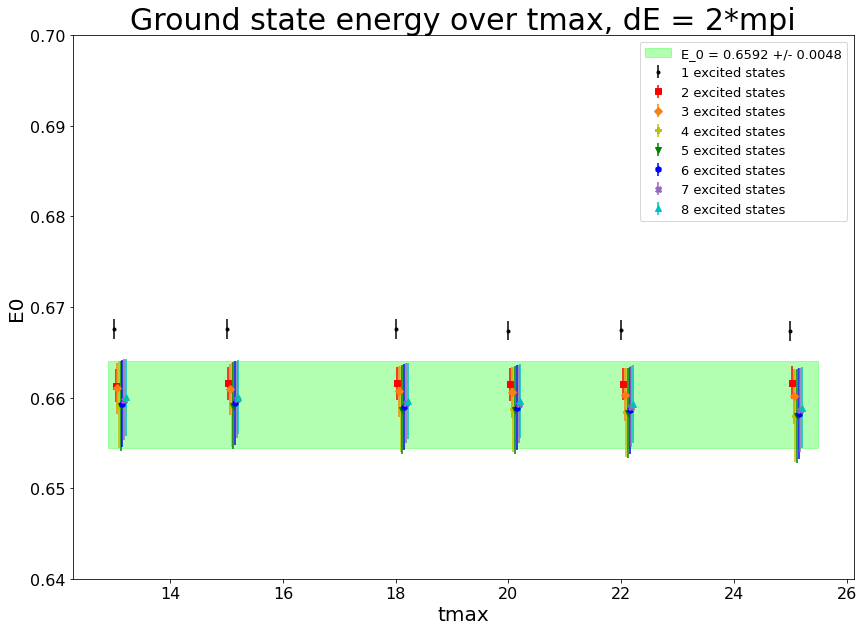

<Figure size 432x288 with 0 Axes>

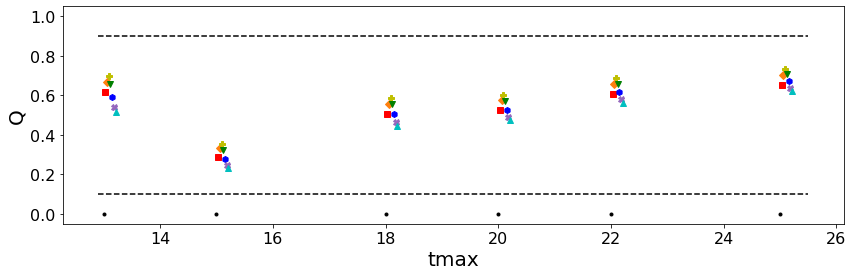

<Figure size 432x288 with 0 Axes>

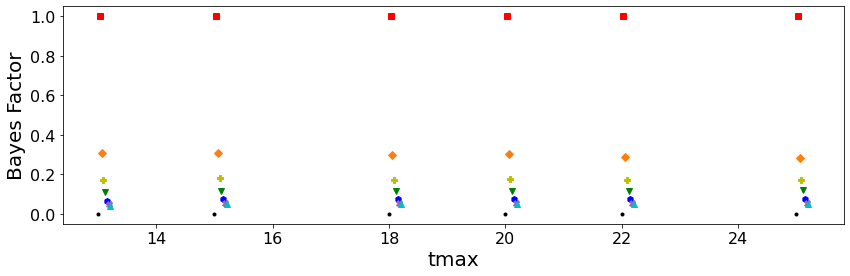

<Figure size 432x288 with 0 Axes>

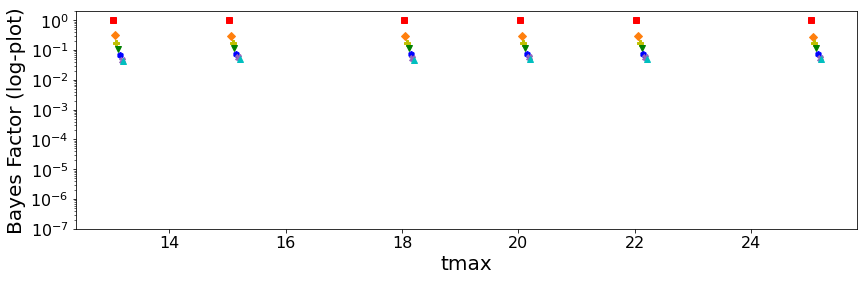

In [59]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a0_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a0_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a0)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a0[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a0[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmax_samp_line, [E0_tmax_bmax_a0[3][0].mean + E0_tmax_bmax_a0[3][0].sdev for i in tmax_samp_line], [E0_tmax_bmax_a0[3][0].mean - E0_tmax_bmax_a0[3][0].sdev  for i in tmax_samp_line], color="lime",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmax_bmax_a0[3][0].mean, E0_tmax_bmax_a0[3][0].sdev))
plt.title("Ground state energy over tmax, dE = 2*mpi", fontsize=30)
plt.xlabel("tmax", fontsize=20)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize=13)
fig.savefig("E0_2pt_dEconst_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a0)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a0[i][k] for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Q", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dEconst_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a0)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a0[i][k] for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Bayes Factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dEconst_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a0)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a0[i][k] for k in range(len(tmax))], '.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Bayes Factor (log-plot)", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-7, 2)
plt.savefig('logBFa0_oldpriormultifit.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])

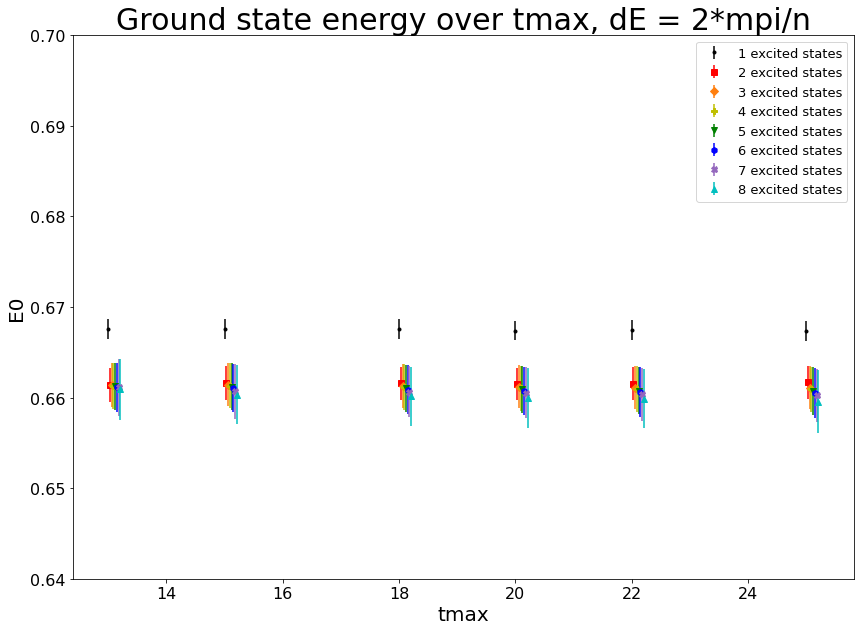

<Figure size 432x288 with 0 Axes>

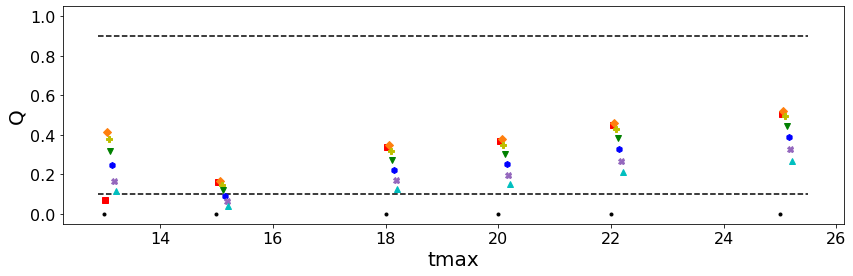

<Figure size 432x288 with 0 Axes>

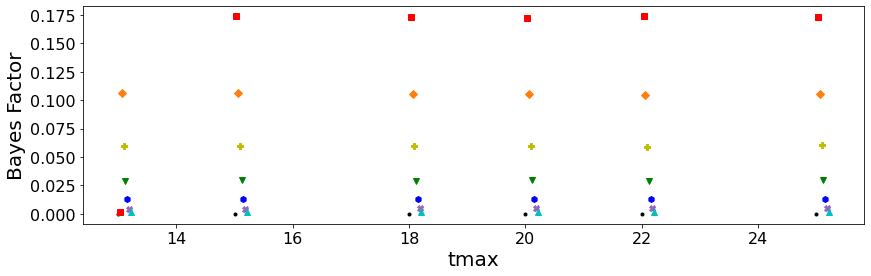

<Figure size 432x288 with 0 Axes>

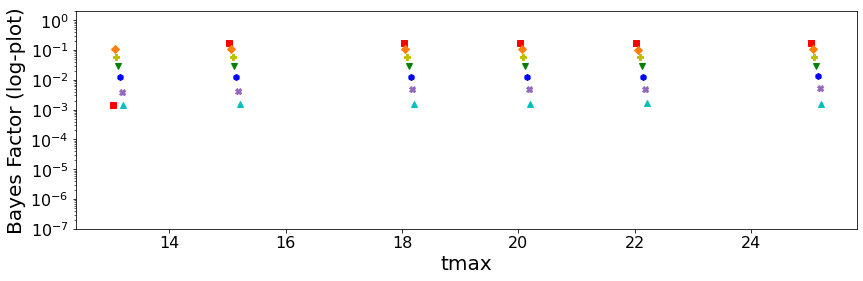

In [60]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a1_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a1_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a1)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a1[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a1[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))

plt.title("Ground state energy over tmax, dE = 2*mpi/n", fontsize=30)
plt.xlabel("tmax", fontsize=20)
plt.ylabel("E0", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize=13)
fig.savefig("E0_2pt_dE1overn_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a1)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a1[i][k] for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Q", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dE1overn_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a1)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a1[i][k] for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Bayes Factor", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dE1overn_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a1)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a1[i][k] for k in range(len(tmax))], '.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize=20)
plt.ylabel("Bayes Factor (log-plot)", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-7, 2)
plt.savefig('logBFa1_oldpriormultifit.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])

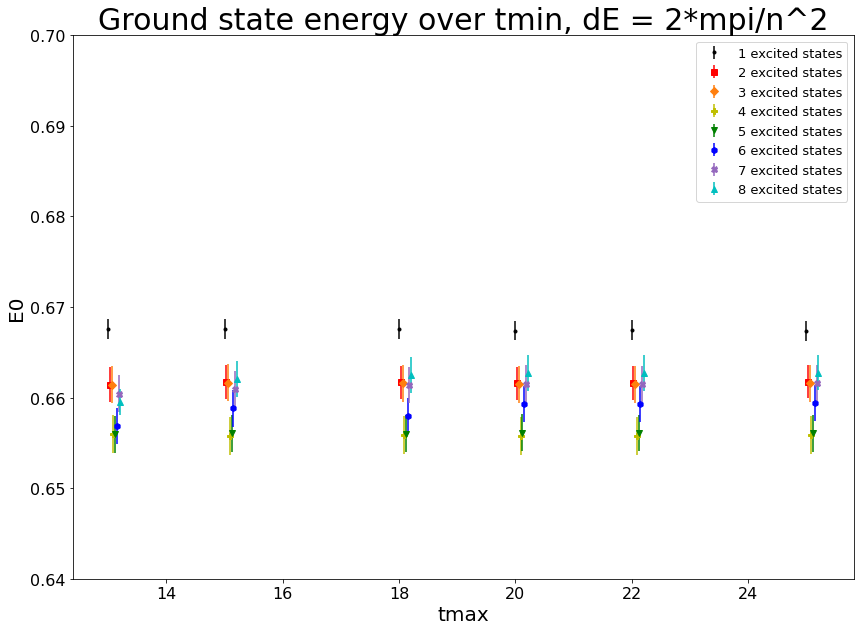

<Figure size 432x288 with 0 Axes>

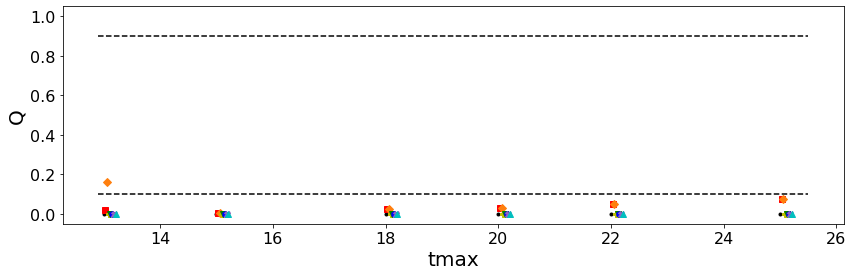

<Figure size 432x288 with 0 Axes>

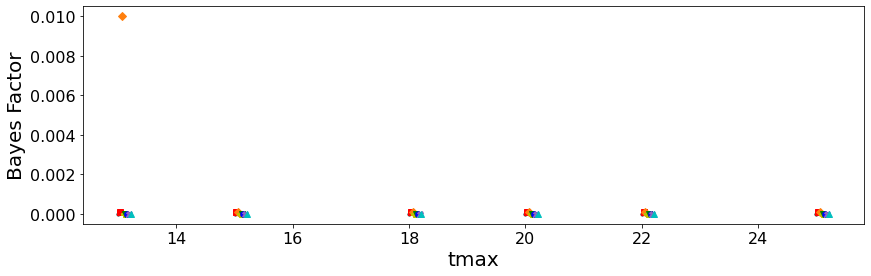

<Figure size 432x288 with 0 Axes>

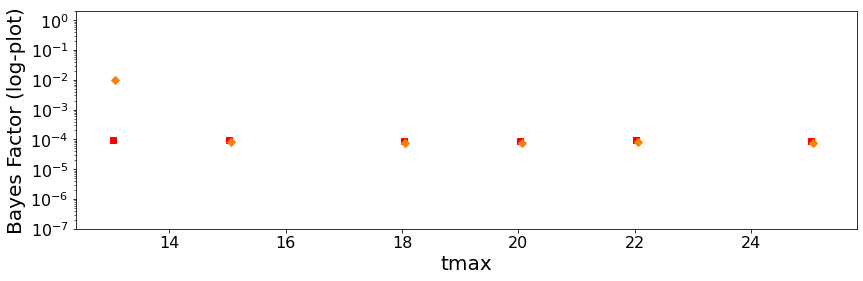

In [61]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a2_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a2_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

fig = plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a2)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a2[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a2[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))

plt.title("Ground state energy over tmin, dE = 2*mpi/n^2", fontsize = 30)
plt.xlabel("tmax", fontsize = 20)
plt.ylabel("E0", fontsize = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.64,0.7)
plt.legend(fontsize = 13)
fig.savefig("E0_2pt_dE1overn2_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a2)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a2[i][k] for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax", fontsize = 20)
plt.ylabel("Q", fontsize = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(-0.05, 1.05)
fig.savefig("Q_2pt_dE1overn2_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a2)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a2[i][k] for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize = 20)
plt.ylabel("Bayes Factor", fontsize = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig.savefig("BF_2pt_dE1overn2_tmax_comparison_oldpriormultifit.png")
plt.show()

plt.clf()
fig = plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a2)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a2[i][k] for k in range(len(tmax))], '.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax", fontsize = 20)
plt.ylabel("Bayes Factor (log-plot)", fontsize = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-7, 2)
plt.savefig('logBFa2_oldpriormultifit.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])